In [ ]:
!pip install duckdb seaborn

In [ ]:
import duckdb
import scipy.stats as stats
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import special
import numpy as np
import plotly.express as px

In [12]:
df_projects = pd.DataFrame()

def process(task_id: str):

    global df_projects

    print(f"== {task_id} ==")

    df_reliability = duckdb.query(f"""
        with dates as (
            select date--, message
            , row_number() OVER (ORDER BY date) as row_num
            from "commits/{task_id}-commits.csv"
            where change_type in ('__label__corrective')
        ) 
        select date_diff('days', d1.date, d2.date) TBF from dates d1
        left join dates d2 on d2.row_num = d1.row_num + 1

    """).to_df()

    # Carregar os dados de TBF (substitua pelo seu DataFrame real)
    TBF_data = df_reliability['TBF'].dropna()
    TBF_data = TBF_data[TBF_data > 0]  # Remover valores zero
    TBF_values = TBF_data.values

    # Visualizar distribuição inicial
    fig = plt.figure(figsize=(12, 5))
    sns.histplot(TBF_values, bins=50, kde=True)
    plt.title(f"The histogram of Time Between Failures (TBF) {task_id}")
    fig.savefig(f"reliability/{task_id}-TBF.png")
    plt.show()

    sns.set(style="whitegrid")
    x = np.arange(1, len(df_reliability['TBF']) + 1)
    fig = plt.figure(figsize=(12, 5))
    plt.plot(x, df_reliability['TBF'], 'bo-', markersize=4, linewidth=1)
    plt.xlabel("Failures")
    plt.ylabel("Time Interval")
    plt.yscale("linear")
    fig.savefig(f"reliability/{task_id}-FTI.png")
    plt.show()

    sns.set(style="whitegrid")
    x = np.arange(1, len(df_reliability['TBF']) + 1)
    y_cumulative = np.cumsum(df_reliability['TBF'])
    fig = plt.figure(figsize=(12, 5))
    plt.plot(x, y_cumulative, 'bo-', markersize=4, linewidth=1)
    plt.xlabel("Failures")
    plt.ylabel("Cumulative Time Interval")
    plt.yscale("linear") 
    fig.savefig(f"reliability/{task_id}-CFTI.png")
    plt.show()

    sns.set(style="whitegrid")
    MTBF = df_reliability['TBF'].mean()
    lambda_failure = 1 / MTBF
    t_values = np.linspace(0, df_reliability['TBF'].max(), 100)
    R_values = np.exp(-lambda_failure * t_values)
    fig = plt.figure(figsize=(12, 5))
    plt.plot(t_values, R_values, 'b-', linewidth=2, label="Confiabilidade R(t)")
    plt.xlabel("Time Since Last Failure (fix commit)")
    plt.ylabel("Probability of No Fix (R(t))")
    plt.title("Repository Reliability Curve")
    plt.legend()
    fig.savefig(f"reliability/{task_id}-Rt.png")
    plt.show()

    MTBF = df_reliability['TBF'].mean()
    lambda_failure = 1 / MTBF
    def reliability(t):
        return np.exp(-lambda_failure * t)
    
    r_linha = {}
    r_linha['project'] = f"{task_id}"

    t_values = [1, 5, 10, 50, 100]
    reliability_values = [reliability(t) for t in t_values]
    for t, R_t in zip(t_values, reliability_values):
        print(f"Confiabilidade R({t}) = {R_t:.4f}")
        r_linha[f"R{t}"] = f"{R_t:.4f}"

    print(r_linha)

    r_linha_df = pd.DataFrame([r_linha])
    #df_projects.loc[len(df_projects)] = r_linha_df
    df_projects = pd.concat([df_projects, r_linha_df], ignore_index=True)

    df_reliability.to_csv(f"reliability/{task_id}_reliability.csv")

    t_days = 1

    df_reliability_file = duckdb.query(f"""
        WITH dates AS (
            SELECT date, filepath, 
                ROW_NUMBER() OVER (PARTITION BY filepath ORDER BY date) AS row_num
            FROM "commits/{task_id}-files.csv" f
            LEFT JOIN "commits/{task_id}-commits.csv" c ON f.commit_id = c.commit_id
            WHERE change_type IN ('__label__corrective')
        ) 
        SELECT d1.filepath, 
            MAX(d1.row_num) AS n_commits, 
            AVG(DATE_DIFF('days', d1.date, d2.date)) AS MTBF,
            1.0 / NULLIF(AVG(DATE_DIFF('days', d1.date, d2.date)), 0) AS lambda_failure,  -- Evita divisão por zero
            EXP(- (1.0 / NULLIF(AVG(DATE_DIFF('days', d1.date, d2.date)), 0)) * {t_days}) AS R_t  -- Confiabilidade para t dias
        FROM dates d1
        LEFT JOIN dates d2 
            ON d2.filepath = d1.filepath 
            AND d2.row_num = d1.row_num + 1
        GROUP BY d1.filepath
        HAVING d1.filepath LIKE '%.java' AND MTBF > 0
        ORDER BY R_t, n_commits    
    """).to_df()

    with pd.option_context('display.max_rows', 20, 'display.max_columns', None,'display.max_colwidth', -1):
        display(df_reliability_file)    

    df_reliability_file.to_csv(f"reliability/{task_id}_reliability_file.csv")

    df_all_files = pd.read_csv(f"maps/{task_id}_all_files2.csv")

    df_all_files_reliability = duckdb.query(f"""
        select *, 1-R_t as U_t from df_all_files a
        left join df_reliability_file r on r.filepath = a.filename
    """).to_df()

    fig = px.treemap(
        names = df_all_files_reliability['filename'],
        parents = df_all_files_reliability['path'],
        color=df_all_files_reliability['R_t'],
        hover_data=[df_all_files_reliability['filename'], df_all_files_reliability['R_t']],
        color_continuous_scale='RdBu'
    )

    fig.update_layout(
        uniformtext=dict(minsize=10, mode='hide'),
        margin = dict(t=50, l=25, r=25, b=25),
        autosize=False,
        width=1000,
        height=1000
    )

    fig.write_html(f"reliability/{task_id}_reliability_map.html")    

#process('ant')
#df_projects.to_csv(f"reliability_projects.csv")


== jOOQ ==


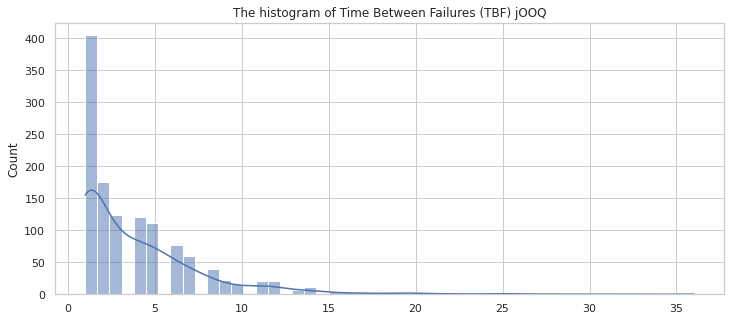

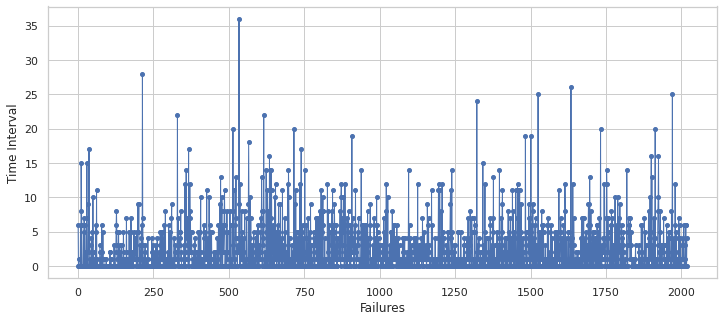

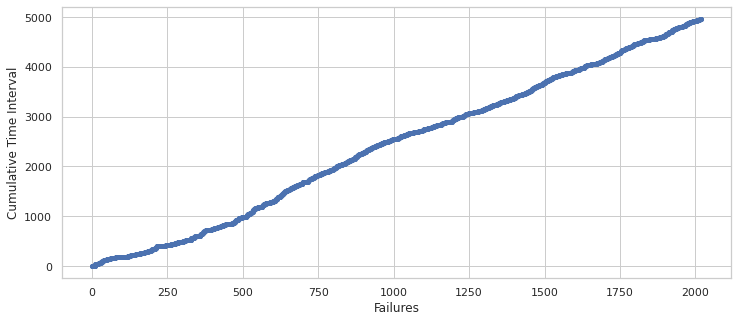

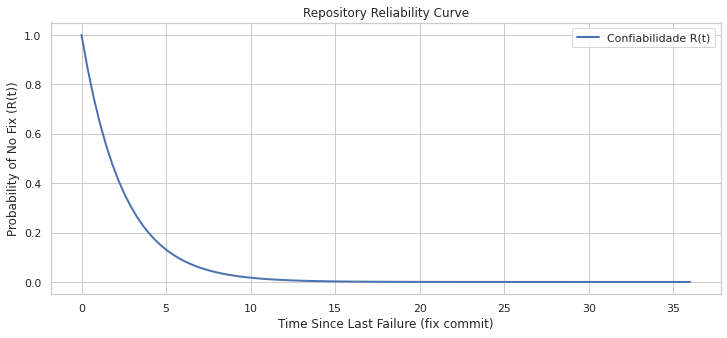

Confiabilidade R(1) = 0.6657
Confiabilidade R(5) = 0.1308
Confiabilidade R(10) = 0.0171
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'jOOQ', 'R1': '0.6657', 'R5': '0.1308', 'R10': '0.0171', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,jOOQ-console/src/main/java/org/jooq/debug/LocalDebugger.java,2,1.0,1.000000,0.367879
1,jOOQ-meta/src/main/java/org/jooq/meta/TableQualifier.java,2,1.0,1.000000,0.367879
2,jOOQ-meta/src/main/java/org/jooq/meta/DefaultTableQualifier.java,2,1.0,1.000000,0.367879
3,jOOQ-test/src/org/jooq/test/_/testcases/JsonLoaderTests.java,2,1.0,1.000000,0.367879
4,jOOQ-test/src/org/jooq/test/_/testcases/CsvLoaderTests.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
2022,jOOQ/src/main/java/org/jooq/exception/DataChangedException.java,2,2918.0,0.000343,0.999657
2023,jOOQ/src/main/java/org/jooq/impl/SettingsEnabledConnection.java,2,3191.0,0.000313,0.999687
2024,jOOQ/src/main/java/org/jooq/Binding.java,2,3396.0,0.000294,0.999706
2025,jOOQ/src/main/java/org/jooq/util/mysql/MySQLDSL.java,2,3444.0,0.000290,0.999710


== dropwizard ==


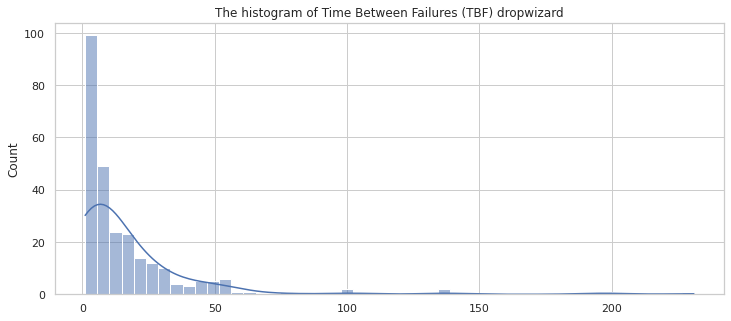

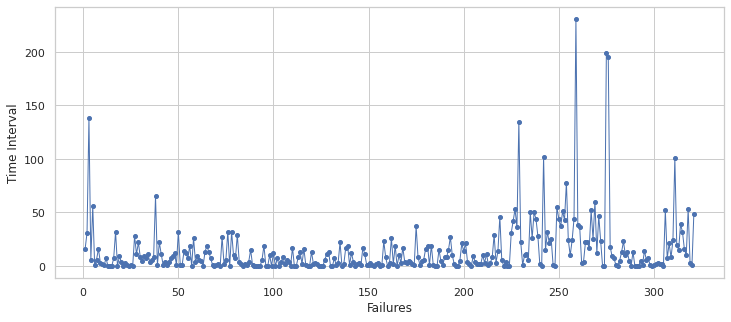

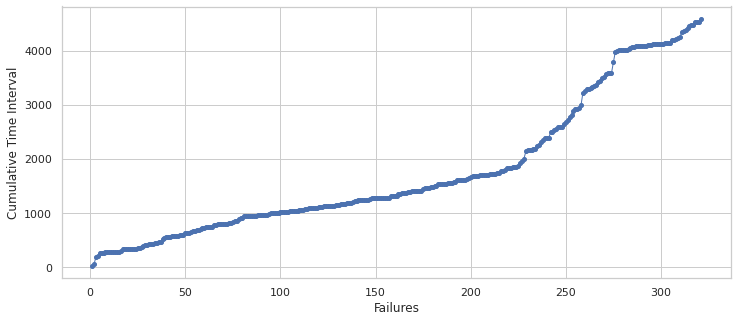

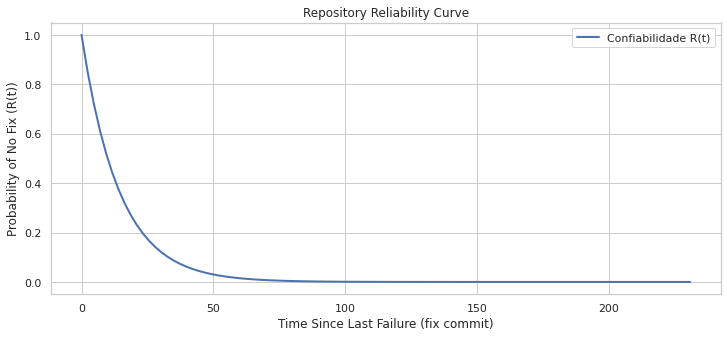

Confiabilidade R(1) = 0.9325
Confiabilidade R(5) = 0.7050
Confiabilidade R(10) = 0.4970
Confiabilidade R(50) = 0.0303
Confiabilidade R(100) = 0.0009
{'project': 'dropwizard', 'R1': '0.9325', 'R5': '0.7050', 'R10': '0.4970', 'R50': '0.0303', 'R100': '0.0009'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,dropwizard-json-logging/src/test/java/io/dropwizard/logging/json/LayoutIntegrationTests.java,2,2.0,0.500000,0.606531
1,dropwizard-testing/src/main/java/io/dropwizard/testing/junit/DAOTestRule.java,2,2.0,0.500000,0.606531
2,dropwizard-jetty/src/test/java/io/dropwizard/jetty/HttpsConnectorFactoryTest.java,2,5.0,0.200000,0.818731
3,dropwizard-jetty/src/test/java/io/dropwizard/jetty/GzipFilterFactoryTest.java,2,9.0,0.111111,0.894839
4,dropwizard-testing/src/test/java/io/dropwizard/testing/app/GzipDefaultVaryBehaviourTest.java,2,9.0,0.111111,0.894839
...,...,...,...,...,...
119,dropwizard-hibernate/src/test/java/io/dropwizard/hibernate/UnitOfWorkApplicationListenerTest.java,2,2423.0,0.000413,0.999587
120,dropwizard-servlets/src/test/java/io/dropwizard/servlets/tasks/LogConfigurationTaskTest.java,2,2555.0,0.000391,0.999609
121,dropwizard-metrics/src/test/java/io/dropwizard/metrics/BaseReporterFactoryTest.java,2,2713.0,0.000369,0.999631
122,dropwizard-hibernate/src/main/java/io/dropwizard/hibernate/UnitOfWorkApplicationListener.java,2,2893.0,0.000346,0.999654


== findbugs ==


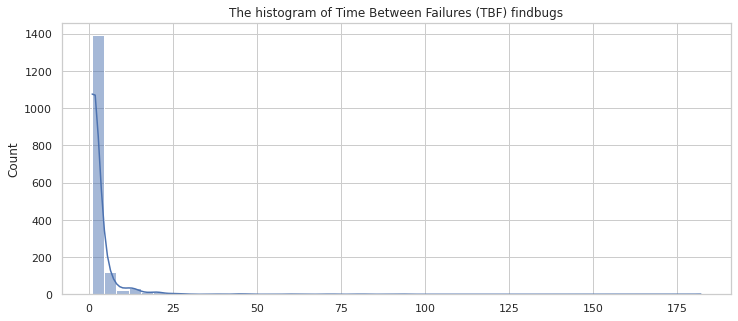

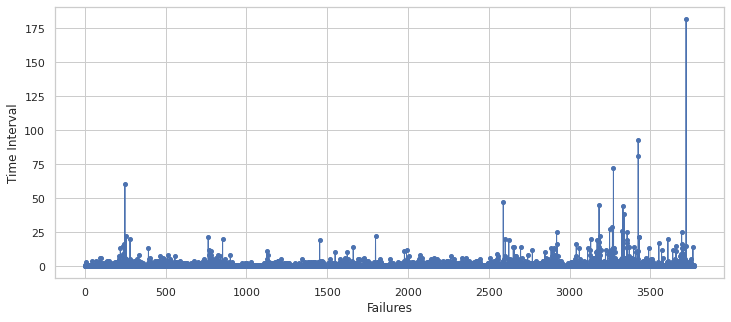

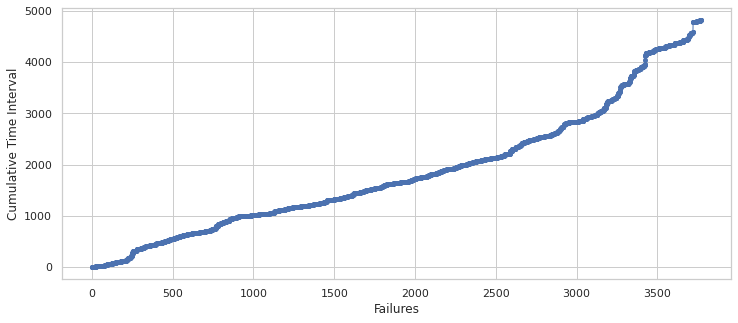

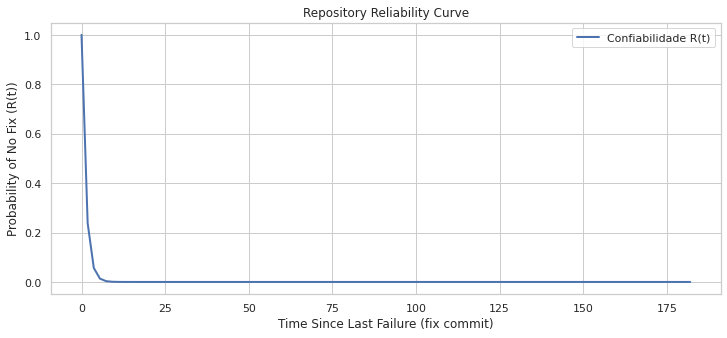

Confiabilidade R(1) = 0.4577
Confiabilidade R(5) = 0.0201
Confiabilidade R(10) = 0.0004
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'findbugs', 'R1': '0.4577', 'R5': '0.0201', 'R10': '0.0004', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,sandbox/appEngineCloudClient/src/junit/edu/umd/cs/findbugs/cloud/appEngine/AppEngineCloudEvalsTests.java,3,0.5,2.000000,0.135335
1,sandbox/appEngineCloudClient/src/junit/edu/umd/cs/findbugs/cloud/appEngine/AbstractAppEngineCloudTest.java,3,0.5,2.000000,0.135335
2,bluej/src/edu/umd/cs/findbugs/bluej/CheckBoxMenuBuilder.java,2,1.0,1.000000,0.367879
3,findbugs/src/java/edu/umd/cs/findbugs/AnalysisOptions.java,2,1.0,1.000000,0.367879
4,findbugs/src/junit/edu/umd/cs/findbugs/ba/ch/SubtypesTest.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
1667,findbugs/src/java/edu/umd/cs/findbugs/visitclass/BetterVisitor.java,2,2413.0,0.000414,0.999586
1668,findbugs/src/java/edu/umd/cs/findbugs/ba/ForwardDataflowAnalysis.java,2,2591.0,0.000386,0.999614
1669,findbugs/src/java/edu/umd/cs/findbugs/SelfCalls.java,2,2637.0,0.000379,0.999621
1670,findbugs/src/java/edu/umd/cs/findbugs/ba/CFGBuilder.java,2,2637.0,0.000379,0.999621


== tomee ==


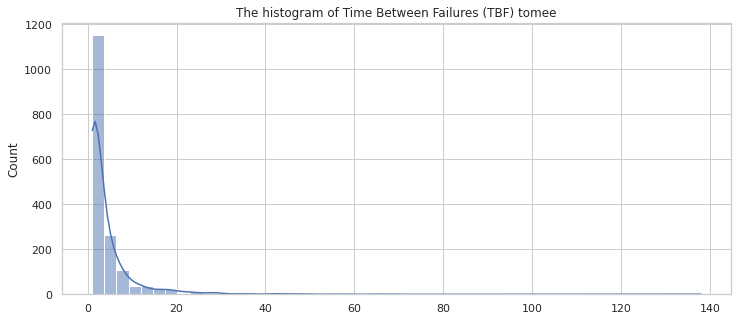

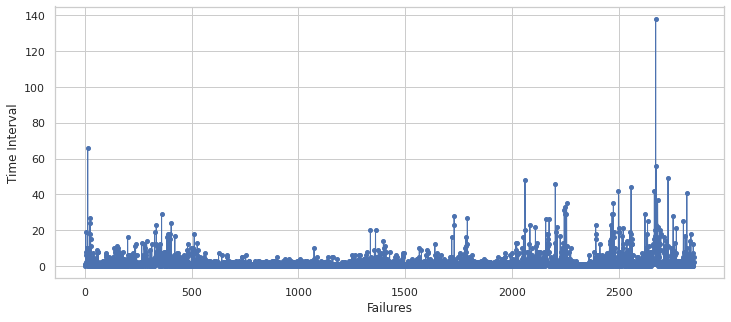

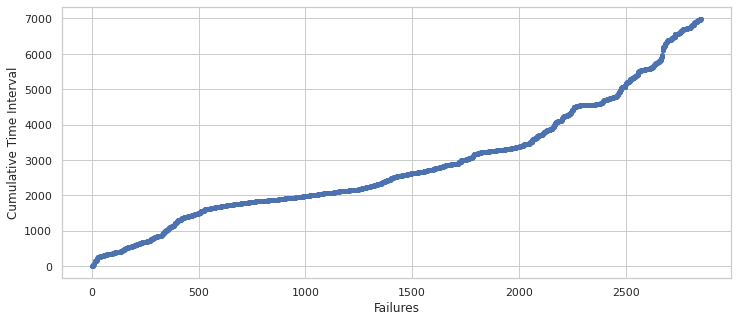

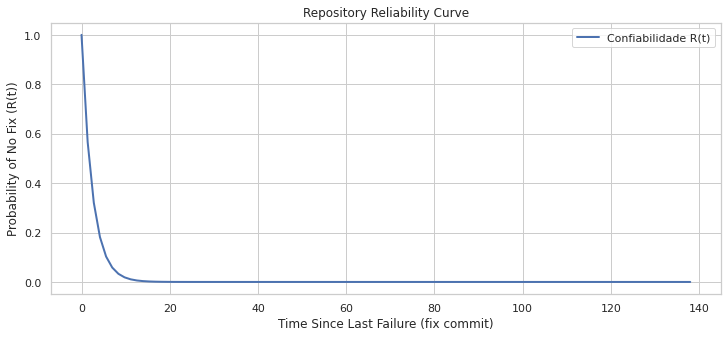

Confiabilidade R(1) = 0.6649
Confiabilidade R(5) = 0.1300
Confiabilidade R(10) = 0.0169
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'tomee', 'R1': '0.6649', 'R5': '0.1300', 'R10': '0.0169', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,container/openejb-loader/src/main/java/org/apache/openejb/loader/ProvisioningUtil.java,4,0.333333,3.000000,0.049787
1,server/openejb-multicast/src/test/java/org/apache/openejb/server/discovery/MulticastPulseAgentTest.java,3,0.500000,2.000000,0.135335
2,container/openejb-core/src/test/java/org/apache/openejb/core/mdb/PoolEndpointHandlerTest.java,3,0.500000,2.000000,0.135335
3,container/openejb-jee/src/test/java/org/apache/openejb/jee/jpa/Cmp2ConversionTest.java,3,0.500000,2.000000,0.135335
4,container/openejb-jee/src/test/java/org/apache/openejb/jee/jpa/OpenEjb2CmpConversion.java,3,0.500000,2.000000,0.135335
...,...,...,...,...,...
1692,itests/openejb-itests-client/src/main/java/org/apache/openejb/test/entity/bmp/BmpAllowedOperationsTests.java,2,4432.000000,0.000226,0.999774
1693,server/openejb-http/src/test/java/org/apache/openejb/server/httpd/HttpEjbServerTest.java,2,4546.000000,0.000220,0.999780
1694,server/openejb-ejbd/src/test/java/org/apache/openejb/RemoteiTest.java,2,4546.000000,0.000220,0.999780
1695,container/openejb-jee/src/main/java/org/apache/openejb/jee/ManagedBean.java,2,5394.000000,0.000185,0.999815


== logging-log4j2 ==


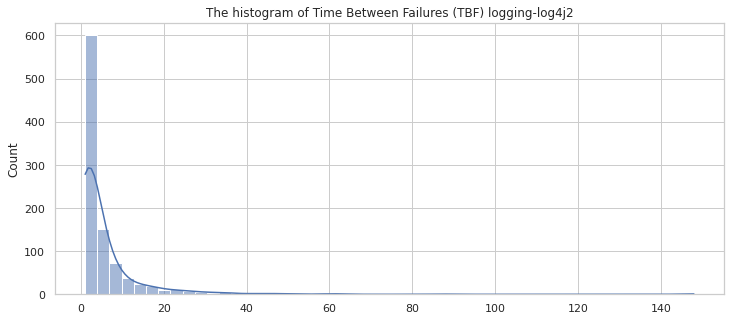

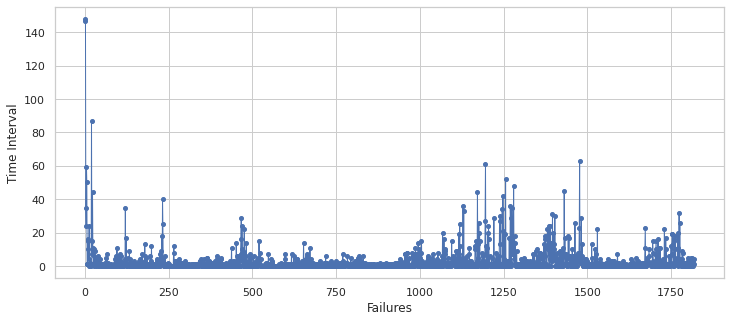

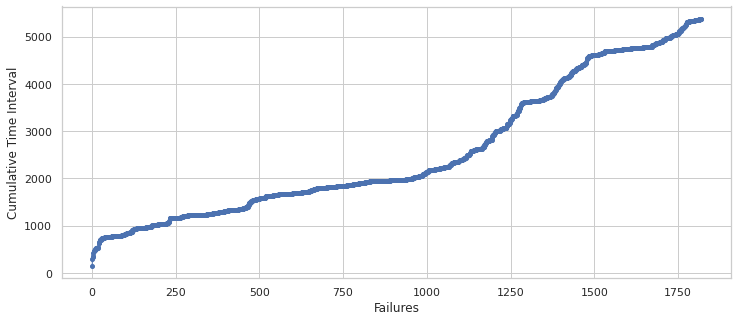

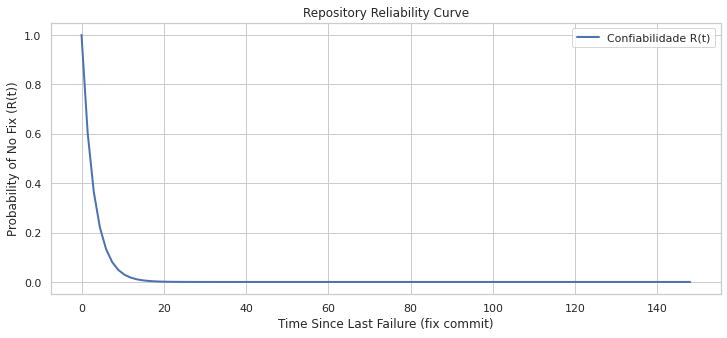

Confiabilidade R(1) = 0.7131
Confiabilidade R(5) = 0.1844
Confiabilidade R(10) = 0.0340
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'logging-log4j2', 'R1': '0.7131', 'R5': '0.1844', 'R10': '0.0340', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,log4j-core/src/test/java/org/apache/logging/log4j/core/appender/CsvJsonParameterLayoutFileAppenderTest.java,6,0.200000,5.000000,0.006738
1,log4j-mongodb/src/test/java/org/apache/logging/log4j/mongodb/MongoDbMapMessageTestJava8.java,3,0.500000,2.000000,0.135335
2,log4j-core/src/main/java/org/apache/logging/log4j/core/appender/db/jdbc/JdbcAppender.java,3,0.500000,2.000000,0.135335
3,log4j-core/src/test/java/org/apache/logging/log4j/core/appender/rolling/RollingAppenderDeleteAccumulatedCount2Test.java,4,0.666667,1.500000,0.223130
4,log4j-core/src/test/java/org/apache/logging/log4j/core/appender/rolling/RollingAppenderDeleteAccumulatedCount1Test.java,4,0.666667,1.500000,0.223130
...,...,...,...,...,...
782,log4j-api/src/test/java/org/apache/logging/log4j/MarkerTest.java,2,2710.000000,0.000369,0.999631
783,log4j-core/src/test/java/org/apache/logging/log4j/core/net/SocketMessageLossTest.java,2,2714.000000,0.000368,0.999632
784,log4j-core/src/main/java/org/apache/logging/log4j/core/appender/TlsSyslogFrame.java,2,3409.000000,0.000293,0.999707
785,log4j-api/src/main/java/org/apache/logging/log4j/message/MapMessage.java,2,3630.000000,0.000275,0.999725


== mybatis-3 ==


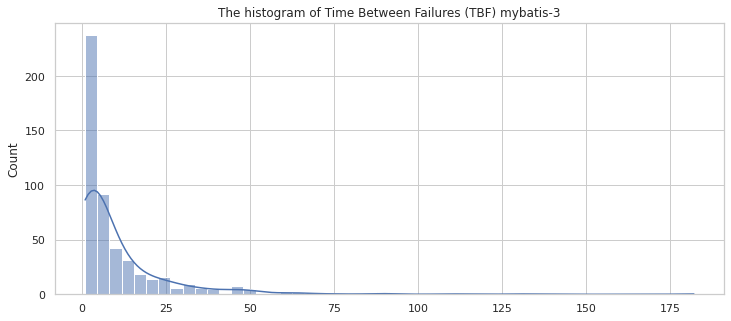

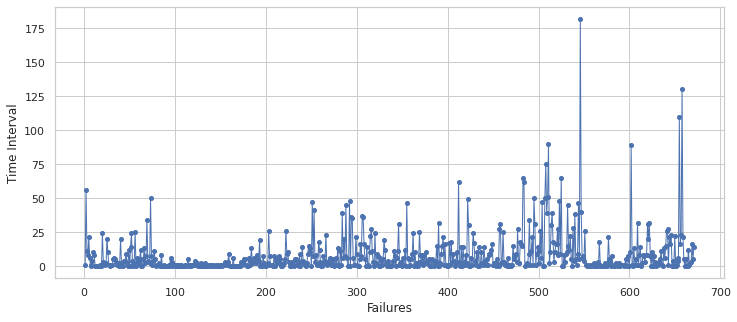

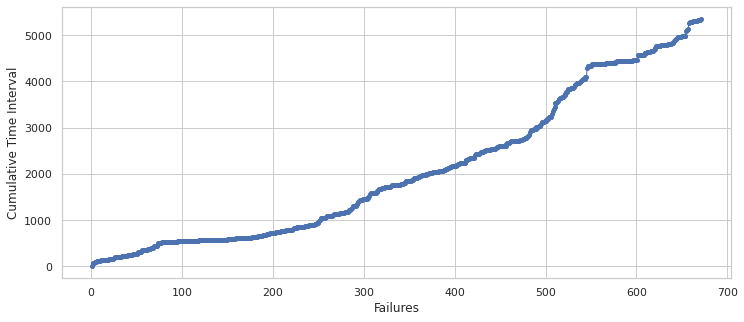

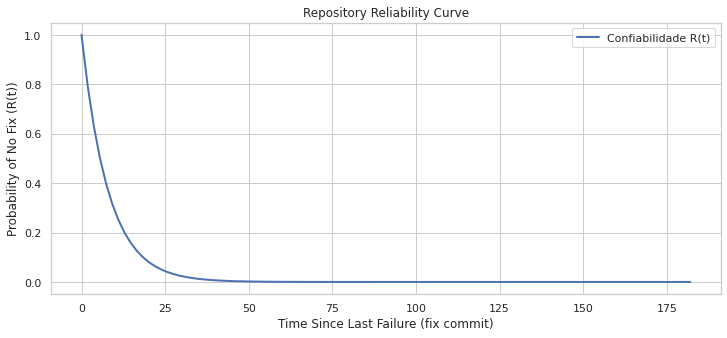

Confiabilidade R(1) = 0.8822
Confiabilidade R(5) = 0.5344
Confiabilidade R(10) = 0.2856
Confiabilidade R(50) = 0.0019
Confiabilidade R(100) = 0.0000
{'project': 'mybatis-3', 'R1': '0.8822', 'R5': '0.5344', 'R10': '0.2856', 'R50': '0.0019', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/test/java/org/apache/ibatis/session/SqlSessionBuilderTest.java,2,1.0,1.000000,0.367879
1,src/main/java/org/apache/ibatis/builder/ResultMappingConstructorResolver.java,2,1.0,1.000000,0.367879
2,src/test/java/org/apache/ibatis/submitted/null_with_no_jdbctype/NullWithNoJdbcTypeTest.java,3,1.5,0.666667,0.513417
3,src/test/java/org/apache/ibatis/submitted/array_binding/User.java,2,7.0,0.142857,0.866878
4,src/test/java/org/apache/ibatis/submitted/array_binding/Mapper.java,2,7.0,0.142857,0.866878
...,...,...,...,...,...
653,src/main/java/org/apache/ibatis/cache/CacheException.java,2,3882.0,0.000258,0.999742
654,src/main/java/org/apache/ibatis/logging/LogException.java,2,3882.0,0.000258,0.999742
655,src/main/java/org/apache/ibatis/annotations/CacheNamespaceRef.java,2,3882.0,0.000258,0.999742
656,src/test/java/org/apache/ibatis/submitted/flush_statement_npe/Person.java,2,3890.0,0.000257,0.999743


== takes ==


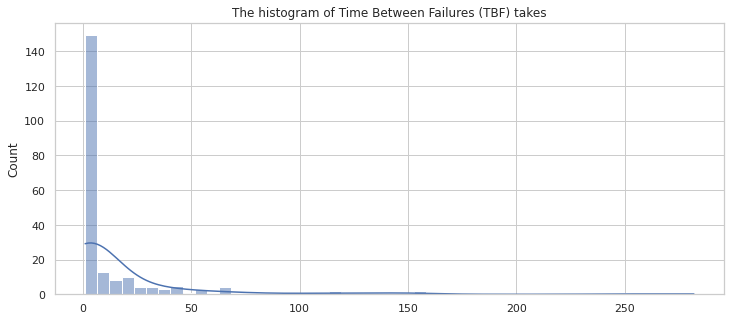

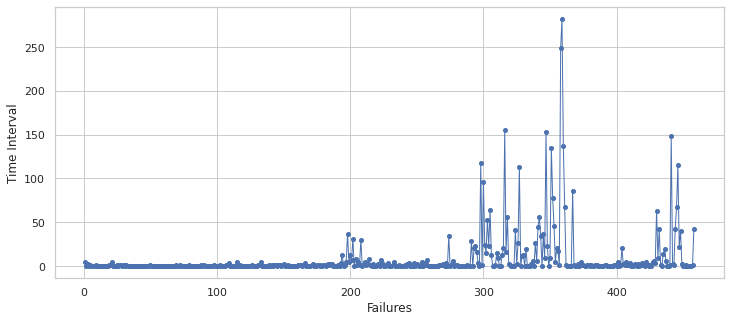

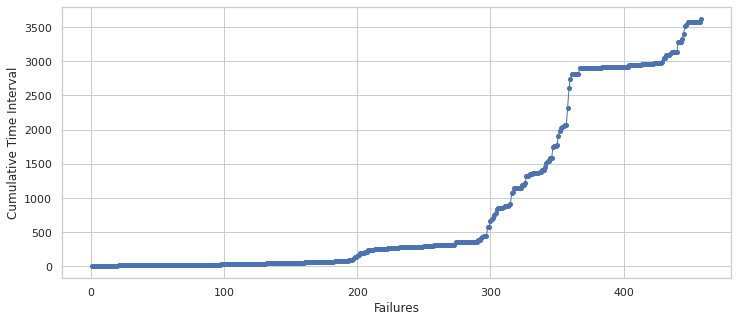

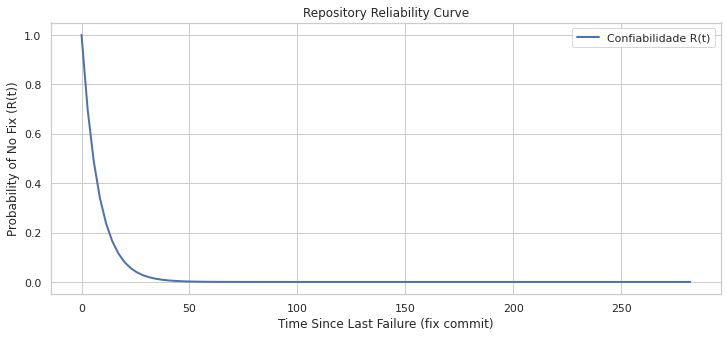

Confiabilidade R(1) = 0.8812
Confiabilidade R(5) = 0.5312
Confiabilidade R(10) = 0.2822
Confiabilidade R(50) = 0.0018
Confiabilidade R(100) = 0.0000
{'project': 'takes', 'R1': '0.8812', 'R5': '0.5312', 'R10': '0.2822', 'R50': '0.0018', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/main/java/org/takes/misc/Utf8PrintStream.java,5,0.250000,4.000000,0.018316
1,src/main/java/org/takes/misc/Utf8OutputStreamWriter.java,3,0.500000,2.000000,0.135335
2,src/main/java/org/takes/misc/Utf8InputStreamReader.java,3,0.500000,2.000000,0.135335
3,src/main/java/org/takes/facets/slf4j/Slf4j.java,4,0.666667,1.500000,0.223130
4,src/main/java/org/takes/facets/slf4j/package-info.java,4,0.666667,1.500000,0.223130
...,...,...,...,...,...
201,src/main/java/org/takes/package-info.java,2,1724.000000,0.000580,0.999420
202,src/test/java/org/takes/rq/RqWithHeadersTest.java,2,1876.000000,0.000533,0.999467
203,src/test/java/org/takes/rs/RsWithHeaderTest.java,2,1903.000000,0.000525,0.999475
204,src/test/java/org/takes/rs/RsPrettyJsonTest.java,2,2158.000000,0.000463,0.999537


== freeplane ==


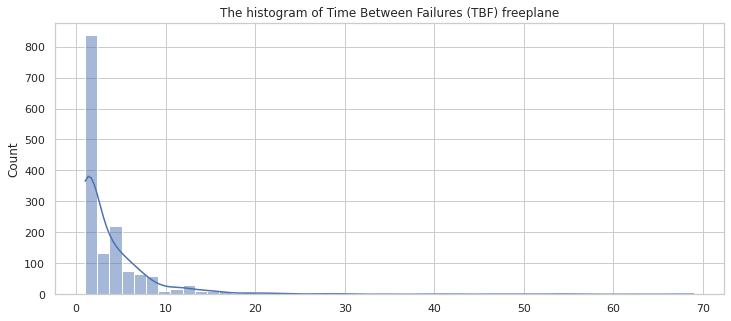

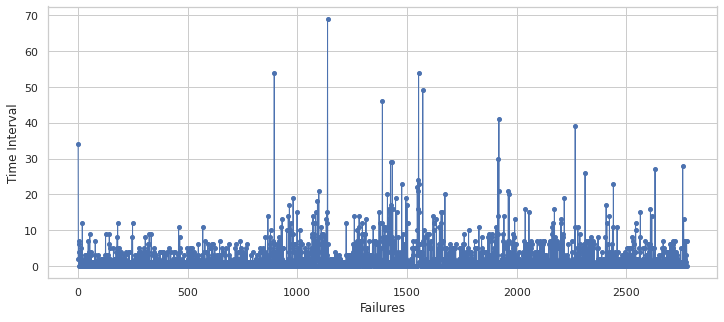

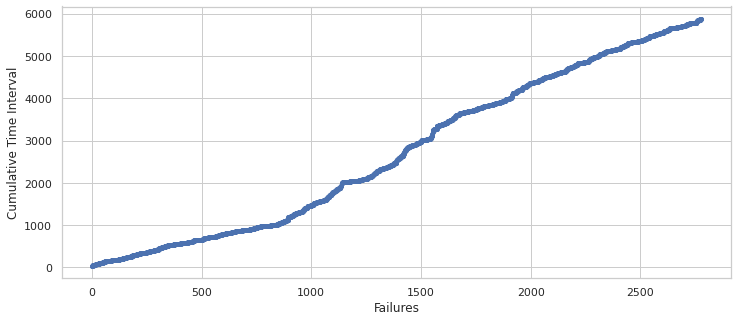

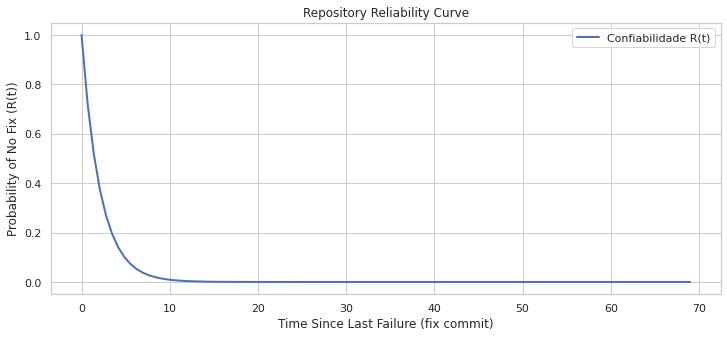

Confiabilidade R(1) = 0.6236
Confiabilidade R(5) = 0.0943
Confiabilidade R(10) = 0.0089
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'freeplane', 'R1': '0.6236', 'R5': '0.0943', 'R10': '0.0089', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,freeplane/src/org/freeplane/features/controller/print/PrintController.java,3,0.500000,2.000000,0.135335
1,freeplane/src/main/java/org/freeplane/features/icon/mindmapmode/TagCategories.java,3,0.500000,2.000000,0.135335
2,freeplane/src/main/java/org/freeplane/view/swing/map/MiniMapView.java,8,0.571429,1.750000,0.173774
3,freeplane_plugin_formula/src/main/java/org/freeplane/plugin/formula/EvaluateAllAction.java,2,1.000000,1.000000,0.367879
4,freeplane/src/main/java/org/freeplane/features/icon/mindmapmode/TagPanelManager.java,2,1.000000,1.000000,0.367879
...,...,...,...,...,...
1004,freeplane/src/main/java/org/freeplane/features/map/mindmapmode/SummaryNodeMapUpdater.java,2,2428.000000,0.000412,0.999588
1005,freeplane/src/main/java/org/freeplane/core/ui/menubuilders/menu/JToolbarComponentBuilder.java,2,2624.000000,0.000381,0.999619
1006,freeplane/src/main/java/org/freeplane/features/filter/condition/CompareConditionAdapter.java,2,2772.000000,0.000361,0.999639
1007,freeplane/src/main/java/org/freeplane/features/filter/condition/ASelectableCondition.java,2,2779.000000,0.000360,0.999640


== shardingsphere ==


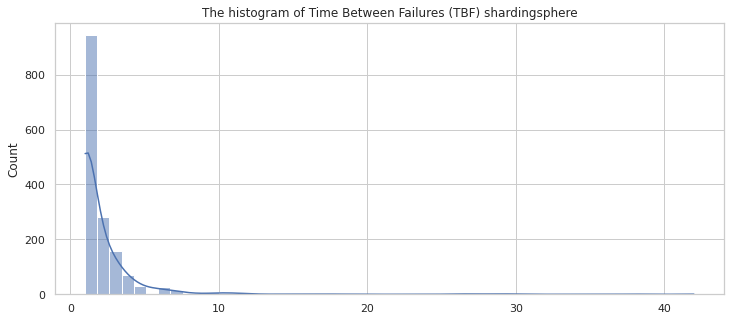

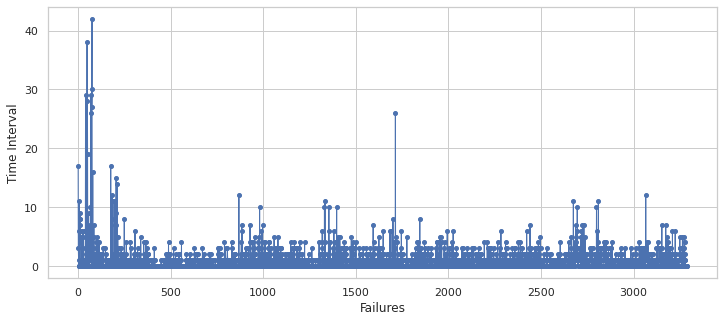

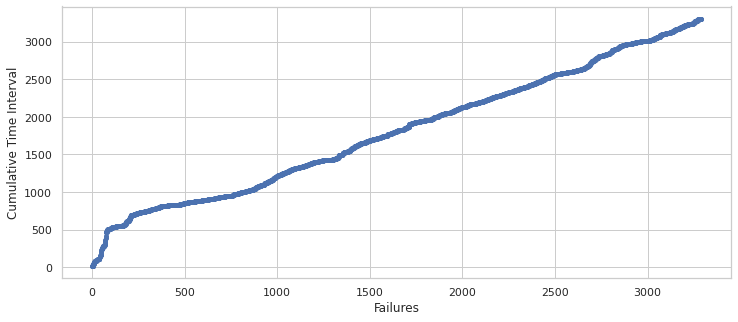

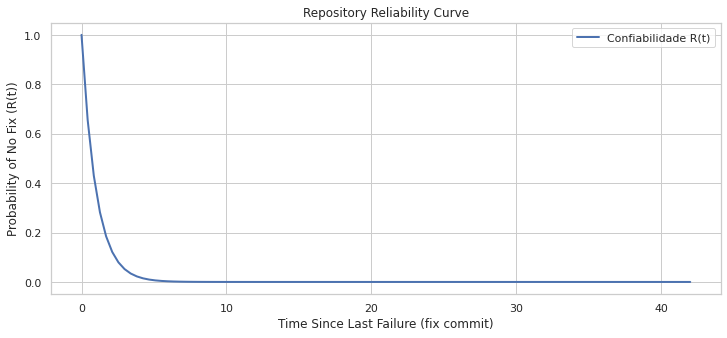

Confiabilidade R(1) = 0.3697
Confiabilidade R(5) = 0.0069
Confiabilidade R(10) = 0.0000
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'shardingsphere', 'R1': '0.3697', 'R5': '0.0069', 'R10': '0.0000', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,sharding-core/src/main/java/io/shardingsphere/core/parsing/antlr/filler/engnie/TableAndConditionSegmentFiller.java,4,0.333333,3.00000,0.049787
1,sharding-core/src/main/java/io/shardingsphere/core/parsing/antlr/filler/engnie/TableSegmentFiller.java,4,0.333333,3.00000,0.049787
2,sharding-jdbc-core/src/test/java/com/dangdang/ddframe/rdb/integrate/type/ShardingDatabaseOnlyTest.java,3,0.500000,2.00000,0.135335
3,sharding-jdbc-core/src/test/java/com/dangdang/ddframe/rdb/integrate/type/ShardingDatabaseAndTableDynamicTest.java,3,0.500000,2.00000,0.135335
4,sharding-jdbc-transaction-parent/sharding-jdbc-transaction/src/test/java/com/dangdang/ddframe/rdb/transaction/soft/integrate/SoftTransactionTest.java,3,0.500000,2.00000,0.135335
...,...,...,...,...,...
1794,features/sharding/core/src/test/java/org/apache/shardingsphere/sharding/merge/dql/orderby/OrderByValueTest.java,2,746.000000,0.00134,0.998660
1795,features/sharding/core/src/test/java/org/apache/shardingsphere/sharding/merge/dql/orderby/OrderByStreamMergedResultTest.java,2,746.000000,0.00134,0.998660
1796,features/sharding/core/src/test/java/org/apache/shardingsphere/sharding/merge/dql/groupby/GroupByStreamMergedResultTest.java,2,746.000000,0.00134,0.998660
1797,features/sharding/core/src/test/java/org/apache/shardingsphere/sharding/merge/dql/ShardingDQLResultMergerTest.java,2,746.000000,0.00134,0.998660


== zeppelin ==


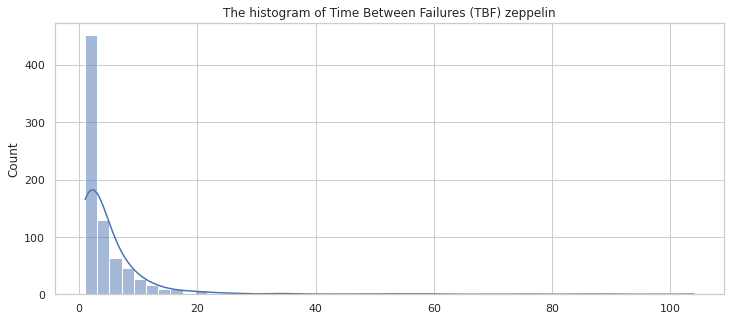

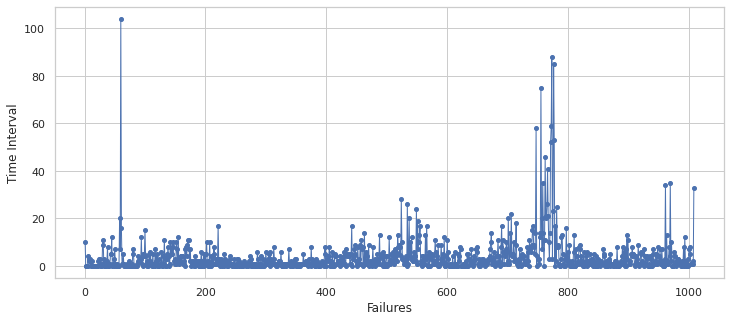

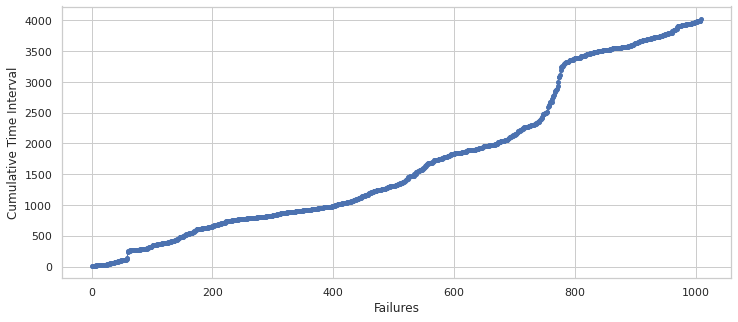

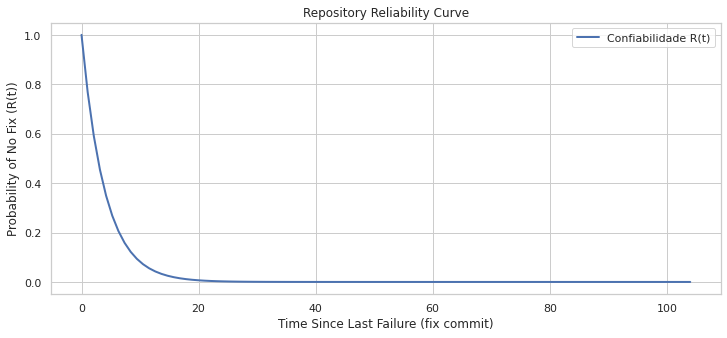

Confiabilidade R(1) = 0.7784
Confiabilidade R(5) = 0.2857
Confiabilidade R(10) = 0.0816
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'zeppelin', 'R1': '0.7784', 'R5': '0.2857', 'R10': '0.0816', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,jdbc/src/main/java/org/apache/zeppelin/jdbc/hive/ProgressBar.java,2,1.0,1.000000,0.367879
1,zeppelin-server/src/main/java/com/nflabs/zeppelin/server/ZQLJob.java,3,1.0,1.000000,0.367879
2,zeppelin-server/src/main/java/com/nflabs/zeppelin/server/ZQLSession.java,3,2.0,0.500000,0.606531
3,zeppelin-interpreter/src/main/java/com/nflabs/zeppelin/interpreter/InterpreterUtils.java,2,3.0,0.333333,0.716531
4,zeppelin-zengine/src/test/java/com/nflabs/zeppelin/zengine/stmt/ZQLTest.java,5,5.0,0.200000,0.818731
...,...,...,...,...,...
280,jdbc/src/main/java/org/apache/zeppelin/jdbc/security/JDBCSecurityImpl.java,3,1247.5,0.000802,0.999199
281,zeppelin-interpreter/src/main/java/org/apache/zeppelin/interpreter/KerberosInterpreter.java,2,1281.0,0.000781,0.999220
282,file/src/test/java/org/apache/zeppelin/file/HDFSFileInterpreterTest.java,2,1602.0,0.000624,0.999376
283,zeppelin-zengine/src/test/java/org/apache/zeppelin/interpreter/mock/MockInterpreter1.java,2,1615.0,0.000619,0.999381


== guava ==


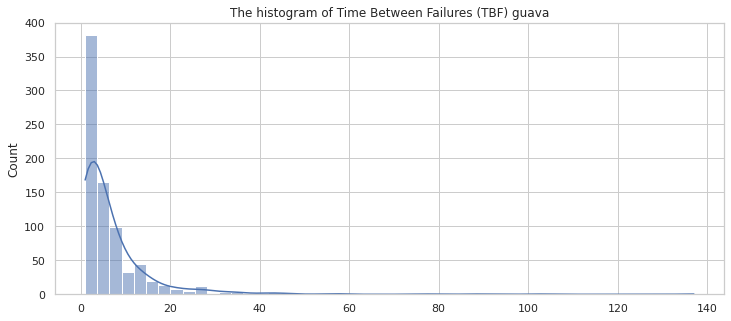

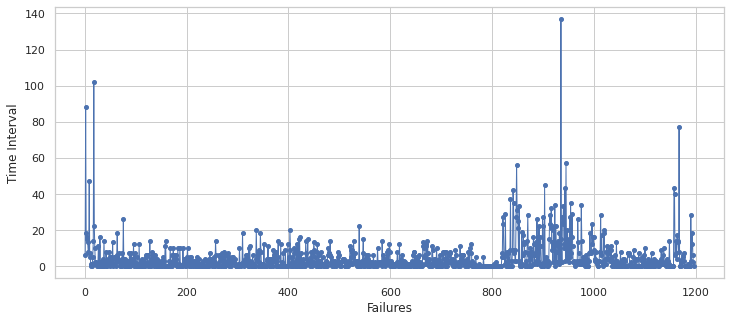

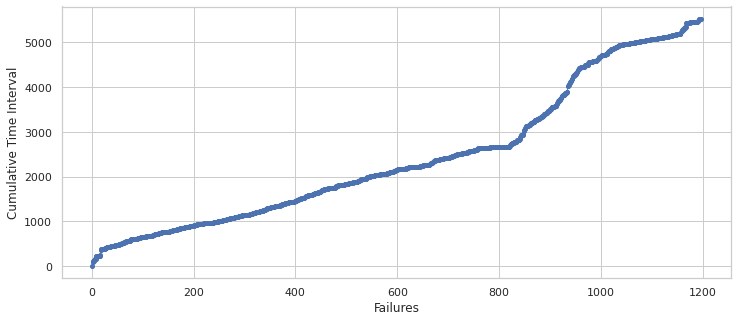

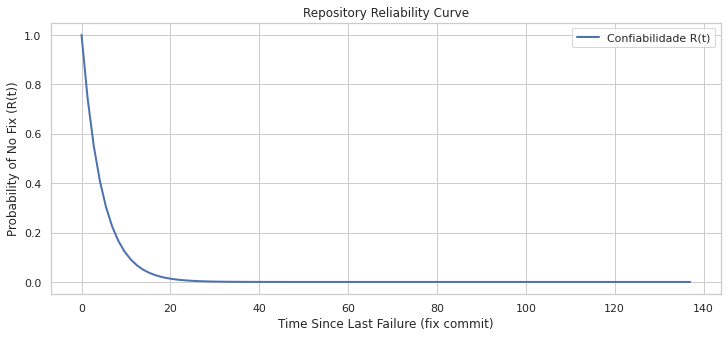

Confiabilidade R(1) = 0.8054
Confiabilidade R(5) = 0.3389
Confiabilidade R(10) = 0.1148
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'guava', 'R1': '0.8054', 'R5': '0.3389', 'R10': '0.1148', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,android/guava/src/com/google/common/collect/AbstractMapBasedMultiset.java,3,0.5,2.000000,0.135335
1,guava-tests/test/com/google/common/collect/ForwardingDequeTest.java,2,1.0,1.000000,0.367879
2,guava-tests/test/com/google/common/io/CleanPathTest.java,2,1.0,1.000000,0.367879
3,guava-tests/test/com/google/common/util/concurrent/PackageSanityTests.java,2,2.0,0.500000,0.606531
4,guava-tests/test/com/google/common/util/concurrent/FuturesGetUncheckedTest.java,2,2.0,0.500000,0.606531
...,...,...,...,...,...
1604,guava-tests/test/com/google/common/primitives/ShortsTest.java,2,4491.0,0.000223,0.999777
1605,guava/src/com/google/common/collect/Queues.java,2,4519.0,0.000221,0.999779
1606,guava-testlib/test/com/google/common/testing/GcFinalizationTest.java,2,4637.0,0.000216,0.999784
1607,guava/src/com/google/common/collect/EnumMultiset.java,2,4667.0,0.000214,0.999786


== hbase ==


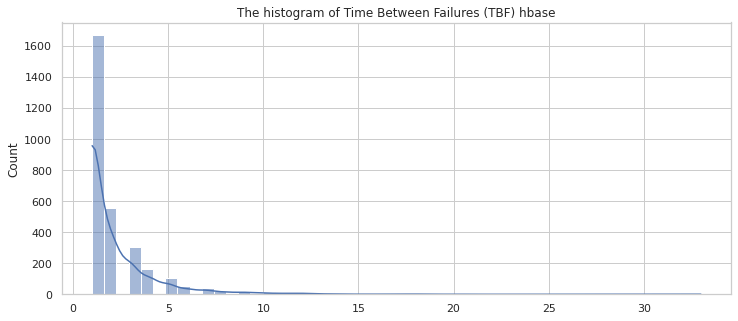

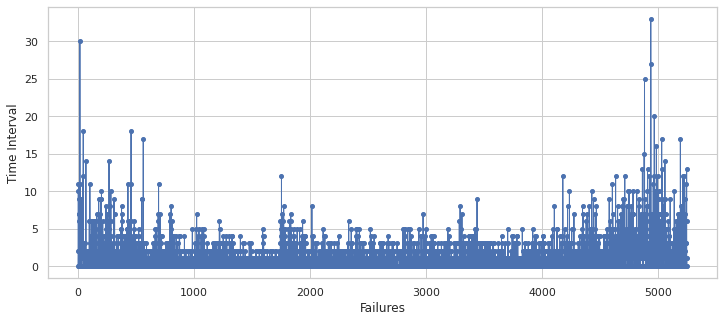

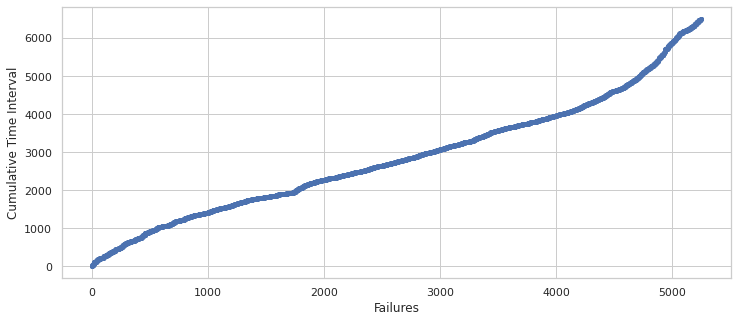

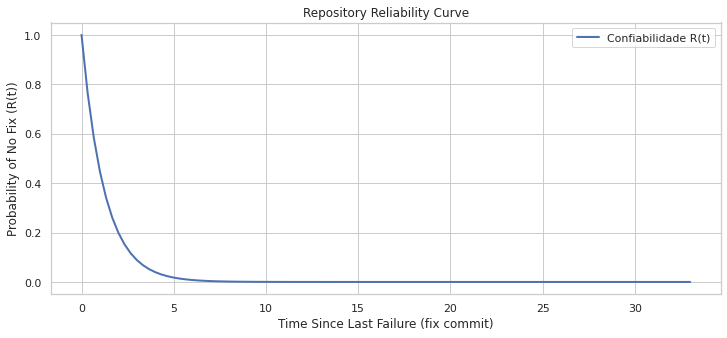

Confiabilidade R(1) = 0.4459
Confiabilidade R(5) = 0.0176
Confiabilidade R(10) = 0.0003
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'hbase', 'R1': '0.4459', 'R5': '0.0176', 'R10': '0.0003', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/test/java/org/apache/hadoop/hbase/TestClusterBootOrder.java,3,0.5,2.000000,0.135335
1,hbase-server/src/test/java/org/apache/hadoop/hbase/replication/TestReplicationStateHBaseImpl.java,3,0.5,2.000000,0.135335
2,hbase-server/src/test/java/org/apache/hadoop/hbase/filter/TestFilterListOrOperatorWithBlkCnt.java,3,0.5,2.000000,0.135335
3,hbase-server/src/test/java/org/apache/hadoop/hbase/replication/TestReplicationTableBase.java,3,0.5,2.000000,0.135335
4,hbase-common/src/main/java/org/apache/hadoop/hbase/JitterScheduledThreadPoolExecutorImpl.java,5,0.5,2.000000,0.135335
...,...,...,...,...,...
2468,hbase-server/src/main/java/org/apache/hadoop/hbase/regionserver/wal/CompressionContext.java,2,3003.0,0.000333,0.999667
2469,hbase-server/src/main/java/org/apache/hadoop/hbase/mob/MobFileCache.java,2,3057.0,0.000327,0.999673
2470,hbase-server/src/test/java/org/apache/hadoop/hbase/regionserver/TestRegionSplitPolicy.java,2,3197.0,0.000313,0.999687
2471,hbase-server/src/main/java/org/apache/hadoop/hbase/util/DirectMemoryUtils.java,2,3204.0,0.000312,0.999688


== flink ==


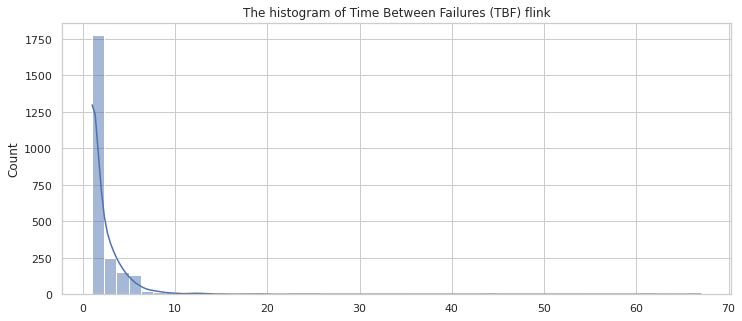

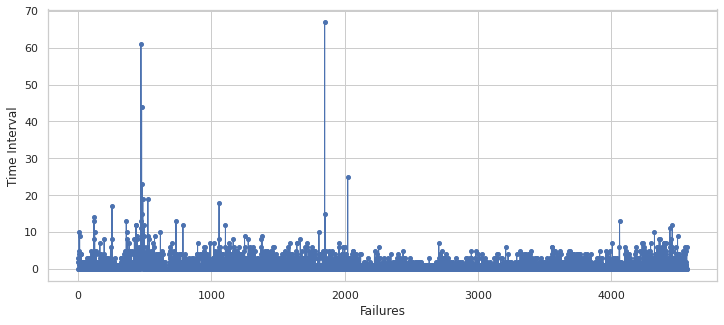

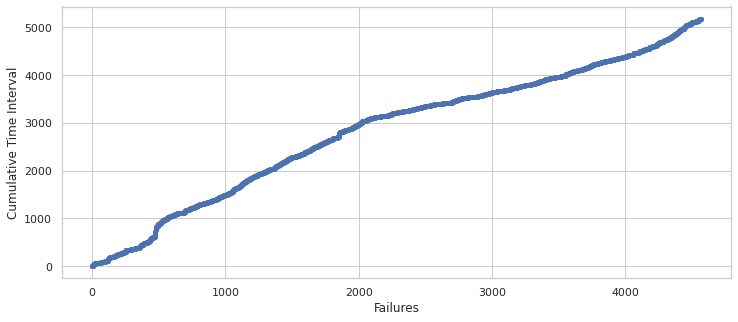

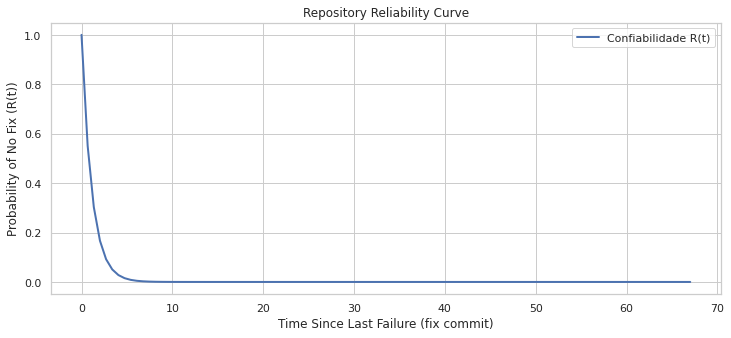

Confiabilidade R(1) = 0.4140
Confiabilidade R(5) = 0.0122
Confiabilidade R(10) = 0.0001
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'flink', 'R1': '0.4140', 'R5': '0.0122', 'R10': '0.0001', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,nephele/nephele-server/src/main/java/eu/stratosphere/nephele/checkpointing/CheckpointDecision.java,4,0.333333,3.000000,0.049787
1,flink-core/src/main/java/org/apache/flink/configuration/DelegatingConfiguration.java,3,0.500000,2.000000,0.135335
2,flink-addons/flink-streaming/flink-streaming-examples/src/main/java/org/apache/flink/streaming/examples/iteration/IterateExample.java,3,0.500000,2.000000,0.135335
3,nephele/nephele-visualization/src/main/java/eu/stratosphere/nephele/visualization/swt/SWTFailurePatternsEditor.java,5,0.500000,2.000000,0.135335
4,flink-runtime/src/main/java/org/apache/flink/runtime/state/heap/HeapValueState.java,2,1.000000,1.000000,0.367879
...,...,...,...,...,...
2651,flink-runtime/src/main/java/org/apache/flink/runtime/execution/Environment.java,2,3005.000000,0.000333,0.999667
2652,flink-tests/src/test/java/org/apache/flink/test/checkpointing/EventTimeAllWindowCheckpointingITCase.java,2,3051.000000,0.000328,0.999672
2653,flink-runtime/src/main/java/org/apache/flink/runtime/util/SignalHandler.java,2,3190.000000,0.000313,0.999687
2654,flink-runtime/src/test/java/org/apache/flink/runtime/testutils/CommonTestUtils.java,2,3265.000000,0.000306,0.999694


== opennlp ==


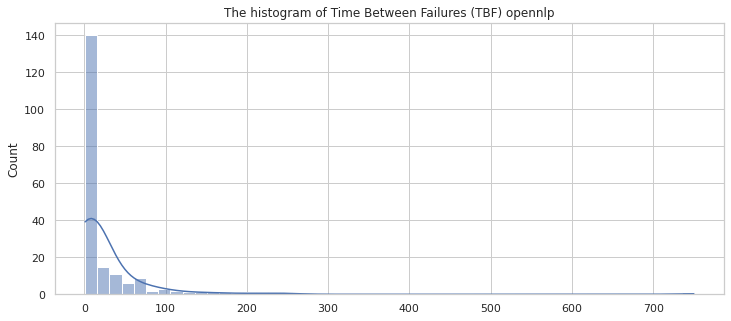

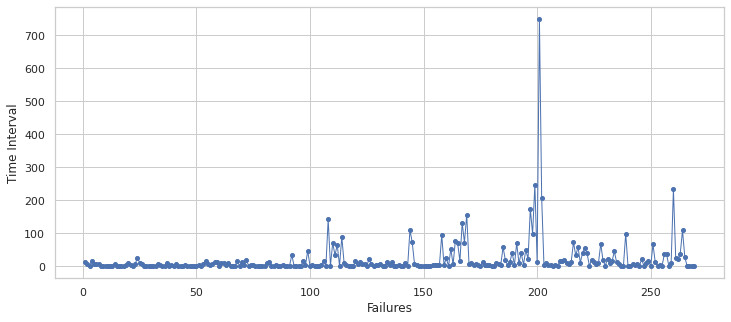

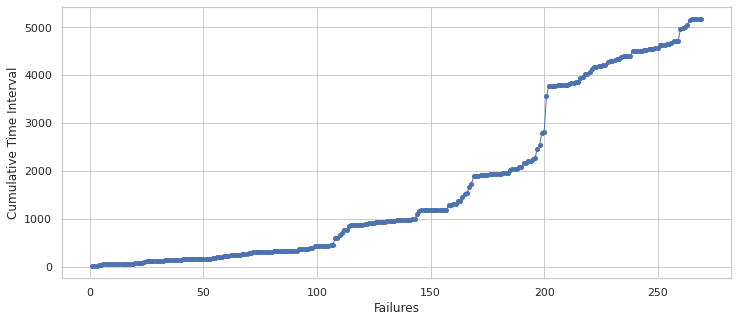

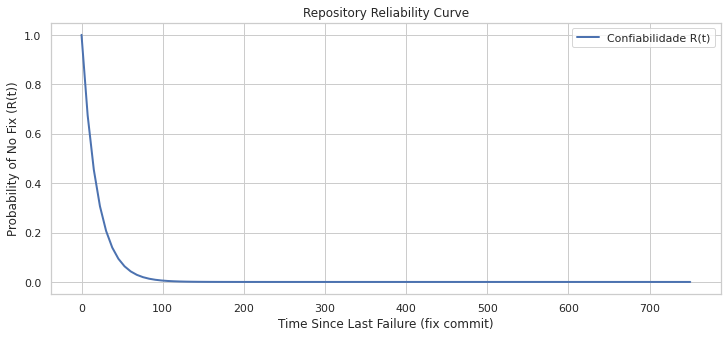

Confiabilidade R(1) = 0.9493
Confiabilidade R(5) = 0.7708
Confiabilidade R(10) = 0.5941
Confiabilidade R(50) = 0.0740
Confiabilidade R(100) = 0.0055
{'project': 'opennlp', 'R1': '0.9493', 'R5': '0.7708', 'R10': '0.5941', 'R50': '0.0740', 'R100': '0.0055'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,opennlp-tools/src/main/java/opennlp/tools/chunker/ChunkerCrossValidator.java,2,1.0,1.000000,0.367879
1,opennlp-tools/src/main/java/opennlp/tools/util/MockInputStreamFactory.java,2,2.0,0.500000,0.606531
2,opennlp-tools/src/main/java/opennlp/tools/formats/ad/ADChunkSampleStream.java,2,2.0,0.500000,0.606531
3,opennlp-tools/src/main/java/opennlp/tools/formats/ad/ADSentenceSampleStream.java,2,2.0,0.500000,0.606531
4,opennlp-tools/src/main/java/opennlp/tools/namefind/NameFinderSequenceValidator.java,2,4.0,0.250000,0.778801
...,...,...,...,...,...
144,opennlp-tools/src/test/java/opennlp/tools/tokenize/TokenizerFactoryTest.java,2,3740.0,0.000267,0.999733
145,opennlp-tools/src/main/java/opennlp/tools/formats/brat/BratDocumentStream.java,2,3755.0,0.000266,0.999734
146,opennlp-tools/src/main/java/opennlp/tools/entitylinker/EntityLinkerFactory.java,2,3969.0,0.000252,0.999748
147,opennlp-tools/src/main/java/opennlp/tools/ml/perceptron/PerceptronTrainer.java,2,4188.0,0.000239,0.999761


== maven ==


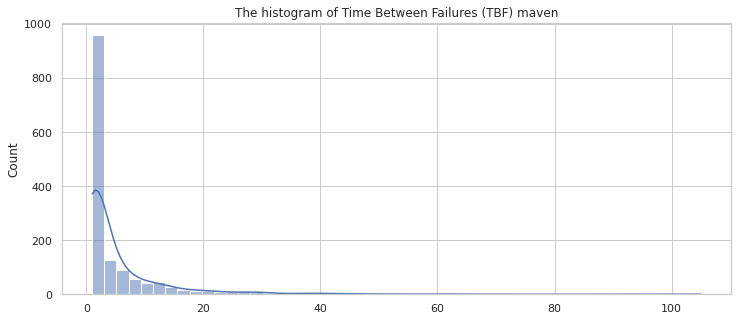

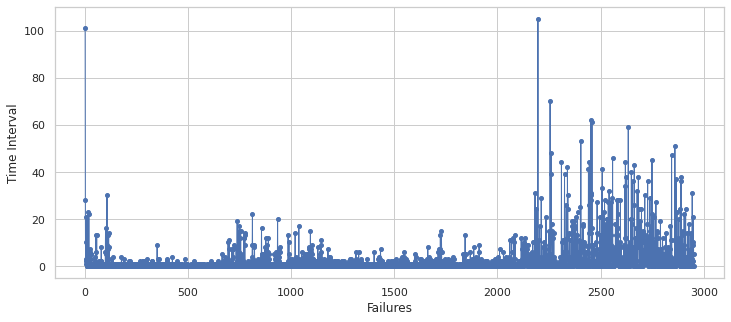

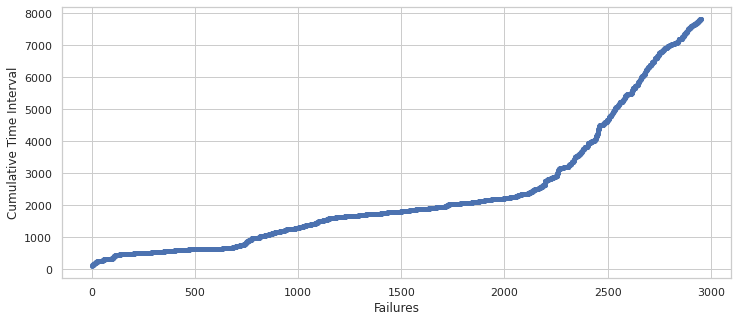

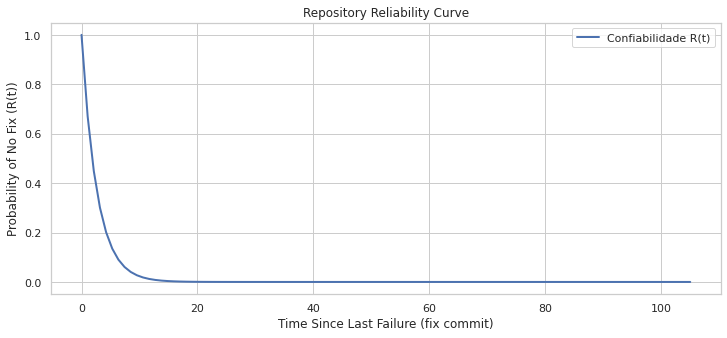

Confiabilidade R(1) = 0.6853
Confiabilidade R(5) = 0.1512
Confiabilidade R(10) = 0.0229
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'maven', 'R1': '0.6853', 'R5': '0.1512', 'R10': '0.0229', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,sandbox/pom-pre-alpha-converter/src/main/java/org/apache/maven/tools/converter/Main.java,3,0.500000,2.000000,0.135335
1,maven-repository/src/main/java/org/apache/maven/repository/DefaultMirrorBuilder.java,4,0.666667,1.500000,0.223130
2,its/core-integration-tests/src/test/java/org/apache/maven/integrationtests/MavenITmng3530ChangedPathInterpolationTest.java,2,1.000000,1.000000,0.367879
3,its/core-integration-tests/src/test/resources/it0113-serverAuthzAvailableToWagonMgrInPlugin/maven-it0113-plugin/src/main/java/org/apache/maven/plugins/MyMojo.java,2,1.000000,1.000000,0.367879
4,its/core-it-suite/src/test/java/org/apache/maven/it/MavenITmng5608ProfileActivationWarningTest.java,2,1.000000,1.000000,0.367879
...,...,...,...,...,...
1321,its/core-it-suite/src/test/java/org/apache/maven/it/MavenITmng2921ActiveAttachedArtifactsTest.java,2,4824.000000,0.000207,0.999793
1322,maven-artifact/src/main/java/org/apache/maven/artifact/handler/ArtifactHandler.java,2,4870.000000,0.000205,0.999795
1323,maven-core/src/main/java/org/apache/maven/project/artifact/DefaultMetadataSource.java,2,4909.000000,0.000204,0.999796
1324,maven-settings-builder/src/test/java/org/apache/maven/settings/validation/DefaultSettingsValidatorTest.java,2,4999.000000,0.000200,0.999800


== phoenix ==


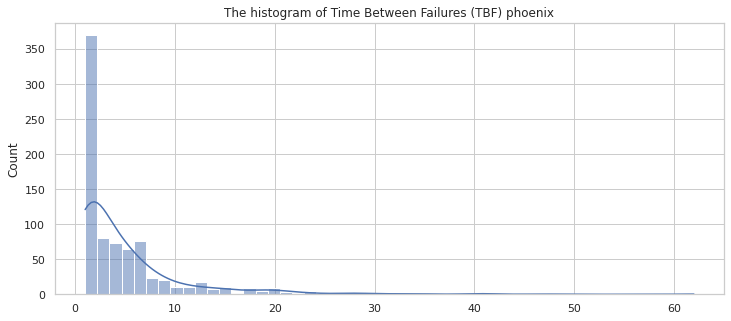

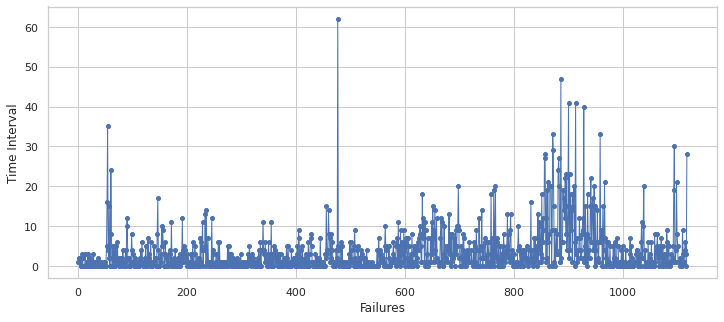

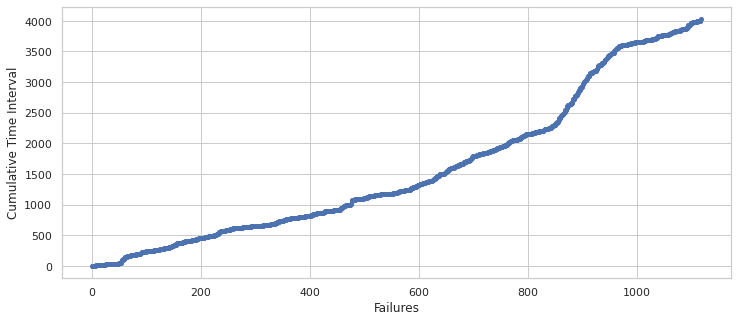

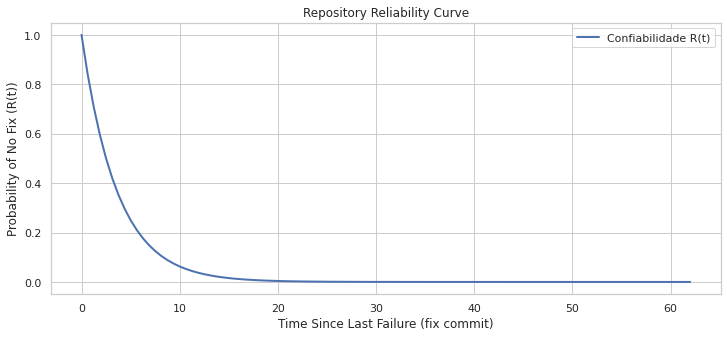

Confiabilidade R(1) = 0.7580
Confiabilidade R(5) = 0.2503
Confiabilidade R(10) = 0.0626
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'phoenix', 'R1': '0.7580', 'R5': '0.2503', 'R10': '0.0626', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,phoenix-core/src/it/java/org/apache/phoenix/end2end/StatsManagerIT.java,3,0.5,2.000000,0.135335
1,phoenix-core/src/it/java/org/apache/phoenix/end2end/index/LocalMutableNonTxIndexIT.java,2,1.0,1.000000,0.367879
2,phoenix-core/src/it/java/org/apache/phoenix/end2end/index/GlobalMutableTxIndexIT.java,2,1.0,1.000000,0.367879
3,phoenix-core/src/test/java/org/apache/phoenix/end2end/ViewTest.java,2,1.0,1.000000,0.367879
4,phoenix-core/src/test/java/org/apache/phoenix/schema/RowKeyValueAccessorTest.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
737,phoenix-core/src/it/java/org/apache/phoenix/end2end/salted/SaltedTableIT.java,2,3101.0,0.000322,0.999678
738,phoenix-core/src/main/java/org/apache/phoenix/expression/function/UpperFunction.java,2,3195.0,0.000313,0.999687
739,phoenix-core/src/main/java/org/apache/phoenix/query/DelegateQueryServices.java,2,3285.0,0.000304,0.999696
740,phoenix-core/src/test/java/org/apache/phoenix/filter/SkipScanFilterIntersectTest.java,2,3330.0,0.000300,0.999700


== presto ==


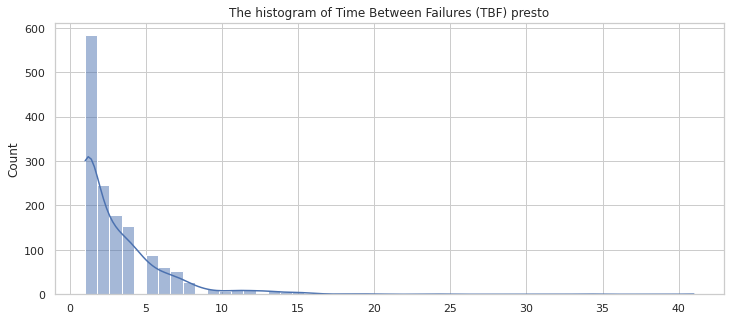

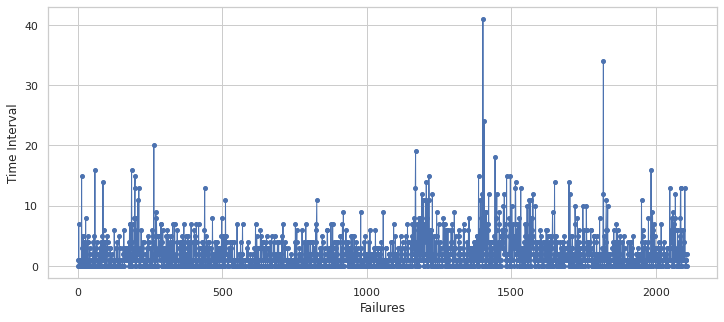

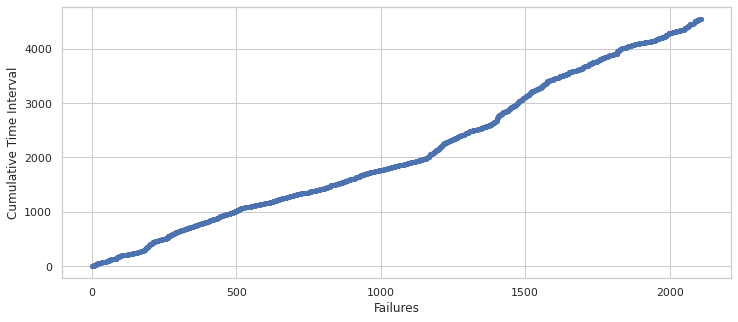

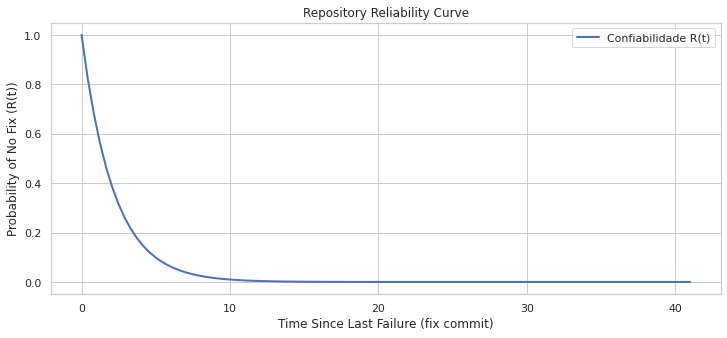

Confiabilidade R(1) = 0.6293
Confiabilidade R(5) = 0.0987
Confiabilidade R(10) = 0.0097
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'presto', 'R1': '0.6293', 'R5': '0.0987', 'R10': '0.0097', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,presto-parser/src/test/java/com/facebook/presto/sql/parser/TestSqlParserErrorHandling.java,3,0.5,2.000000,0.135335
1,presto-main/src/main/java/com/facebook/presto/server/TaskOutput.java,3,0.5,2.000000,0.135335
2,presto-main/src/test/java/com/facebook/presto/operator/TestHttpPageBufferClient.java,3,0.5,2.000000,0.135335
3,presto-main/src/main/java/com/facebook/presto/operator/scalar/ArraySliceFunction.java,2,1.0,1.000000,0.367879
4,presto-main/src/main/java/com/facebook/presto/operator/aggregation/LongMaxAggregation.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
1161,presto-main/src/main/java/com/facebook/presto/operator/scalar/ArrayMinFunction.java,2,2946.0,0.000339,0.999661
1162,presto-main/src/main/java/com/facebook/presto/operator/scalar/ArrayMaxFunction.java,2,2946.0,0.000339,0.999661
1163,presto-main/src/main/java/com/facebook/presto/execution/ExecutionFailureInfo.java,2,3101.0,0.000322,0.999678
1164,presto-main/src/main/java/com/facebook/presto/server/QueryResource.java,2,3399.0,0.000294,0.999706


== jspwiki ==


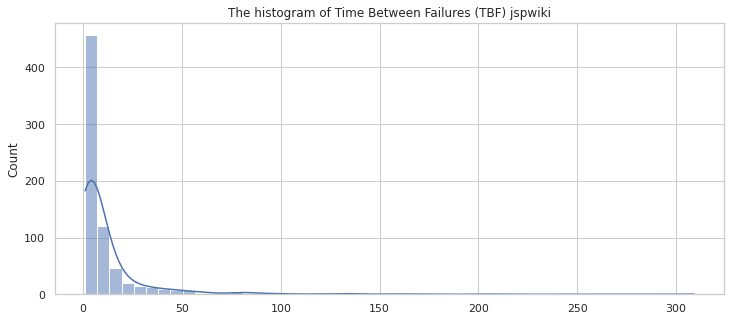

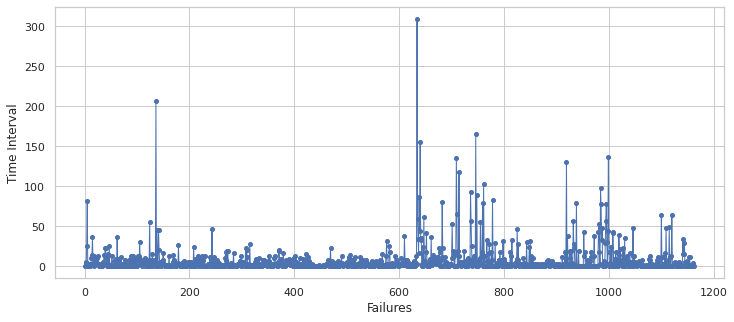

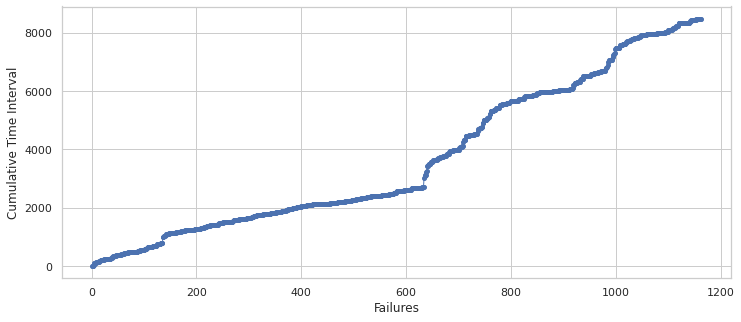

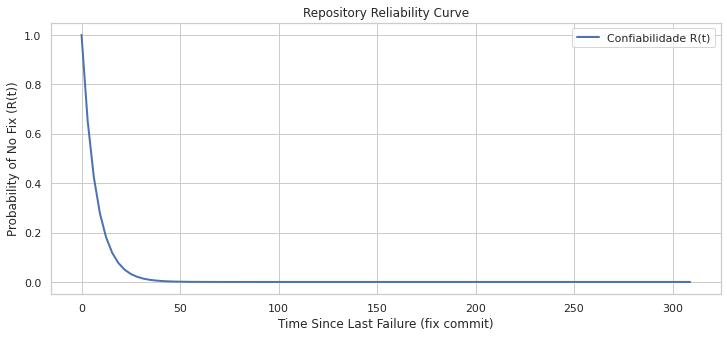

Confiabilidade R(1) = 0.8718
Confiabilidade R(5) = 0.5035
Confiabilidade R(10) = 0.2535
Confiabilidade R(50) = 0.0010
Confiabilidade R(100) = 0.0000
{'project': 'jspwiki', 'R1': '0.8718', 'R5': '0.5035', 'R10': '0.2535', 'R50': '0.0010', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,jspwiki-main/src/test/java/org/apache/wiki/providers/BasicAttachmentProviderTest.java,3,0.5,2.000000,0.135335
1,src/com/ecyrd/jspwiki/action/UserProfileActionBean.java,2,1.0,1.000000,0.367879
2,src/com/ecyrd/jspwiki/ui/stripes/WikiActionBeanContext.java,2,1.0,1.000000,0.367879
3,src/com/ecyrd/jspwiki/dav/DavPath.java,2,1.0,1.000000,0.367879
4,jspwiki-event/src/main/java/org/apache/wiki/event/WorkflowEvent.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
555,tests/stress/Benchmark.java,2,1778.0,0.000562,0.999438
556,src/com/ecyrd/jspwiki/tags/PageDateTag.java,2,2072.0,0.000483,0.999517
557,tests/com/ecyrd/jspwiki/attachment/AttachmentManagerTest.java,2,2153.0,0.000464,0.999536
558,src/com/ecyrd/jspwiki/QueryItem.java,2,2245.0,0.000445,0.999555


== lucene ==


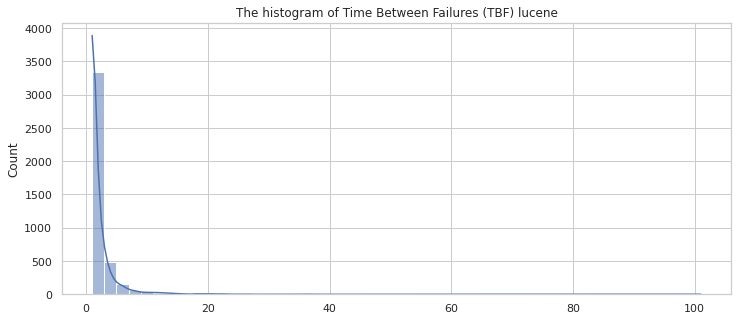

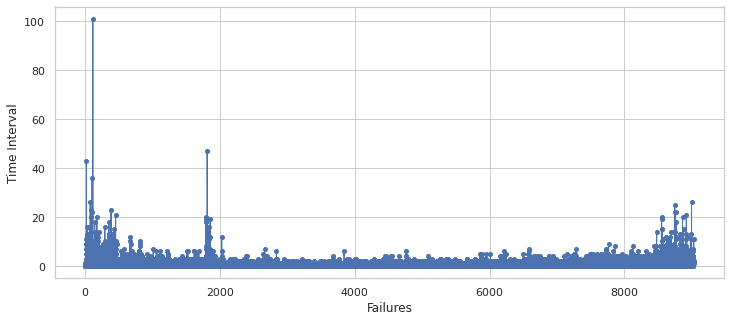

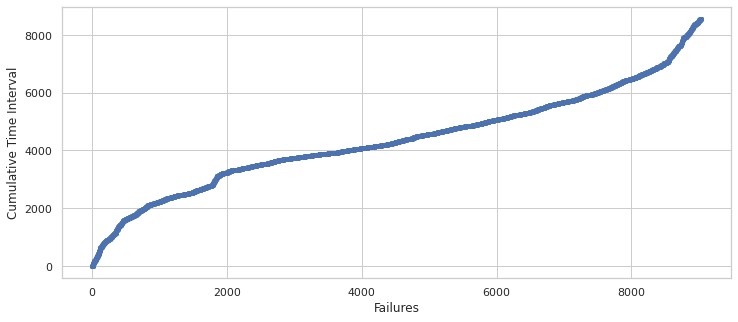

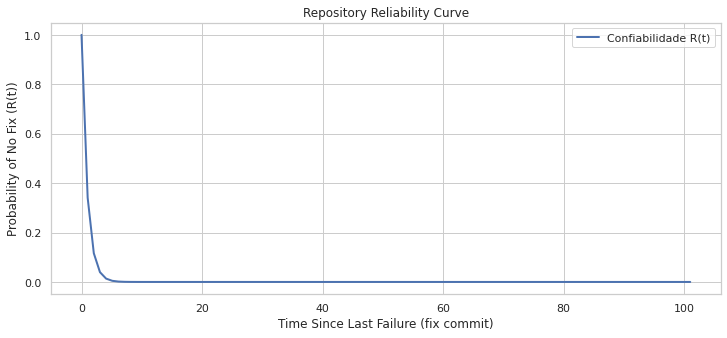

Confiabilidade R(1) = 0.3481
Confiabilidade R(5) = 0.0051
Confiabilidade R(10) = 0.0000
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'lucene', 'R1': '0.3481', 'R5': '0.0051', 'R10': '0.0000', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,solr/contrib/analytics/src/test/org/apache/solr/analytics/facet/FacetSortingTest.java,4,0.333333,3.000000,0.049787
1,solr/core/src/test/org/apache/solr/search/LargeFieldTest.java,6,0.400000,2.500000,0.082085
2,lucene/test-framework/src/java/org/apache/lucene/mockfile/FilterFileSystem.java,3,0.500000,2.000000,0.135335
3,contrib/analyzers/smartcn/src/java/org/apache/lucene/analysis/cn/smart/hhmm/HHMMSegmenter.java,3,0.500000,2.000000,0.135335
4,lucene/core/src/test/org/apache/lucene/search/TermInSetQueryTest.java,3,0.500000,2.000000,0.135335
...,...,...,...,...,...
5857,lucene/benchmark/src/java/org/apache/lucene/benchmark/byTask/tasks/NewLocaleTask.java,2,4162.000000,0.000240,0.999760
5858,lucene/queryparser/src/test/org/apache/lucene/queryparser/flexible/messages/TestNLS.java,2,4162.000000,0.000240,0.999760
5859,lucene/core/src/java/org/apache/lucene/store/LockVerifyServer.java,2,4228.000000,0.000237,0.999764
5860,lucene/benchmark/src/java/org/apache/lucene/benchmark/byTask/tasks/SearchWithCollectorTask.java,2,4462.000000,0.000224,0.999776


== pdfbox ==


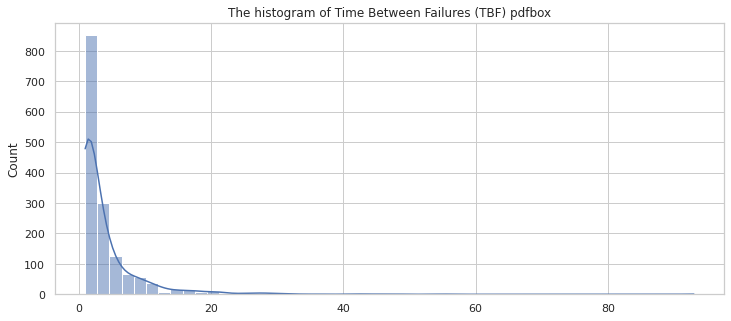

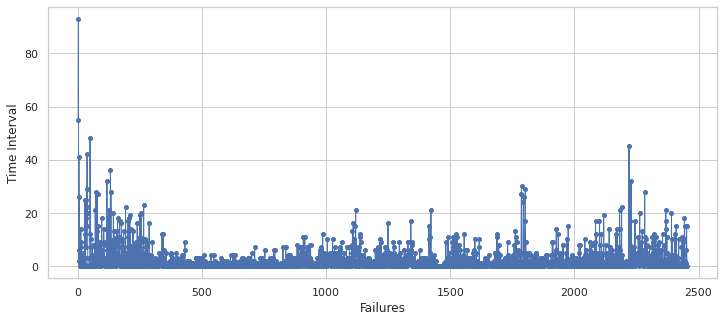

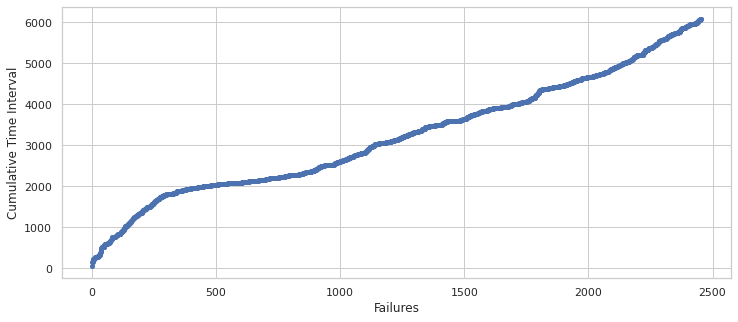

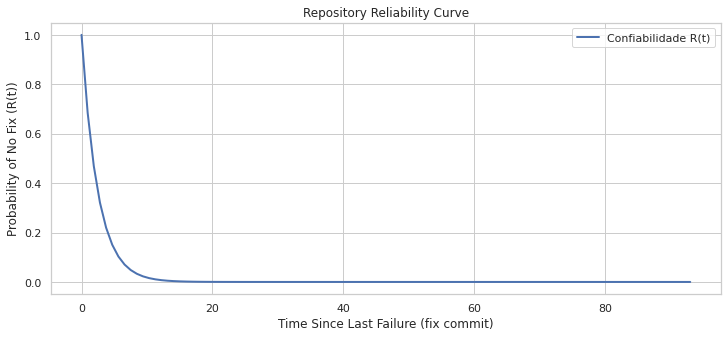

Confiabilidade R(1) = 0.6681
Confiabilidade R(5) = 0.1331
Confiabilidade R(10) = 0.0177
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'pdfbox', 'R1': '0.6681', 'R5': '0.1331', 'R10': '0.0177', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,fontbox/src/main/java/org/apache/fontbox/FontBoxFont.java,2,1.0,1.000000,0.367879
1,src/main/java/org/apache/pdfbox/pdmodel/graphics/xobject/PDCcitt.java,2,1.0,1.000000,0.367879
2,debugger/src/main/java/org/apache/pdfbox/debugger/hexviewer/HexPane.java,2,1.0,1.000000,0.367879
3,examples/src/test/java/org/apache/pdfbox/examples/pdmodel/TestEmbeddedFiles.java,2,1.0,1.000000,0.367879
4,pdfbox/src/main/java/org/apache/pdfbox/pdmodel/common/function/type4/BitwiseOperators.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
744,examples/src/main/java/org/apache/pdfbox/examples/util/PrintTextLocations.java,2,3391.0,0.000295,0.999705
745,pdfbox/src/main/java/org/apache/pdfbox/contentstream/operator/graphics/DrawObject.java,2,3583.0,0.000279,0.999721
746,pdfbox/src/test/java/org/apache/pdfbox/pdmodel/common/TestPDNameTreeNode.java,2,3803.0,0.000263,0.999737
747,fontbox/src/main/java/org/apache/fontbox/ttf/GlyfCompositeComp.java,2,4505.0,0.000222,0.999778


== kotlin ==


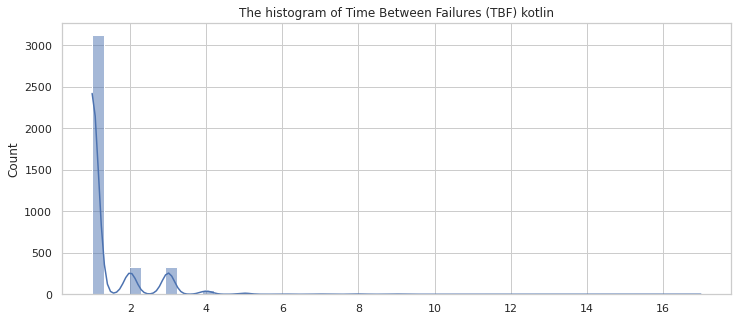

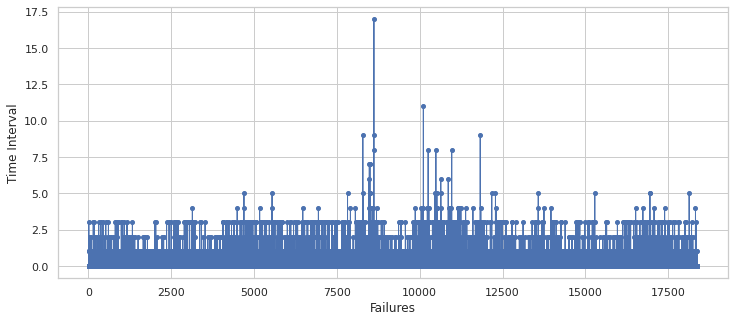

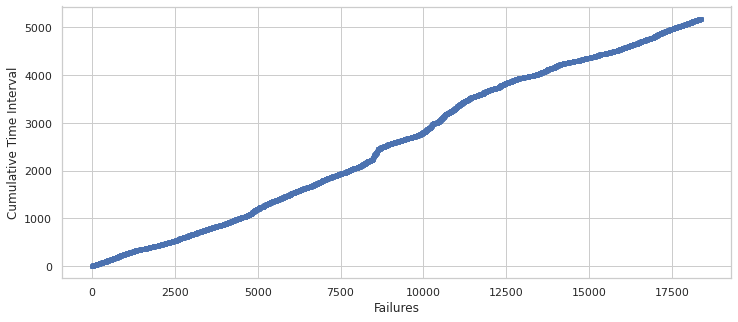

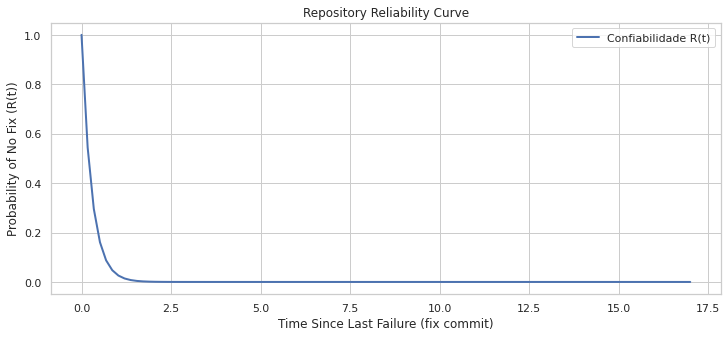

Confiabilidade R(1) = 0.0288
Confiabilidade R(5) = 0.0000
Confiabilidade R(10) = 0.0000
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'kotlin', 'R1': '0.0288', 'R5': '0.0000', 'R10': '0.0000', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,compiler/preloader/instrumentation/src/org/jetbrains/jet/preloading/instrumentation/InterceptionInstrumenter.java,5,0.250000,4.000000,0.018316
1,idea/tests/org/jetbrains/jet/plugin/navigation/JetGotoImplementationTest.java,4,0.333333,3.000000,0.049787
2,js/js.tests/test/org/jetbrains/k2js/test/TranslationTest.java,3,0.500000,2.000000,0.135335
3,idea/tests/org/jetbrains/jet/plugin/refactoring/rename/AbstractRenameTest.java,3,0.500000,2.000000,0.135335
4,idea/tests/org/jetbrains/jet/plugin/refactoring/rename/RenameTestGenerated.java,3,0.500000,2.000000,0.135335
...,...,...,...,...,...
3148,compiler/testData/javaModules/dependOnManyModules/moduleD/module-info.java,2,2291.000000,0.000436,0.999564
3149,compiler/testData/javaModules/jdkModulesFromNamed/main/module-info.java,2,2291.000000,0.000436,0.999564
3150,compiler/testData/javaModules/simpleUseNonExportedPackage/moduleB/module-info.java,2,2291.000000,0.000436,0.999564
3151,core/descriptors/src/org/jetbrains/kotlin/descriptors/annotations/AnnotationDescriptorImpl.java,2,2503.000000,0.000400,0.999601


== skywalking ==


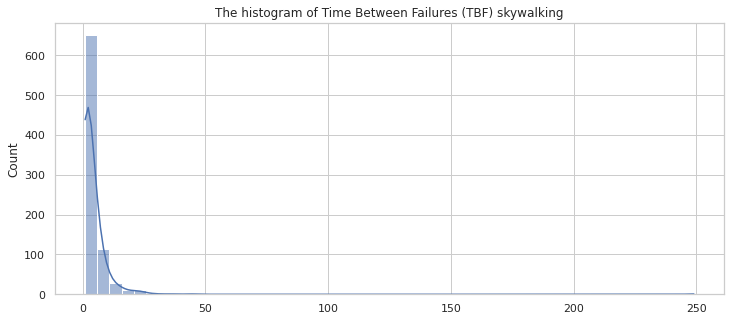

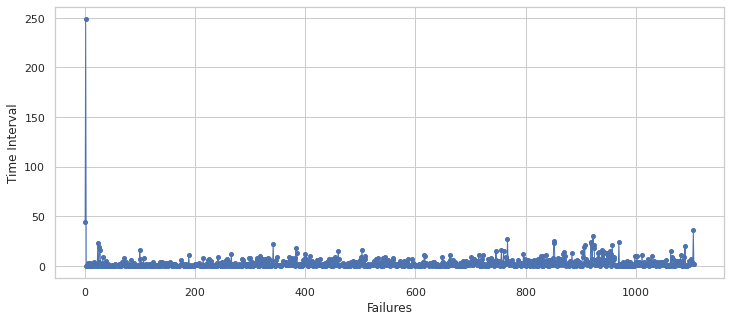

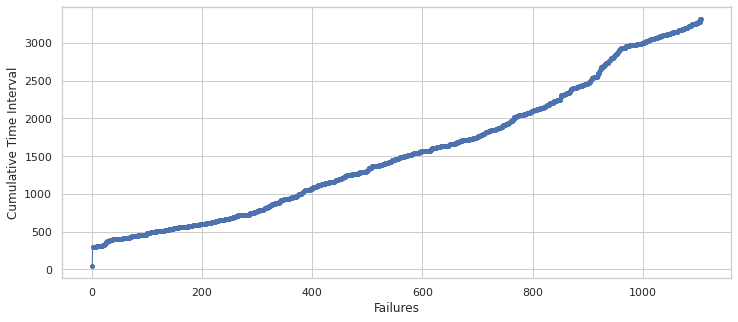

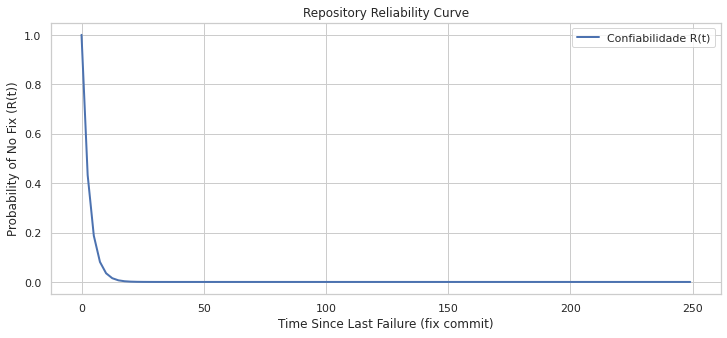

Confiabilidade R(1) = 0.7167
Confiabilidade R(5) = 0.1891
Confiabilidade R(10) = 0.0357
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'skywalking', 'R1': '0.7167', 'R5': '0.1891', 'R10': '0.0357', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,apm-sniffer/apm-agent-core/src/main/java/org/skywalking/apm/agent/core/boot/DefaultNamedThreadFactory.java,3,0.5,2.000000,0.135335
1,skywalking-sniffer/skywalking-toolkit-activation/skywalking-toolkit-opentracing-activation/src/main/java/com/a/eye/skywalking/toolkit/activation/opentracing/span/interceptor/SpanSetTagInterceptor.java,3,0.5,2.000000,0.135335
2,apm-sniffer/apm-sdk-plugin/mysql-5.x-plugin/src/main/java/org/apache/skywalking/apm/plugin/jdbc/mysql/PreparedStatementExecuteMethodsInterceptor.java,2,1.0,1.000000,0.367879
3,apm-collector/apm-collector-ui/src/main/java/org/skywalking/apm/collector/ui/dao/ServiceReferenceEsDAO.java,2,1.0,1.000000,0.367879
4,apm-sniffer/apm-agent-core/src/main/java/org/skywalking/apm/agent/core/context/trace/EntrySpan.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
916,oap-server/server-core/src/main/java/org/apache/skywalking/oap/server/core/storage/query/IAlarmQueryDAO.java,2,1784.0,0.000561,0.999440
917,oap-server/server-core/src/main/java/org/apache/skywalking/oap/server/core/analysis/manual/relation/service/ServiceRelationServerSideMetrics.java,2,1790.0,0.000559,0.999441
918,oap-server/server-core/src/main/java/org/apache/skywalking/oap/server/core/analysis/manual/relation/instance/ServiceInstanceRelationServerSideMetrics.java,2,1790.0,0.000559,0.999441
919,oap-server/server-core/src/main/java/org/apache/skywalking/oap/server/core/analysis/manual/relation/service/ServiceRelationClientSideMetrics.java,2,1790.0,0.000559,0.999441


== htmlunit ==


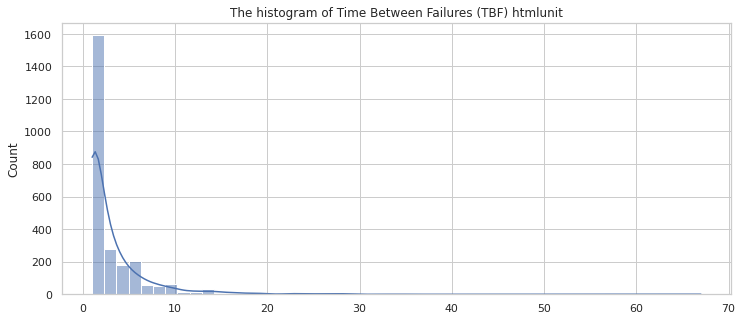

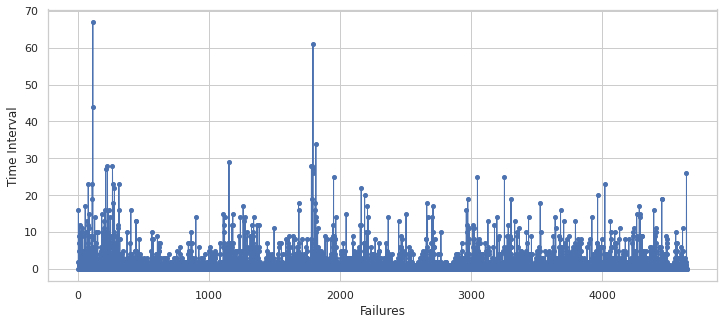

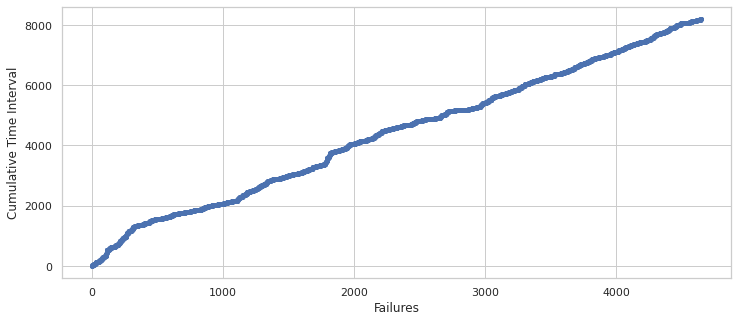

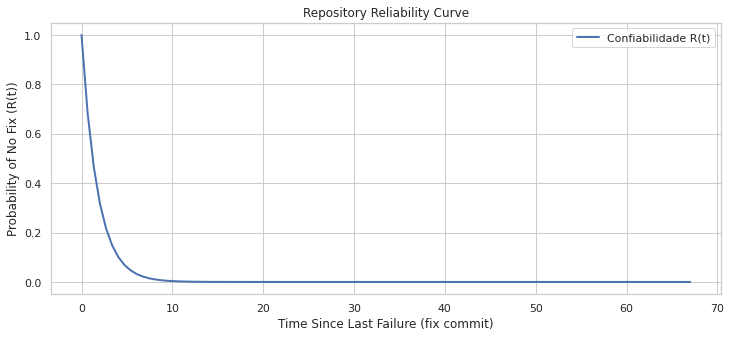

Confiabilidade R(1) = 0.5676
Confiabilidade R(5) = 0.0589
Confiabilidade R(10) = 0.0035
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'htmlunit', 'R1': '0.5676', 'R5': '0.0589', 'R10': '0.0035', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/java/com/gargoylesoftware/htmlunit/javascript/TimeoutError.java,3,0.5,2.000000,0.135335
1,src/test/java/org/htmlunit/javascript/ScriptableObjectTest.java,3,0.5,2.000000,0.135335
2,src/test/java/org/htmlunit/javascript/host/css/property/ElementClientWidthTest.java,3,0.5,2.000000,0.135335
3,src/main/java/com/gargoylesoftware/htmlunit/javascript/host/html/Image.java,3,0.5,2.000000,0.135335
4,src/main/java/com/gargoylesoftware/htmlunit/javascript/HTMLCollection.java,3,0.5,2.000000,0.135335
...,...,...,...,...,...
1705,src/main/java/com/gargoylesoftware/htmlunit/html/HtmlParameter.java,2,5257.0,0.000190,0.999810
1706,src/main/java/com/gargoylesoftware/htmlunit/html/HtmlStyle.java,2,5257.0,0.000190,0.999810
1707,src/main/java/com/gargoylesoftware/htmlunit/html/HtmlBase.java,2,5273.0,0.000190,0.999810
1708,src/main/java/com/gargoylesoftware/htmlunit/html/HtmlBaseFont.java,2,5273.0,0.000190,0.999810


== redisson ==


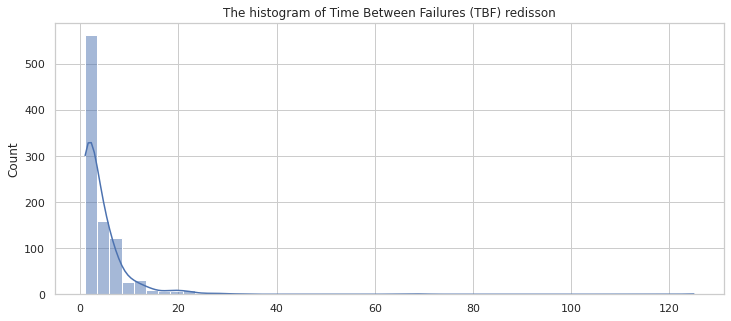

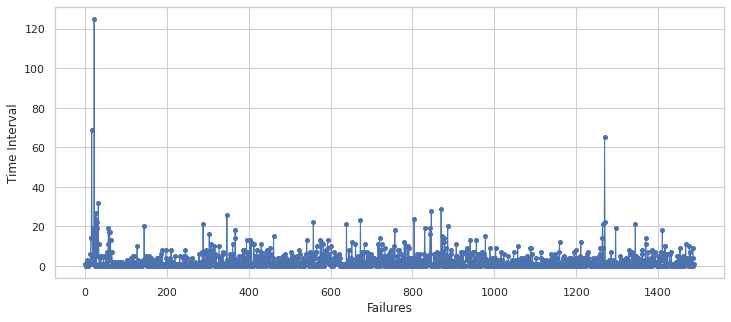

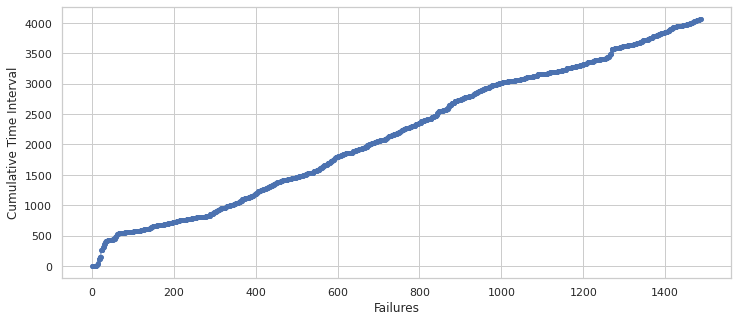

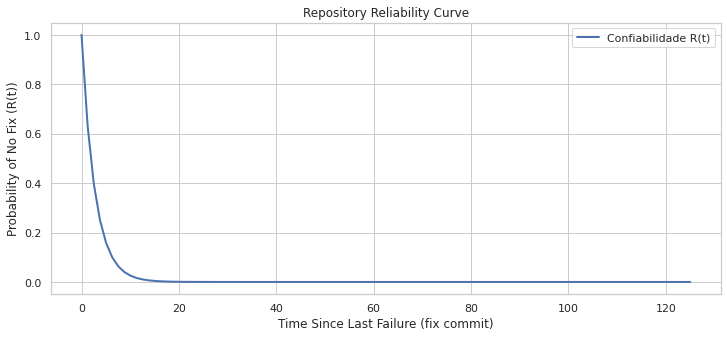

Confiabilidade R(1) = 0.6938
Confiabilidade R(5) = 0.1608
Confiabilidade R(10) = 0.0259
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'redisson', 'R1': '0.6938', 'R5': '0.1608', 'R10': '0.0259', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/main/java/org/redisson/core/RCountDownLatch.java,2,1.0,1.000000,0.367879
1,src/main/java/org/redisson/client/RedisPubSubListener.java,2,1.0,1.000000,0.367879
2,redisson/src/main/java/org/redisson/connection/balancer/CommandsLoadBalancer.java,2,1.0,1.000000,0.367879
3,src/main/java/org/redisson/core/RScript.java,2,1.0,1.000000,0.367879
4,src/main/java/org/redisson/RedisPubSubTopicListenerWrapper.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
596,redisson/src/main/java/org/redisson/api/RObject.java,2,2944.0,0.000340,0.999660
597,redisson/src/main/java/org/redisson/PubSubMessageListener.java,2,3003.0,0.000333,0.999667
598,redisson/src/main/java/org/redisson/PubSubPatternStatusListener.java,2,3003.0,0.000333,0.999667
599,redisson/src/main/java/org/redisson/PubSubPatternMessageListener.java,2,3003.0,0.000333,0.999667


== BiglyBT ==


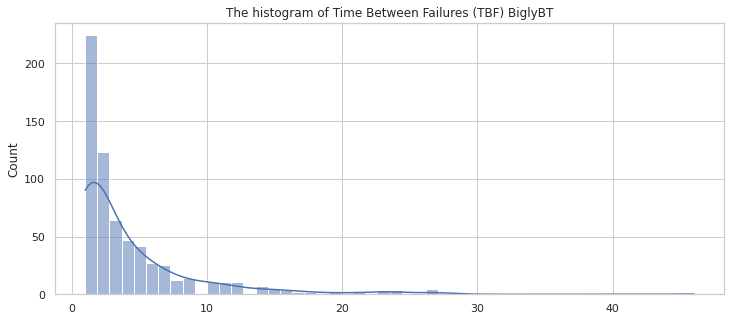

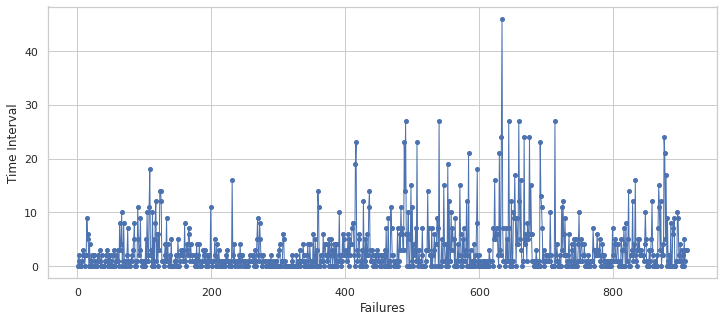

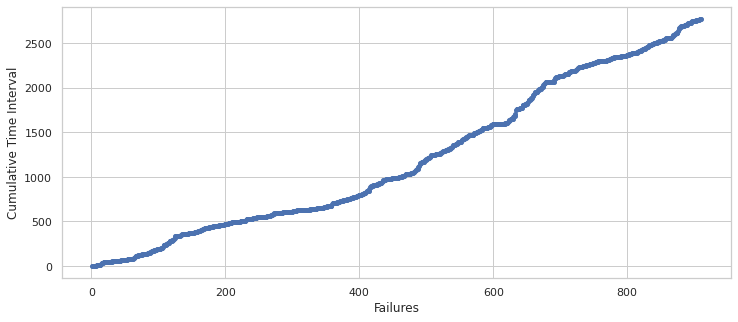

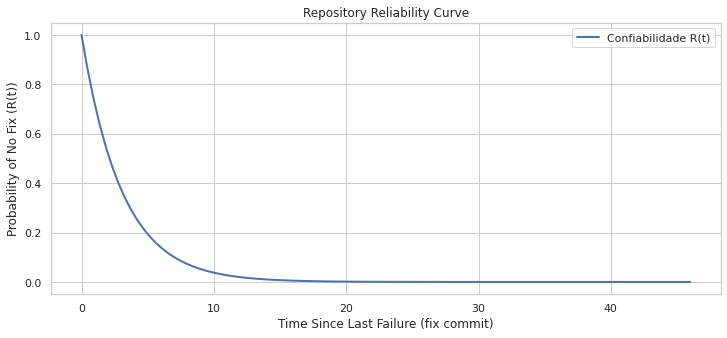

Confiabilidade R(1) = 0.7202
Confiabilidade R(5) = 0.1937
Confiabilidade R(10) = 0.0375
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'BiglyBT', 'R1': '0.7202', 'R5': '0.1937', 'R10': '0.0375', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,uis/src/com/biglybt/ui/swt/components/DoubleBufferedLabel.java,2,1.0,1.000000,0.367879
1,uis/src/com/biglybt/ui/swt/views/tableitems/files/FileAvailabilityItem.java,2,1.0,1.000000,0.367879
2,uis/src/com/biglybt/ui/swt/views/tableitems/files/PercentItem.java,2,1.0,1.000000,0.367879
3,uis/src/com/biglybt/ui/swt/columns/torrent/ColumnProgressETA.java,2,1.0,1.000000,0.367879
4,uis/src/com/biglybt/ui/swt/views/tableitems/files/DoneItem.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
346,uis/src/com/biglybt/ui/swt/shells/SpeedScaleShell.java,2,1939.0,0.000516,0.999484
347,core/src/com/biglybt/ui/common/table/impl/TableColumnImpl.java,2,1989.0,0.000503,0.999497
348,uis/src/com/biglybt/ui/swt/views/stats/VivaldiPanel.java,2,2001.0,0.000500,0.999500
349,uis/src/com/biglybt/ui/swt/views/skin/SkinnedDialog.java,2,2319.0,0.000431,0.999569


== hazelcast ==


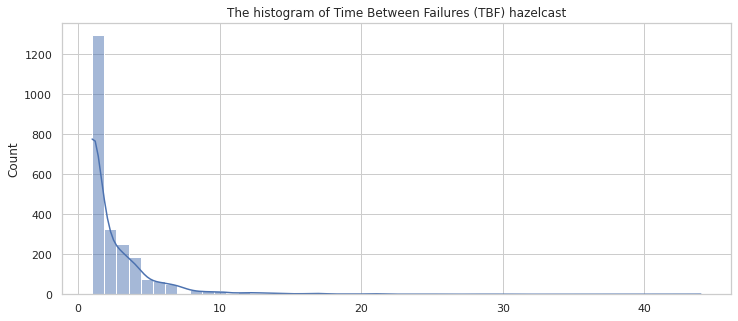

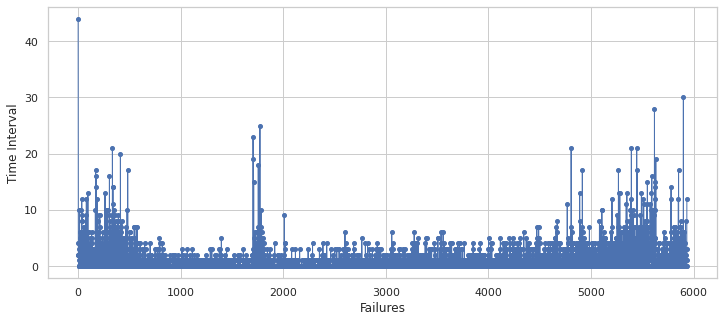

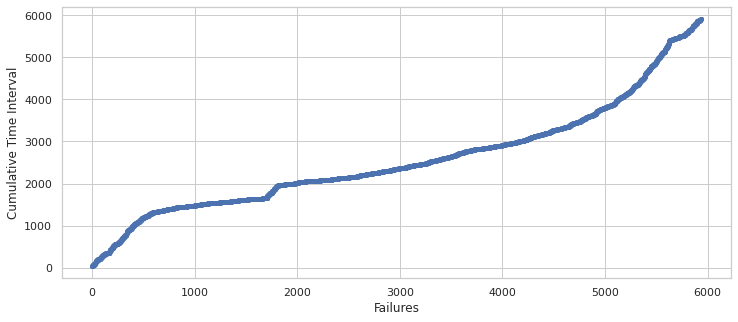

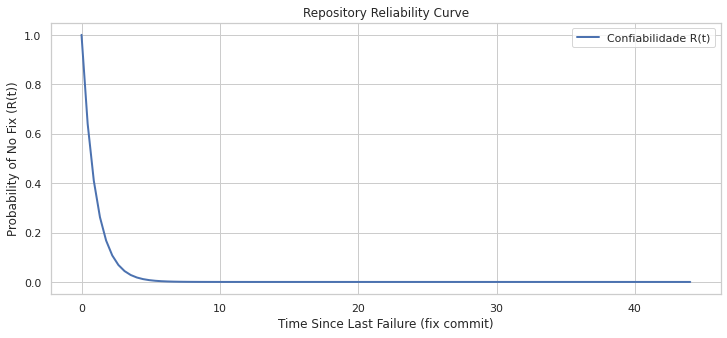

Confiabilidade R(1) = 0.3663
Confiabilidade R(5) = 0.0066
Confiabilidade R(10) = 0.0000
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'hazelcast', 'R1': '0.3663', 'R5': '0.0066', 'R10': '0.0000', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,hazelcast-ra/src/test/java/com/hazelcast/jca/HazelcastXaTest.java,4,0.333333,3.000000,0.049787
1,hazelcast/src/test/java/com/hazelcast/query/impl/OrResultSetTest.java,4,0.333333,3.000000,0.049787
2,hazelcast/src/main/java/com/hazelcast/cache/impl/operation/CacheDestroyOperation.java,4,0.333333,3.000000,0.049787
3,hazelcast/src/main/java/com/hazelcast/nio/tcp/nonblocking/iobalancer/LoadTracker.java,4,0.333333,3.000000,0.049787
4,hazelcast/src/main/java/com/hazelcast/queue/impl/proxy/QueueProxyImpl.java,4,0.333333,3.000000,0.049787
...,...,...,...,...,...
4337,hazelcast/src/main/java/com/hazelcast/cache/impl/CachePartitionEventData.java,2,2973.000000,0.000336,0.999664
4338,hazelcast/src/test/java/com/hazelcast/cache/impl/InternalCacheRecordStoreTest.java,2,3020.000000,0.000331,0.999669
4339,hazelcast/src/test/java/com/hazelcast/query/impl/IndexImplTest.java,2,3063.000000,0.000326,0.999674
4340,hazelcast/src/main/java/com/hazelcast/config/GlobalSerializerConfig.java,2,3654.000000,0.000274,0.999726


== error-prone ==


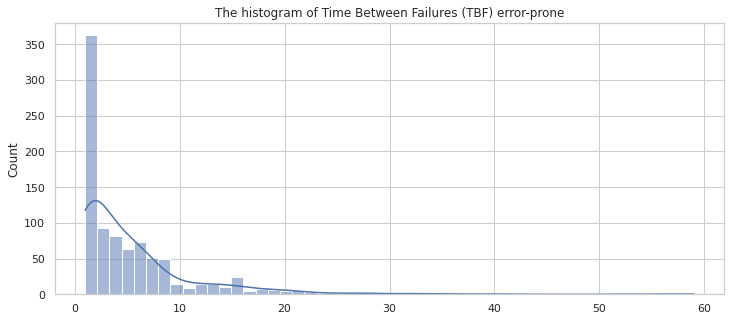

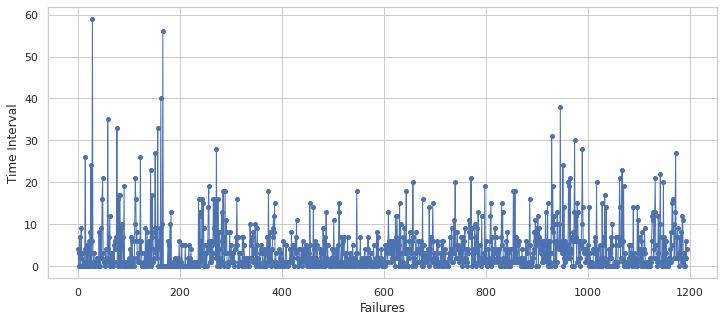

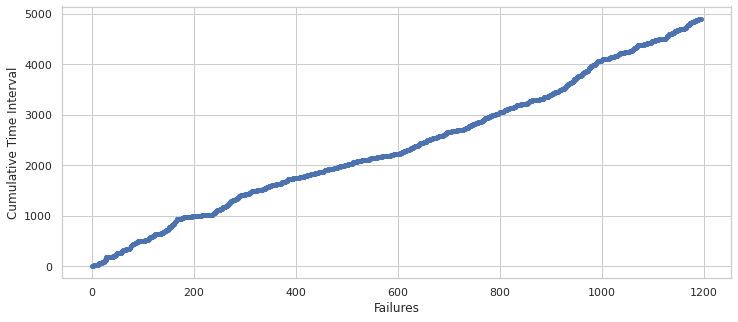

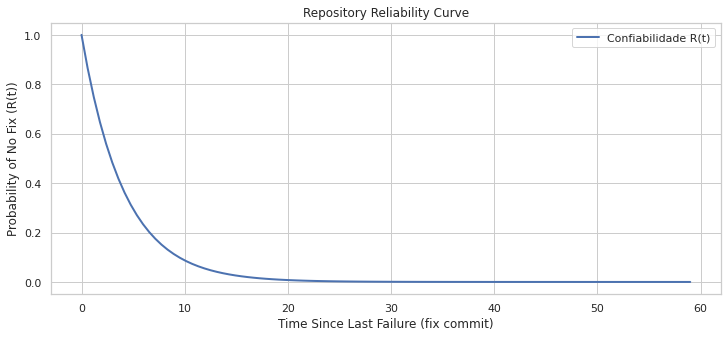

Confiabilidade R(1) = 0.7836
Confiabilidade R(5) = 0.2955
Confiabilidade R(10) = 0.0873
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'error-prone', 'R1': '0.7836', 'R5': '0.2955', 'R10': '0.0873', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,core/src/test/resources/com/google/errorprone/bugpatterns/ChainingConstructorIgnoresParameterNegativeCases.java,4,0.333333,3.000000,0.049787
1,core/src/test/resources/com/google/errorprone/refactors/covariant_equals/NegativeCases.java,4,0.333333,3.000000,0.049787
2,core/src/test/java/com/google/errorprone/bugpatterns/inject/dagger/PrivateConstructorForNoninstantiableModuleTest.java,3,0.500000,2.000000,0.135335
3,core/src/main/java/com/google/errorprone/bugpatterns/PreconditionsExpensiveString.java,3,0.500000,2.000000,0.135335
4,core/src/main/java/com/google/errorprone/bugpatterns/UnnecessarilyFullyQualified.java,2,1.000000,1.000000,0.367879
...,...,...,...,...,...
775,core/src/test/java/com/google/errorprone/bugpatterns/inject/MoreThanOneQualifierTest.java,2,3139.000000,0.000319,0.999681
776,core/src/test/java/com/google/errorprone/dataflow/nullnesspropagation/NullnessPropagationTest.java,2,3161.000000,0.000316,0.999684
777,core/src/test/java/com/google/errorprone/bugpatterns/android/RectIntersectReturnValueIgnoredTest.java,2,3255.000000,0.000307,0.999693
778,core/src/test/java/com/google/errorprone/bugpatterns/AsyncFunctionReturnsNullTest.java,2,3556.000000,0.000281,0.999719


== castor ==


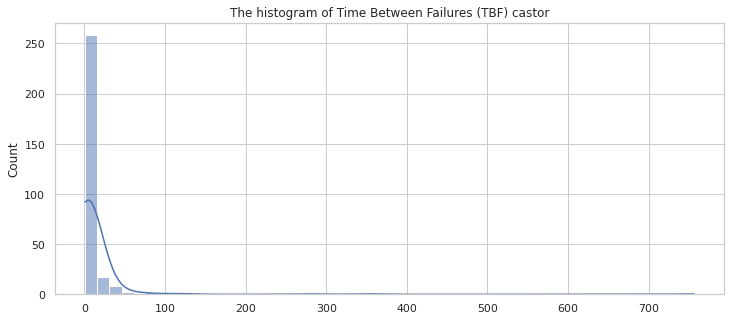

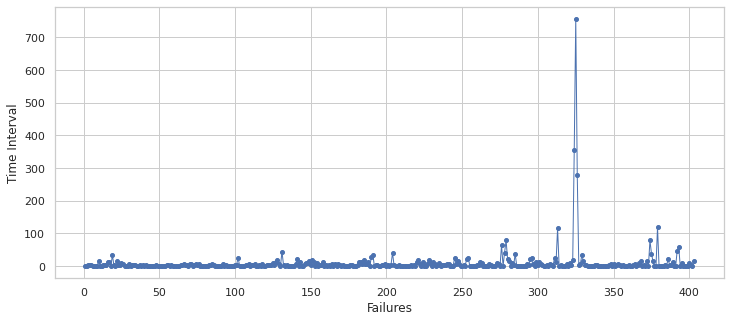

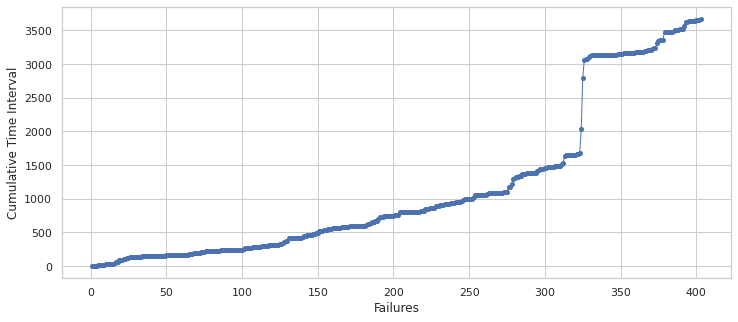

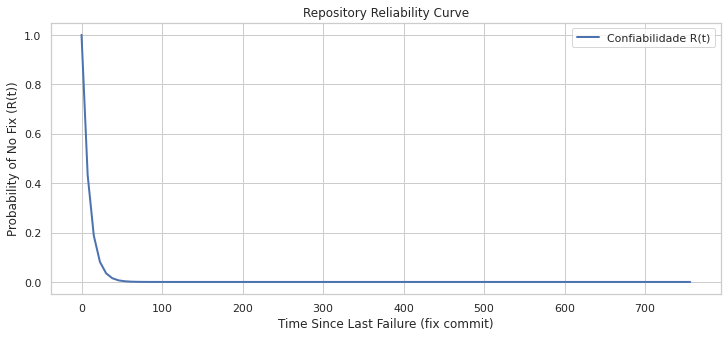

Confiabilidade R(1) = 0.8961
Confiabilidade R(5) = 0.5777
Confiabilidade R(10) = 0.3337
Confiabilidade R(50) = 0.0041
Confiabilidade R(100) = 0.0000
{'project': 'castor', 'R1': '0.8961', 'R5': '0.5777', 'R10': '0.3337', 'R50': '0.0041', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,cpactf/src/test/java/org/castor/cpa/test/test19/TestInstanceFactory.java,3,0.5,2.000000,0.135335
1,xml/src/test/java/org/exolab/castor/xml/BaseMarshallerTest.java,2,1.0,1.000000,0.367879
2,src/main/java/org/exolab/castor/builder/descriptors/DescriptorJClass.java,2,3.0,0.333333,0.716531
3,cpactf/src/test/java/org/castor/cpa/test/test2788/Book.java,2,3.0,0.333333,0.716531
4,cpactf/src/test/java/org/castor/cpa/test/test2788/FindWithNewInstanceTest.java,2,3.0,0.333333,0.716531
...,...,...,...,...,...
146,xml/src/main/java/org/castor/mapping/MappingUnmarshaller.java,2,1122.0,0.000891,0.999109
147,xml/src/main/java/org/castor/xml/BackwardCompatibilityContext.java,2,1542.0,0.000649,0.999352
148,xml/src/test/java/org/exolab/castor/xml/SetPropertyXmlNamingTest.java,2,1712.0,0.000584,0.999416
149,xml/src/test/java/org/exolab/castor/xml/TestUnmarshaller.java,2,1721.0,0.000581,0.999419


== tomcat ==


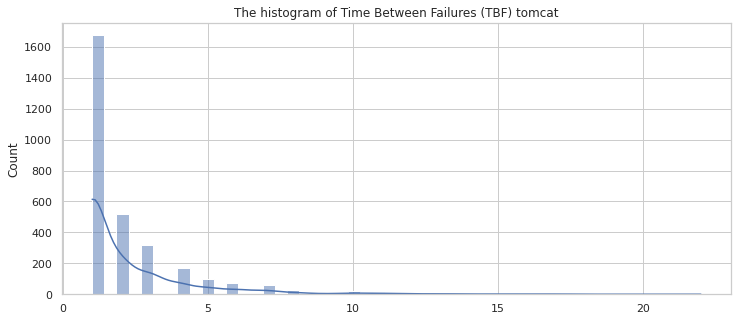

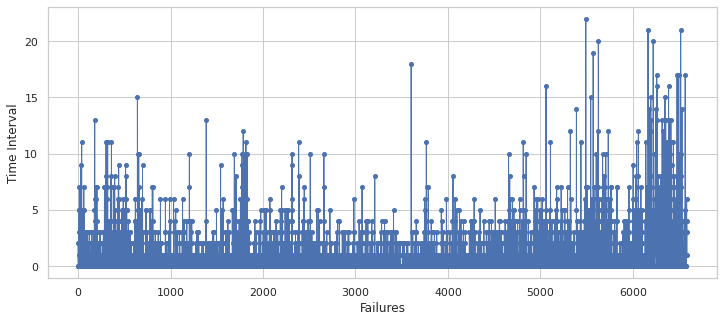

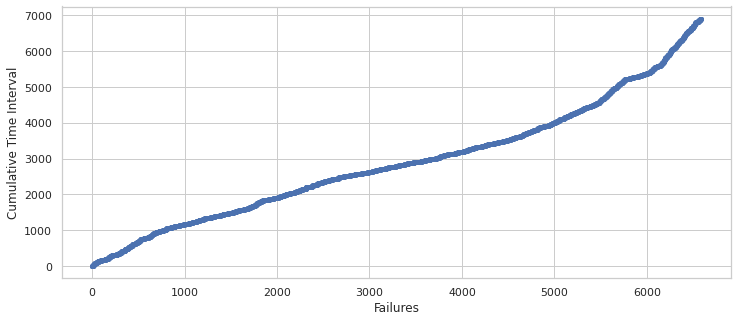

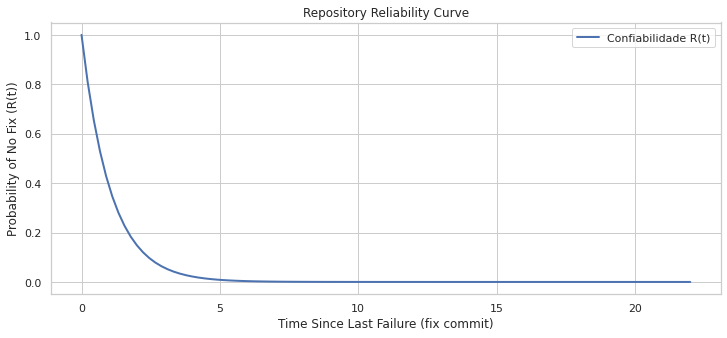

Confiabilidade R(1) = 0.3853
Confiabilidade R(5) = 0.0085
Confiabilidade R(10) = 0.0001
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'tomcat', 'R1': '0.3853', 'R5': '0.0085', 'R10': '0.0001', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,modules/jdbc-pool/test/org/apache/tomcat/jdbc/test/AlternateUsernameTest.java,3,0.500000,2.000000,0.135335
1,test/org/apache/catalina/mbeans/RegistrationTest.java,3,0.500000,2.000000,0.135335
2,test/org/apache/catalina/startup/TestWebRuleSet.java,3,0.500000,2.000000,0.135335
3,test/org/apache/catalina/servlets/TestDefaultServletRfc9110Section13Parameterized.java,3,0.500000,2.000000,0.135335
4,java/org/apache/tomcat/websocket/WsFrame.java,7,0.833333,1.200000,0.301194
...,...,...,...,...,...
1765,java/org/apache/jasper/el/VariableResolverImpl.java,2,4888.000000,0.000205,0.999795
1766,webapps/examples/WEB-INF/classes/listeners/SessionListener.java,2,4931.000000,0.000203,0.999797
1767,webapps/examples/WEB-INF/classes/listeners/ContextListener.java,2,4931.000000,0.000203,0.999797
1768,java/org/apache/catalina/ssi/SSIStopProcessingException.java,2,5596.000000,0.000179,0.999821


== checkstyle ==


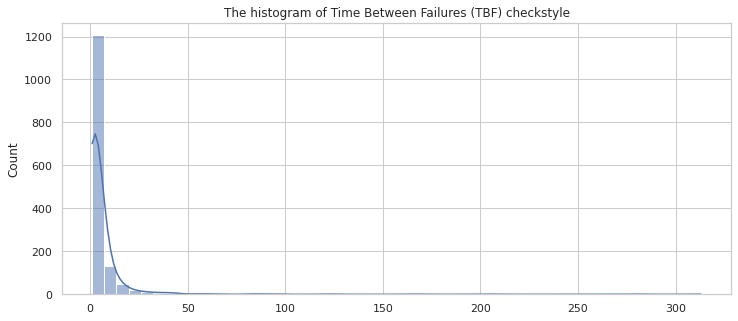

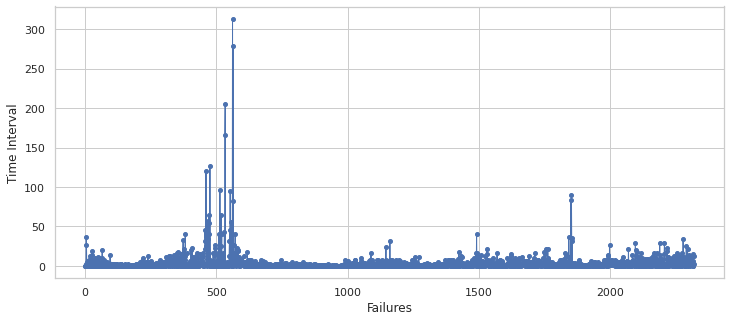

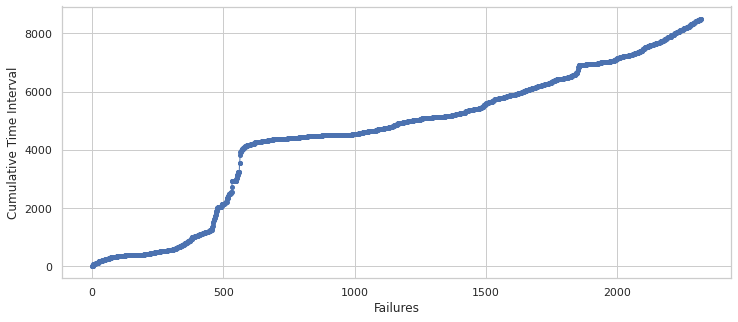

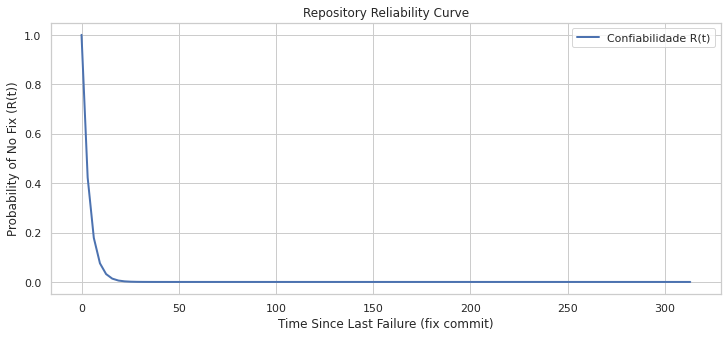

Confiabilidade R(1) = 0.7614
Confiabilidade R(5) = 0.2559
Confiabilidade R(10) = 0.0655
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'checkstyle', 'R1': '0.7614', 'R5': '0.2559', 'R10': '0.0655', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/test/java/com/puppycrawl/tools/checkstyle/grammar/antlr4/Antlr4AstRegressionTest.java,5,0.25,4.000000,0.018316
1,contrib/j2ee/src/checkstyle/com/puppycrawl/tools/checkstyle/checks/j2ee/EntityBeanEjbHomeCheck.java,3,0.50,2.000000,0.135335
2,contrib/j2ee/src/testinputs/com/puppycrawl/tools/checkstyle/InputEntityBean.java,2,1.00,1.000000,0.367879
3,src/it/resources/com/google/checkstyle/test/chapter4formatting/rule462horizontalwhitespace/InputWhitespaceAroundEmptyTypesAndCycles.java,2,1.00,1.000000,0.367879
4,contrib/j2ee/src/tests/AllTests.java,2,1.00,1.000000,0.367879
...,...,...,...,...,...
1185,src/checkstyle/com/puppycrawl/tools/checkstyle/checks/imports/ImportControlLoader.java,2,2969.00,0.000337,0.999663
1186,src/test/java/com/puppycrawl/tools/checkstyle/checks/coding/ReturnCountCheckTest.java,2,3000.00,0.000333,0.999667
1187,src/main/java/com/puppycrawl/tools/checkstyle/checks/naming/MethodTypeParameterNameCheck.java,2,3511.00,0.000285,0.999715
1188,src/main/java/com/puppycrawl/tools/checkstyle/checks/naming/InterfaceTypeParameterNameCheck.java,2,3737.00,0.000268,0.999732


== jasperreports ==


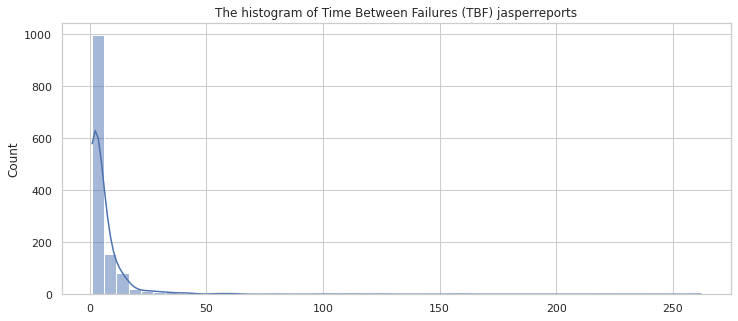

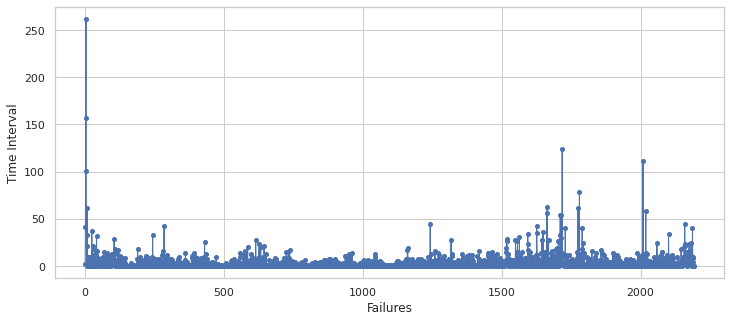

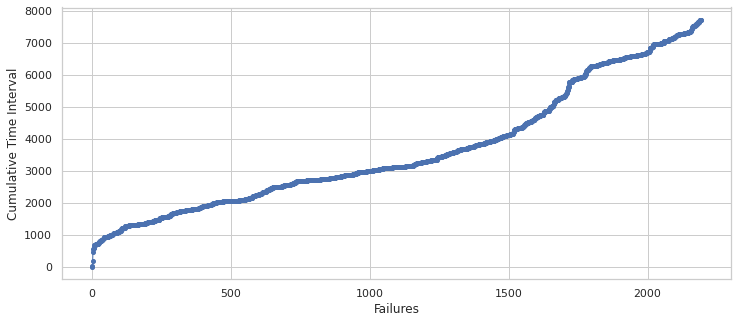

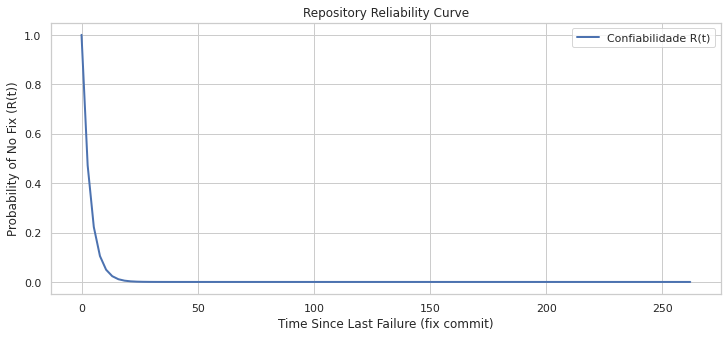

Confiabilidade R(1) = 0.7527
Confiabilidade R(5) = 0.2417
Confiabilidade R(10) = 0.0584
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'jasperreports', 'R1': '0.7527', 'R5': '0.2417', 'R10': '0.0584', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,jasperreports/demo/samples/spiderchartcomponent/src/net/sf/jasperreports/components/spiderchart/FillSpiderChart.java,5,0.500000,2.000000,0.135335
1,jasperreports/src/net/sf/jasperreports/engine/export/ooxml/CellHelper.java,4,0.666667,1.500000,0.223130
2,ext/charts/src/main/java/net/sf/jasperreports/charts/fill/JRFillChart.java,2,1.000000,1.000000,0.367879
3,core/src/main/java/net/sf/jasperreports/engine/convert/ConvertVisitor.java,2,1.000000,1.000000,0.367879
4,jasperreports/src/net/sf/jasperreports/data/cache/DataSnapshotException.java,2,1.000000,1.000000,0.367879
...,...,...,...,...,...
1630,jasperreports/src/net/sf/jasperreports/components/table/fill/TableReportScriptlet.java,2,4057.000000,0.000246,0.999754
1631,jasperreports/src/net/sf/jasperreports/engine/export/ooxml/XlsxStyleInfo.java,2,4234.000000,0.000236,0.999764
1632,jasperreports/src/net/sf/jasperreports/engine/JRSubreportReturnValue.java,2,5139.000000,0.000195,0.999805
1633,jasperreports/src/net/sf/jasperreports/engine/fill/JRExtendedIncrementerFactory.java,2,5285.000000,0.000189,0.999811


== commons-collections ==


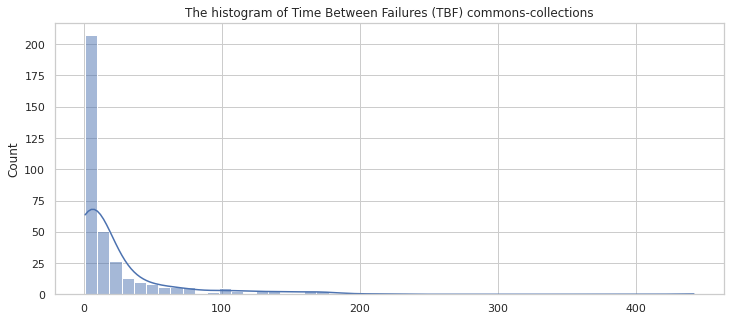

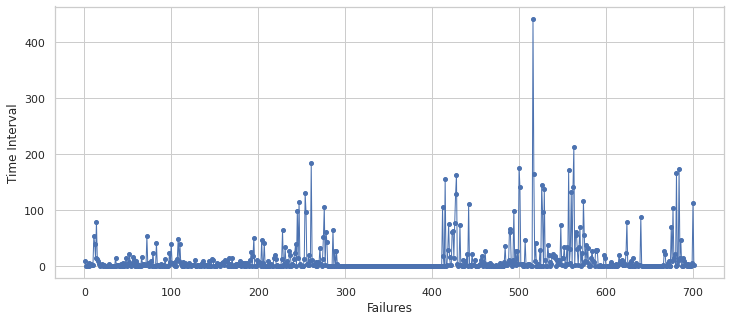

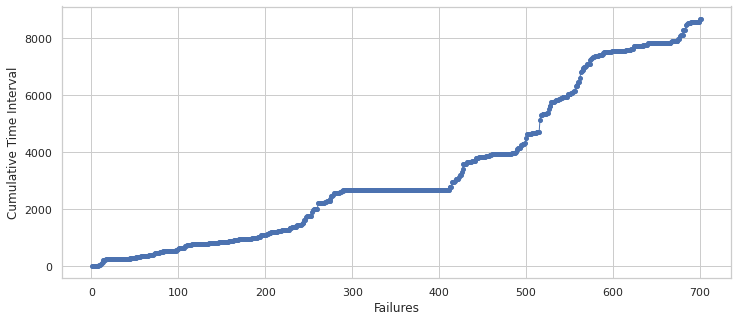

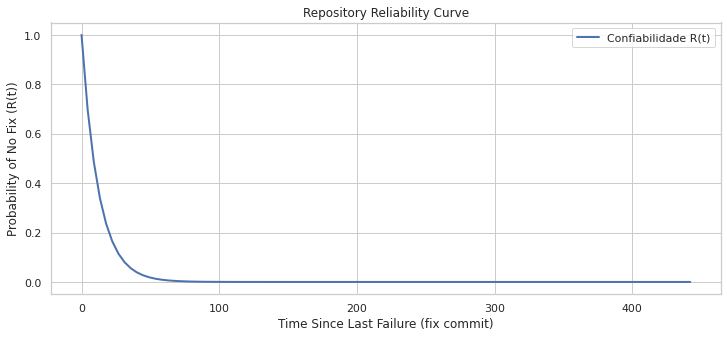

Confiabilidade R(1) = 0.9223
Confiabilidade R(5) = 0.6674
Confiabilidade R(10) = 0.4455
Confiabilidade R(50) = 0.0175
Confiabilidade R(100) = 0.0003
{'project': 'commons-collections', 'R1': '0.9223', 'R5': '0.6674', 'R10': '0.4455', 'R50': '0.0175', 'R100': '0.0003'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/java/org/apache/commons/collections/observed/ObservedList.java,2,1.0,1.000000,0.367879
1,src/java/org/apache/commons/collections/observed/standard/StandardPostModificationEvent.java,2,1.0,1.000000,0.367879
2,src/java/org/apache/commons/collections/IteratorChain.java,2,1.0,1.000000,0.367879
3,src/java/org/apache/commons/collections/observed/ModificationHandler.java,2,1.0,1.000000,0.367879
4,src/java/org/apache/commons/collections/observed/standard/StandardModificationHandler.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
762,src/main/java/org/apache/commons/collections4/collection/AbstractCollectionDecorator.java,2,2621.0,0.000382,0.999619
763,src/main/java/org/apache/commons/collections4/iterators/LazyIteratorChain.java,2,2621.0,0.000382,0.999619
764,src/main/java/org/apache/commons/collections4/map/StaticBucketMap.java,2,2621.0,0.000382,0.999619
765,src/main/java/org/apache/commons/collections4/ArrayStack.java,2,2621.0,0.000382,0.999619


== xalan-java ==


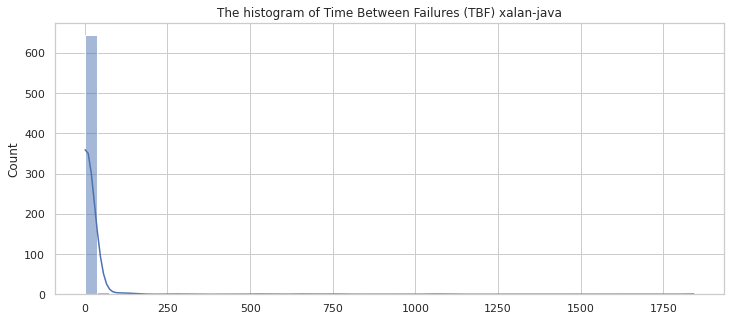

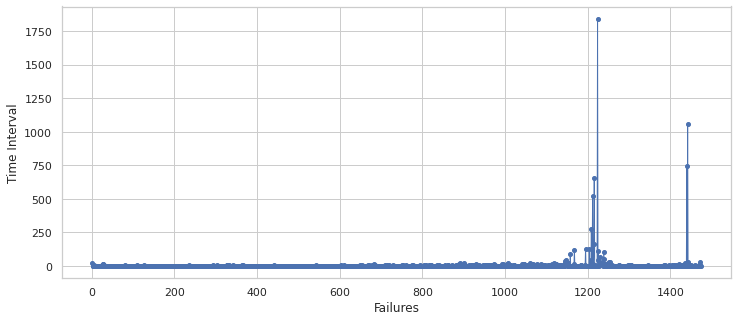

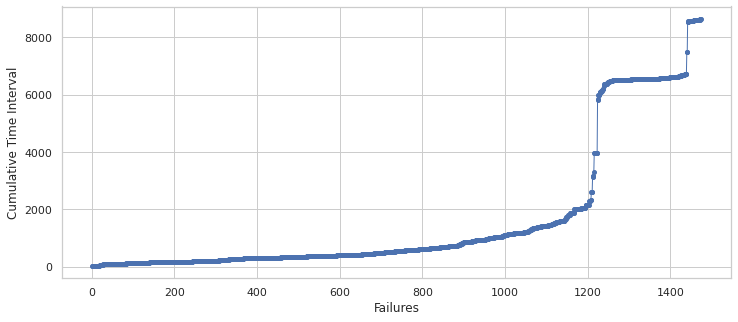

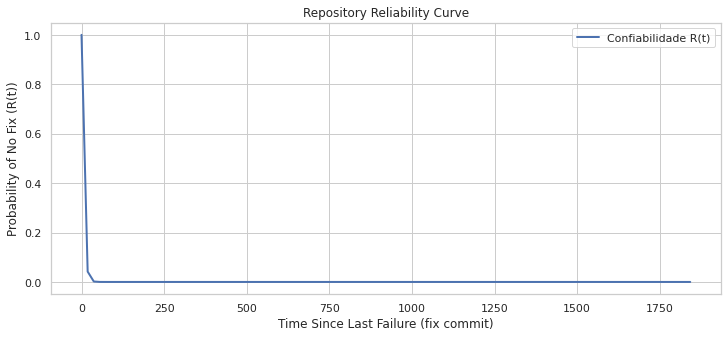

Confiabilidade R(1) = 0.8432
Confiabilidade R(5) = 0.4263
Confiabilidade R(10) = 0.1817
Confiabilidade R(50) = 0.0002
Confiabilidade R(100) = 0.0000
{'project': 'xalan-java', 'R1': '0.8432', 'R5': '0.4263', 'R10': '0.1817', 'R50': '0.0002', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/org/apache/xalan/xslt/XSLTResultTarget.java,2,1.0,1.000000,0.367879
1,src/org/apache/xml/serializer/EncodingInfo.java,2,1.0,1.000000,0.367879
2,src/org/apache/xalan/extensions/ExtensionFunctionHandler.java,2,1.0,1.000000,0.367879
3,serializer/src/main/java/org/apache/xml/serializer/ToStream.java,2,1.0,1.000000,0.367879
4,compat_src/org/apache/xalan/xpath/xml/ProblemListenerDefault.java,3,1.0,1.000000,0.367879
...,...,...,...,...,...
613,src/org/apache/xpath/jaxp/XPathExpressionImpl.java,2,6068.0,0.000165,0.999835
614,src/org/apache/xml/serializer/Version.java,2,6462.0,0.000155,0.999845
615,src/org/apache/xml/serializer/ToHTMLSAXHandler.java,2,7447.0,0.000134,0.999866
616,src/org/apache/xalan/xsltc/compiler/XPathParser.java,2,8030.0,0.000125,0.999875


== SimianArmy ==


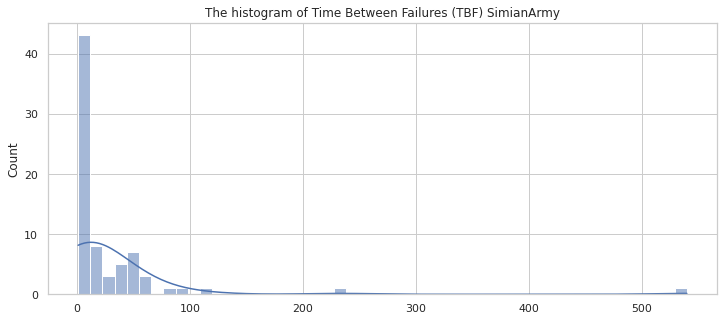

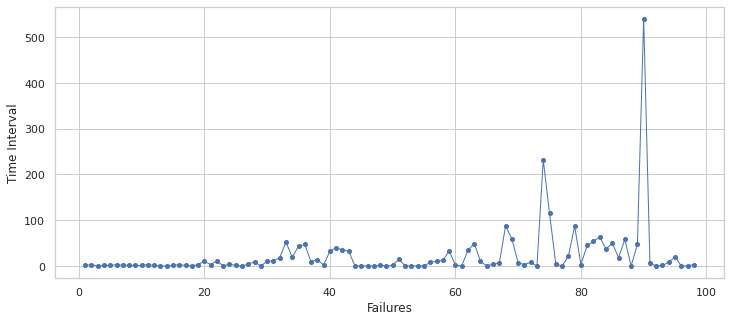

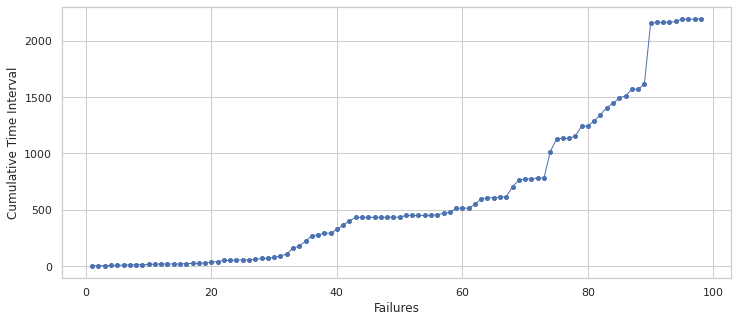

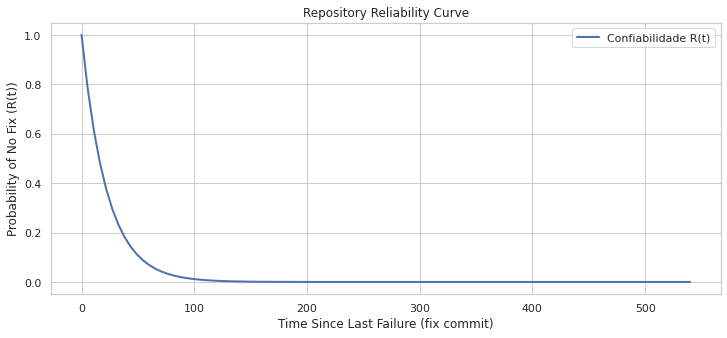

Confiabilidade R(1) = 0.9563
Confiabilidade R(5) = 0.7998
Confiabilidade R(10) = 0.6398
Confiabilidade R(50) = 0.1072
Confiabilidade R(100) = 0.0115
{'project': 'SimianArmy', 'R1': '0.9563', 'R5': '0.7998', 'R10': '0.6398', 'R50': '0.1072', 'R100': '0.0115'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/main/java/com/netflix/simianarmy/client/libvirt/VSphereClient.java,3,2.500000,0.400000,0.670320
1,src/main/java/com/netflix/simianarmy/chaos/ChaosType.java,4,5.666667,0.176471,0.838223
2,src/main/java/com/netflix/simianarmy/Monkey.java,3,6.000000,0.166667,0.846482
3,src/main/java/com/netflix/simianarmy/MonkeyRunner.java,3,6.500000,0.153846,0.857404
4,src/main/java/com/netflix/simianarmy/janitor/AbstractJanitor.java,2,7.000000,0.142857,0.866878
...,...,...,...,...,...
35,src/test/java/com/netflix/simianarmy/basic/TestBasicScheduler.java,2,497.000000,0.002012,0.997990
36,src/main/java/com/netflix/simianarmy/basic/conformity/BasicConformityMonkeyContext.java,2,736.000000,0.001359,0.998642
37,src/test/java/com/netflix/simianarmy/janitor/TestAbstractJanitor.java,2,1030.000000,0.000971,0.999030
38,src/main/java/com/netflix/simianarmy/aws/conformity/crawler/AWSClusterCrawler.java,2,1044.000000,0.000958,0.999043


== poi ==


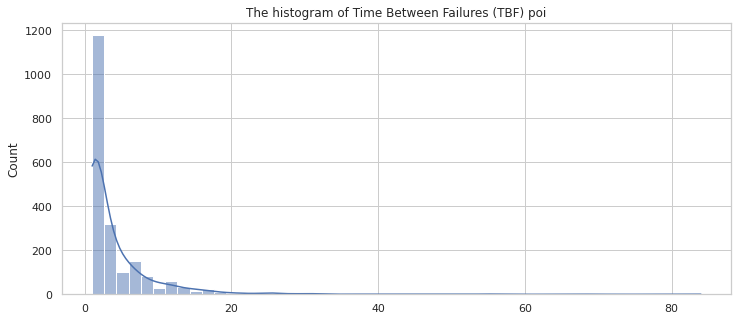

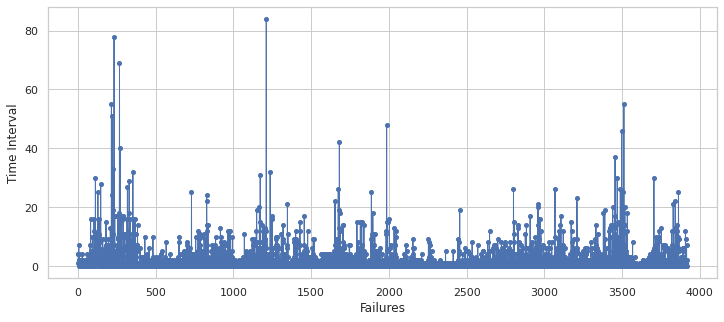

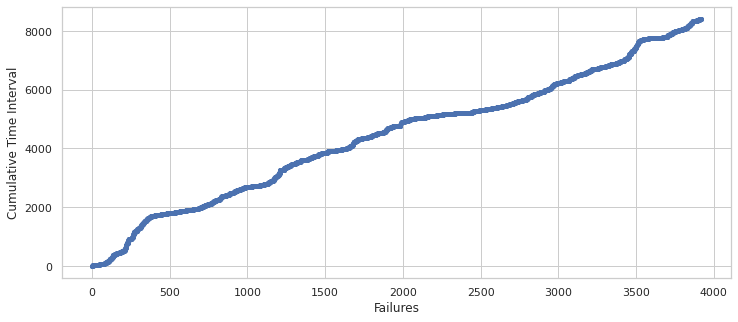

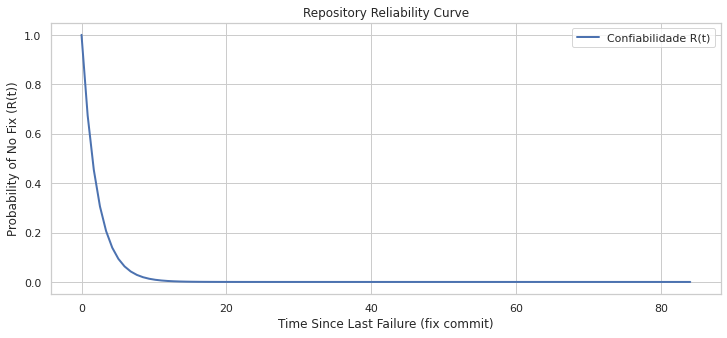

Confiabilidade R(1) = 0.6277
Confiabilidade R(5) = 0.0974
Confiabilidade R(10) = 0.0095
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'poi', 'R1': '0.6277', 'R5': '0.0974', 'R10': '0.0095', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/java/org/apache/poi/ss/util/BorderPropertyTemplate.java,4,0.333333,3.000000,0.049787
1,src/ooxml/testcases/org/apache/poi/xddf/usermodel/TestNecessaryOOXMLClasses.java,4,0.333333,3.000000,0.049787
2,src/testcases/org/apache/poi/ss/util/TestCellRangeUtil.java,3,0.500000,2.000000,0.135335
3,poi/src/main/java/org/apache/poi/poifs/storage/HeaderBlock.java,3,0.500000,2.000000,0.135335
4,poi-scratchpad/src/main/java/org/apache/poi/hslf/record/AnimationInfoAtom.java,2,1.000000,1.000000,0.367879
...,...,...,...,...,...
2875,src/scratchpad/src/org/apache/poi/hslf/record/EscherTextboxWrapper.java,2,5021.000000,0.000199,0.999801
2876,src/java/org/apache/poi/hssf/eventusermodel/HSSFListener.java,2,5486.000000,0.000182,0.999818
2877,src/scratchpad/src/org/apache/poi/hwpf/usermodel/Section.java,2,5644.000000,0.000177,0.999823
2878,src/scratchpad/testcases/org/apache/poi/hwpf/model/TestSectionTable.java,2,5741.000000,0.000174,0.999826


== byte-buddy ==


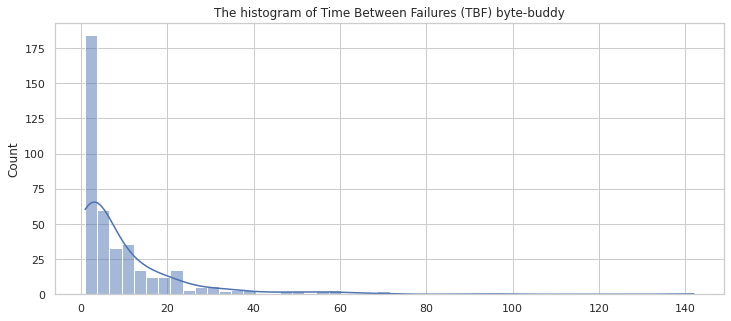

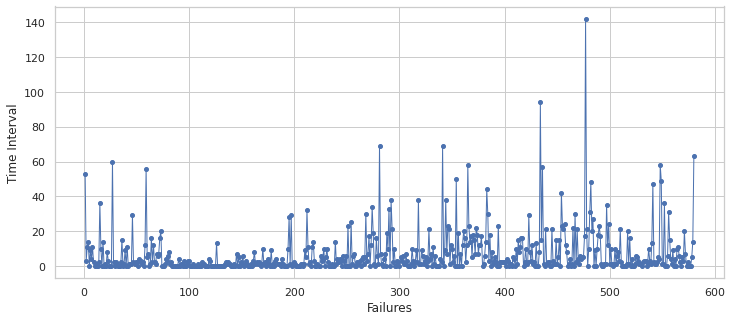

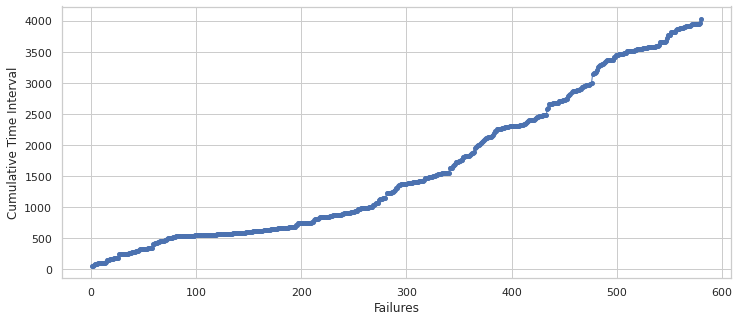

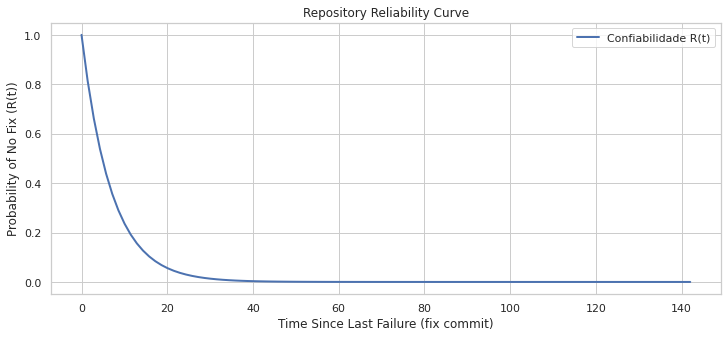

Confiabilidade R(1) = 0.8660
Confiabilidade R(5) = 0.4870
Confiabilidade R(10) = 0.2372
Confiabilidade R(50) = 0.0008
Confiabilidade R(100) = 0.0000
{'project': 'byte-buddy', 'R1': '0.8660', 'R5': '0.4870', 'R10': '0.2372', 'R50': '0.0008', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/main/java/com/blogspot/mydailyjava/bytebuddy/dynamic/scaffold/subclass/SubclassInstrumentationContextDelegate.java,3,0.5,2.000000,0.135335
1,src/main/java/com/blogspot/mydailyjava/bytebuddy/instrumentation/method/bytecode/stack/constant/IntegerConstant.java,2,1.0,1.000000,0.367879
2,src/test/java/com/blogspot/mydailyjava/bytebuddy/instrumentation/MethodDelegationSuperTest.java,2,1.0,1.000000,0.367879
3,src/main/java/com/blogspot/mydailyjava/bytebuddy/instrumentation/Exceptional.java,2,1.0,1.000000,0.367879
4,byte-buddy-dep/src/test/java/net/bytebuddy/dynamic/scaffold/MethodGraphCompilerDefaultKeyTest.java,3,1.0,1.000000,0.367879
...,...,...,...,...,...
381,byte-buddy-dep/src/main/java/net/bytebuddy/matcher/MethodSortMatcher.java,2,1626.0,0.000615,0.999385
382,byte-buddy-dep/src/main/java/net/bytebuddy/dynamic/TargetType.java,2,1682.0,0.000595,0.999406
383,byte-buddy-dep/src/test/java/net/bytebuddy/implementation/InvocationHandlerAdapterTest.java,2,1786.0,0.000560,0.999440
384,byte-buddy-dep/src/test/java/net/bytebuddy/implementation/MethodDelegationOriginTest.java,2,1786.0,0.000560,0.999440


== junit5 ==


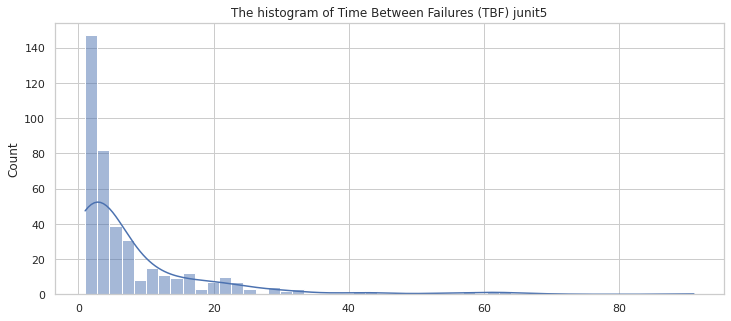

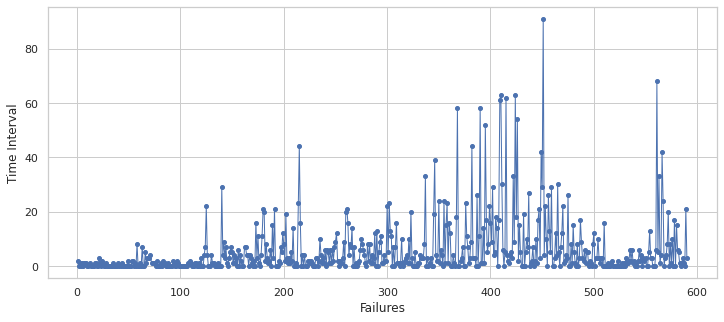

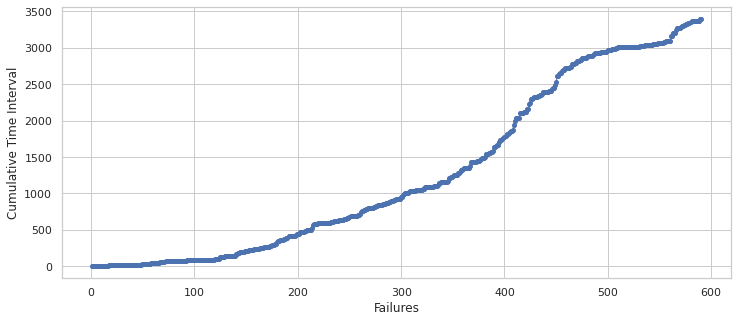

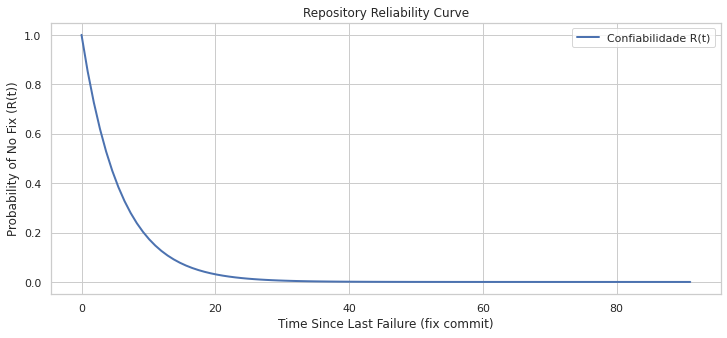

Confiabilidade R(1) = 0.8406
Confiabilidade R(5) = 0.4196
Confiabilidade R(10) = 0.1761
Confiabilidade R(50) = 0.0002
Confiabilidade R(100) = 0.0000
{'project': 'junit5', 'R1': '0.8406', 'R5': '0.4196', 'R10': '0.1761', 'R50': '0.0002', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,junit-console/src/main/java/org/junit/gen5/console/tasks/XmlReportWriter.java,4,0.333333,3.000000,0.049787
1,junit-tests/src/test/java/org/junit/gen5/console/tasks/XmlReportsWritingListenerTests.java,4,0.666667,1.500000,0.223130
2,junit5-engine/src/test/java/org/junit/gen5/engine/junit5/SpecificationResolverTest.java,7,0.666667,1.500000,0.223130
3,junit5-engine/src/test/java/org/junit/gen5/engine/junit5/JUnit5TestEngineTests.java,14,0.923077,1.083333,0.338465
4,junit-tests/src/test/java/org/junit/gen5/engine/junit4/JUnit4TestEngineClassExecutionTests.java,2,1.000000,1.000000,0.367879
...,...,...,...,...,...
233,junit-platform-engine/src/main/java/org/junit/platform/engine/support/hierarchical/NodeTreeWalker.java,2,2119.000000,0.000472,0.999528
234,platform-tests/src/test/java/org/junit/platform/engine/discovery/DiscoverySelectorsTests.java,2,2214.000000,0.000452,0.999548
235,junit-platform-engine/src/main/java/org/junit/platform/engine/discovery/MethodSelector.java,2,2214.000000,0.000452,0.999548
236,junit-jupiter-engine/src/test/java/org/junit/jupiter/api/condition/EnabledOnJreIntegrationTests.java,2,2218.000000,0.000451,0.999549


== velocity-engine ==


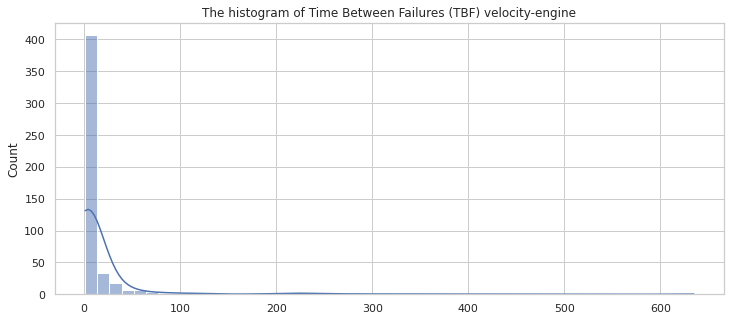

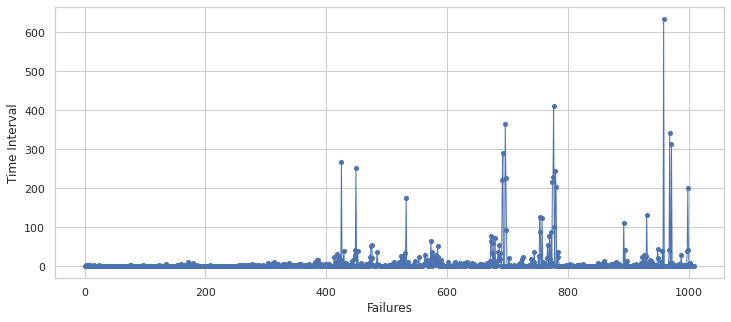

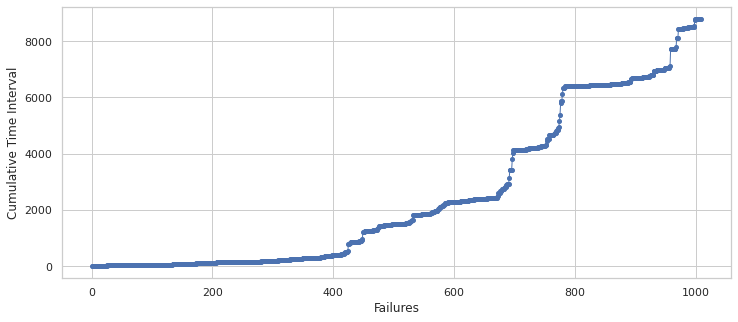

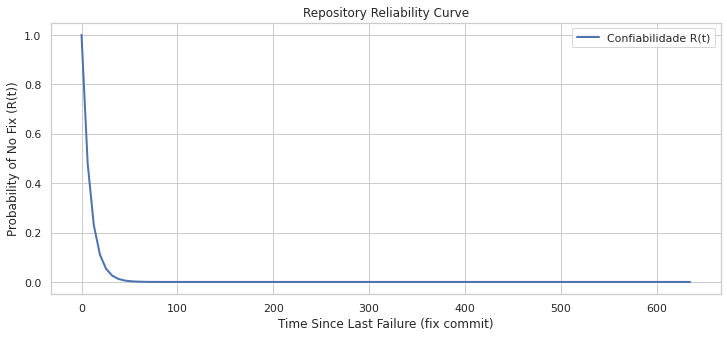

Confiabilidade R(1) = 0.8917
Confiabilidade R(5) = 0.5639
Confiabilidade R(10) = 0.3180
Confiabilidade R(50) = 0.0033
Confiabilidade R(100) = 0.0000
{'project': 'velocity-engine', 'R1': '0.8917', 'R5': '0.5639', 'R10': '0.3180', 'R50': '0.0033', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/java/org/apache/velocity/runtime/configuration/Configurations.java,2,1.0,1.000000,0.367879
1,src/java/org/apache/velocity/util/introspection/ClassMethodMap.java,2,1.0,1.000000,0.367879
2,src/java/org/apache/velocity/runtime/parser/ASTReference.java,2,2.0,0.500000,0.606531
3,src/test/org/apache/velocity/test/issues/Velocity682TestCase.java,2,2.0,0.500000,0.606531
4,src/test/org/apache/velocity/test/ClasspathResourceTestCase.java,2,2.0,0.500000,0.606531
...,...,...,...,...,...
497,src/java/org/apache/velocity/runtime/parser/node/ASTprocess.java,2,1835.0,0.000545,0.999455
498,src/java/org/apache/velocity/runtime/parser/Token.java,2,1838.0,0.000544,0.999456
499,src/java/org/apache/velocity/util/SimplePool.java,2,1998.0,0.000501,0.999500
500,velocity-engine-core/src/main/java/org/apache/velocity/runtime/parser/node/SetPropertyExecutor.java,2,2055.0,0.000487,0.999514


== junit4 ==


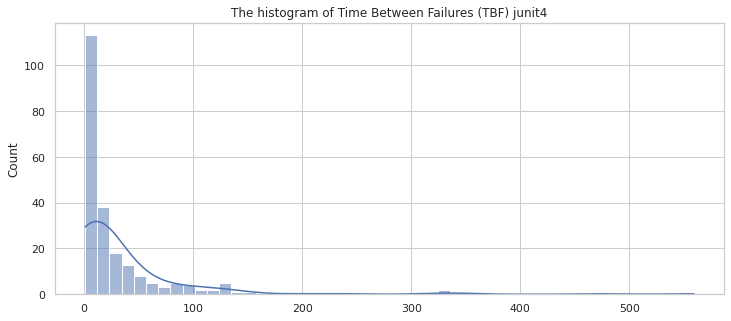

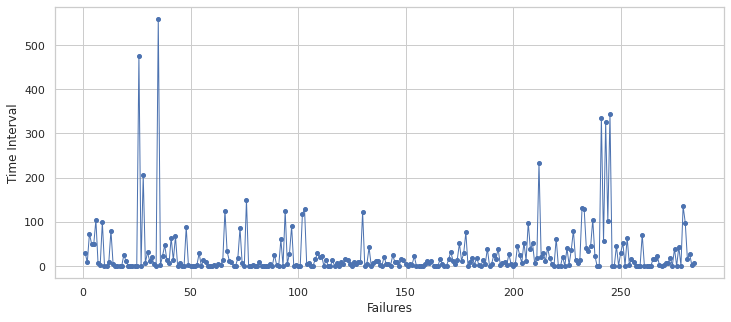

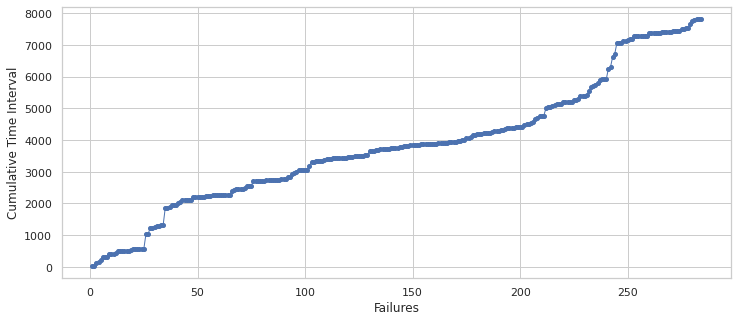

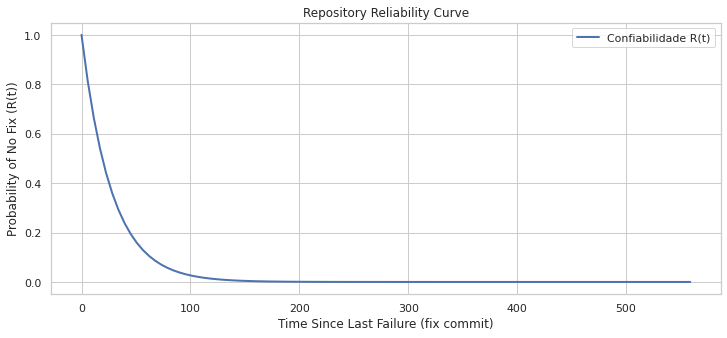

Confiabilidade R(1) = 0.9644
Confiabilidade R(5) = 0.8340
Confiabilidade R(10) = 0.6956
Confiabilidade R(50) = 0.1629
Confiabilidade R(100) = 0.0265
{'project': 'junit4', 'R1': '0.9644', 'R5': '0.8340', 'R10': '0.6956', 'R50': '0.1629', 'R100': '0.0265'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/org/junit/internal/runners/model/TestMethod.java,3,0.5,2.000000,0.135335
1,src/org/junit/internal/runners/links/WithTimeout.java,2,1.0,1.000000,0.367879
2,src/org/junit/internal/runners/links/ExpectingException.java,2,1.0,1.000000,0.367879
3,src/org/junit/internal/runners/links/Link.java,2,1.0,1.000000,0.367879
4,src/org/junit/internal/runners/links/WithBeforeAndAfter.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
154,src/main/java/org/junit/experimental/theories/internal/Assignments.java,2,2692.0,0.000371,0.999629
155,src/main/java/org/junit/internal/TextListener.java,2,2707.0,0.000369,0.999631
156,src/main/java/org/junit/runner/FilterFactories.java,2,2807.0,0.000356,0.999644
157,src/main/java/org/junit/experimental/max/MaxHistory.java,2,3444.0,0.000290,0.999710


== antlr3 ==


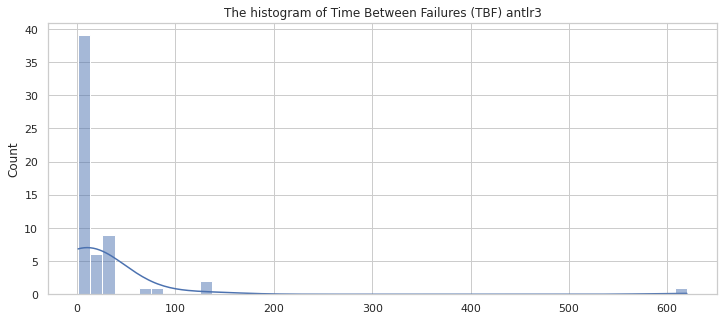

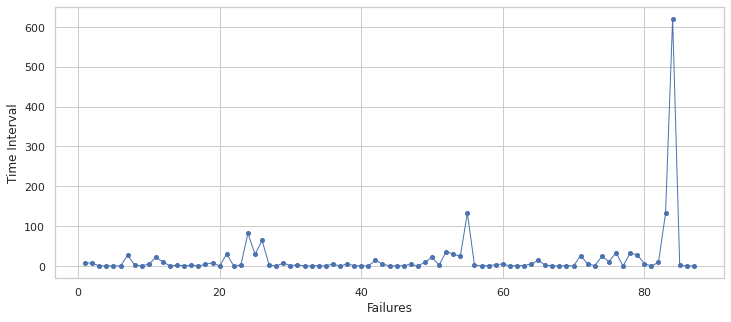

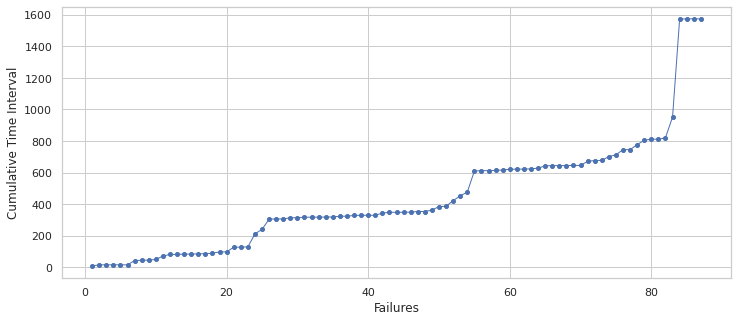

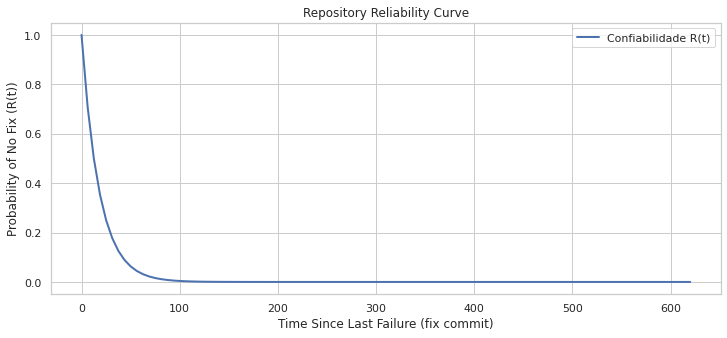

Confiabilidade R(1) = 0.9462
Confiabilidade R(5) = 0.7585
Confiabilidade R(10) = 0.5754
Confiabilidade R(50) = 0.0631
Confiabilidade R(100) = 0.0040
{'project': 'antlr3', 'R1': '0.9462', 'R5': '0.7585', 'R10': '0.5754', 'R50': '0.0631', 'R100': '0.0040'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,tool/src/main/java/org/antlr/tool/BuildDependencyGenerator.java,2,24.00,0.041667,0.959189
1,tool/src/main/java/org/antlr/codegen/CodeGenerator.java,5,140.75,0.007105,0.992920
2,tool/src/test/java/org/antlr/test/BaseTest.java,3,147.00,0.006803,0.993220
3,tool/src/main/java/org/antlr/analysis/SemanticContext.java,2,285.00,0.003509,0.996497
4,tool/src/main/java/org/antlr/tool/LeftRecursiveRuleAnalyzer.java,2,294.00,0.003401,0.996604
5,runtime/Java/src/main/java/org/antlr/runtime/tree/BaseTree.java,2,315.00,0.003175,0.996830
6,tool/src/main/java/org/antlr/tool/GrammarAST.java,3,317.50,0.003150,0.996855
7,tool/src/main/java/org/antlr/misc/IntervalSet.java,2,349.00,0.002865,0.997139
8,tool/src/main/java/org/antlr/Tool.java,2,620.00,0.001613,0.998388


== commons-io ==


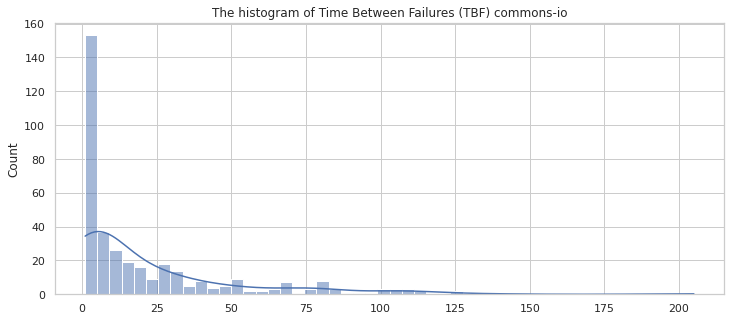

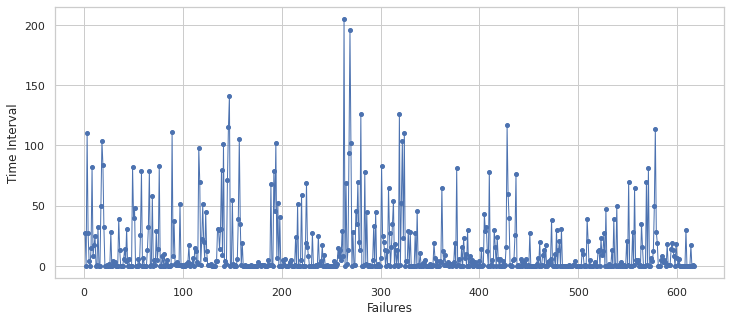

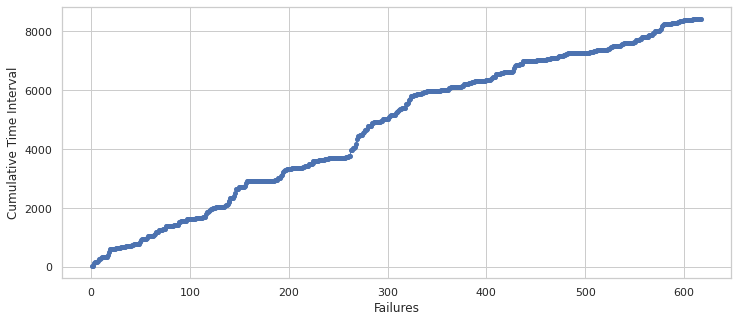

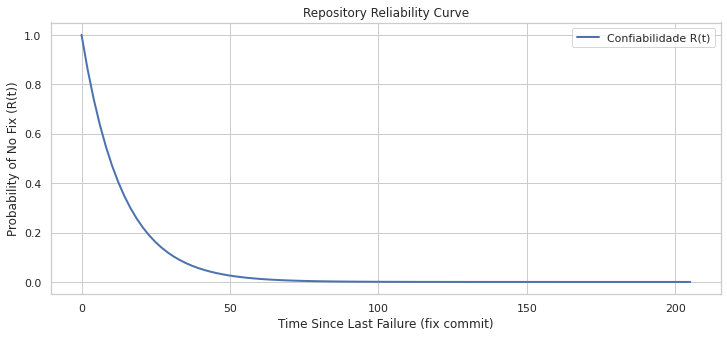

Confiabilidade R(1) = 0.9294
Confiabilidade R(5) = 0.6934
Confiabilidade R(10) = 0.4808
Confiabilidade R(50) = 0.0257
Confiabilidade R(100) = 0.0007
{'project': 'commons-io', 'R1': '0.9294', 'R5': '0.6934', 'R10': '0.4808', 'R50': '0.0257', 'R100': '0.0007'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/test/java/org/apache/commons/io/FileUtilsListFilesTest.java,3,0.50,2.000000,0.135335
1,src/test/java/org/apache/commons/io/DeleteDirectoryTest.java,3,0.50,2.000000,0.135335
2,src/java/org/apache/commons/io/input/Tailer.java,5,0.75,1.333333,0.263597
3,src/test/java/org/apache/commons/io/ThreadMonitorTestCase.java,2,1.00,1.000000,0.367879
4,src/test/java/org/apache/commons/io/FileCleaningTrackerTestCase.java,2,1.00,1.000000,0.367879
...,...,...,...,...,...
208,src/main/java/org/apache/commons/io/input/UnixLineEndingInputStream.java,2,3050.00,0.000328,0.999672
209,src/main/java/org/apache/commons/io/input/TailerListenerAdapter.java,2,3435.00,0.000291,0.999709
210,src/main/java/org/apache/commons/io/input/TailerListener.java,2,3435.00,0.000291,0.999709
211,src/main/java/org/apache/commons/io/input/NullReader.java,2,3556.00,0.000281,0.999719


== xerces2-j ==


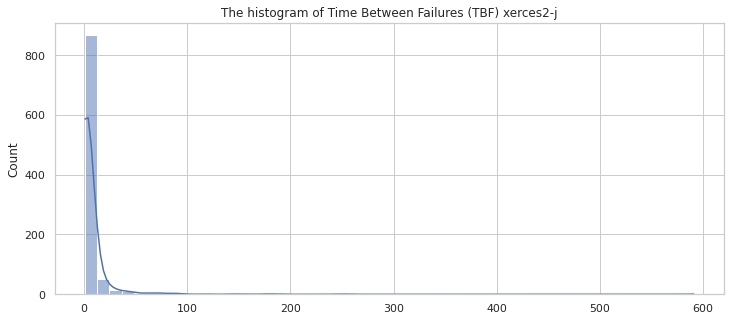

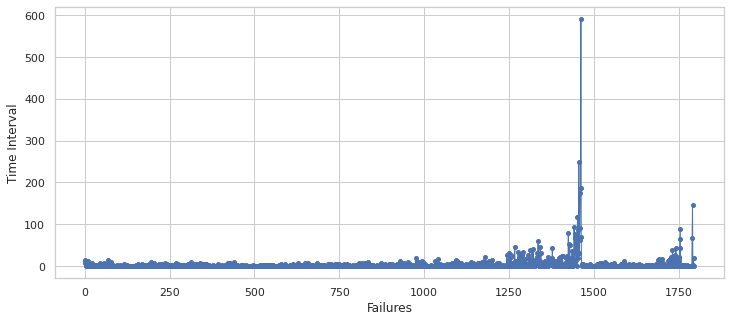

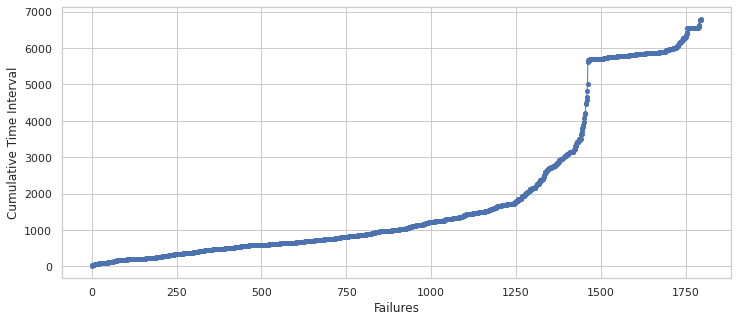

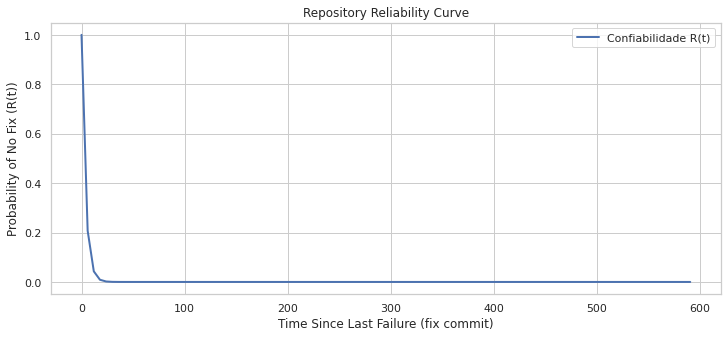

Confiabilidade R(1) = 0.7681
Confiabilidade R(5) = 0.2674
Confiabilidade R(10) = 0.0715
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'xerces2-j', 'R1': '0.7681', 'R5': '0.2674', 'R10': '0.0715', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/org/apache/xerces/impl/v2/XSWildcardDecl.java,2,1.000000,1.000000,0.367879
1,src/org/apache/xerces/utils/regex/ParserForXMLSchema.java,2,1.000000,1.000000,0.367879
2,tests/dom/events/DeferredDOM.java,2,1.000000,1.000000,0.367879
3,src/org/apache/xerces/impl/v2/XSDHandler.java,24,2.695652,0.370968,0.690066
4,src/org/apache/xerces/impl/v2/SchemaValidator.java,17,2.812500,0.355556,0.700784
...,...,...,...,...,...
623,src/org/apache/html/dom/HTMLCollectionImpl.java,3,1794.500000,0.000557,0.999443
624,src/org/apache/xerces/jaxp/validation/StAXValidatorHelper.java,2,2324.000000,0.000430,0.999570
625,src/org/apache/xerces/util/MessageFormatter.java,2,2789.000000,0.000359,0.999642
626,samples/sax/Counter.java,2,2908.000000,0.000344,0.999656


== giraph ==


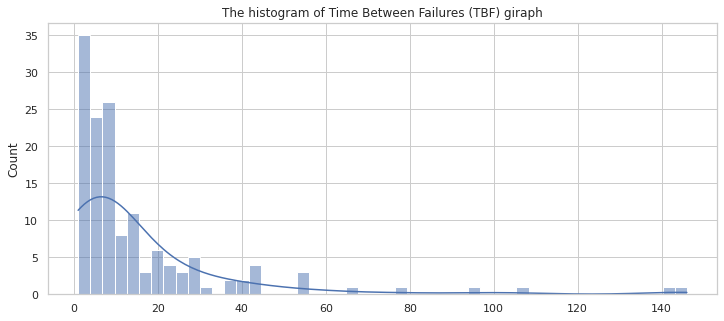

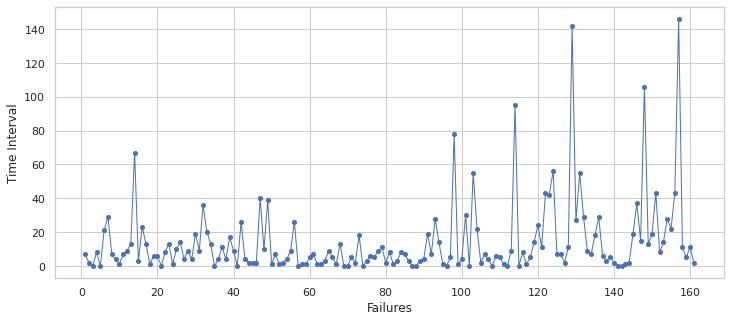

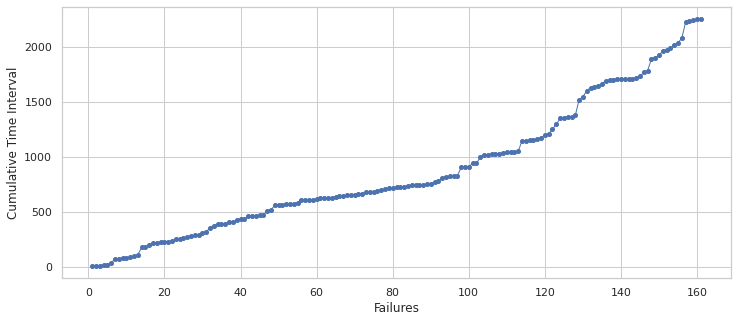

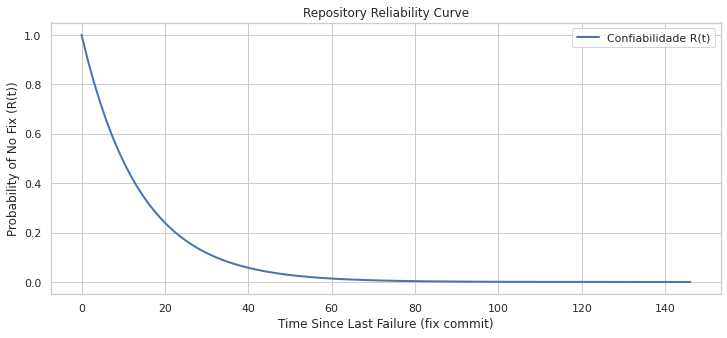

Confiabilidade R(1) = 0.9310
Confiabilidade R(5) = 0.6996
Confiabilidade R(10) = 0.4894
Confiabilidade R(50) = 0.0281
Confiabilidade R(100) = 0.0008
{'project': 'giraph', 'R1': '0.9310', 'R5': '0.6996', 'R10': '0.4894', 'R50': '0.0281', 'R100': '0.0008'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/main/java/com/yahoo/hadoop_bsp/examples/TestFailVertex.java,2,1.0,1.000000,0.367879
1,src/main/java/com/yahoo/hadoop_bsp/BspResolver.java,2,1.0,1.000000,0.367879
2,src/test/java/com/yahoo/hadoop_bsp/SimpleBspTest.java,2,1.0,1.000000,0.367879
3,src/main/java/com/yahoo/hadoop_bsp/BspUtils.java,2,1.0,1.000000,0.367879
4,src/main/java/org/apache/giraph/GiraphRunner.java,3,3.0,0.333333,0.716531
...,...,...,...,...,...
146,giraph-core/src/main/java/org/apache/giraph/comm/messages/primitives/IntByteArrayMessageStore.java,2,970.0,0.001031,0.998970
147,giraph-core/src/main/java/org/apache/giraph/comm/requests/RequestType.java,2,1078.0,0.000928,0.999073
148,giraph-core/src/main/java/org/apache/giraph/graph/AddressesAndPartitionsWritable.java,2,1239.0,0.000807,0.999193
149,giraph-core/src/test/java/org/apache/giraph/BspCase.java,2,1251.0,0.000799,0.999201


== java-design-patterns ==


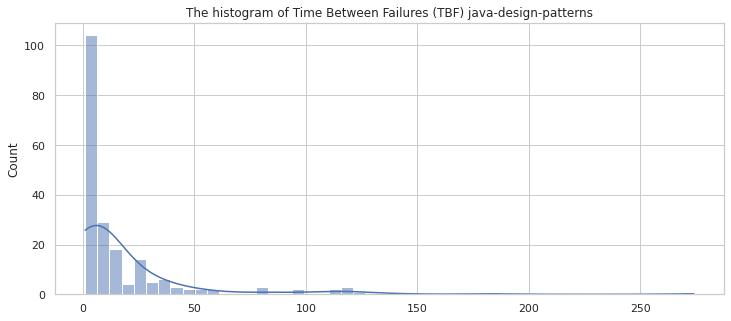

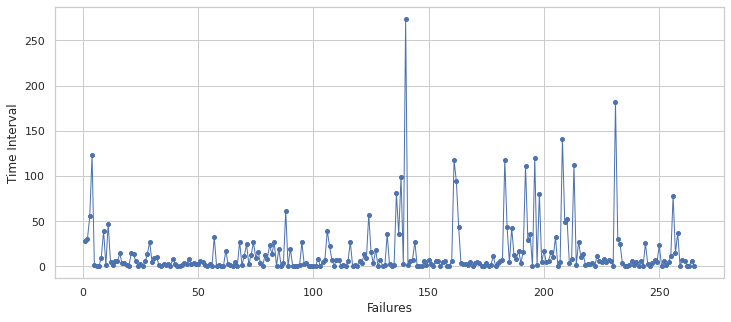

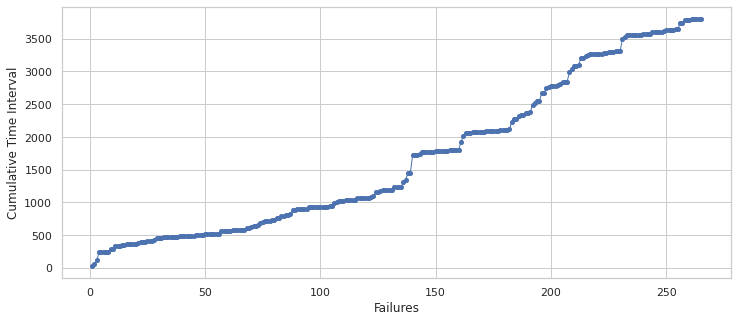

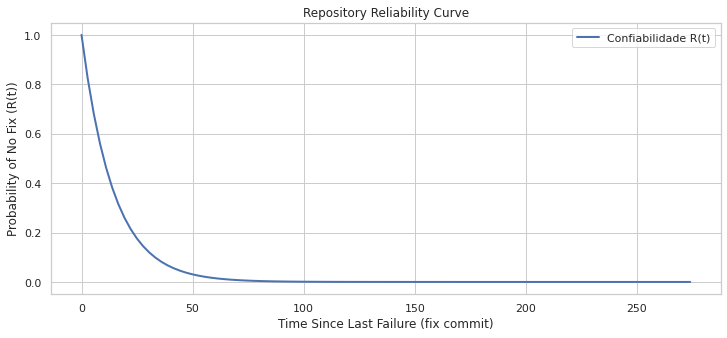

Confiabilidade R(1) = 0.9327
Confiabilidade R(5) = 0.7057
Confiabilidade R(10) = 0.4981
Confiabilidade R(50) = 0.0307
Confiabilidade R(100) = 0.0009
{'project': 'java-design-patterns', 'R1': '0.9327', 'R5': '0.7057', 'R10': '0.4981', 'R50': '0.0307', 'R100': '0.0009'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,monad/src/test/java/com/iluwatar/monad/MonadTest.java,2,1.0,1.000000,0.367879
1,filterer/src/main/java/com/iluwatar/filterer/App.java,2,1.0,1.000000,0.367879
2,reader-writer-lock/src/test/java/com/iluwatar/reader/writer/lock/ReaderAndWriterTest.java,4,1.0,1.000000,0.367879
3,reader-writer-lock/src/test/java/com/iluwatar/reader/writer/lock/WriterTest.java,3,1.5,0.666667,0.513417
4,reader-writer-lock/src/test/java/com/iluwatar/reader/writer/lock/ReaderTest.java,3,1.5,0.666667,0.513417
...,...,...,...,...,...
163,visitor/src/main/java/com/iluwatar/visitor/SergeantVisitor.java,2,2426.0,0.000412,0.999588
164,visitor/src/main/java/com/iluwatar/visitor/CommanderVisitor.java,2,2426.0,0.000412,0.999588
165,observer/src/test/java/com/iluwatar/observer/generic/GHobbitsTest.java,2,3004.0,0.000333,0.999667
166,execute-around/src/test/java/com/iluwatar/execute/around/SimpleFileWriterTest.java,2,3053.0,0.000328,0.999673


== derby ==


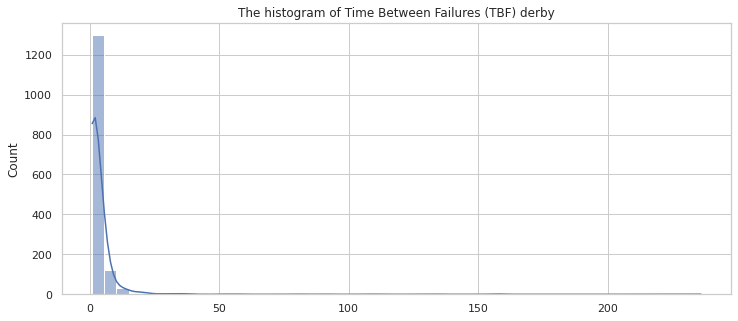

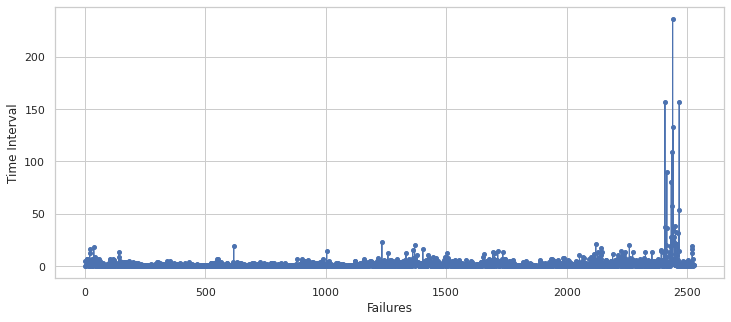

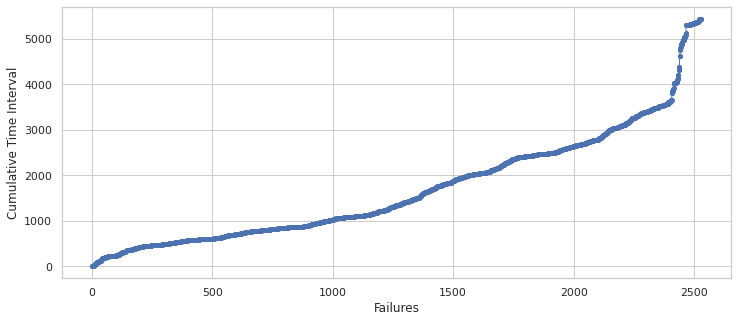

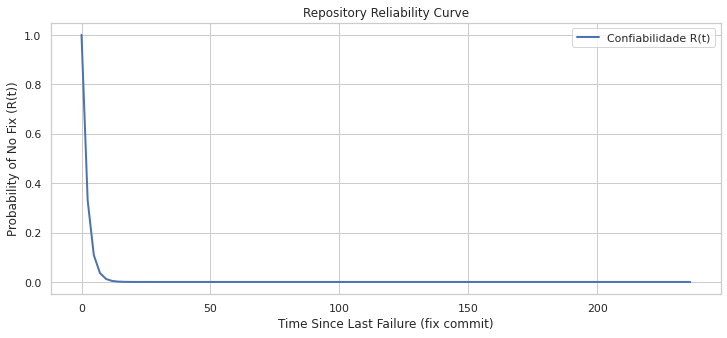

Confiabilidade R(1) = 0.6281
Confiabilidade R(5) = 0.0977
Confiabilidade R(10) = 0.0095
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'derby', 'R1': '0.6281', 'R5': '0.0977', 'R10': '0.0095', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,java/testing/org/apache/derbyTesting/functionTests/tests/lang/RawDBReaderTest.java,3,0.5,2.000000,0.135335
1,java/testing/org/apache/derbyTesting/functionTests/tests/store/EncryptionKeyTest.java,2,1.0,1.000000,0.367879
2,java/testing/org/apache/derbyTesting/functionTests/tests/upgradeTests/DriverUnloader.java,2,1.0,1.000000,0.367879
3,java/engine/org/apache/derby/catalog/types/UserDefinedTypeIdImpl.java,2,1.0,1.000000,0.367879
4,java/testing/org/apache/derbyTesting/functionTests/util/JDBC.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
1220,java/build/org/apache/derbyBuild/ClassSizeCrawler.java,2,3563.0,0.000281,0.999719
1221,java/engine/org/apache/derby/impl/sql/execute/IndexChanger.java,2,3699.0,0.000270,0.999730
1222,java/engine/org/apache/derby/iapi/types/SQLLongint.java,2,4114.0,0.000243,0.999757
1223,java/engine/org/apache/derby/iapi/types/SQLBoolean.java,2,4114.0,0.000243,0.999757


== hadoop ==


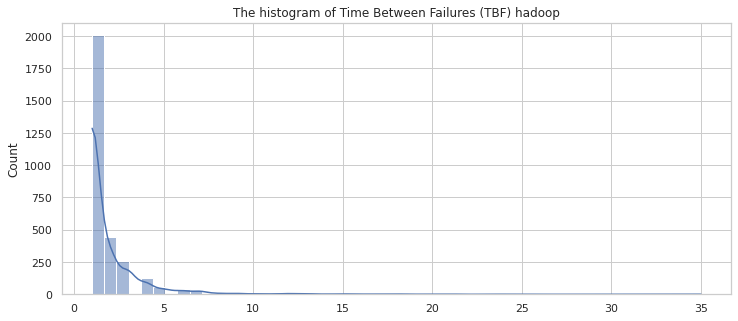

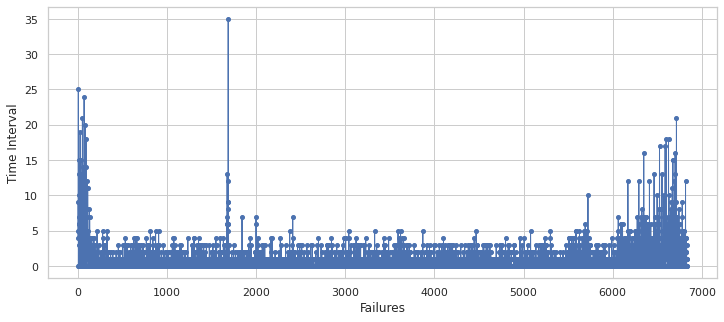

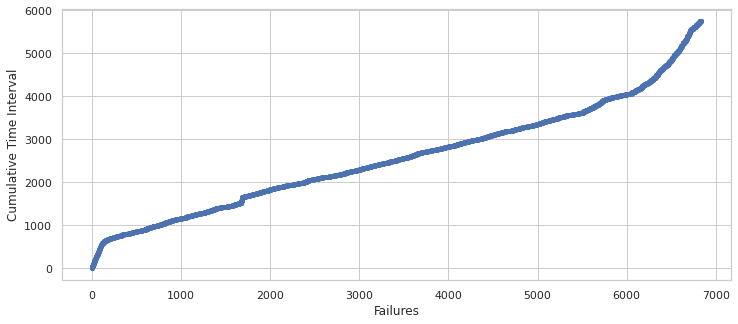

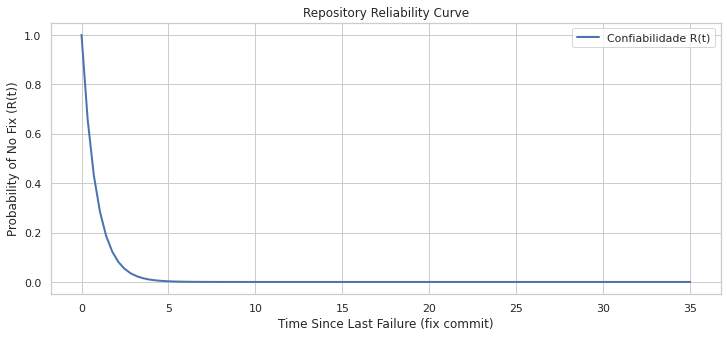

Confiabilidade R(1) = 0.3053
Confiabilidade R(5) = 0.0027
Confiabilidade R(10) = 0.0000
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'hadoop', 'R1': '0.3053', 'R5': '0.0027', 'R10': '0.0000', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,hadoop-yarn-project/hadoop-yarn/hadoop-yarn-server/hadoop-yarn-server-resourcemanager/src/main/java/org/apache/hadoop/yarn/server/resourcemanager/scheduler/event/ContainerRescheduledEvent.java,5,0.25,4.000000,0.018316
1,hadoop-yarn-project/hadoop-yarn/hadoop-yarn-server/hadoop-yarn-server-resourcemanager/src/main/java/org/apache/hadoop/yarn/server/resourcemanager/scheduler/common/AssignmentInformation.java,3,0.50,2.000000,0.135335
2,hadoop-hdfs-project/hadoop-hdfs/src/main/java/org/apache/hadoop/hdfs/server/blockmanagement/PendingRecoveryBlocks.java,3,0.50,2.000000,0.135335
3,hadoop-yarn-project/hadoop-yarn/hadoop-yarn-server/hadoop-yarn-server-resourcemanager/src/main/java/org/apache/hadoop/yarn/server/resourcemanager/scheduler/capacity/preemption/KillableContainer.java,3,0.50,2.000000,0.135335
4,hadoop-hdfs-project/hadoop-hdfs/src/test/java/org/apache/hadoop/hdfs/server/blockmanagement/TestPendingRecoveryBlocks.java,3,0.50,2.000000,0.135335
...,...,...,...,...,...
3247,hadoop-hdfs-project/hadoop-hdfs/src/main/java/org/apache/hadoop/hdfs/security/token/block/BlockPoolTokenSecretManager.java,2,4301.00,0.000233,0.999768
3248,hadoop-hdfs-project/hadoop-hdfs/src/test/java/org/apache/hadoop/hdfs/TestHDFSTrash.java,2,4365.00,0.000229,0.999771
3249,hadoop-mapreduce-project/hadoop-mapreduce-client/hadoop-mapreduce-client-jobclient/src/test/java/org/apache/hadoop/mapred/TestMiniMRClasspath.java,2,4504.00,0.000222,0.999778
3250,hadoop-mapreduce-project/hadoop-mapreduce-client/hadoop-mapreduce-client-core/src/main/java/org/apache/hadoop/mapreduce/JobStatus.java,2,4632.00,0.000216,0.999784


== hsqldb ==


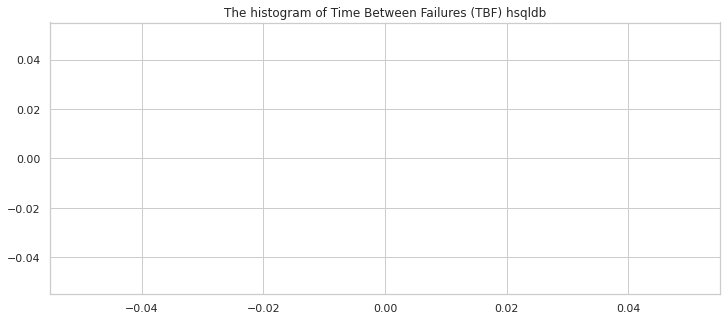

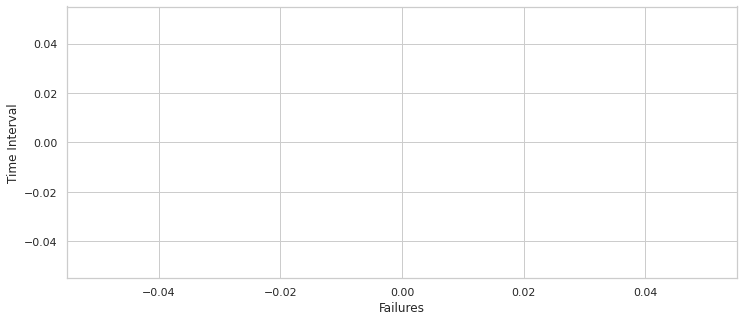

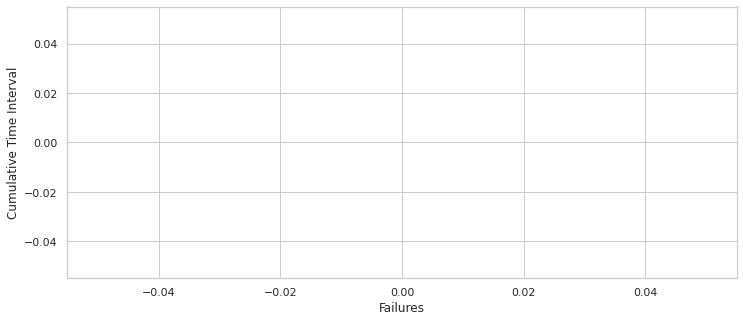

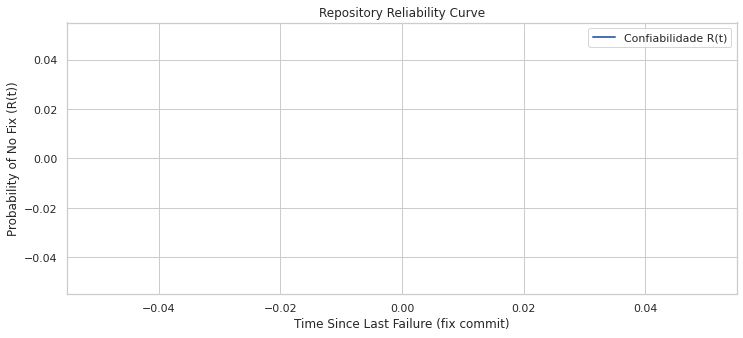

Confiabilidade R(1) = nan
Confiabilidade R(5) = nan
Confiabilidade R(10) = nan
Confiabilidade R(50) = nan
Confiabilidade R(100) = nan
{'project': 'hsqldb', 'R1': 'nan', 'R5': 'nan', 'R10': 'nan', 'R50': 'nan', 'R100': 'nan'}


,filepath,n_commits,MTBF,lambda_failure,R_t


== jackson ==


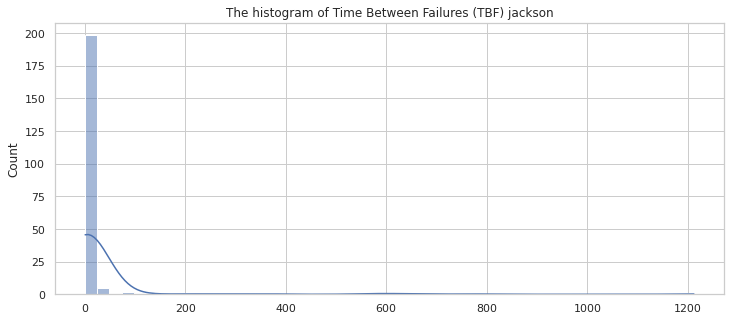

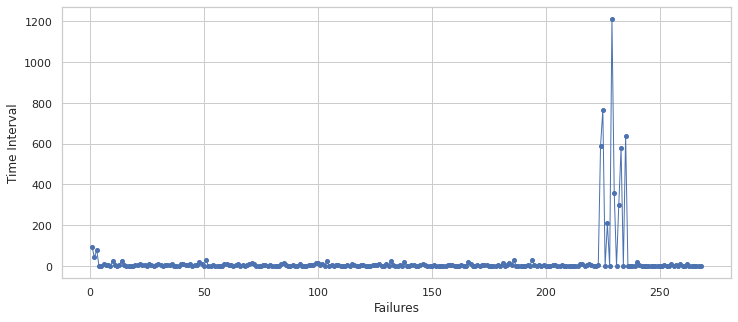

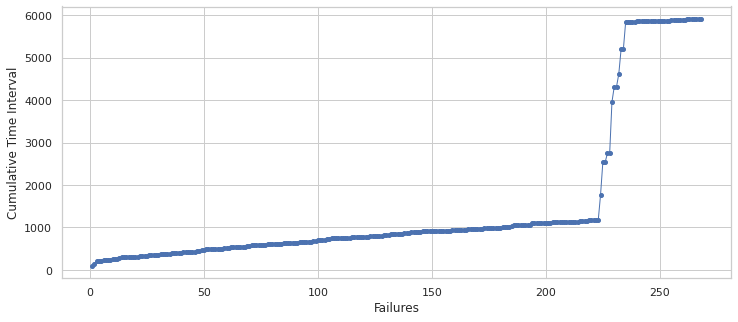

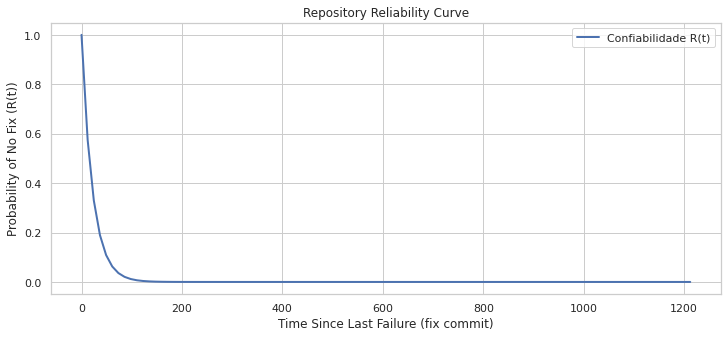

Confiabilidade R(1) = 0.9557
Confiabilidade R(5) = 0.7973
Confiabilidade R(10) = 0.6358
Confiabilidade R(50) = 0.1039
Confiabilidade R(100) = 0.0108
{'project': 'jackson', 'R1': '0.9557', 'R5': '0.7973', 'R10': '0.6358', 'R50': '0.1039', 'R100': '0.0108'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/mapper/java/org/codehaus/jackson/map/jsontype/impl/AsArrayTypeDeserializer.java,3,0.5,2.000000,0.135335
1,src/mapper/java/org/codehaus/jackson/map/type/HierarchicType.java,2,1.0,1.000000,0.367879
2,src/test/org/codehaus/jackson/xml/TestDeserialization.java,2,1.0,1.000000,0.367879
3,src/java/org/codehaus/jackson/sym/NameCanonicalizer.java,2,1.0,1.000000,0.367879
4,src/mapper/java/org/codehaus/jackson/map/jsontype/impl/AsWrapperTypeDeserializer.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
212,src/mapper/java/org/codehaus/jackson/map/deser/StdDeserializers.java,2,599.0,0.001669,0.998332
213,src/test/main/BaseTest.java,2,616.0,0.001623,0.998378
214,src/test/org/codehaus/jackson/map/deser/TestUnknownProperties.java,2,649.0,0.001541,0.998460
215,src/java/org/codehaus/jackson/impl/StreamBasedParserBase.java,2,660.0,0.001515,0.998486


== j2objc ==


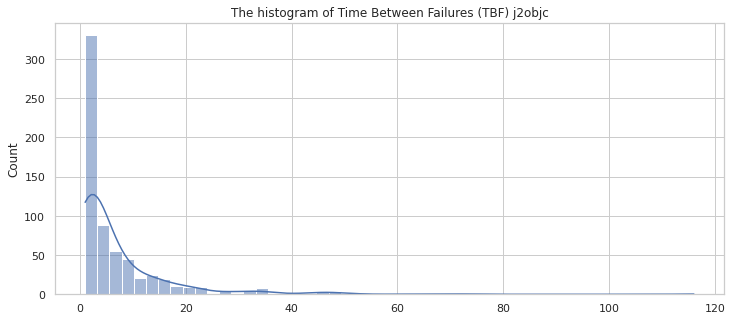

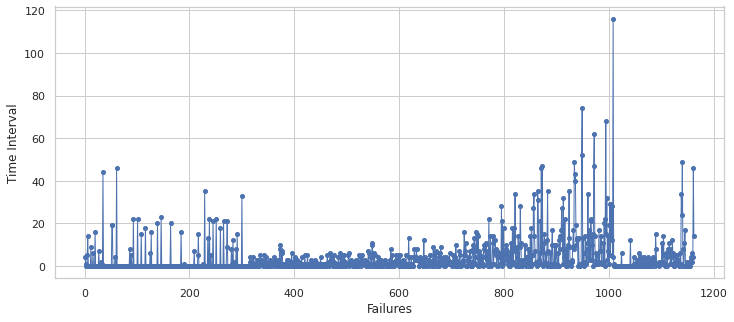

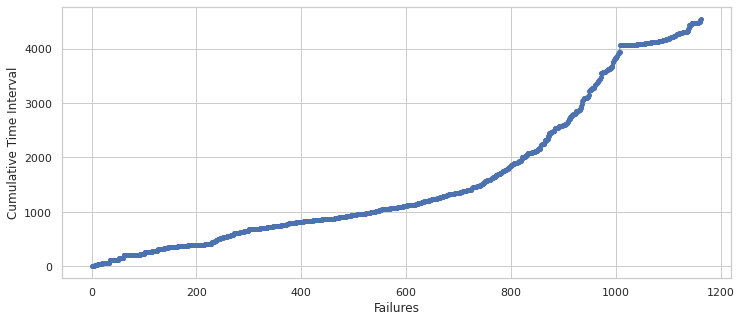

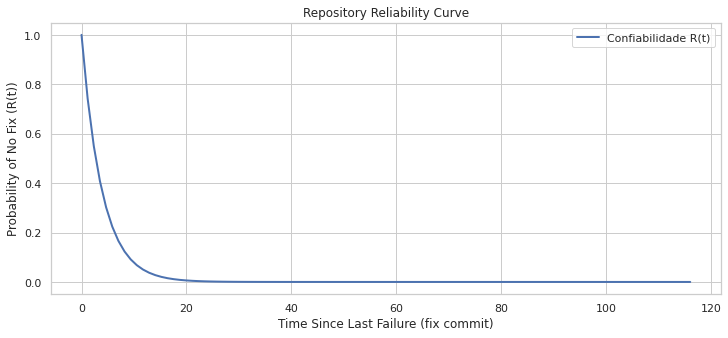

Confiabilidade R(1) = 0.7747
Confiabilidade R(5) = 0.2790
Confiabilidade R(10) = 0.0778
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'j2objc', 'R1': '0.7747', 'R5': '0.2790', 'R10': '0.0778', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,testing/mockito/tests/MockMakerTest.java,2,1.0,1.000000,0.367879
1,jre_emul/android/libcore/luni/src/main/java/java/util/concurrent/ThreadPoolExecutor.java,2,1.0,1.000000,0.367879
2,translator/src/main/java/com/google/devtools/j2objc/javac/JavacJ2ObjCIncompatibleStripper.java,2,1.0,1.000000,0.367879
3,jre_emul/android/platform/libcore/harmony-tests/src/test/java/org/apache/harmony/tests/java/nio/channels/FileChannelTest.java,2,1.0,1.000000,0.367879
4,jre_emul/Tests/com/google/j2objc/util/NativeTimeZoneTest.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
402,jre_emul/Classes/com/google/j2objc/util/logging/IOSLogHandler.java,2,1774.0,0.000564,0.999436
403,jre_emul/stub_classes/java/lang/reflect/Method.java,2,1788.0,0.000559,0.999441
404,jre_emul/android/platform/libcore/harmony-tests/src/test/java/org/apache/harmony/tests/java/nio/channels/SocketChannelTest.java,2,2325.0,0.000430,0.999570
405,jre_emul/apache_harmony/classlib/modules/beans/src/test/support/java/org/apache/harmony/beans/tests/support/SampleEvent.java,2,2957.0,0.000338,0.999662


== zuul ==


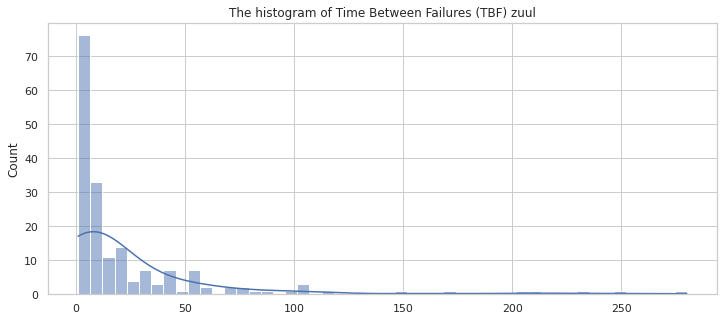

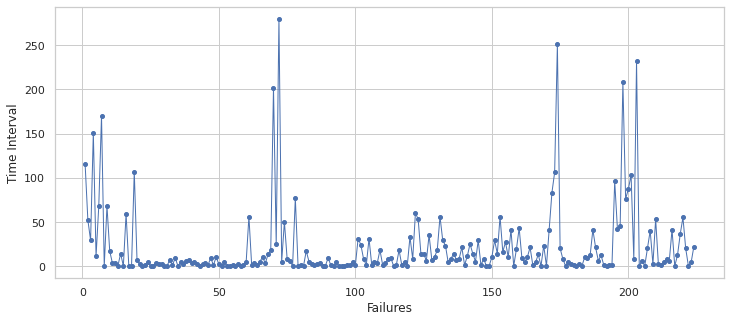

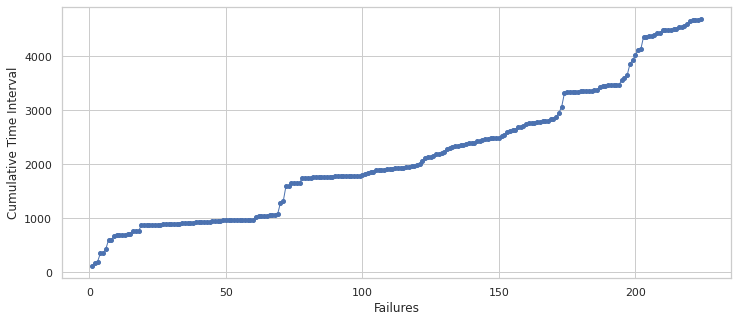

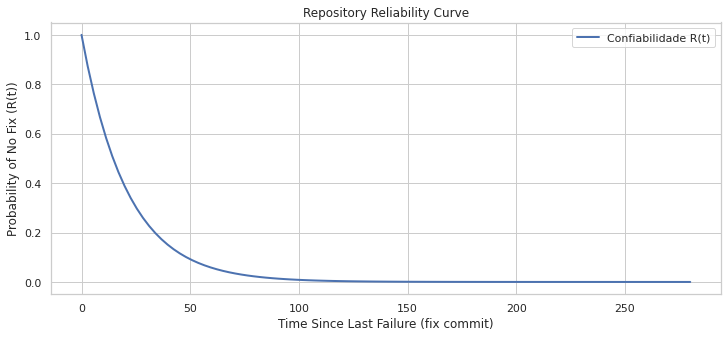

Confiabilidade R(1) = 0.9534
Confiabilidade R(5) = 0.7877
Confiabilidade R(10) = 0.6205
Confiabilidade R(50) = 0.0919
Confiabilidade R(100) = 0.0085
{'project': 'zuul', 'R1': '0.9534', 'R5': '0.7877', 'R10': '0.6205', 'R50': '0.0919', 'R100': '0.0085'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,zuul-netty-sample/src/main/java/com/netflix/zuul/StartServer3.java,2,2.0,0.500000,0.606531
1,zuul-core/src/main/java/com/netflix/zuul/dependency/ribbon/hystrix/RibbonCommand.java,2,3.0,0.333333,0.716531
2,zuul-core/src/main/java/com/netflix/zuul/context/RequestContext.java,2,3.0,0.333333,0.716531
3,zuul-servlet-api/src/main/java/com/netflix/zuul/context/ServletResponseMessageWriter.java,2,3.0,0.333333,0.716531
4,zuul-core/src/main/java/com/netflix/zuul/ZuulRunner.java,2,3.0,0.333333,0.716531
...,...,...,...,...,...
78,zuul-core/src/main/java/com/netflix/zuul/filters/FilterRegistry.java,2,1763.0,0.000567,0.999433
79,zuul-core/src/main/java/com/netflix/zuul/filters/ZuulFilter.java,2,1763.0,0.000567,0.999433
80,zuul-core/src/main/java/com/netflix/zuul/FilterFactory.java,2,1763.0,0.000567,0.999433
81,zuul-core/src/main/java/com/netflix/zuul/filters/BaseSyncFilter.java,2,1806.0,0.000554,0.999446


== opengrok ==


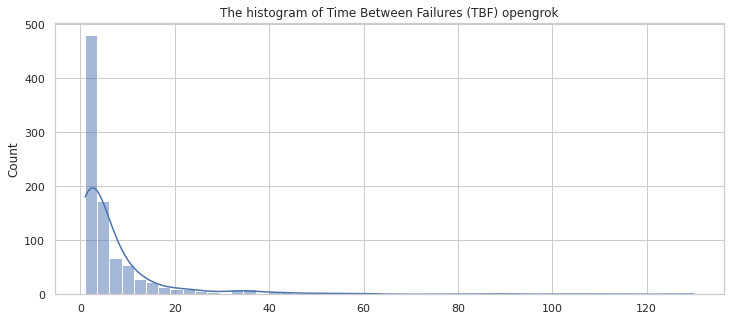

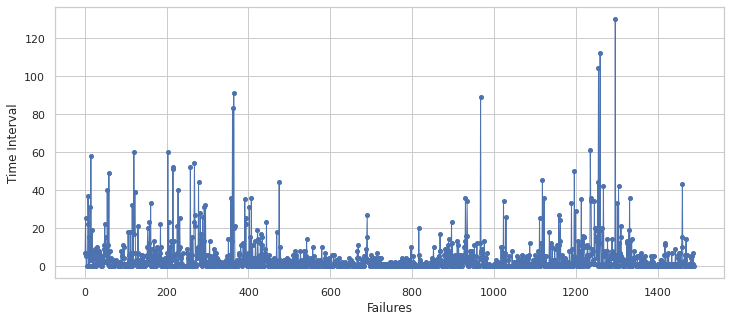

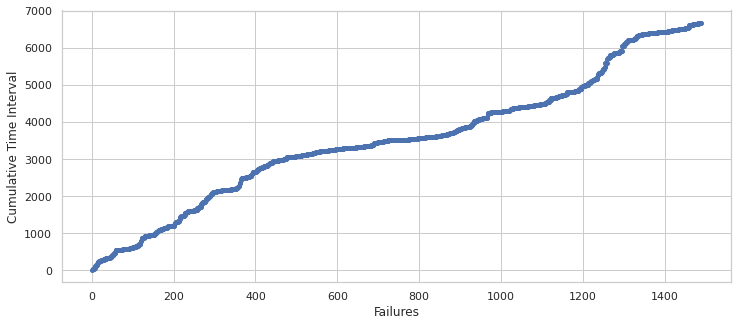

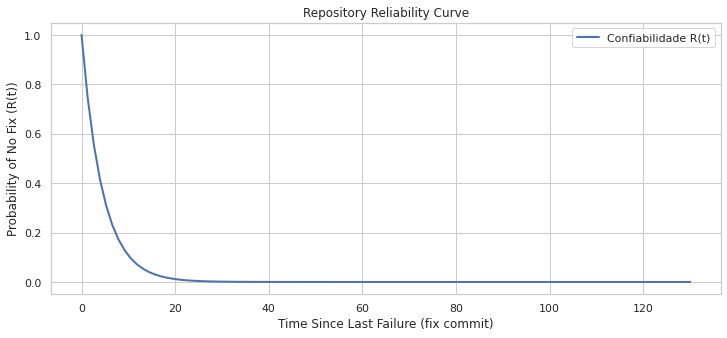

Confiabilidade R(1) = 0.8000
Confiabilidade R(5) = 0.3278
Confiabilidade R(10) = 0.1074
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'opengrok', 'R1': '0.8000', 'R5': '0.3278', 'R10': '0.1074', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/org/opensolaris/opengrok/analysis/Scopes.java,3,0.5,2.000000,0.135335
1,egrok/src/org/opensolaris/opengrok/egrok/ui/ResultsDialog.java,3,0.5,2.000000,0.135335
2,egrok/src/org/opensolaris/opengrok/egrok/model/HitContainer.java,3,0.5,2.000000,0.135335
3,opengrok-indexer/src/test/java/org/opengrok/indexer/util/FileUtilities.java,2,1.0,1.000000,0.367879
4,opengrok-indexer/src/main/java/org/opengrok/indexer/index/DefaultIndexChangedListener.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
505,src/org/opensolaris/opengrok/management/Constants.java,2,2394.0,0.000418,0.999582
506,src/org/opensolaris/opengrok/index/IndexChangedListener.java,2,2556.0,0.000391,0.999609
507,src/org/opensolaris/opengrok/history/MonotoneHistoryParser.java,2,2660.0,0.000376,0.999624
508,src/org/opensolaris/opengrok/management/JMXConfiguration.java,2,3002.0,0.000333,0.999667


== bc-java ==


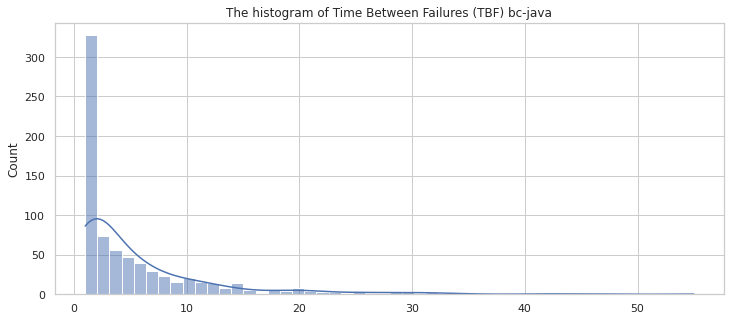

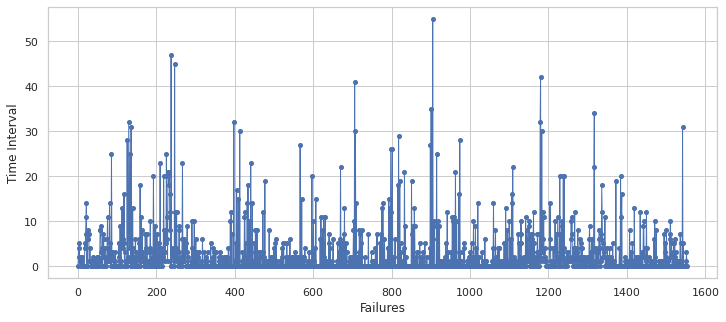

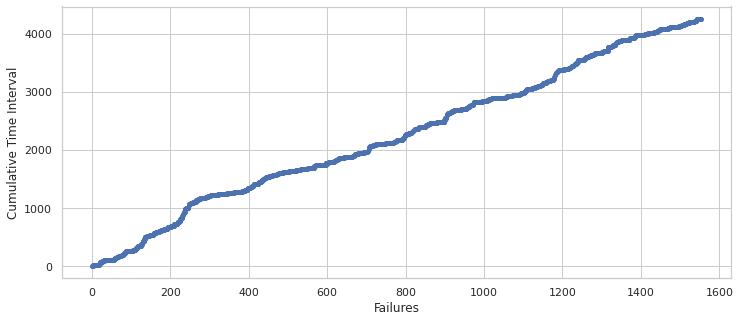

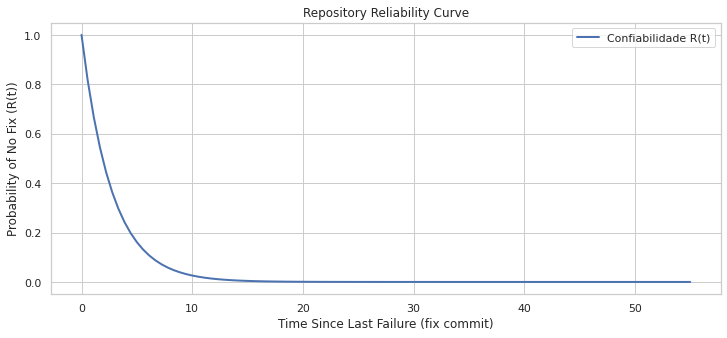

Confiabilidade R(1) = 0.6941
Confiabilidade R(5) = 0.1612
Confiabilidade R(10) = 0.0260
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'bc-java', 'R1': '0.6941', 'R5': '0.1612', 'R10': '0.0260', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,core/src/main/java/org/bouncycastle/pqc/crypto/qtesla/QTESLA.java,10,0.111111,9.000000,0.000123
1,pkix/src/test/java/org/bouncycastle/mime/test/TestSMIMEEnvelope.java,6,0.200000,5.000000,0.006738
2,core/src/main/java/org/bouncycastle/pqc/crypto/gemss/Rem_GF2n.java,6,0.200000,5.000000,0.006738
3,tls/src/main/java/org/bouncycastle/jsse/provider/ProvTrustManagerFactorySpi.java,4,0.333333,3.000000,0.049787
4,pkix/src/test/java/org/bouncycastle/its/test/ETSIEncryptedDataTest.java,4,0.333333,3.000000,0.049787
...,...,...,...,...,...
497,pg/src/main/java/org/bouncycastle/openpgp/operator/jcajce/JcePBEKeyEncryptionMethodGenerator.java,2,3593.000000,0.000278,0.999722
498,pg/src/main/java/org/bouncycastle/openpgp/operator/PGPKeyEncryptionMethodGenerator.java,2,3595.000000,0.000278,0.999722
499,core/src/main/java/org/bouncycastle/math/ec/tools/DiscoverEndomorphisms.java,2,3615.000000,0.000277,0.999723
500,pg/src/main/java/org/bouncycastle/openpgp/operator/bc/BcImplProvider.java,2,3797.000000,0.000263,0.999737


== cayenne ==


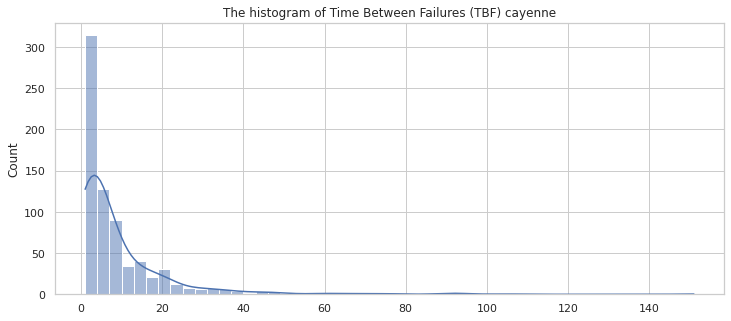

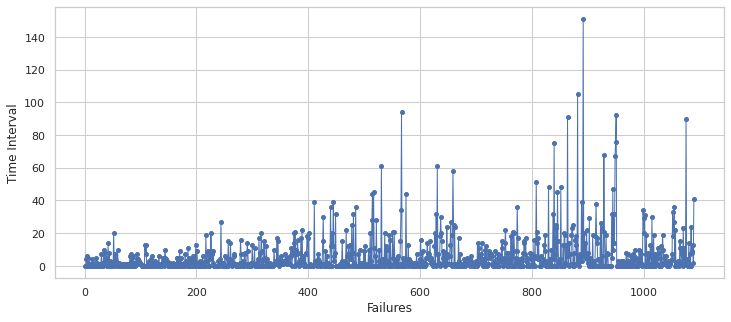

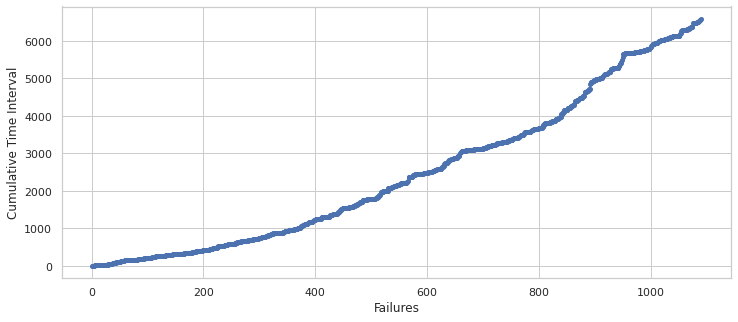

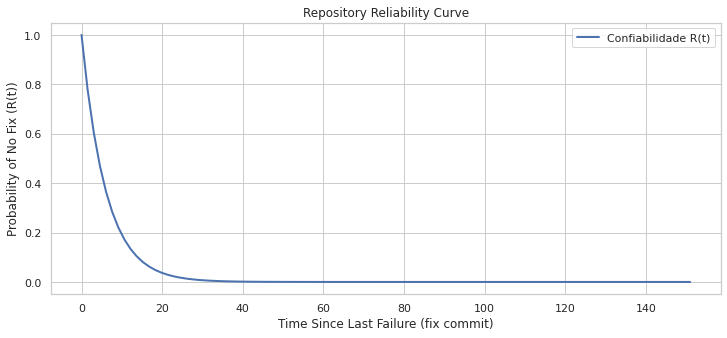

Confiabilidade R(1) = 0.8474
Confiabilidade R(5) = 0.4371
Confiabilidade R(10) = 0.1910
Confiabilidade R(50) = 0.0003
Confiabilidade R(100) = 0.0000
{'project': 'cayenne', 'R1': '0.8474', 'R5': '0.4371', 'R10': '0.1910', 'R50': '0.0003', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,framework/cayenne-jdk1.5-unpublished/src/test/java/org/apache/cayenne/access/NestedDataContextReadTest.java,3,0.5,2.000000,0.135335
1,framework/cayenne-core-unpublished/src/main/java/org/apache/cayenne/util/ObjectDetachOperation.java,2,1.0,1.000000,0.367879
2,framework/cayenne-jdk1.5-unpublished/src/main/java/org/apache/cayenne/dba/oracle/OracleAdapter.java,2,1.0,1.000000,0.367879
3,framework/cayenne-jdk1.4-unpublished/src/main/java/org/apache/cayenne/CayenneContext.java,2,1.0,1.000000,0.367879
4,cayenne-server/src/test/java/org/apache/cayenne/dba/JdbcPkGeneratorTest.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
1171,tutorials/tutorial-rop-server/src/main/java/org/apache/cayenne/tutorial/persistent/Artist.java,2,3411.0,0.000293,0.999707
1172,tutorials/tutorial-rop-server/src/main/java/org/apache/cayenne/tutorial/persistent/client/Painting.java,2,3411.0,0.000293,0.999707
1173,tutorials/tutorial-rop-client/src/main/java/org/apache/cayenne/tutorial/persistent/client/Gallery.java,2,3411.0,0.000293,0.999707
1174,tutorials/tutorial-rop-server/src/main/java/org/apache/cayenne/tutorial/persistent/Painting.java,2,3411.0,0.000293,0.999707


== tinker ==


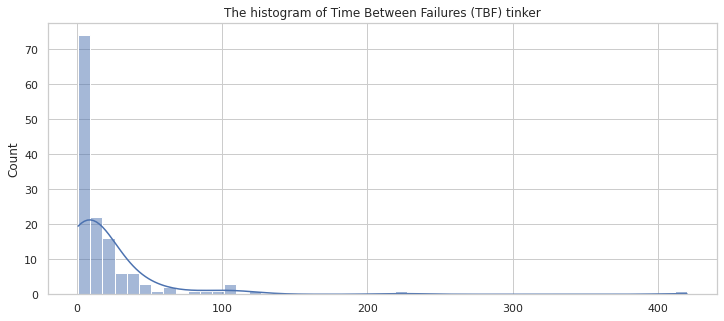

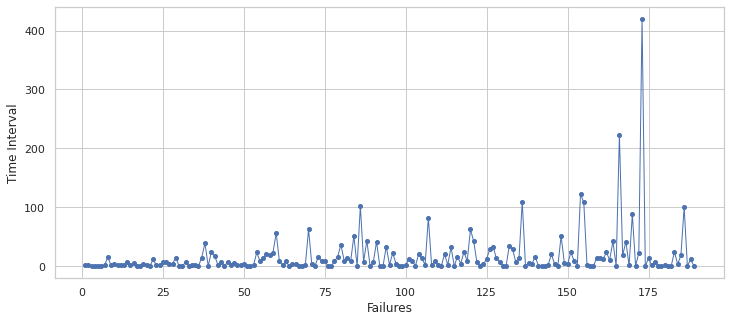

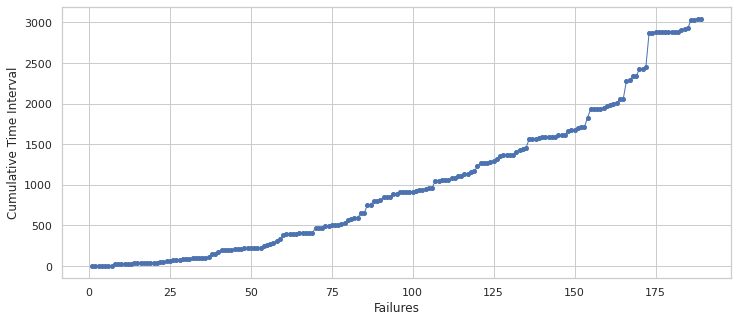

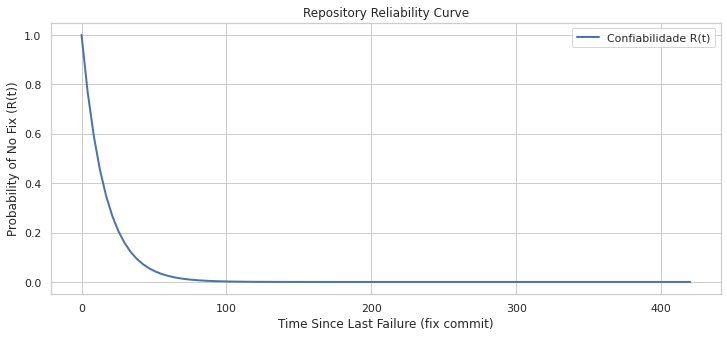

Confiabilidade R(1) = 0.9398
Confiabilidade R(5) = 0.7330
Confiabilidade R(10) = 0.5372
Confiabilidade R(50) = 0.0448
Confiabilidade R(100) = 0.0020
{'project': 'tinker', 'R1': '0.9398', 'R5': '0.7330', 'R10': '0.5372', 'R50': '0.0448', 'R100': '0.0020'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,tinker-build/tinker-patch-lib/src/main/java/com/tencent/tinker/build/builder/PatchBuilder.java,2,1.0,1.000000,0.367879
1,tinker-android/tinker-android-loader/src/main/java/com/tencent/tinker/loader/TinkerResourcesKey.java,2,1.0,1.000000,0.367879
2,tinker-android/tinker-android-lib/src/main/java/com/tencent/tinker/lib/patch/BasePatchInternal.java,3,4.5,0.222222,0.800737
3,tinker-android/tinker-android-loader/src/main/java/com/tencent/tinker/loader/shareutil/InstrumentationProxy.java,2,7.0,0.142857,0.866878
4,tinker-android/tinker-android-loader/src/main/java/com/tencent/tinker/loader/shareutil/ActivityResFixInstrumentation.java,2,7.0,0.142857,0.866878
...,...,...,...,...,...
61,tinker-build/tinker-patch-cli/src/main/java/com/tencent/tinker/patch/CliMain.java,2,1178.0,0.000849,0.999151
62,tinker-android/tinker-android-lib/src/main/java/com/tencent/tinker/lib/util/TinkerServiceInternals.java,2,1184.0,0.000845,0.999156
63,tinker-build/tinker-patch-lib/src/main/java/com/tencent/tinker/build/info/PatchInfoGen.java,2,2158.0,0.000463,0.999537
64,tinker-android/tinker-android-lib/src/main/java/com/tencent/tinker/lib/tinker/TinkerInstaller.java,2,2174.0,0.000460,0.999540


== gson ==


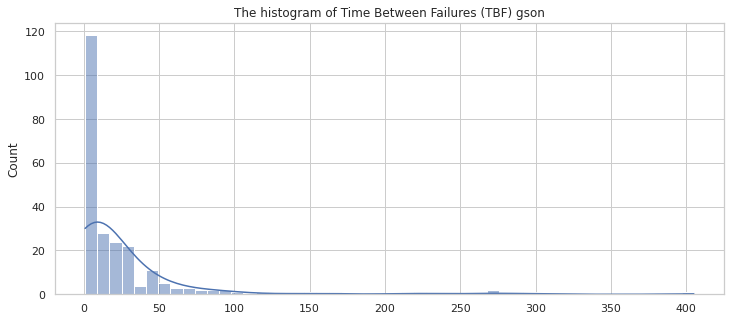

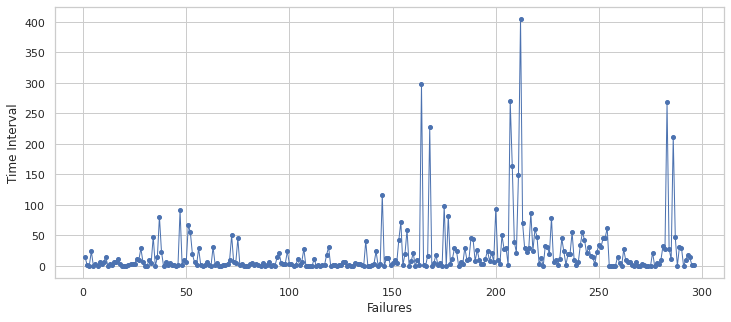

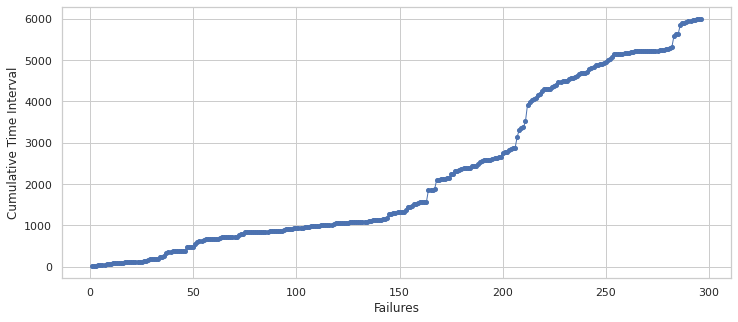

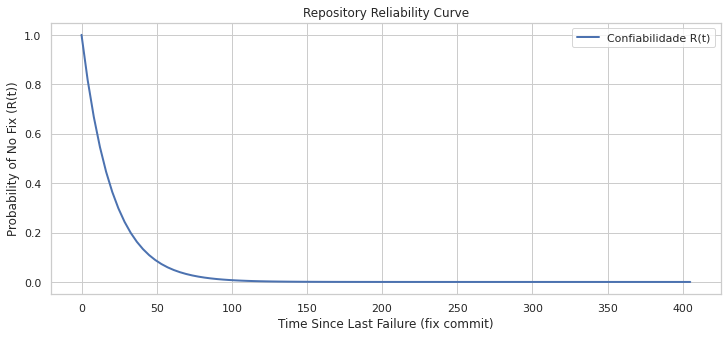

Confiabilidade R(1) = 0.9518
Confiabilidade R(5) = 0.7813
Confiabilidade R(10) = 0.6104
Confiabilidade R(50) = 0.0848
Confiabilidade R(100) = 0.0072
{'project': 'gson', 'R1': '0.9518', 'R5': '0.7813', 'R10': '0.6104', 'R50': '0.0848', 'R100': '0.0072'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,extras/src/main/java/com/google/gson/graph/GraphTypeAdapterFactory.java,2,2.0,0.500000,0.606531
1,gson/src/main/java/com/google/gson/ReflectingFieldNavigator.java,3,5.5,0.181818,0.833753
2,gson/src/test/java/com/google/gson/internal/LinkedHashTreeMapTest.java,3,5.5,0.181818,0.833753
3,gson/src/main/java/com/google/gson/JsonParserImpl.java,2,12.0,0.083333,0.920044
4,gson/src/main/java/com/google/gson/JsonParserImplTokenManager.java,2,12.0,0.083333,0.920044
...,...,...,...,...,...
168,gson/src/test/java/com/google/gson/VersionExclusionStrategyTest.java,2,4347.0,0.000230,0.999770
169,gson/src/main/java/com/google/gson/internal/JsonReaderInternalAccess.java,2,4427.0,0.000226,0.999774
170,gson/src/test/java/com/google/gson/functional/TypeAdapterPrecedenceTest.java,2,4430.0,0.000226,0.999774
171,gson/src/test/java/com/google/gson/PrimitiveTypeAdapter.java,2,4677.0,0.000214,0.999786


== storm ==


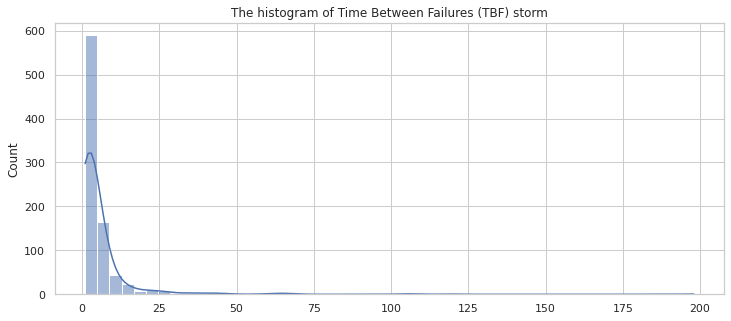

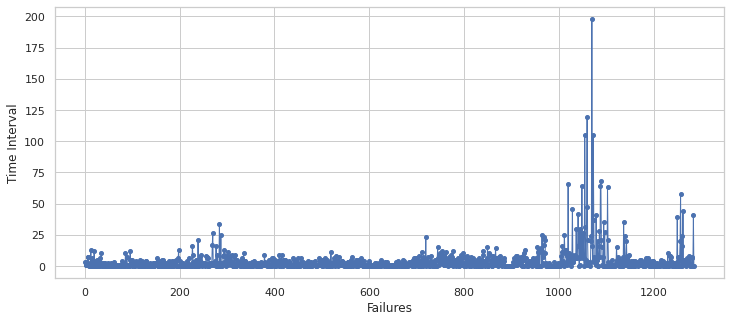

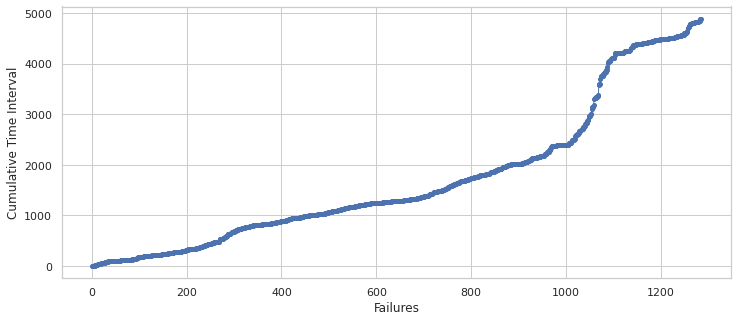

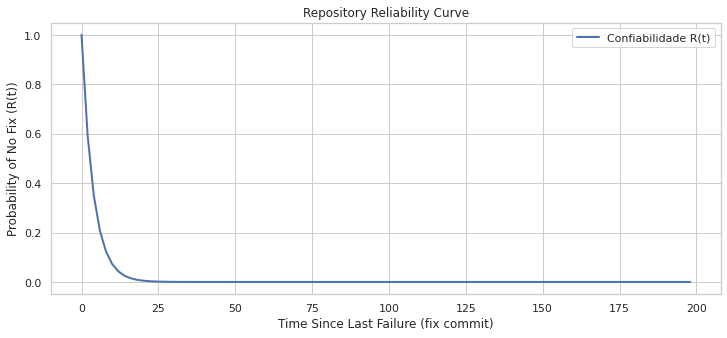

Confiabilidade R(1) = 0.7687
Confiabilidade R(5) = 0.2685
Confiabilidade R(10) = 0.0721
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'storm', 'R1': '0.7687', 'R5': '0.2685', 'R10': '0.0721', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,external/storm-hdfs/src/main/java/org/apache/storm/hdfs/common/security/AutoHDFS.java,2,1.0,1.000000,0.367879
1,external/storm-kafka/src/test/storm/kafka/KafkaTestBroker.java,2,1.0,1.000000,0.367879
2,src/jvm/backtype/storm/drpc/DRPCInvocationsClient.java,2,1.0,1.000000,0.367879
3,storm-core/test/jvm/backtype/storm/utils/XMLEscapeOutputStream.java,2,1.0,1.000000,0.367879
4,storm-server/src/main/java/org/apache/storm/scheduler/resource/strategies/scheduling/IStrategy.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
1103,examples/storm-mongodb-examples/src/main/java/org/apache/storm/mongodb/topology/WordCounter.java,2,1580.0,0.000633,0.999367
1104,storm-server/src/test/java/org/apache/storm/scheduler/resource/TestUtilsForResourceAwareScheduler.java,3,1596.0,0.000627,0.999374
1105,storm-server/src/main/java/org/apache/storm/metricstore/rocksdb/RocksDbStore.java,2,1627.0,0.000615,0.999386
1106,storm-server/src/main/java/org/apache/storm/metricstore/rocksdb/StringMetadataCache.java,2,1627.0,0.000615,0.999386


== gora ==


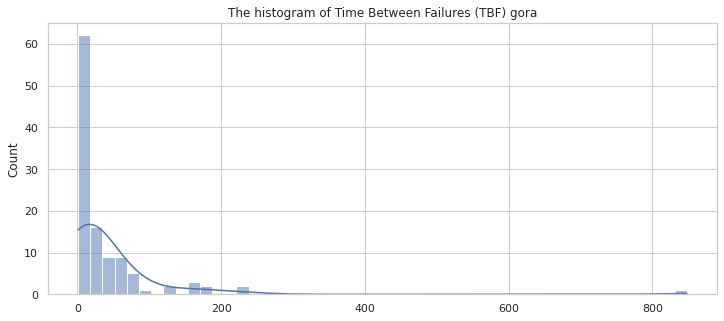

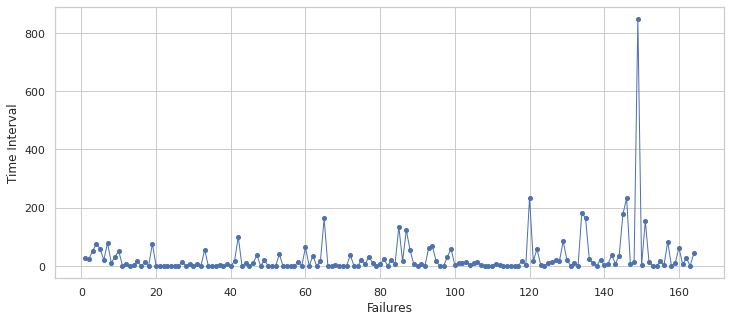

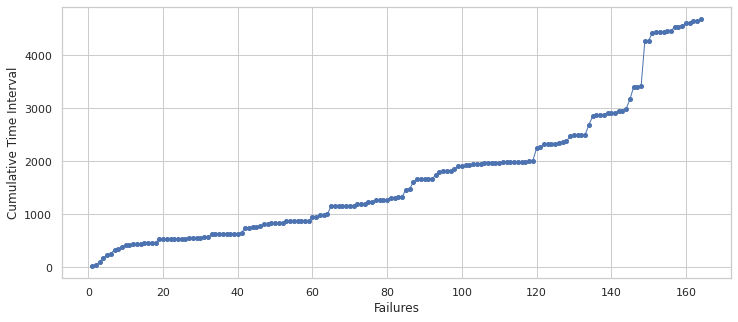

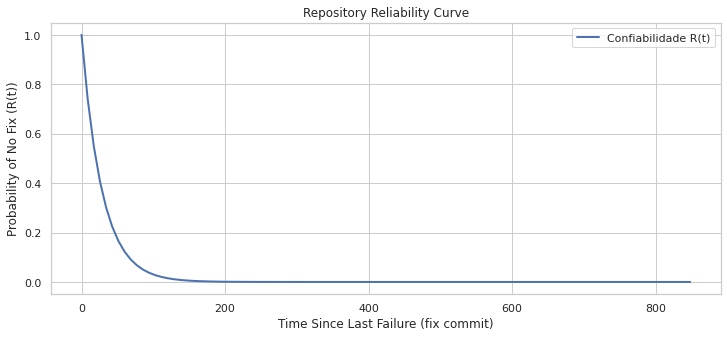

Confiabilidade R(1) = 0.9656
Confiabilidade R(5) = 0.8396
Confiabilidade R(10) = 0.7049
Confiabilidade R(50) = 0.1740
Confiabilidade R(100) = 0.0303
{'project': 'gora', 'R1': '0.9656', 'R5': '0.8396', 'R10': '0.7049', 'R50': '0.1740', 'R100': '0.0303'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,gora-jcache/src/test/java/org/apache/gora/jcache/GoraHazelcastTestDriver.java,3,2.0,0.500000,0.606531
1,gora-tutorial/src/main/java/org/apache/gora/tutorial/log/DistributedLogManager.java,5,3.5,0.285714,0.751477
2,gora-jcache/src/main/java/org/apache/gora/jcache/store/JCacheCacheWriter.java,2,4.0,0.250000,0.778801
3,gora-jcache/src/main/java/org/apache/gora/jcache/store/JCacheCacheFactoryBuilder.java,2,4.0,0.250000,0.778801
4,gora-jcache/src/main/java/org/apache/gora/jcache/store/JCacheCacheEntryListener.java,2,4.0,0.250000,0.778801
...,...,...,...,...,...
63,gora-dynamodb/src/main/java/org/apache/gora/dynamodb/store/DynamoDBStore.java,3,1061.5,0.000942,0.999058
64,gora-hbase/src/main/java/org/apache/gora/hbase/store/HBaseTableConnection.java,3,1232.0,0.000812,0.999189
65,gora-mongodb/src/test/java/org/apache/gora/mongodb/mapreduce/TestMongoStoreWordCount.java,2,1335.0,0.000749,0.999251
66,gora-mongodb/src/main/java/org/apache/gora/mongodb/query/MongoDBResult.java,2,1439.0,0.000695,0.999305


== hibernate-orm ==


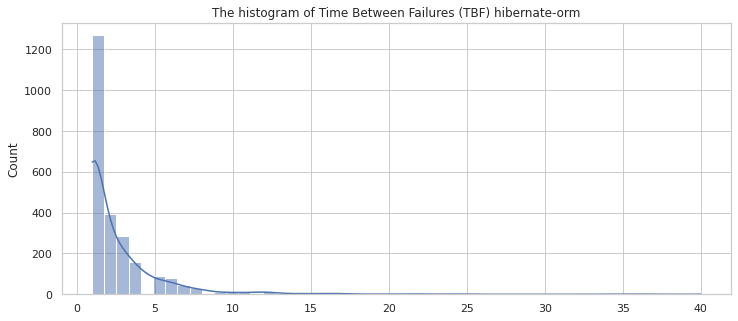

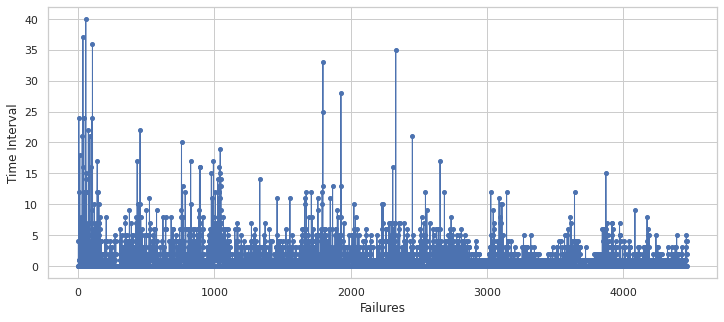

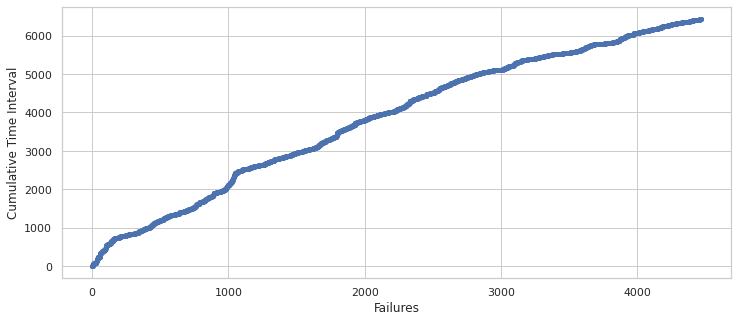

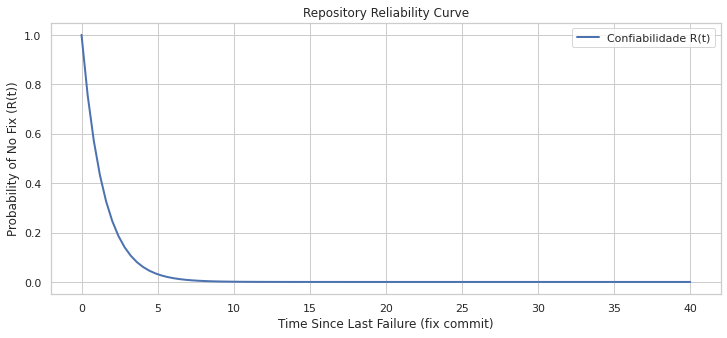

Confiabilidade R(1) = 0.5000
Confiabilidade R(5) = 0.0312
Confiabilidade R(10) = 0.0010
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'hibernate-orm', 'R1': '0.5000', 'R5': '0.0312', 'R10': '0.0010', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,tooling/hibernate-gradle-plugin/src/test/java/org/hibernate/orm/tooling/gradle/HibernateOrmPluginTest.java,4,0.333333,3.000000,0.049787
1,hibernate-core/src/main/java/org/hibernate/type/descriptor/java/CharacterJavaType.java,3,0.500000,2.000000,0.135335
2,hibernate-core/src/main/java/org/hibernate/boot/jaxb/hbm/spi/SubEntityInfo.java,3,0.500000,2.000000,0.135335
3,hibernate-core/src/test/java/org/hibernate/orm/test/boot/models/hbm/propertyref/CompositeManyToOnePropertyRefTests.java,3,0.500000,2.000000,0.135335
4,hibernate-core/src/test/java/org/hibernate/orm/test/sql/ast/JdbcParameterRendererTests.java,3,0.500000,2.000000,0.135335
...,...,...,...,...,...
4885,hibernate-core/src/main/java/org/hibernate/BaseSessionEventListener.java,2,3487.000000,0.000287,0.999713
4886,hibernate-core/src/main/java/org/hibernate/CallbackException.java,2,3495.000000,0.000286,0.999714
4887,hibernate-core/src/main/java/org/hibernate/resource/transaction/backend/jta/internal/synchronization/SynchronizationCallbackCoordinatorTrackingImpl.java,2,3498.000000,0.000286,0.999714
4888,hibernate-core/src/main/java/org/hibernate/property/access/spi/GetterFieldImpl.java,2,3533.000000,0.000283,0.999717


== zookeeper ==


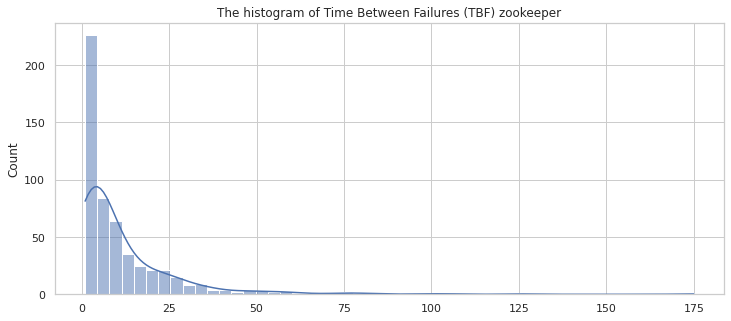

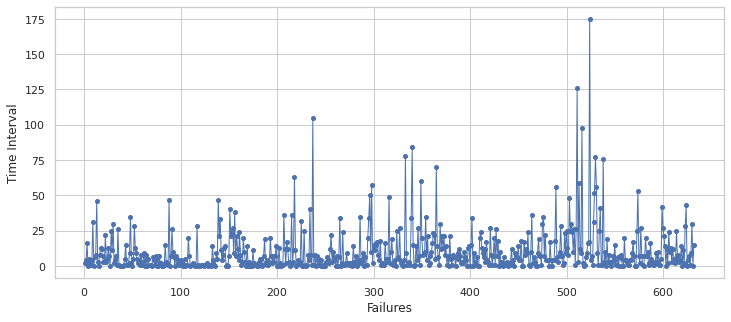

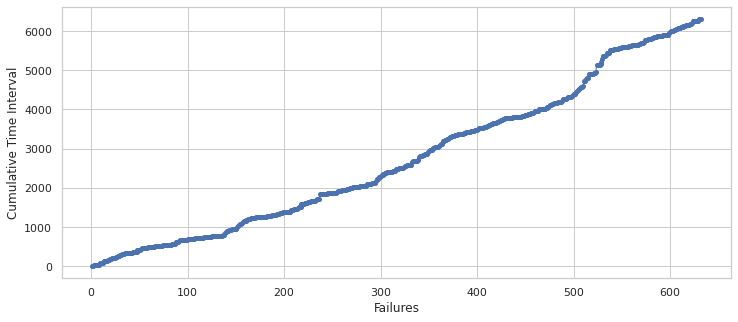

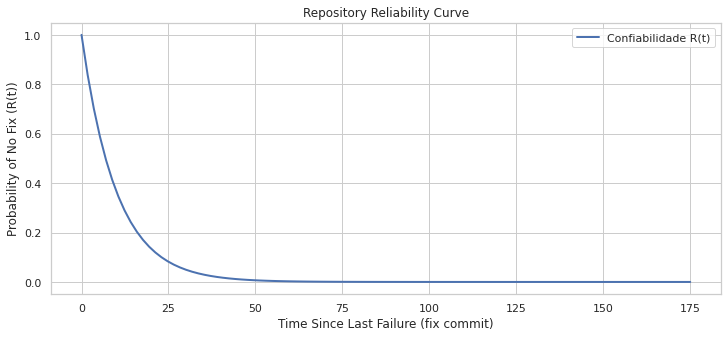

Confiabilidade R(1) = 0.9047
Confiabilidade R(5) = 0.6061
Confiabilidade R(10) = 0.3673
Confiabilidade R(50) = 0.0067
Confiabilidade R(100) = 0.0000
{'project': 'zookeeper', 'R1': '0.9047', 'R5': '0.6061', 'R10': '0.3673', 'R50': '0.0067', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/java/test/org/apache/zookeeper/test/DBSizeTest.java,2,1.0,1.000000,0.367879
1,zookeeper-server/src/main/java/org/apache/zookeeper/server/ExitCode.java,2,4.0,0.250000,0.778801
2,src/java/test/org/apache/zookeeper/server/quorum/FuzzySnapshotRelatedTest.java,3,4.5,0.222222,0.800737
3,src/contrib/bookkeeper/src/java/org/apache/bookkeeper/client/LedgerRecoveryMonitor.java,5,21.0,0.047619,0.953497
4,src/contrib/bookkeeper/src/java/org/apache/bookkeeper/client/BKException.java,2,22.0,0.045455,0.955563
...,...,...,...,...,...
259,src/recipes/lock/test/org/apache/zookeeper/recipes/lock/ZNodeNameTest.java,2,2742.0,0.000365,0.999635
260,src/java/main/org/apache/zookeeper/Watcher.java,2,2814.0,0.000355,0.999645
261,src/java/test/org/apache/zookeeper/test/SledgeHammer.java,2,2906.0,0.000344,0.999656
262,src/java/main/org/apache/zookeeper/server/quorum/LeaderBean.java,2,3126.0,0.000320,0.999680


== graal ==


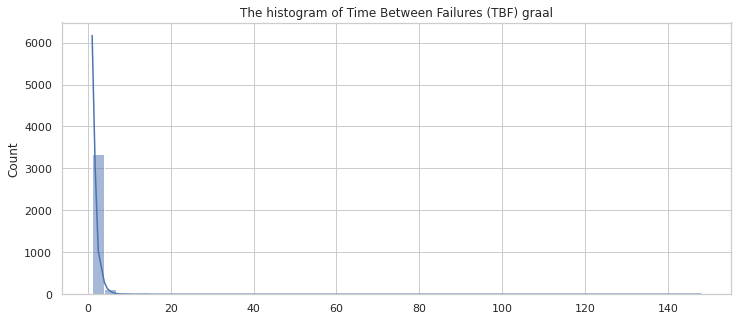

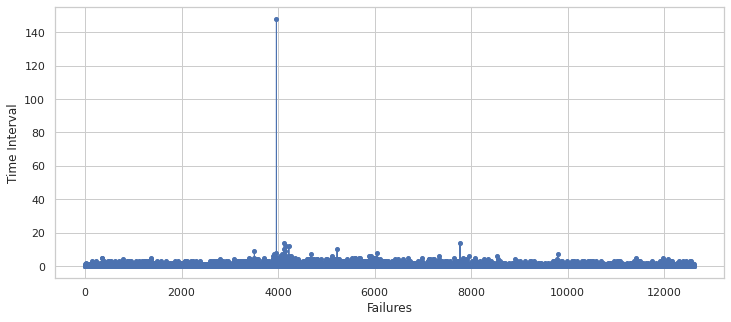

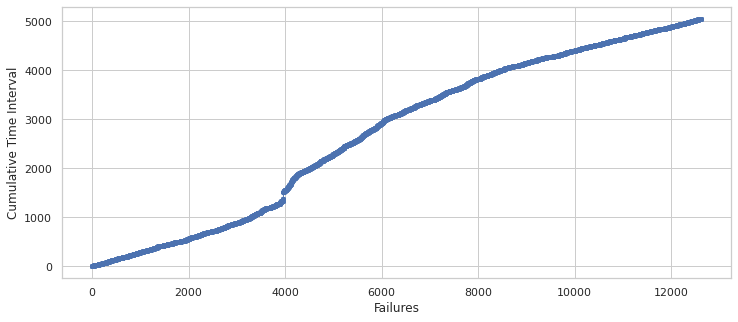

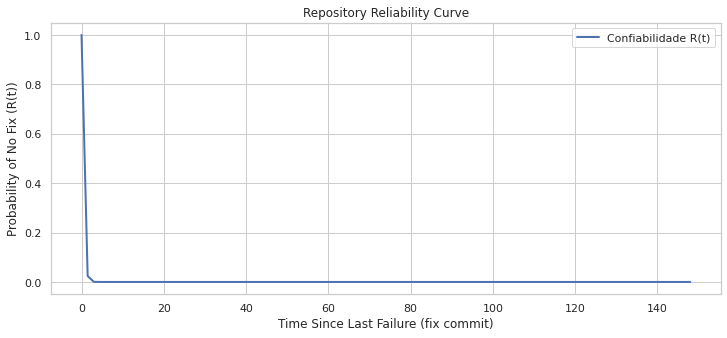

Confiabilidade R(1) = 0.0824
Confiabilidade R(5) = 0.0000
Confiabilidade R(10) = 0.0000
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'graal', 'R1': '0.0824', 'R5': '0.0000', 'R10': '0.0000', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,projects/com.oracle.truffle.llvm.asm.amd64/src/com/oracle/truffle/llvm/asm/amd64/Parser.java,4,0.333333,3.000000,0.049787
1,substratevm/src/com.oracle.svm.core/src/com/oracle/svm/core/jdk/DigestAuthenticationFeature.java,3,0.500000,2.000000,0.135335
2,substratevm/src/com.oracle.svm.jfr/src/com/oracle/svm/jfr/traceid/JfrTraceIdMap.java,3,0.500000,2.000000,0.135335
3,truffle/com.oracle.truffle.api.debug.test/src/com/oracle/truffle/api/debug/test/TestLanguageTest.java,3,0.500000,2.000000,0.135335
4,substratevm/src/com.oracle.svm.test/src/hello/Target_hello_Hello_DefaultGreeter.java,3,0.500000,2.000000,0.135335
...,...,...,...,...,...
4910,truffle/src/com.oracle.truffle.sl.test/src/com/oracle/truffle/sl/test/SLTestRunner.java,2,1967.000000,0.000508,0.999492
4911,substratevm/src/com.oracle.svm.core/src/com/oracle/svm/core/jdk/proxy/DynamicProxyRegistry.java,2,2078.000000,0.000481,0.999519
4912,truffle/src/com.oracle.truffle.api.dsl.test/src/com/oracle/truffle/api/dsl/test/AssumptionsTest.java,2,2143.000000,0.000467,0.999533
4913,regex/src/com.oracle.truffle.regex/src/com/oracle/truffle/regex/tregex/TRegexCompiler.java,2,2167.000000,0.000461,0.999539


== angel ==


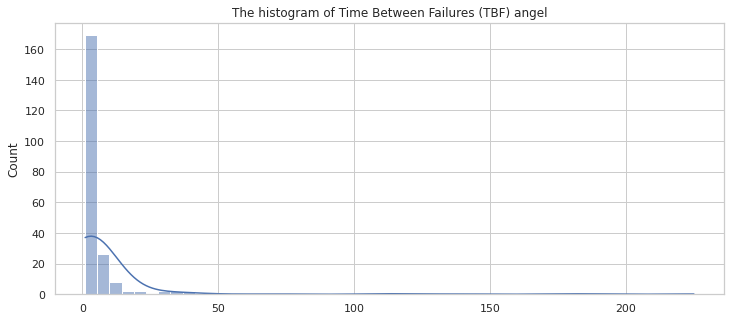

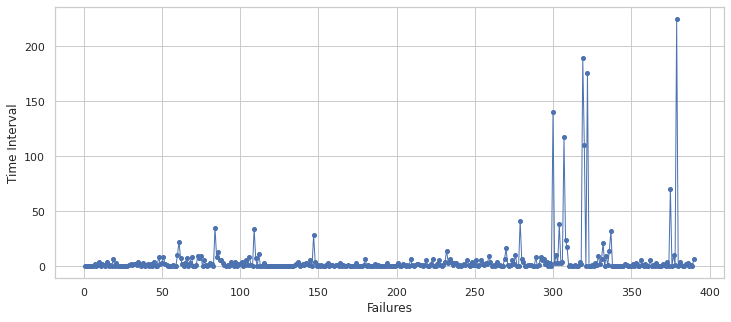

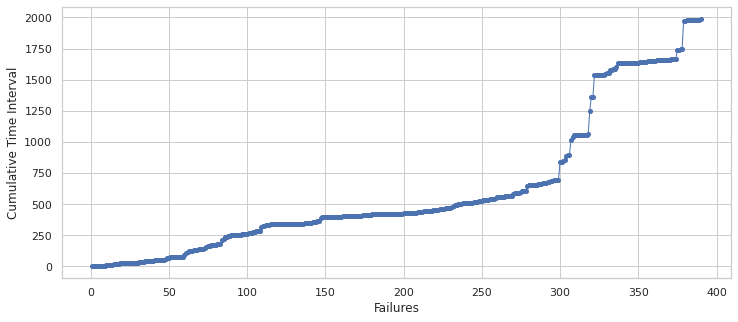

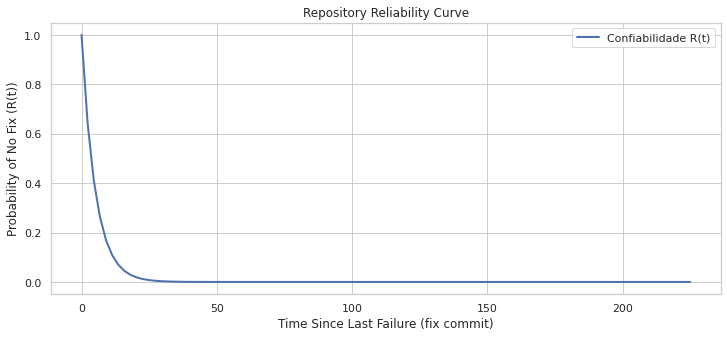

Confiabilidade R(1) = 0.8219
Confiabilidade R(5) = 0.3752
Confiabilidade R(10) = 0.1407
Confiabilidade R(50) = 0.0001
Confiabilidade R(100) = 0.0000
{'project': 'angel', 'R1': '0.8219', 'R5': '0.3752', 'R10': '0.1407', 'R50': '0.0001', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,angel-ps/core/src/main/java/com/tencent/angel/ps/storage/vector/ServerLongIntRow.java,2,1.0,1.000000,0.367879
1,angel-ps/core/src/main/java/com/tencent/angel/ps/server/data/WorkerPool.java,2,1.0,1.000000,0.367879
2,angel-ps/core/src/main/java/com/tencent/angel/ps/storage/vector/ServerLongLongRow.java,3,1.0,1.000000,0.367879
3,angel-ps/mllib/src/test/java/com/tencent/angel/ml/factorizationmachines/FMTest.java,2,5.0,0.200000,0.818731
4,angel-ps/core/src/test/java/com/tencent/angel/ml/matrix/psf/get/enhance/indexed/IndexGetProfileTest.java,2,5.0,0.200000,0.818731
...,...,...,...,...,...
143,angel-ps/core/src/main/java/com/tencent/angel/master/deploy/yarn/YarnContainerAllocator.java,2,427.0,0.002342,0.997661
144,angel-ps/core/src/main/java/com/tencent/angel/psagent/matrix/oplog/cache/RowUpdateSplitUtils.java,2,436.0,0.002294,0.997709
145,angel-ps/core/src/main/java/com/tencent/angel/ps/ParameterServer.java,3,498.0,0.002008,0.997994
146,angel-ps/core/src/main/java/com/tencent/angel/ps/storage/vector/ServerRow.java,3,501.0,0.001996,0.998006


== truth ==


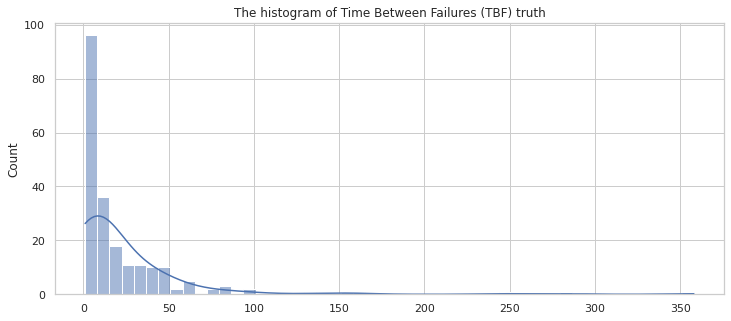

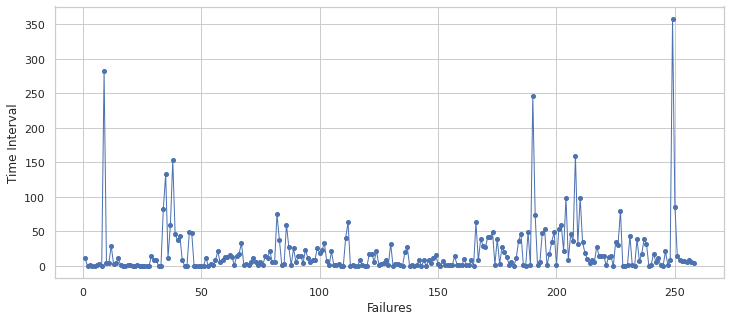

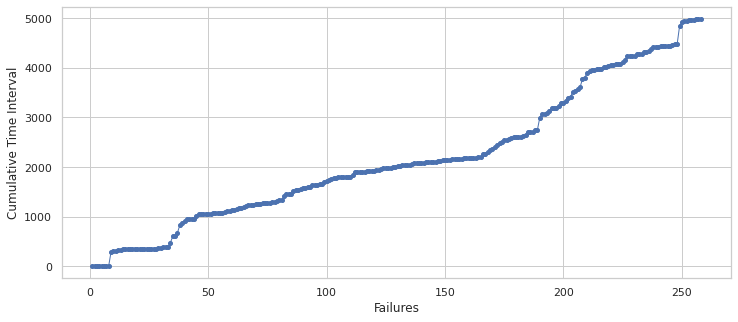

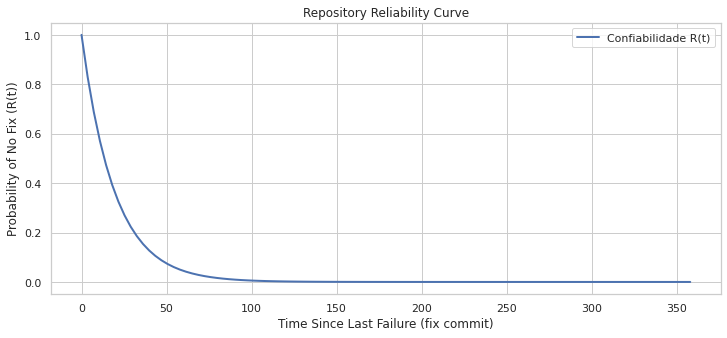

Confiabilidade R(1) = 0.9495
Confiabilidade R(5) = 0.7719
Confiabilidade R(10) = 0.5958
Confiabilidade R(50) = 0.0751
Confiabilidade R(100) = 0.0056
{'project': 'truth', 'R1': '0.9495', 'R5': '0.7719', 'R10': '0.5958', 'R50': '0.0751', 'R100': '0.0056'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/main/java/org/junit/contrib/truth/subjects/StringSubject.java,2,1.0,1.000000,0.367879
1,core/src/test/java/com/google/common/truth/ComparisonFailureWithFieldsTest.java,2,1.0,1.000000,0.367879
2,core/src/test/java/com/google/common/truth/DoubleTest.java,2,1.0,1.000000,0.367879
3,src/test/java/org/junit/contrib/truth/StringTest.java,2,1.0,1.000000,0.367879
4,src/main/java/org/junit/contrib/truth/codegen/IteratingWrapperClassBuilder.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
119,extensions/proto/src/main/java/com/google/common/truth/extensions/proto/FieldScopeImpl.java,2,1356.0,0.000737,0.999263
120,extensions/proto/src/main/java/com/google/common/truth/extensions/proto/DiffResult.java,2,1517.0,0.000659,0.999341
121,core/src/main/java/com/google/common/truth/TruthFailureSubject.java,2,1698.0,0.000589,0.999411
122,extensions/java8/src/test/java/com/google/common/truth/StreamSubjectTest.java,2,2105.0,0.000475,0.999525


== bitcoinj ==


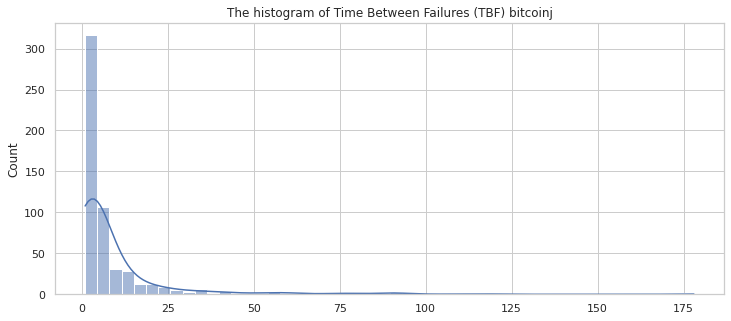

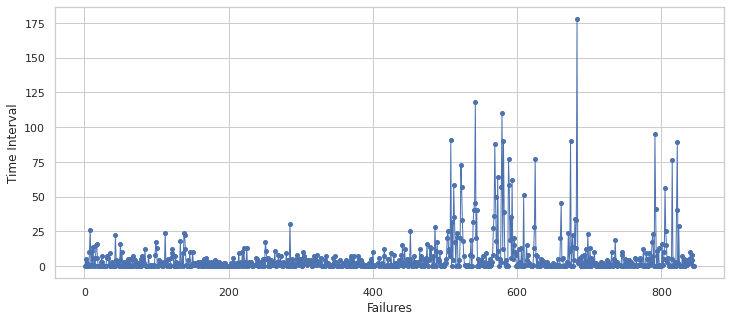

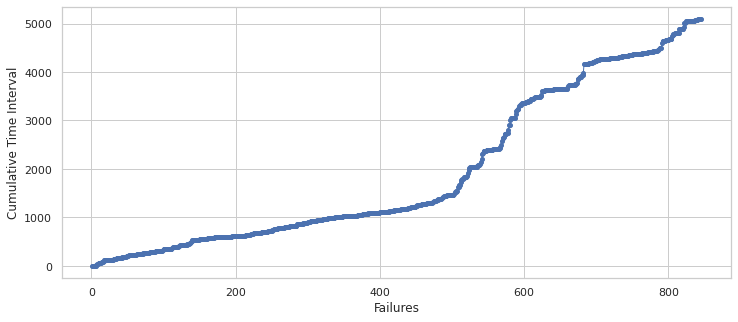

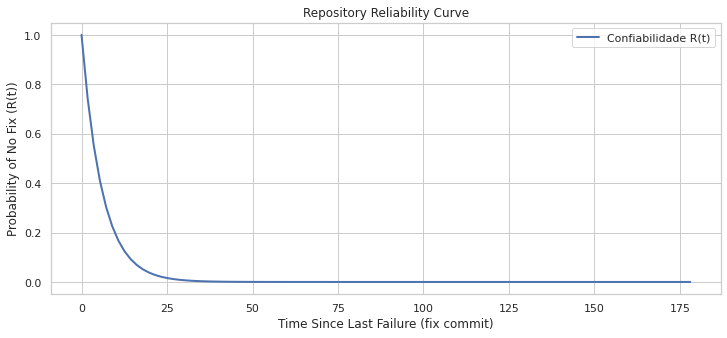

Confiabilidade R(1) = 0.8472
Confiabilidade R(5) = 0.4364
Confiabilidade R(10) = 0.1905
Confiabilidade R(50) = 0.0003
Confiabilidade R(100) = 0.0000
{'project': 'bitcoinj', 'R1': '0.8472', 'R5': '0.4364', 'R10': '0.1905', 'R50': '0.0003', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,core/src/main/java/org/bitcoinj/core/Bech32.java,5,0.250000,4.000000,0.018316
1,core/src/main/java/org/bitcoinj/core/AddressFormatException.java,4,0.333333,3.000000,0.049787
2,core/src/main/java/org/bitcoinj/core/LegacyAddress.java,3,0.500000,2.000000,0.135335
3,core/src/main/java/org/bitcoinj/core/Base58.java,3,0.500000,2.000000,0.135335
4,core/src/test/java/org/bitcoinj/core/Bech32Test.java,3,0.500000,2.000000,0.135335
...,...,...,...,...,...
260,core/src/main/java/org/bitcoinj/params/UnitTestParams.java,2,2618.000000,0.000382,0.999618
261,core/src/test/java/org/bitcoinj/wallet/BasicKeyChainTest.java,2,2655.000000,0.000377,0.999623
262,core/src/test/java/org/bitcoinj/core/TxConfidenceTableTest.java,2,2672.000000,0.000374,0.999626
263,core/src/main/java/org/bitcoinj/core/Coin.java,2,2733.000000,0.000366,0.999634


== picasso ==


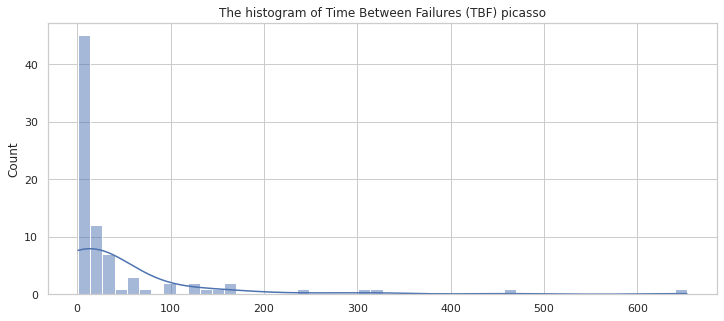

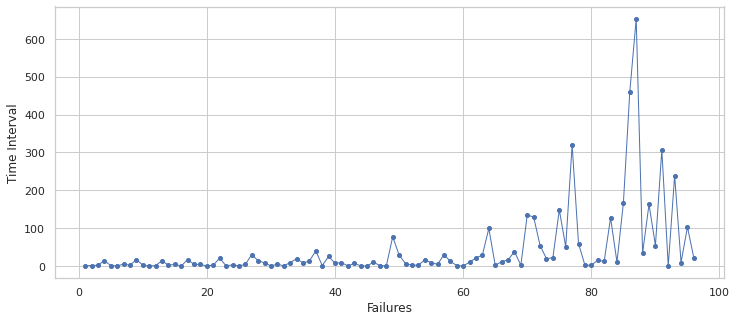

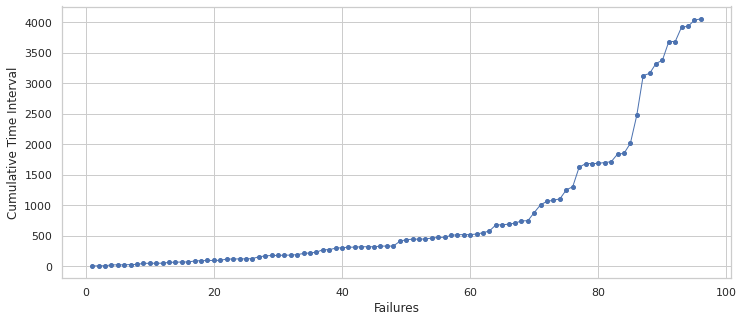

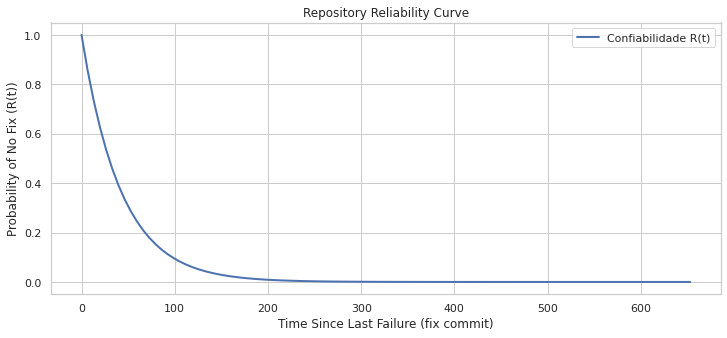

Confiabilidade R(1) = 0.9766
Confiabilidade R(5) = 0.8884
Confiabilidade R(10) = 0.7893
Confiabilidade R(50) = 0.3063
Confiabilidade R(100) = 0.0938
{'project': 'picasso', 'R1': '0.9766', 'R5': '0.8884', 'R10': '0.7893', 'R50': '0.3063', 'R100': '0.0938'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,picasso/src/test/java/com/squareup/picasso3/RequestCreatorTest.java,2,2.000000,0.500000,0.606531
1,picasso/src/test/java/com/squareup/picasso3/PicassoTest.java,2,2.000000,0.500000,0.606531
2,picasso/src/main/java/com/squareup/picasso/RequestBuilder.java,2,21.000000,0.047619,0.953497
3,picasso/src/test/java/com/squareup/picasso/RequestBuilderTest.java,2,21.000000,0.047619,0.953497
4,picasso/src/main/java/com/squareup/picasso/Downloader.java,2,47.000000,0.021277,0.978948
...,...,...,...,...,...
35,picasso/src/test/java/com/squareup/picasso/OkHttpDownloaderTest.java,2,353.000000,0.002833,0.997171
36,picasso/src/main/java/com/squareup/picasso3/Picasso.java,4,482.333333,0.002073,0.997929
37,picasso/src/main/java/com/squareup/picasso/ImageViewAction.java,2,528.000000,0.001894,0.998108
38,picasso/src/main/java/com/squareup/picasso/LruCache.java,2,581.000000,0.001721,0.998280


== accumulo ==


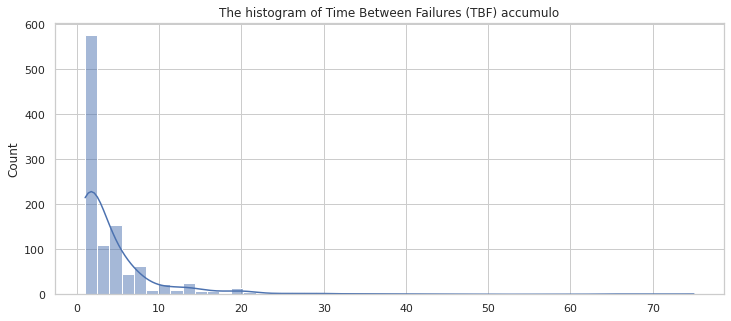

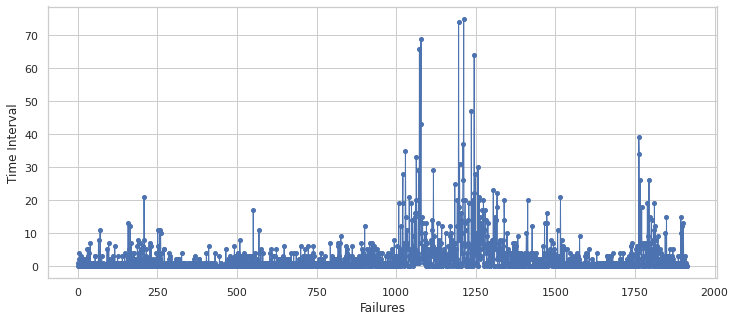

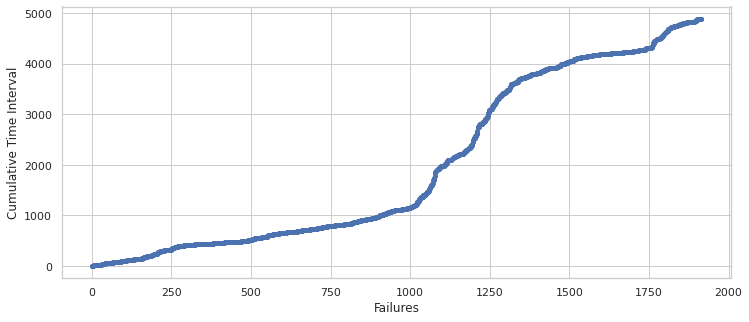

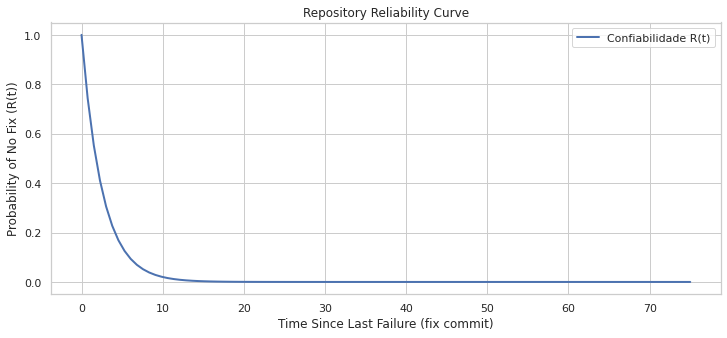

Confiabilidade R(1) = 0.6761
Confiabilidade R(5) = 0.1413
Confiabilidade R(10) = 0.0200
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'accumulo', 'R1': '0.6761', 'R5': '0.1413', 'R10': '0.0200', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,server/monitor/src/main/java/org/apache/accumulo/monitor/servlets/ReplicationServlet.java,5,0.25,4.000000,0.018316
1,core/src/main/java/org/apache/accumulo/core/classloader/DefaultContextClassLoaderFactory.java,3,0.50,2.000000,0.135335
2,core/src/main/java/org/apache/accumulo/core/spi/common/ContextClassLoaderFactory.java,3,0.50,2.000000,0.135335
3,src/examples/wikisearch/ingest/src/main/java/org/apache/accumulo/examples/wikisearch/ingest/WikipediaInputFormat.java,3,0.50,2.000000,0.135335
4,server/master/src/main/java/org/apache/accumulo/master/state/TInfo.java,2,1.00,1.000000,0.367879
...,...,...,...,...,...
1621,test/src/test/java/org/apache/accumulo/test/iterator/RegExTest.java,2,3170.00,0.000315,0.999685
1622,core/src/test/java/org/apache/accumulo/core/iterators/system/ColumnFilterTest.java,2,3170.00,0.000315,0.999685
1623,core/src/main/java/org/apache/accumulo/core/data/Condition.java,2,3785.00,0.000264,0.999736
1624,server/base/src/main/java/org/apache/accumulo/server/util/ZooZap.java,2,3904.00,0.000256,0.999744


== cglib ==


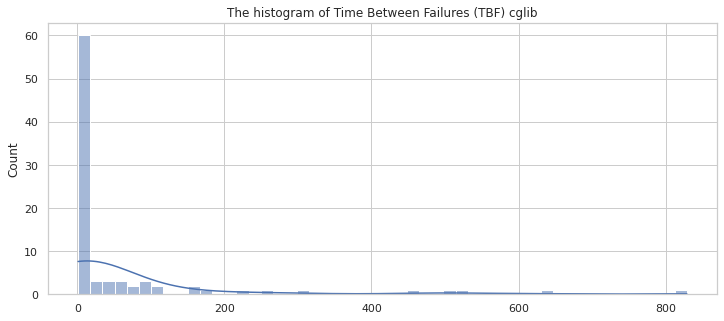

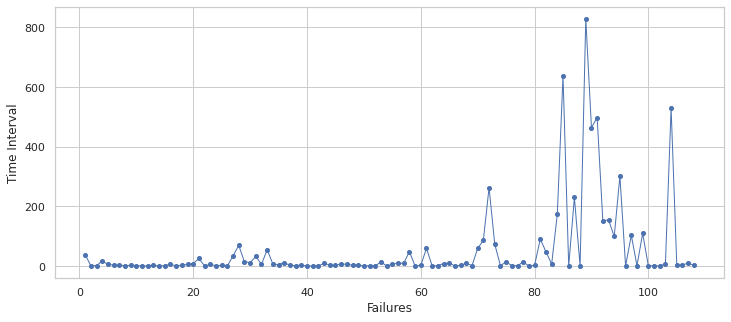

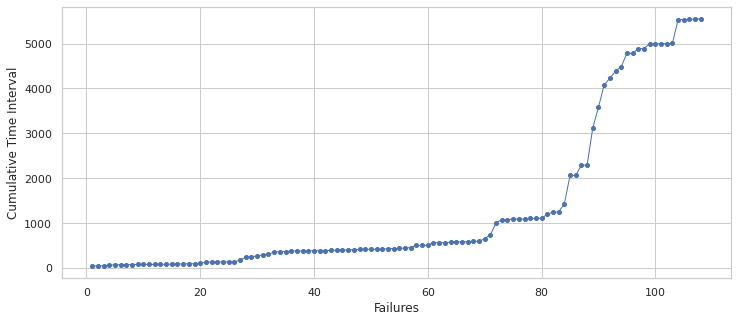

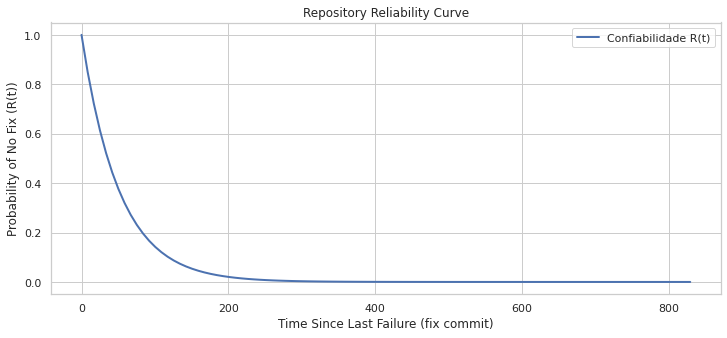

Confiabilidade R(1) = 0.9807
Confiabilidade R(5) = 0.9073
Confiabilidade R(10) = 0.8232
Confiabilidade R(50) = 0.3781
Confiabilidade R(100) = 0.1430
{'project': 'cglib', 'R1': '0.9807', 'R5': '0.9073', 'R10': '0.8232', 'R50': '0.3781', 'R100': '0.1430'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,cglib/src/test/java/net/sf/cglib/proxysample/ProxySample.java,2,1.0,1.000000,0.367879
1,cglib/src/main/java/net/sf/cglib/core/ClassEmitter.java,2,1.0,1.000000,0.367879
2,src/proxy/net/sf/cglib/transform/AddStaticInitTransformer.java,2,2.0,0.500000,0.606531
3,src/proxy/net/sf/cglib/Delegator.java,2,3.0,0.333333,0.716531
4,src/proxy/net/sf/cglib/KeyFactory.java,2,4.0,0.250000,0.778801
...,...,...,...,...,...
37,src/proxy/net/sf/cglib/proxy/MethodInterceptorGenerator.java,3,1315.0,0.000760,0.999240
38,src/proxy/net/sf/cglib/core/ReflectUtils.java,2,1739.0,0.000575,0.999425
39,src/proxy/net/sf/cglib/core/DebuggingClassWriter.java,3,1851.0,0.000540,0.999460
40,src/proxy/net/sf/cglib/transform/AbstractTransformTask.java,2,1897.0,0.000527,0.999473


== elasticsearch ==


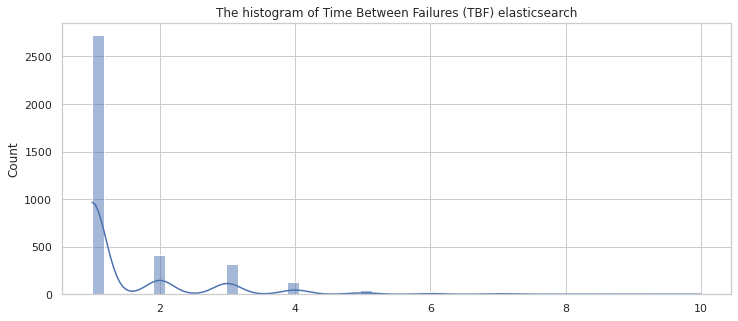

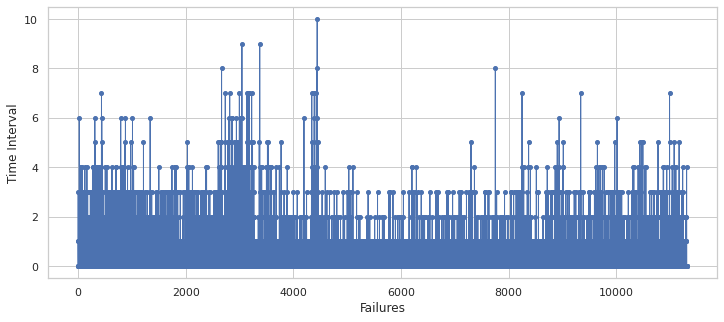

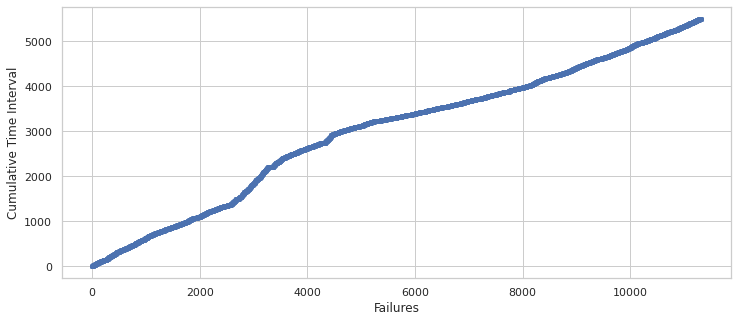

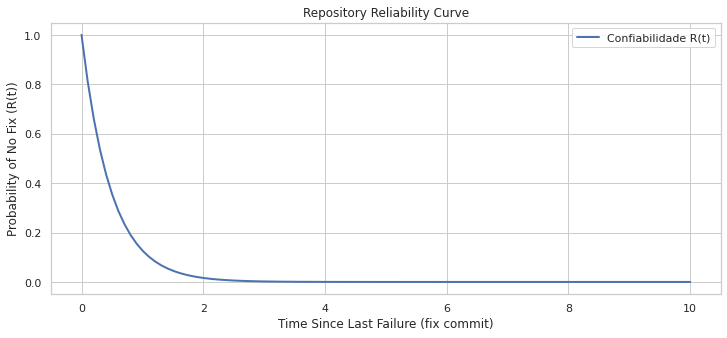

Confiabilidade R(1) = 0.1275
Confiabilidade R(5) = 0.0000
Confiabilidade R(10) = 0.0000
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'elasticsearch', 'R1': '0.1275', 'R5': '0.0000', 'R10': '0.0000', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/test/java/org/elasticsearch/discovery/DiscoveryWithServiceDisruptionsTests.java,5,0.250000,4.000000,0.018316
1,src/test/java/org/elasticsearch/NamingConventionTests.java,5,0.250000,4.000000,0.018316
2,src/test/java/org/elasticsearch/plugins/SitePluginTests.java,4,0.333333,3.000000,0.049787
3,src/test/java/org/elasticsearch/cluster/routing/RoutingBackwardCompatibilityUponUpgradeTests.java,4,0.333333,3.000000,0.049787
4,src/test/java/org/elasticsearch/common/logging/log4j/LoggingConfigurationTests.java,4,0.333333,3.000000,0.049787
...,...,...,...,...,...
6900,modules/lang-painless/src/test/java/org/elasticsearch/painless/NeedsScoreTests.java,2,2500.000000,0.000400,0.999600
6901,modules/transport-netty4/src/main/java/org/elasticsearch/http/netty4/Netty4HttpChannel.java,2,2542.000000,0.000393,0.999607
6902,modules/lang-painless/src/test/java/org/elasticsearch/painless/AugmentationTests.java,2,2583.000000,0.000387,0.999613
6903,modules/lang-painless/src/test/java/org/elasticsearch/painless/DefBootstrapTests.java,2,2840.000000,0.000352,0.999648


== RxJava ==


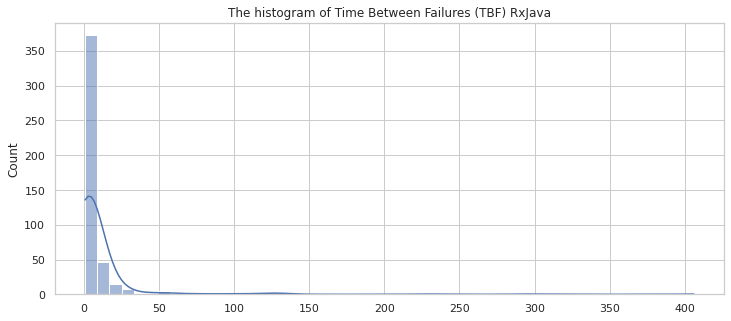

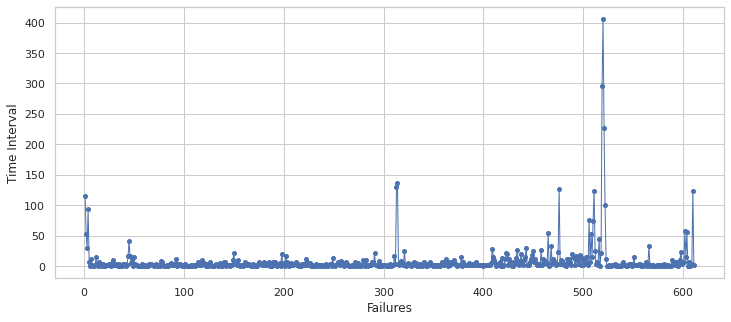

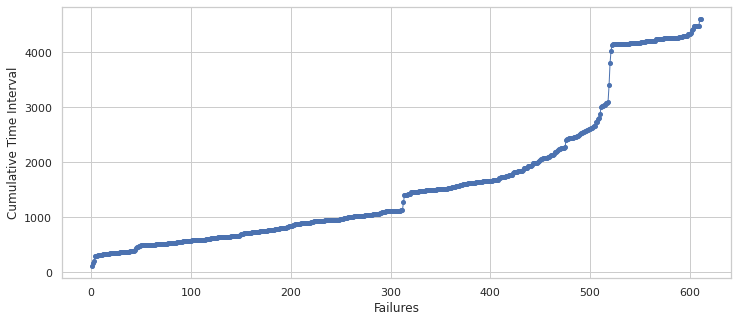

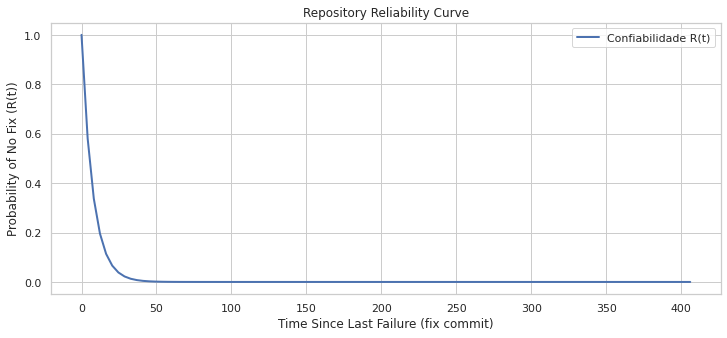

Confiabilidade R(1) = 0.8758
Confiabilidade R(5) = 0.5153
Confiabilidade R(10) = 0.2655
Confiabilidade R(50) = 0.0013
Confiabilidade R(100) = 0.0000
{'project': 'RxJava', 'R1': '0.8758', 'R5': '0.5153', 'R10': '0.2655', 'R50': '0.0013', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/main/java/io/reactivex/internal/operators/PublisherGenerate.java,2,1.0,1.000000,0.367879
1,src/test/java/io/reactivex/internal/operators/OperatorMergeTest.java,2,1.0,1.000000,0.367879
2,src/test/java/rx/subscriptions/CompositeSubscriptionTest.java,2,1.0,1.000000,0.367879
3,rxjava-core/src/test/java/rx/subscriptions/SerialSubscriptionTests.java,2,1.0,1.000000,0.367879
4,rxjava-core/src/main/java/rx/subscriptions/SerialSubscription.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
538,src/test/java/io/reactivex/internal/operators/single/SingleMiscTest.java,2,1034.0,0.000967,0.999033
539,src/main/java/io/reactivex/rxjava3/internal/operators/observable/ObservableSwitchMap.java,2,1294.0,0.000773,0.999228
540,src/main/java/io/reactivex/rxjava3/internal/schedulers/SchedulerWhen.java,2,1644.0,0.000608,0.999392
541,src/main/java/io/reactivex/rxjava3/core/Scheduler.java,2,1812.0,0.000552,0.999448


== dagger ==


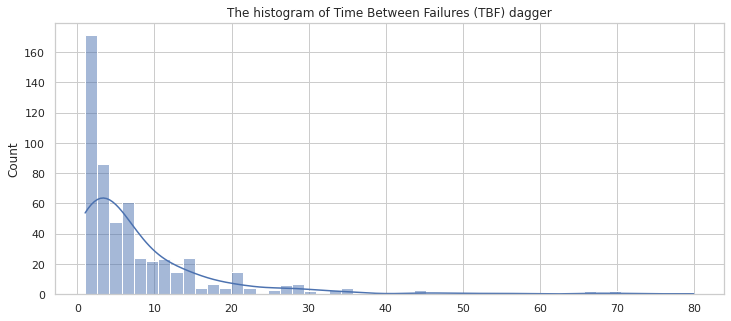

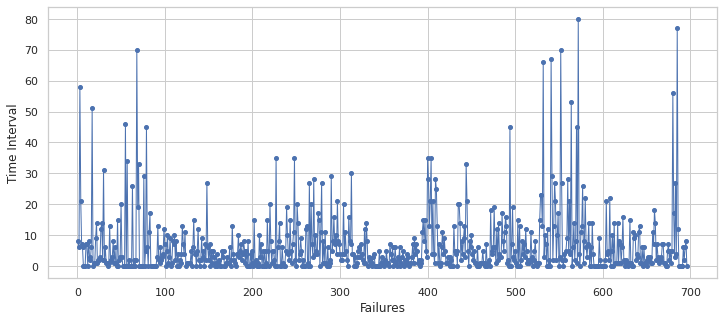

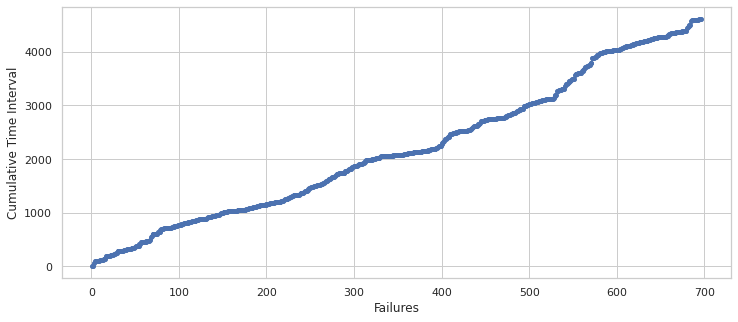

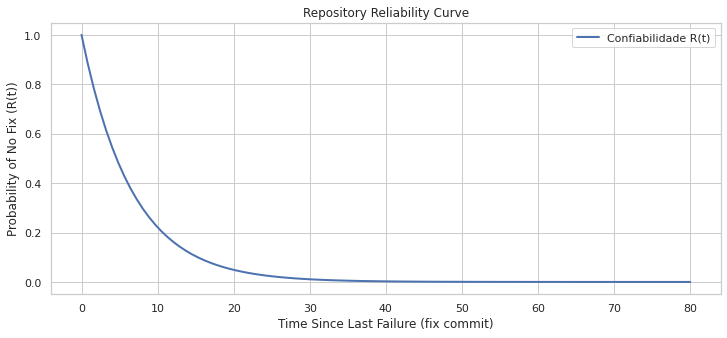

Confiabilidade R(1) = 0.8600
Confiabilidade R(5) = 0.4704
Confiabilidade R(10) = 0.2213
Confiabilidade R(50) = 0.0005
Confiabilidade R(100) = 0.0000
{'project': 'dagger', 'R1': '0.8600', 'R5': '0.4704', 'R10': '0.2213', 'R50': '0.0005', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,java/dagger/internal/codegen/ComponentDescriptorFactory.java,2,1.0,1.000000,0.367879
1,compiler/src/main/java/dagger/internal/codegen/TypeUtils.java,3,1.5,0.666667,0.513417
2,compiler/src/it/functional-tests/src/main/java/test/subcomponent/hiding/ChildComponent.java,2,2.0,0.500000,0.606531
3,compiler/src/it/functional-tests/src/main/java/test/subcomponent/hiding/a/CommonName.java,2,2.0,0.500000,0.606531
4,javatests/dagger/functional/factory/FactoryImplicitModulesTest.java,2,2.0,0.500000,0.606531
...,...,...,...,...,...
525,java/dagger/internal/codegen/bindinggraphvalidation/BindingGraphValidationModule.java,2,1218.0,0.000821,0.999179
526,javatests/dagger/functional/membersinject/MembersWithInstanceNameTest.java,2,1313.0,0.000762,0.999239
527,java/dagger/internal/codegen/binding/DependencyRequestFormatter.java,2,1625.0,0.000615,0.999385
528,javatests/dagger/android/processor/AndroidMapKeyValidatorTest.java,2,1845.0,0.000542,0.999458


== jenkins ==


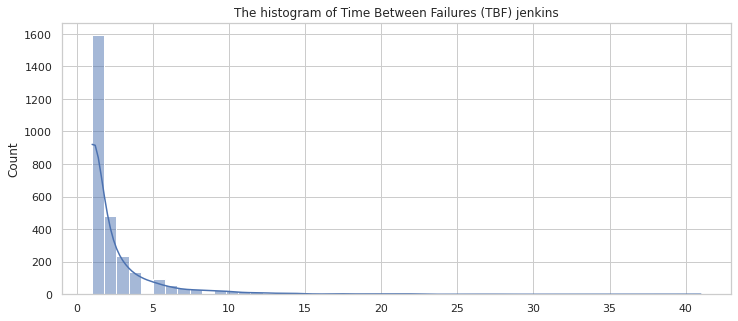

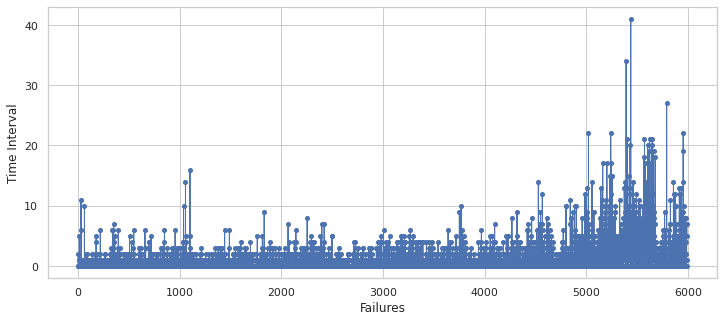

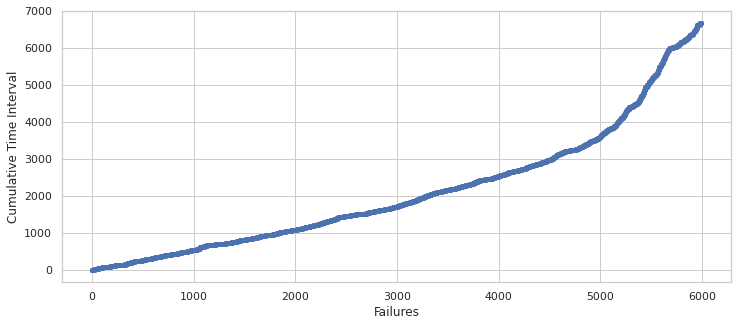

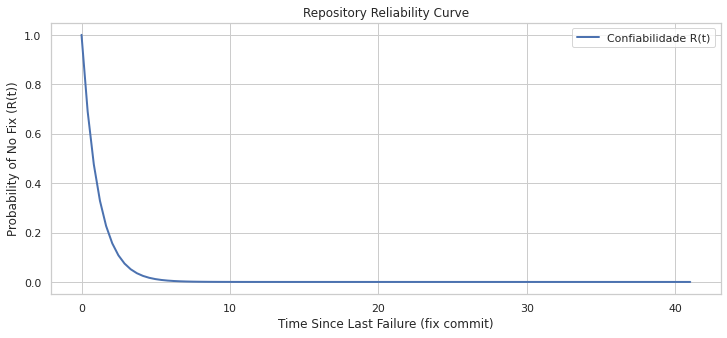

Confiabilidade R(1) = 0.4080
Confiabilidade R(5) = 0.0113
Confiabilidade R(10) = 0.0001
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'jenkins', 'R1': '0.4080', 'R5': '0.0113', 'R10': '0.0001', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,core/src/main/java/jenkins/security/admin/AdminWhitelistRule.java,4,0.666667,1.500000,0.223130
1,test/src/test/java/hudson/maven/MavenMultiModuleLogRotatorCleanArtifacts.java,2,1.000000,1.000000,0.367879
2,test/src/test/java/hudson/tasks/test/TrivialTestResultAction.java,2,1.000000,1.000000,0.367879
3,test/src/main/java/com/gargoylesoftware/htmlunit/WebClientUtil.java,2,1.000000,1.000000,0.367879
4,core/src/test/java/hudson/FilePathSEC904Test.java,2,1.000000,1.000000,0.367879
...,...,...,...,...,...
818,core/src/main/java/hudson/util/AWTProblem.java,2,4519.000000,0.000221,0.999779
819,test/src/test/java/hudson/model/RunTest.java,2,4584.000000,0.000218,0.999782
820,core/src/main/java/hudson/tasks/BuildWrapper.java,2,4863.000000,0.000206,0.999794
821,test/src/test/java/hudson/bugs/DateConversionTest.java,2,5232.000000,0.000191,0.999809


== tika ==


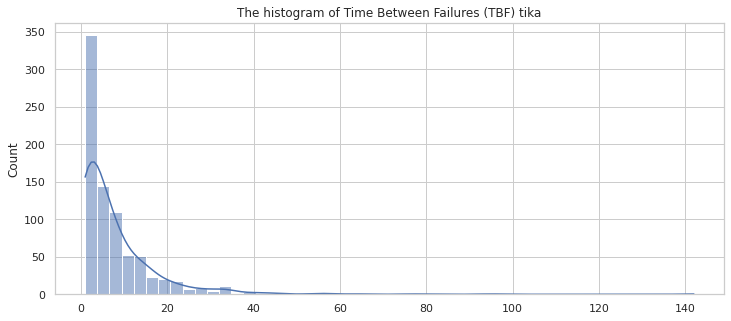

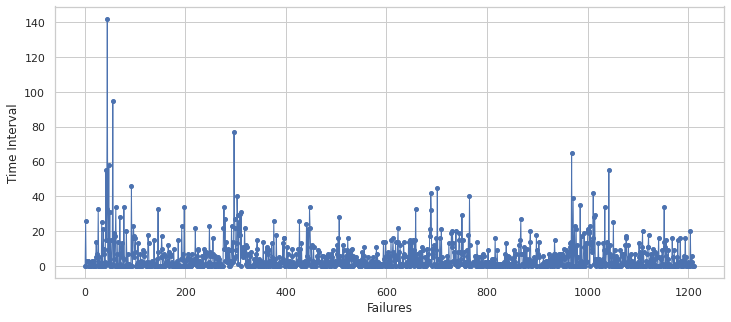

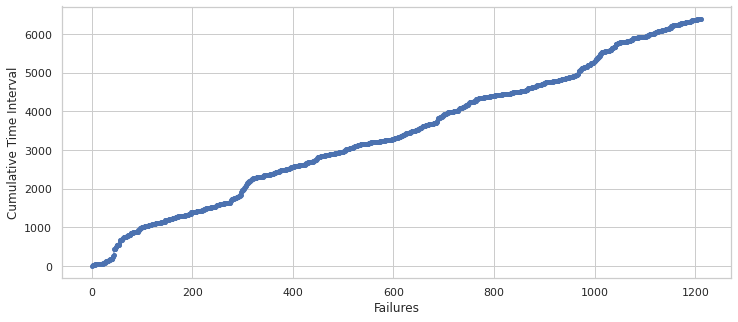

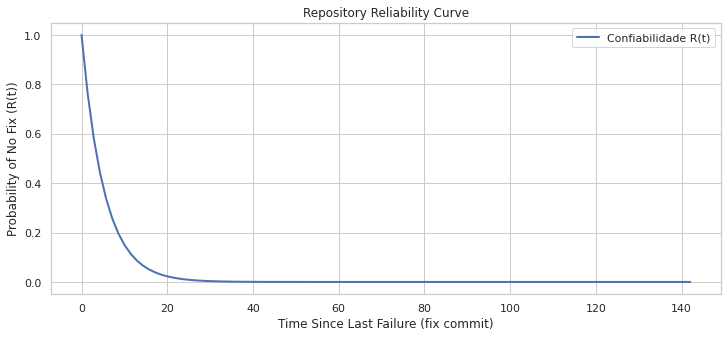

Confiabilidade R(1) = 0.8274
Confiabilidade R(5) = 0.3879
Confiabilidade R(10) = 0.1504
Confiabilidade R(50) = 0.0001
Confiabilidade R(100) = 0.0000
{'project': 'tika', 'R1': '0.8274', 'R5': '0.3879', 'R10': '0.1504', 'R50': '0.0001', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,tika-parsers/src/test/java/org/apache/tika/parser/gdal/TestGDALParser.java,3,0.5,2.000000,0.135335
1,tika-parsers/tika-parsers-standard/tika-parsers-standard-modules/tika-parser-microsoft-module/src/main/java/org/apache/tika/parser/microsoft/ooxml/xwpf/XWPFEventBasedWordExtractor.java,3,0.5,2.000000,0.135335
2,tika-parsers/tika-parsers-classic/tika-parsers-classic-modules/tika-parser-microsoft-module/src/main/java/org/apache/tika/parser/microsoft/AbstractListManager.java,3,0.5,2.000000,0.135335
3,tika-parsers/tika-parsers-advanced/tika-parser-nlp-module/src/main/java/org/apache/tika/parser/journal/TEIDOMParser.java,3,0.5,2.000000,0.135335
4,tika-parsers/src/main/java/org/apache/tika/parser/journal/GrobidParser.java,3,0.5,2.000000,0.135335
...,...,...,...,...,...
785,tika-core/src/main/java/org/apache/tika/exception/EncryptedDocumentException.java,2,3464.0,0.000289,0.999711
786,tika-example/src/test/java/org/apache/tika/example/ContentHandlerExampleTest.java,2,3571.0,0.000280,0.999720
787,tika-core/src/test/java/org/apache/tika/mime/PatternsTest.java,2,3590.0,0.000279,0.999721
788,tika-core/src/test/java/org/apache/tika/sax/SecureContentHandlerTest.java,2,3590.0,0.000279,0.999721


== argouml ==


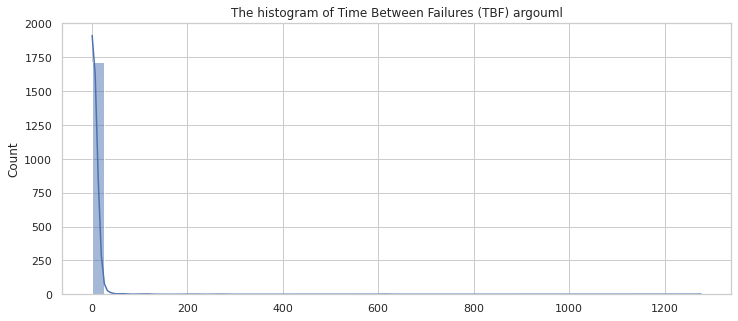

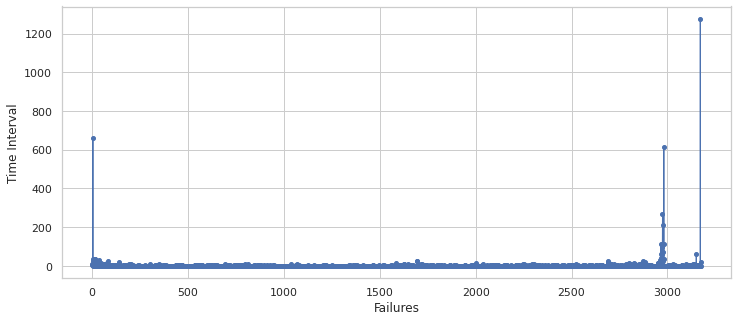

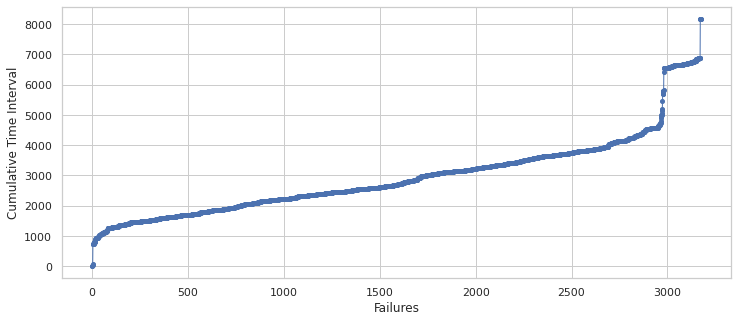

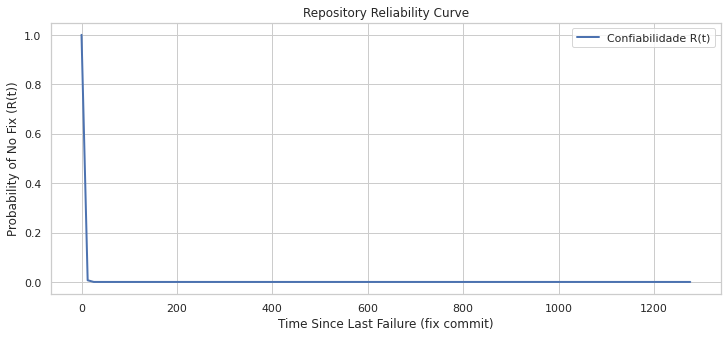

Confiabilidade R(1) = 0.6783
Confiabilidade R(5) = 0.1436
Confiabilidade R(10) = 0.0206
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'argouml', 'R1': '0.6783', 'R5': '0.1436', 'R10': '0.0206', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/argouml-core-umlpropertypanels/src/org/argouml/core/propertypanels/ui/UMLExpandableRowSelector.java,3,0.5,2.000000,0.135335
1,src/argouml-app/src/org/argouml/uml/ui/ActionImportFromSources.java,2,1.0,1.000000,0.367879
2,src/argouml-app/src/org/argouml/cognitive/ui/GoListToPriorityToItem.java,2,1.0,1.000000,0.367879
3,tests/org/argouml/model/TestExtensionMechanismsHelper.java,2,1.0,1.000000,0.367879
4,tests/org/argouml/model/TestUseCasesFactory.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
1429,src/argouml-app/tests/org/argouml/persistence/TestZargoFilePersister.java,3,2140.5,0.000467,0.999533
1430,src/argouml-app/src/org/argouml/moduleloader/ModuleLoader2.java,3,2194.0,0.000456,0.999544
1431,src/argouml-core-model-mdr/tests/org/argouml/model/mdr/TestReadCompressedFilesAndHref.java,2,3628.0,0.000276,0.999724
1432,src/argouml-core-diagrams-sequence2/tests/org/argouml/persistence/TestDiagramUpdateAtLoad.java,2,3886.0,0.000257,0.999743


== camel ==


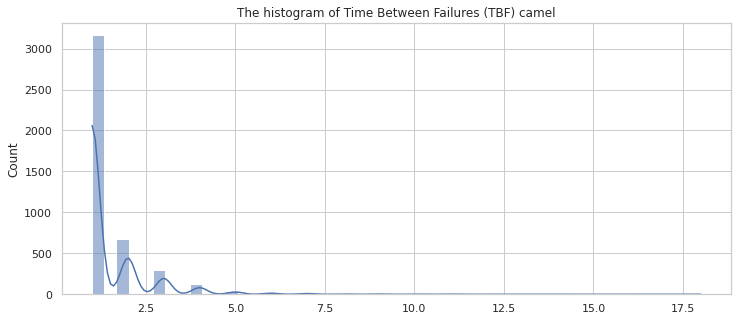

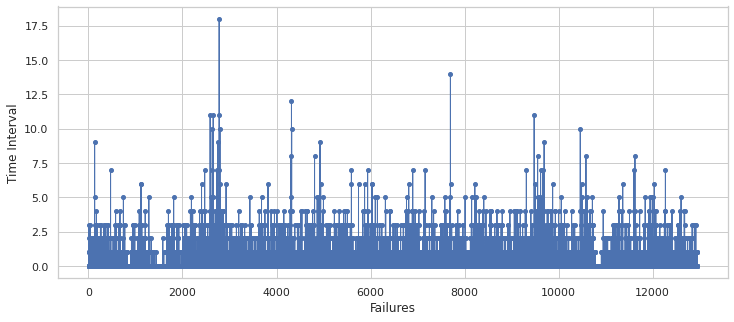

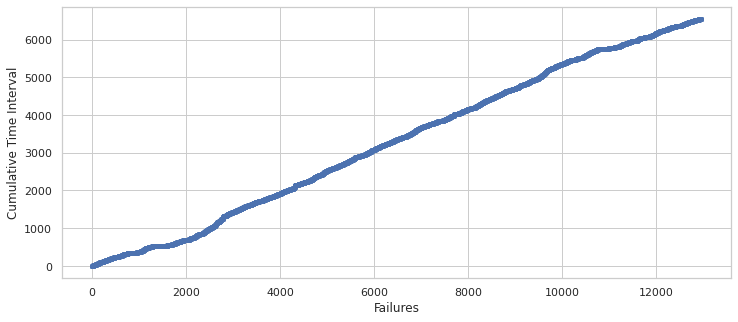

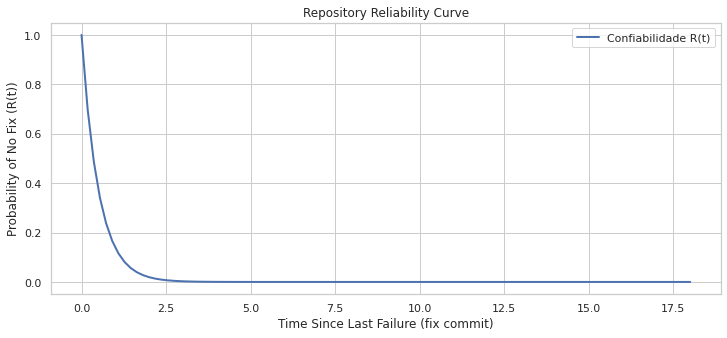

Confiabilidade R(1) = 0.1385
Confiabilidade R(5) = 0.0001
Confiabilidade R(10) = 0.0000
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'camel', 'R1': '0.1385', 'R5': '0.0001', 'R10': '0.0000', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,components/camel-swagger-java/src/main/java/org/apache/camel/swagger/RestSwaggerApiDeclarationServlet.java,6,0.200000,5.000000,0.006738
1,components/camel-aws/camel-aws2-translate/src/main/java/org/apache/camel/component/aws2/translate/Translate2LanguageEnum.java,21,0.200000,5.000000,0.006738
2,components/camel-hystrix/src/main/java/org/apache/camel/component/hystrix/HystrixProcessor.java,5,0.250000,4.000000,0.018316
3,components/camel-hystrix/src/main/java/org/apache/camel/component/hystrix/HystrixProcessorCommand.java,4,0.333333,3.000000,0.049787
4,camel-core/src/main/java/org/apache/camel/spi/EndpointRegistry.java,4,0.333333,3.000000,0.049787
...,...,...,...,...,...
8853,components/camel-jms/src/test/java/org/apache/camel/component/jms/ConsumeJmsObjectMessageTest.java,2,5099.000000,0.000196,0.999804
8854,components/camel-ftp/src/main/java/org/apache/camel/component/file/remote/RemoteFileComponent.java,2,5329.000000,0.000188,0.999812
8855,components/camel-rss/src/main/java/org/apache/camel/component/rss/UpdatedDateFilter.java,2,5335.000000,0.000187,0.999813
8856,components/camel-atom/src/main/java/org/apache/camel/component/feed/EntryFilter.java,2,5335.000000,0.000187,0.999813


== weka-3.8 ==


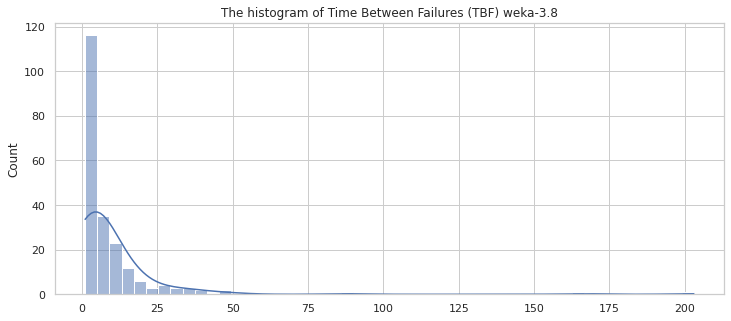

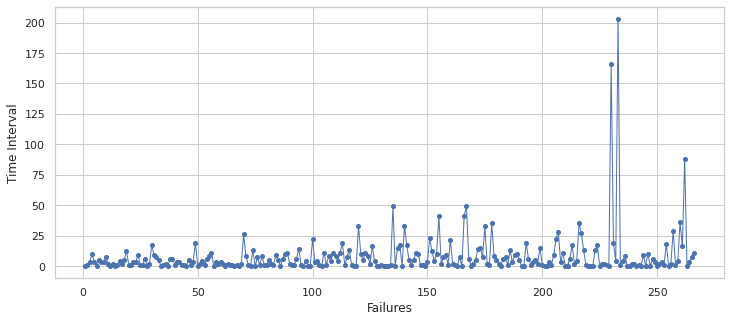

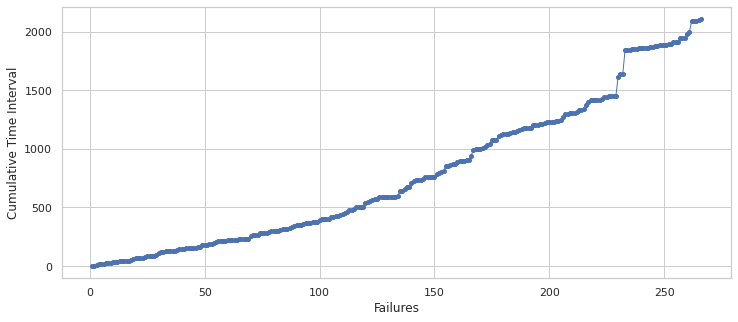

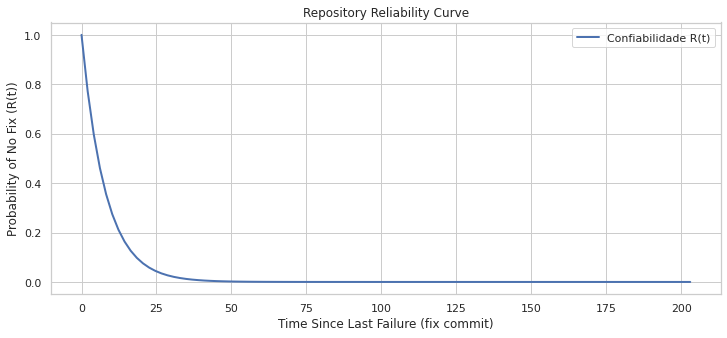

Confiabilidade R(1) = 0.8815
Confiabilidade R(5) = 0.5321
Confiabilidade R(10) = 0.2831
Confiabilidade R(50) = 0.0018
Confiabilidade R(100) = 0.0000
{'project': 'weka-3.8', 'R1': '0.8815', 'R5': '0.5321', 'R10': '0.2831', 'R50': '0.0018', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,weka/src/main/java/weka/classifiers/meta/LogitBoost.java,2,1.0,1.000000,0.367879
1,packages/internal/WekaExcel/src/main/java/weka/core/converters/ExcelSaver.java,2,1.0,1.000000,0.367879
2,weka/src/main/java/weka/gui/knowledgeflow/steps/SaverStepEditorDialog.java,2,1.0,1.000000,0.367879
3,weka/src/main/java/weka/datagenerators/clusterers/SubspaceCluster.java,2,3.0,0.333333,0.716531
4,weka/src/main/java/weka/datagenerators/clusterers/SubspaceClusterDefinition.java,2,3.0,0.333333,0.716531
...,...,...,...,...,...
89,weka/src/main/java/weka/knowledgeflow/steps/SerializedModelSaver.java,2,1070.0,0.000935,0.999066
90,weka/src/main/java/weka/core/converters/ConverterResources.java,2,1089.0,0.000918,0.999082
91,packages/internal/timeseriesForecasting/src/main/java/weka/classifiers/timeseries/eval/TSEvaluation.java,2,1149.0,0.000870,0.999130
92,weka/src/main/java/weka/knowledgeflow/steps/DataGenerator.java,2,1206.0,0.000829,0.999171


== kafka ==


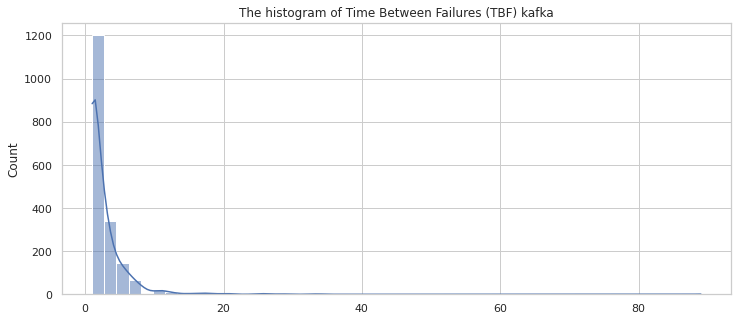

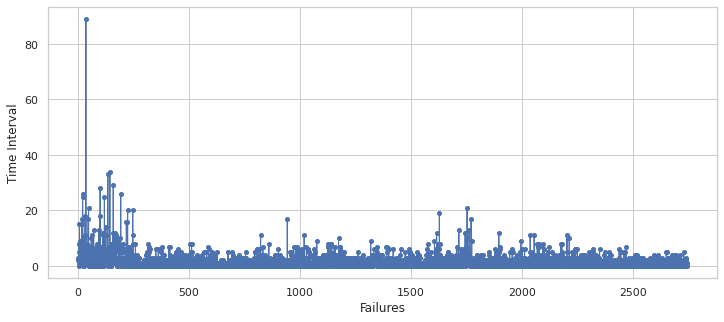

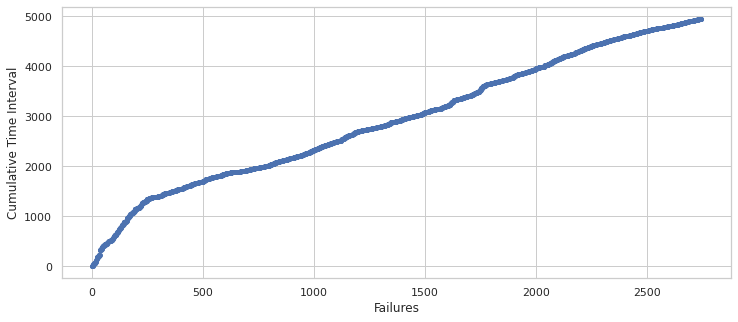

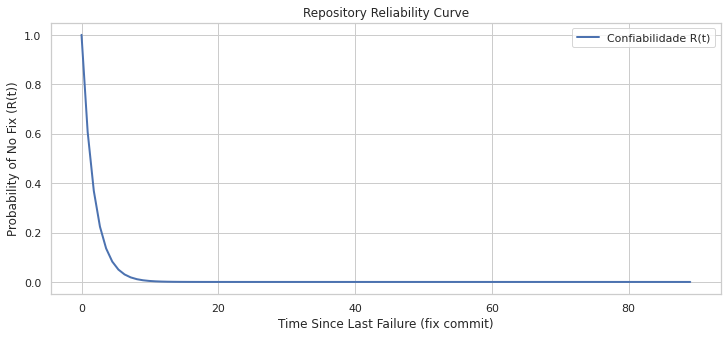

Confiabilidade R(1) = 0.5739
Confiabilidade R(5) = 0.0623
Confiabilidade R(10) = 0.0039
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'kafka', 'R1': '0.5739', 'R5': '0.0623', 'R10': '0.0039', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,clients/src/main/java/org/apache/kafka/common/serialization/ByteBufferSerializer.java,2,1.0,1.000000,0.367879
1,connect/mirror/src/test/java/org/apache/kafka/connect/mirror/integration/MirrorConnectorsWithCustomForwardingAdminIntegrationTest.java,2,1.0,1.000000,0.367879
2,streams/src/main/java/org/apache/kafka/streams/state/internals/ListValueStore.java,2,1.0,1.000000,0.367879
3,streams/src/main/java/org/apache/kafka/streams/state/internals/ChangeLoggingListValueBytesStore.java,2,1.0,1.000000,0.367879
4,core/src/main/scala/kafka/tools/KafkaMigrationTool.java,3,1.0,1.000000,0.367879
...,...,...,...,...,...
965,connect/runtime/src/test/java/org/apache/kafka/connect/storage/KafkaOffsetBackingStoreTest.java,2,2638.0,0.000379,0.999621
966,clients/src/main/java/org/apache/kafka/clients/InFlightRequests.java,2,2645.0,0.000378,0.999622
967,streams/src/main/java/org/apache/kafka/streams/state/ReadOnlyKeyValueStore.java,2,2733.0,0.000366,0.999634
968,clients/src/main/java/org/apache/kafka/common/security/authenticator/LoginManager.java,2,2764.0,0.000362,0.999638


== microprofile ==


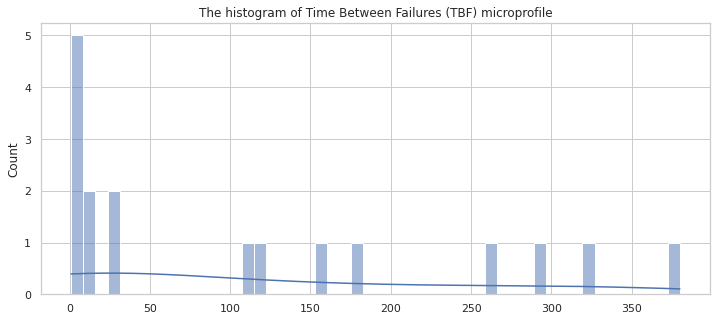

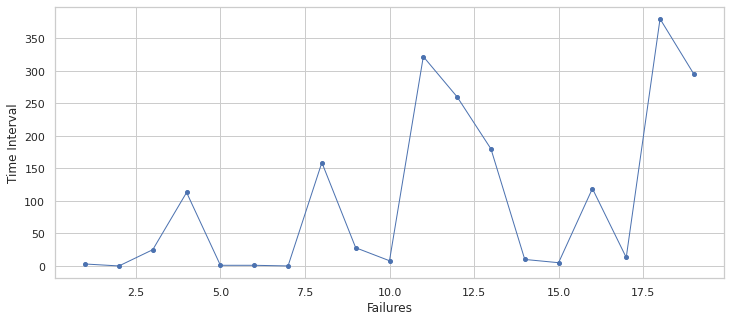

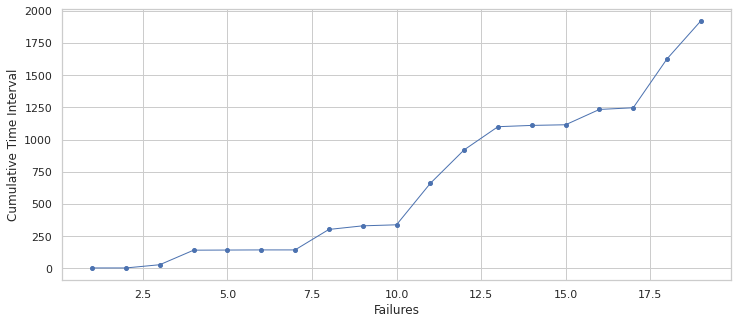

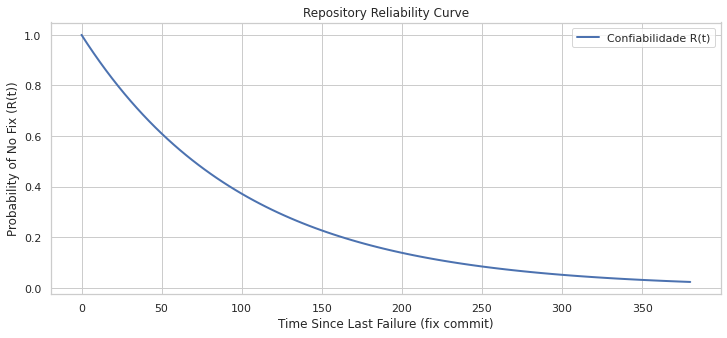

Confiabilidade R(1) = 0.9902
Confiabilidade R(5) = 0.9518
Confiabilidade R(10) = 0.9059
Confiabilidade R(50) = 0.6100
Confiabilidade R(100) = 0.3721
{'project': 'microprofile', 'R1': '0.9902', 'R5': '0.9518', 'R10': '0.9059', 'R50': '0.6100', 'R100': '0.3721'}


,filepath,n_commits,MTBF,lambda_failure,R_t


== ganttproject ==


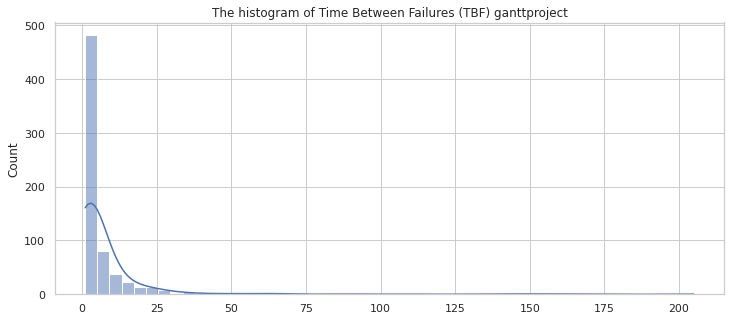

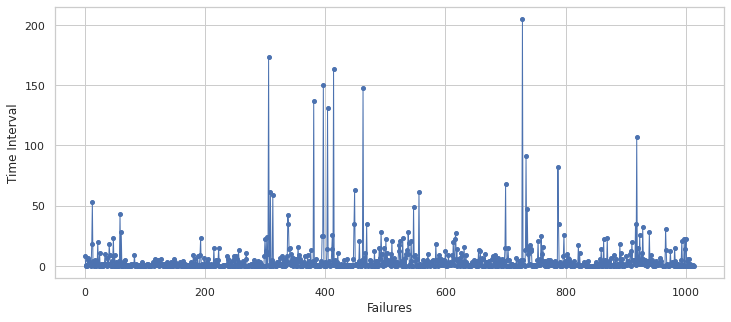

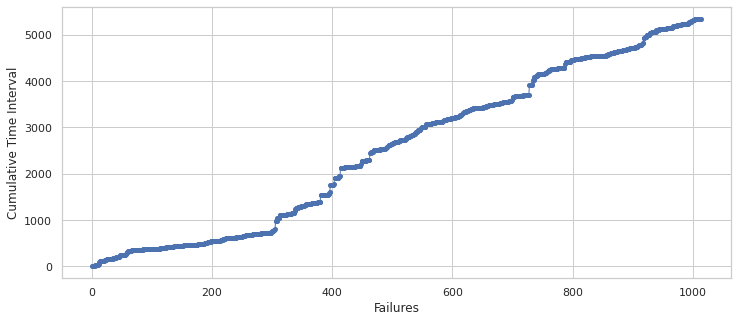

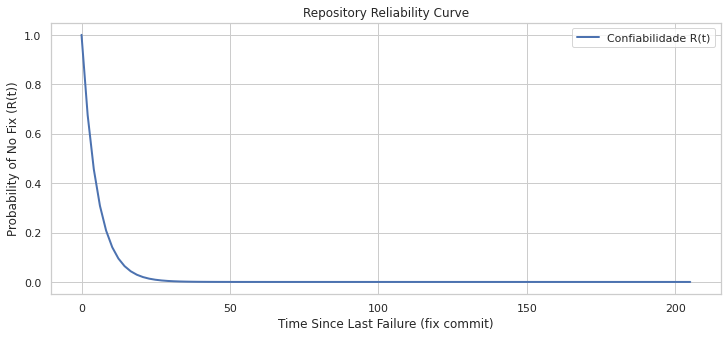

Confiabilidade R(1) = 0.8273
Confiabilidade R(5) = 0.3875
Confiabilidade R(10) = 0.1501
Confiabilidade R(50) = 0.0001
Confiabilidade R(100) = 0.0000
{'project': 'ganttproject', 'R1': '0.8273', 'R5': '0.3875', 'R10': '0.1501', 'R50': '0.0001', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,ganttproject/src/javax/annotation/Nullable.java,2,1.000000,1.000000,0.367879
1,ganttproject/src/com/google/common/annotations/VisibleForTesting.java,2,1.000000,1.000000,0.367879
2,ganttproject/src/com/google/common/base/Supplier.java,2,1.000000,1.000000,0.367879
3,ganttproject/src/com/google/common/base/Platform.java,2,1.000000,1.000000,0.367879
4,ganttproject/src/com/google/common/base/Suppliers.java,2,1.000000,1.000000,0.367879
...,...,...,...,...,...
1029,ganttproject-tester/test/net/sourceforge/ganttproject/chart/TaskRendererImplTest.java,4,1186.666667,0.000843,0.999158
1030,ganttproject/src/main/java/biz/ganttproject/impex/csv/GanttCSVExport.java,2,1270.000000,0.000787,0.999213
1031,ganttproject-tester/test/biz/ganttproject/core/calendar/WeekendCalendarImplTest.java,3,1404.000000,0.000712,0.999288
1032,ganttproject-tester/test/net/sourceforge/ganttproject/customProperty/CustomPropertyImportTest.java,4,1474.666667,0.000678,0.999322


== eureka ==


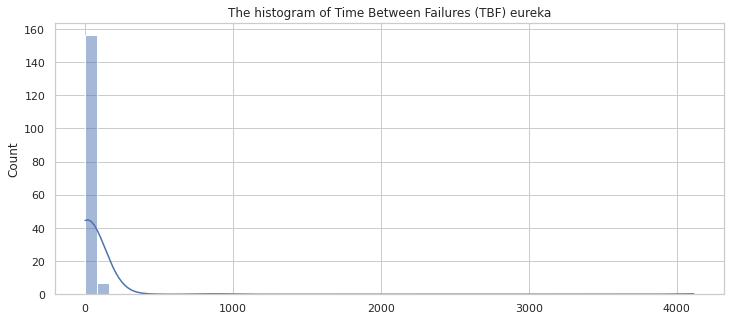

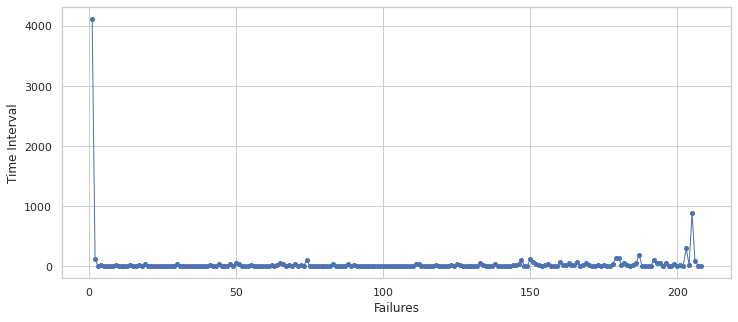

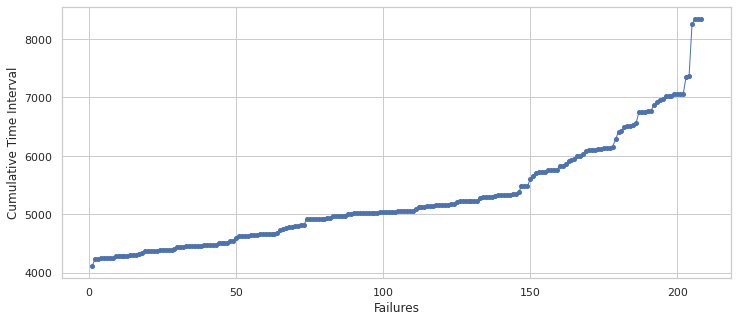

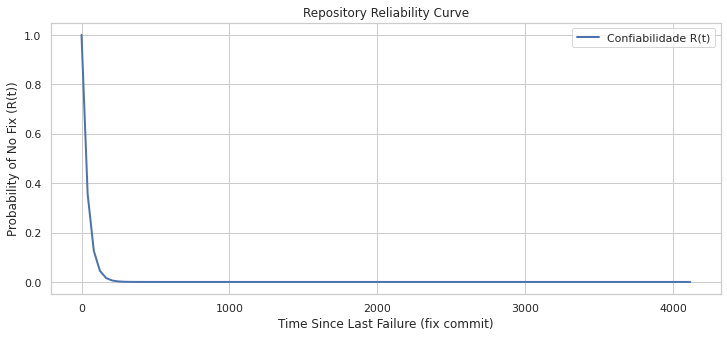

Confiabilidade R(1) = 0.9754
Confiabilidade R(5) = 0.8828
Confiabilidade R(10) = 0.7794
Confiabilidade R(50) = 0.2875
Confiabilidade R(100) = 0.0827
{'project': 'eureka', 'R1': '0.9754', 'R5': '0.8828', 'R10': '0.7794', 'R50': '0.2875', 'R100': '0.0827'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,eureka-client/src/test/java/com/netflix/discovery/DiscoveryClientHealthTest.java,2,1.0,1.000000,0.367879
1,eureka-client/src/main/java/com/netflix/discovery/providers/DefaultEurekaClientConfigProvider.java,2,1.0,1.000000,0.367879
2,eureka-core/src/main/java/com/netflix/eureka/cluster/ReplicationTaskProcessor.java,2,2.0,0.500000,0.606531
3,eureka-client/src/main/java/com/netflix/discovery/converters/jackson/builder/ApplicationsJacksonBuilder.java,2,3.0,0.333333,0.716531
4,eureka-client/src/test/java/com/netflix/discovery/provider/DiscoveryJerseyProviderTest.java,2,3.0,0.333333,0.716531
...,...,...,...,...,...
79,eureka-client/src/main/java/com/netflix/appinfo/AbstractInstanceConfig.java,2,1245.0,0.000803,0.999197
80,eureka-client/src/main/java/com/netflix/appinfo/PropertyBasedInstanceConfigConstants.java,2,1245.0,0.000803,0.999197
81,eureka-core/src/main/java/com/netflix/eureka/util/batcher/AcceptorExecutor.java,2,1748.0,0.000572,0.999428
82,eureka-client/src/main/java/com/netflix/discovery/shared/transport/jersey/AbstractJerseyEurekaHttpClient.java,2,2046.0,0.000489,0.999511


== retrofit ==


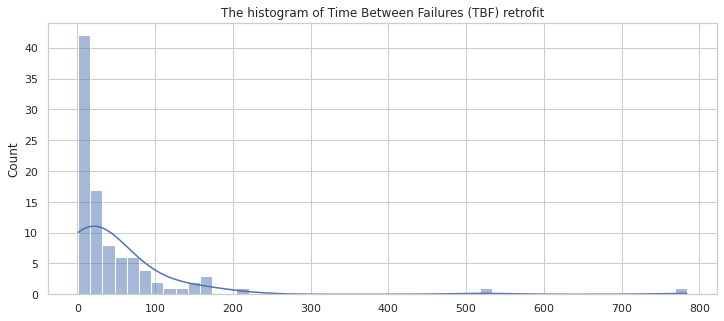

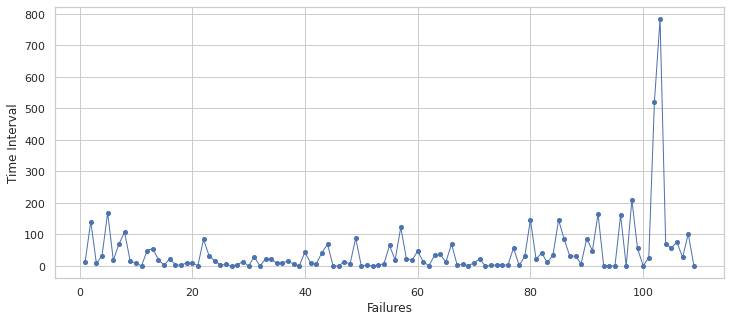

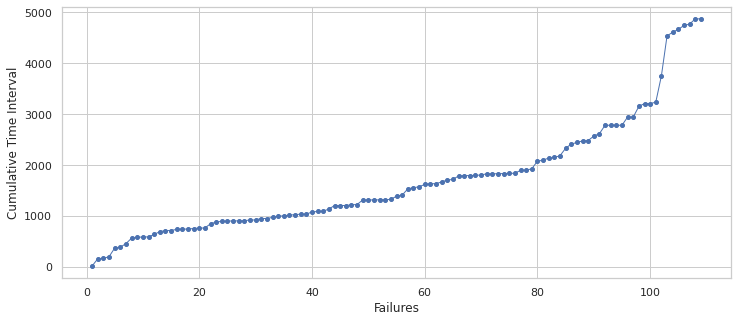

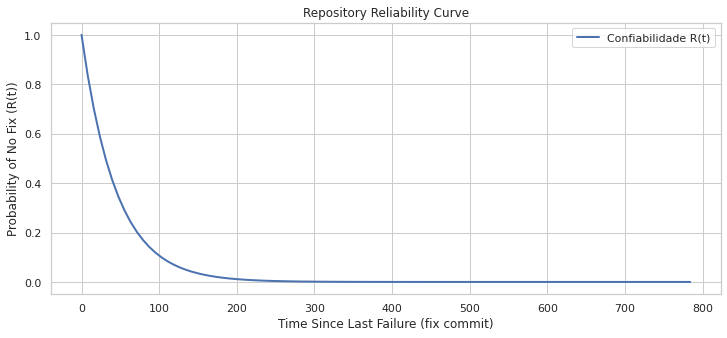

Confiabilidade R(1) = 0.9779
Confiabilidade R(5) = 0.8941
Confiabilidade R(10) = 0.7994
Confiabilidade R(50) = 0.3264
Confiabilidade R(100) = 0.1066
{'project': 'retrofit', 'R1': '0.9779', 'R5': '0.8941', 'R10': '0.7994', 'R50': '0.3264', 'R100': '0.1066'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,retrofit-adapters/rxjava/src/main/java/retrofit2/adapter/rxjava/ResultOnSubscribe.java,2,2.0,0.500000,0.606531
1,retrofit-adapters/rxjava/src/main/java/retrofit2/adapter/rxjava/BodyOnSubscribe.java,2,2.0,0.500000,0.606531
2,retrofit-adapters/rxjava/src/main/java/retrofit2/adapter/rxjava/CallOnSubscribe.java,2,2.0,0.500000,0.606531
3,http/src/main/java/retrofit/http/HttpProfiler.java,3,4.5,0.222222,0.800737
4,http/src/main/java/retrofit/http/RestAdapter.java,3,4.5,0.222222,0.800737
...,...,...,...,...,...
51,retrofit/src/main/java/retrofit2/Platform.java,3,742.0,0.001348,0.998653
52,retrofit/java-test/src/test/java/retrofit2/RetrofitTest.java,2,912.0,0.001096,0.998904
53,retrofit/src/test/java/retrofit2/RetrofitTest.java,2,1484.0,0.000674,0.999326
54,samples/src/main/java/com/example/retrofit/DeserializeErrorBody.java,2,1644.0,0.000608,0.999392


== xstream ==


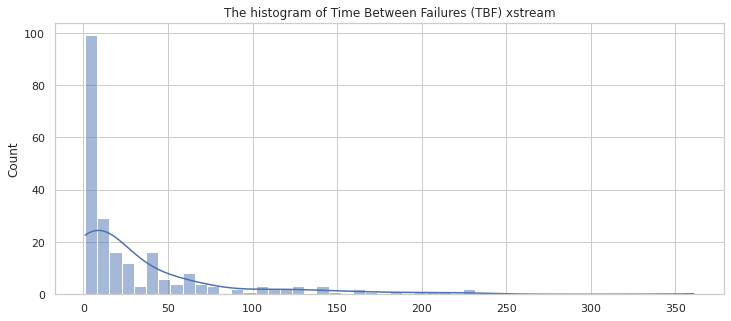

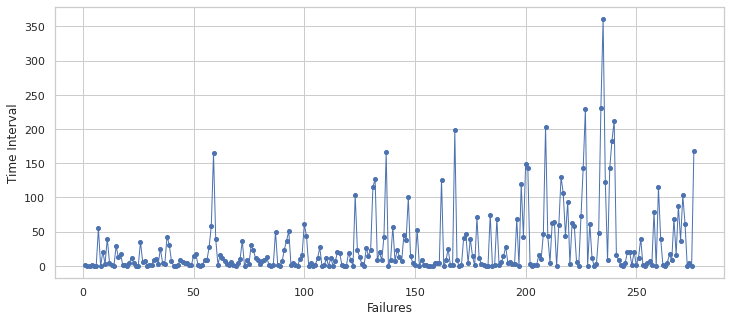

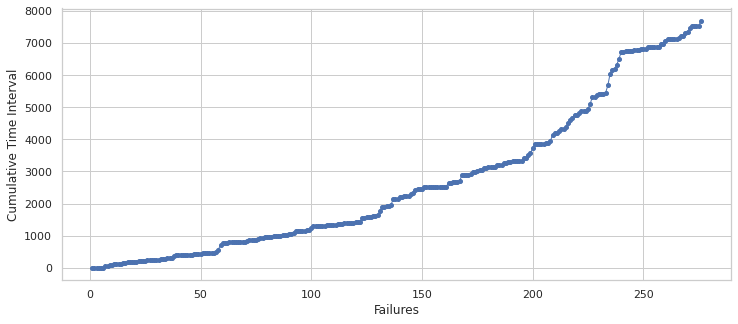

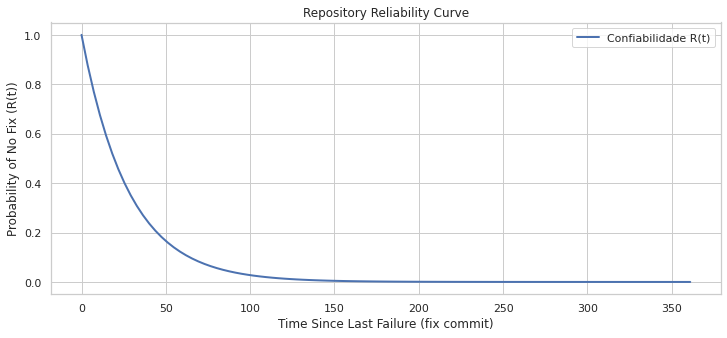

Confiabilidade R(1) = 0.9647
Confiabilidade R(5) = 0.8356
Confiabilidade R(10) = 0.6982
Confiabilidade R(50) = 0.1660
Confiabilidade R(100) = 0.0275
{'project': 'xstream', 'R1': '0.9647', 'R5': '0.8356', 'R10': '0.6982', 'R50': '0.1660', 'R100': '0.0275'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,xstream/src/test/com/thoughtworks/xstream/io/binary/BinaryStreamTest.java,3,0.5,2.000000,0.135335
1,xstream/src/java/com/thoughtworks/xstream/converters/composite/ObjectWithFieldsConverter.java,2,1.0,1.000000,0.367879
2,xstream/src/java/com/thoughtworks/xstream/core/UnmarshallingContextAdaptor.java,2,1.0,1.000000,0.367879
3,xstream/src/test/com/thoughtworks/xstream/converters/extended/JavaMethodConverterTest.java,2,1.0,1.000000,0.367879
4,xstream/src/java/com/thoughtworks/xstream/xml/dom4j/Dom4JXMLReader.java,2,2.0,0.500000,0.606531
...,...,...,...,...,...
138,xstream/src/java/com/thoughtworks/xstream/core/util/FastField.java,2,5196.0,0.000192,0.999808
139,xstream/src/java/com/thoughtworks/xstream/converters/collections/BitSetConverter.java,2,5204.0,0.000192,0.999808
140,xstream/src/java/com/thoughtworks/xstream/converters/collections/CharArrayConverter.java,2,5204.0,0.000192,0.999808
141,xstream/src/java/com/thoughtworks/xstream/converters/extended/EncodedByteArrayConverter.java,2,5204.0,0.000192,0.999808


== netty ==


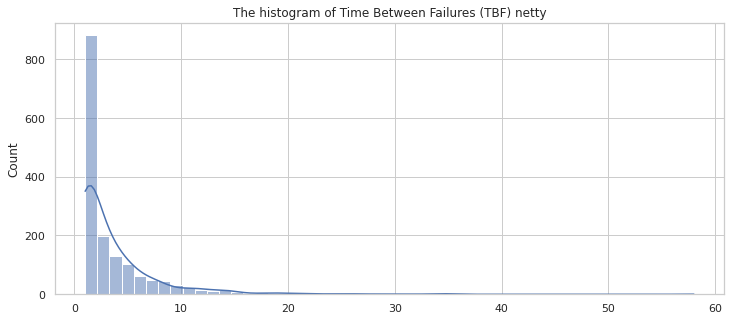

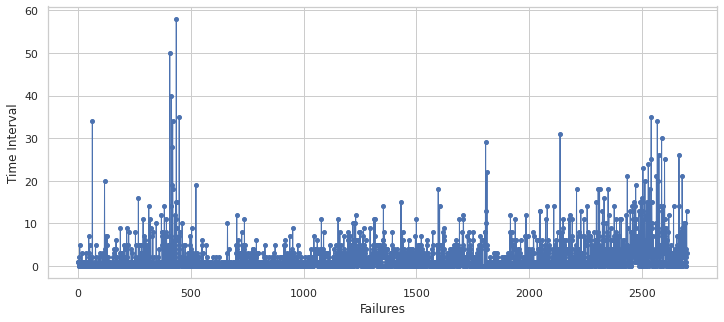

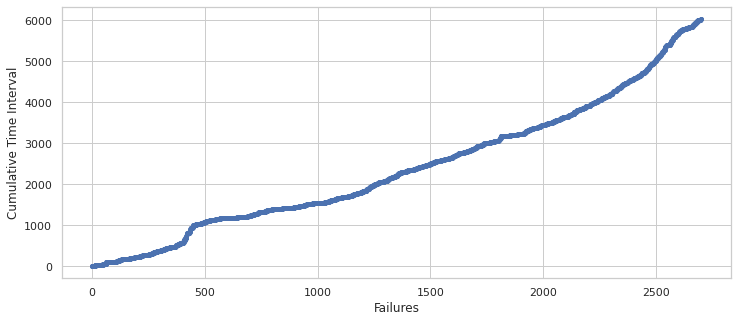

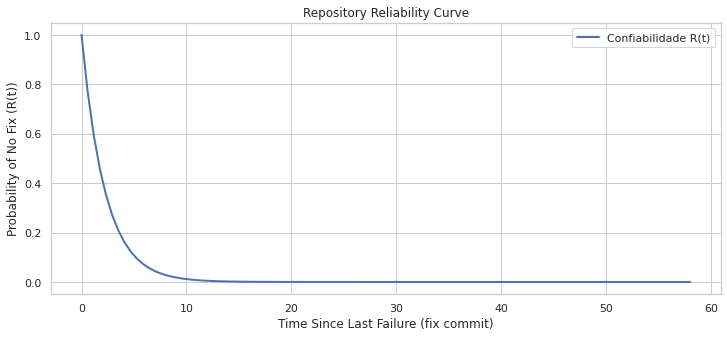

Confiabilidade R(1) = 0.6395
Confiabilidade R(5) = 0.1070
Confiabilidade R(10) = 0.0114
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'netty', 'R1': '0.6395', 'R5': '0.1070', 'R10': '0.0114', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,codec-http/src/main/java/io/netty/handler/codec/http/HttpPostRequestDecoder.java,6,0.4,2.500000,0.082085
1,handler/src/main/java/io/netty/handler/queue/BlockingReadHandler.java,2,1.0,1.000000,0.367879
2,src/main/java/org/jboss/netty/handler/region/FileRegionEncoder.java,2,1.0,1.000000,0.367879
3,example/src/main/java/io/netty/example/http/websocketx/autobahn/package-info.java,2,1.0,1.000000,0.367879
4,src/test/java/org/jboss/netty/buffer/LittleEndianCompositeChannelBufferTest.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
1156,transport/src/main/java/io/netty/channel/WriteBufferWaterMark.java,2,2912.0,0.000343,0.999657
1157,transport/src/main/java/io/netty/channel/socket/InternetProtocolFamily.java,2,3033.0,0.000330,0.999670
1158,common/src/main/java/io/netty/util/internal/ThreadLocalRandom.java,2,3732.0,0.000268,0.999732
1159,transport/src/main/java/io/netty/channel/AdaptiveRecvByteBufAllocator.java,2,3908.0,0.000256,0.999744


== Hystrix ==


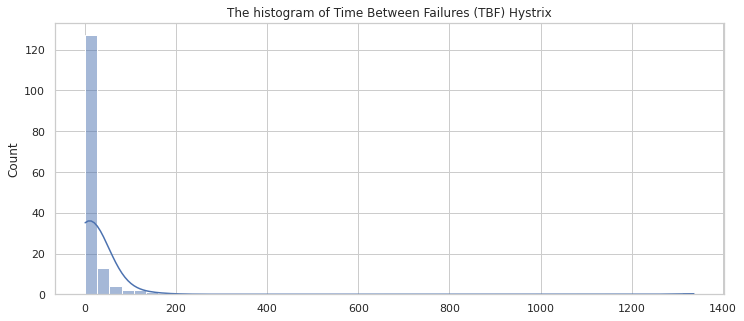

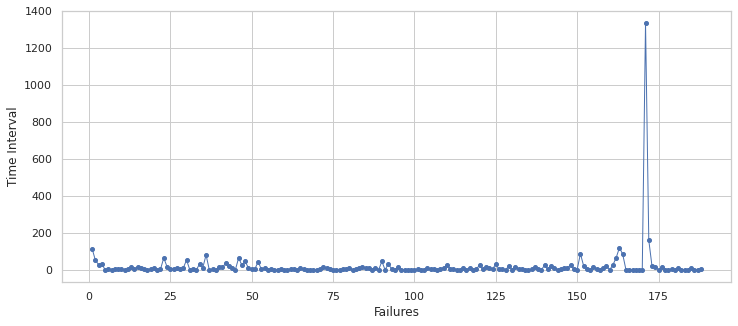

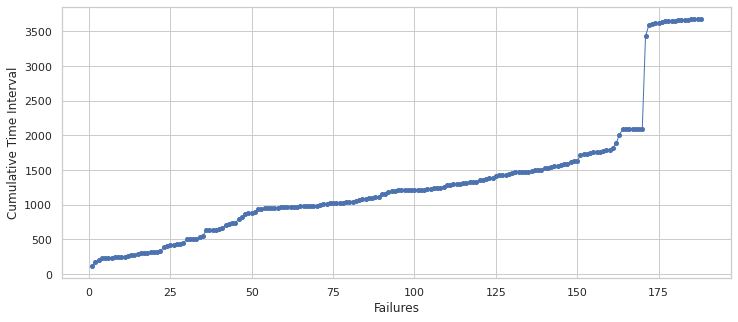

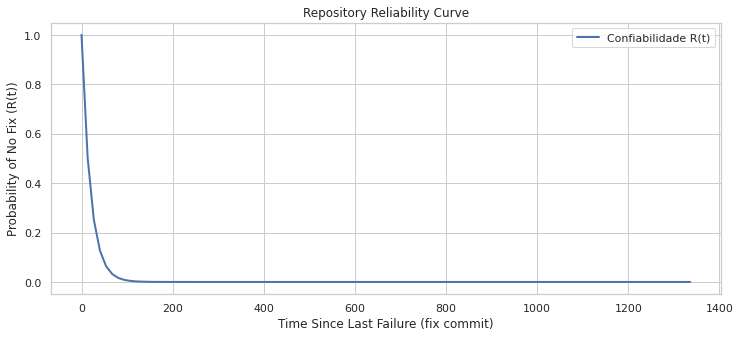

Confiabilidade R(1) = 0.9502
Confiabilidade R(5) = 0.7747
Confiabilidade R(10) = 0.6001
Confiabilidade R(50) = 0.0779
Confiabilidade R(100) = 0.0061
{'project': 'Hystrix', 'R1': '0.9502', 'R5': '0.7747', 'R10': '0.6001', 'R50': '0.0779', 'R100': '0.0061'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,hystrix-core/src/test/java/com/netflix/hystrix/HystrixCommandTestWithCustomConcurrencyStrategy.java,2,1.0,1.000000,0.367879
1,hystrix-core/src/test/java/com/netflix/hystrix/HystrixCommandPropertiesTest.java,2,2.0,0.500000,0.606531
2,hystrix-contrib/hystrix-yammer-metrics-publisher/src/main/java/com/netflix/hystrix/contrib/yammermetricspublisher/HystrixYammerMetricsPublisherCommand.java,2,2.0,0.500000,0.606531
3,hystrix-contrib/hystrix-rx-netty-metrics-stream/src/main/java/com/netflix/hystrix/contrib/rxnetty/metricsstream/JsonMappers.java,2,2.0,0.500000,0.606531
4,hystrix-core/src/main/java/com/netflix/hystrix/HystrixCommandProperties.java,2,2.0,0.500000,0.606531
...,...,...,...,...,...
68,hystrix-core/src/main/java/com/netflix/hystrix/HystrixRequestCache.java,3,597.5,0.001674,0.998328
69,hystrix-contrib/hystrix-javanica/src/main/java/com/netflix/hystrix/contrib/javanica/exception/ExceptionUtils.java,2,718.0,0.001393,0.998608
70,hystrix-core/src/main/java/com/netflix/hystrix/HystrixRequestLog.java,2,799.0,0.001252,0.998749
71,hystrix-core/src/main/java/com/netflix/hystrix/HystrixCircuitBreaker.java,3,837.0,0.001195,0.998806


== spring-framework ==


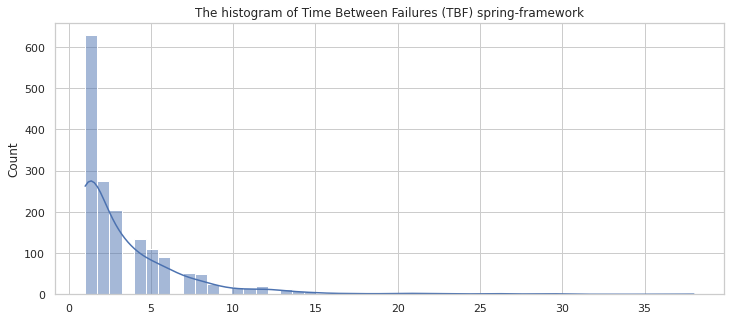

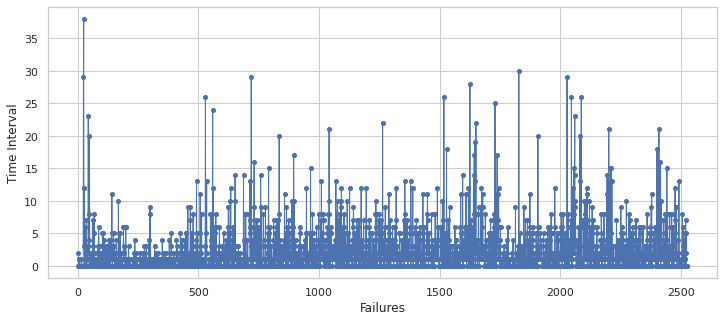

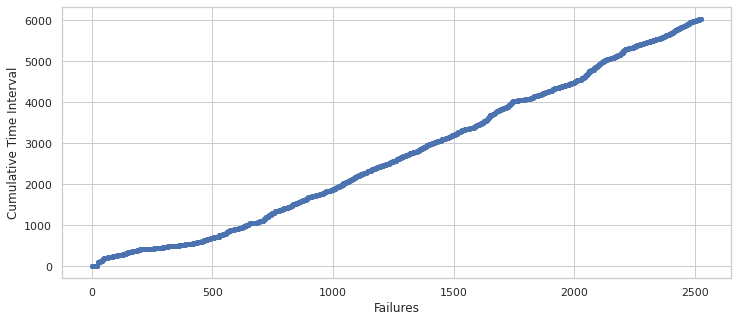

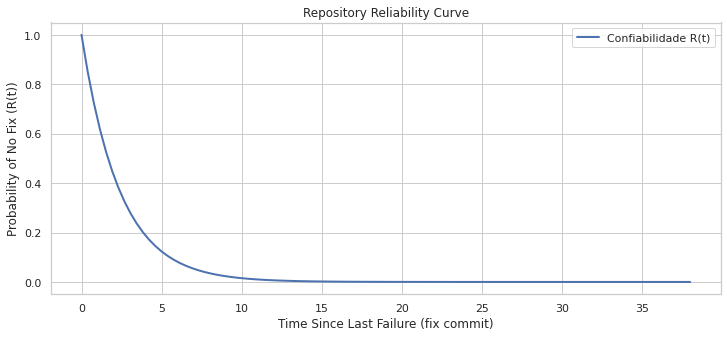

Confiabilidade R(1) = 0.6581
Confiabilidade R(5) = 0.1234
Confiabilidade R(10) = 0.0152
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'spring-framework', 'R1': '0.6581', 'R5': '0.1234', 'R10': '0.0152', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,org.springframework.web.servlet/src/test/java/org/springframework/web/servlet/mvc/annotation/Spr7839Tests.java,8,0.285714,3.500000,0.030197
1,org.springframework.expression/src/main/java/org/springframework/expression/spel/SpelMessages.java,4,0.333333,3.000000,0.049787
2,spring-expression/src/test/java/org/springframework/expression/spel/ParsingTests.java,3,0.500000,2.000000,0.135335
3,spring-webmvc/src/test/java/org/springframework/web/servlet/view/xml/MarshallingViewTests.java,2,1.000000,1.000000,0.367879
4,org.springframework.expression/src/main/java/org/springframework/expression/spel/generated/SpringExpressionsParser.java,2,1.000000,1.000000,0.367879
...,...,...,...,...,...
1364,spring-beans/src/main/java/org/springframework/beans/factory/support/GenericTypeAwareAutowireCandidateResolver.java,2,3719.000000,0.000269,0.999731
1365,spring-expression/src/main/java/org/springframework/expression/spel/ast/PropertyOrFieldReference.java,2,3801.000000,0.000263,0.999737
1366,spring-context/src/main/java/org/springframework/scheduling/concurrent/ThreadPoolExecutorFactoryBean.java,2,3814.000000,0.000262,0.999738
1367,spring-jms/src/main/java/org/springframework/jms/listener/AbstractJmsListeningContainer.java,2,3828.000000,0.000261,0.999739


== rocketmq ==


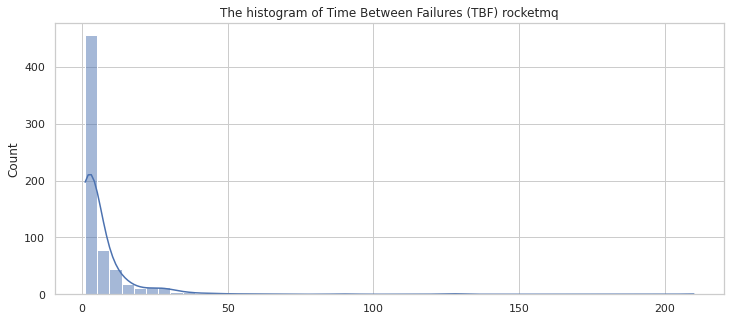

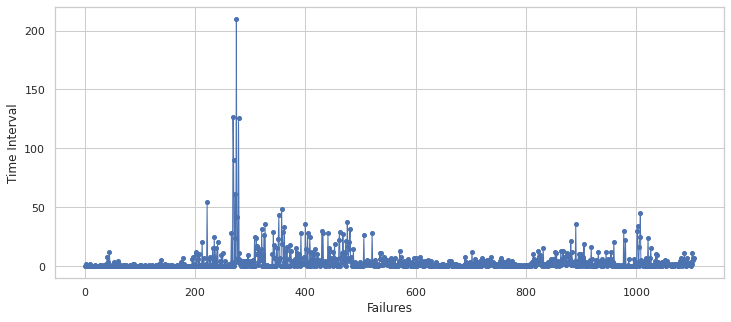

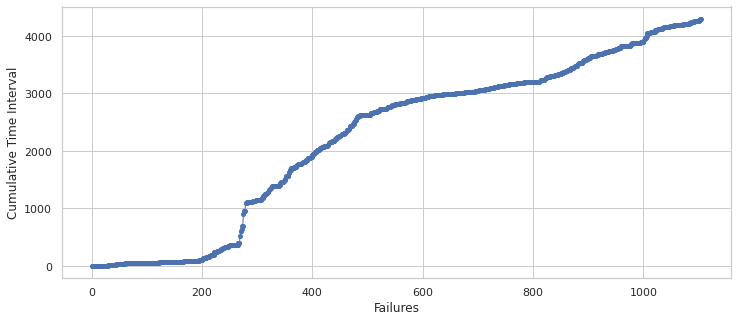

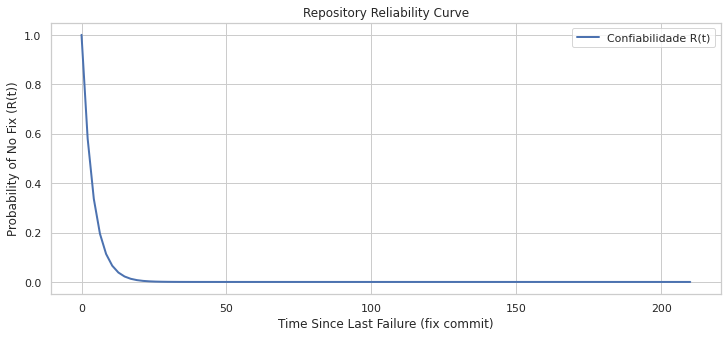

Confiabilidade R(1) = 0.7735
Confiabilidade R(5) = 0.2768
Confiabilidade R(10) = 0.0766
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'rocketmq', 'R1': '0.7735', 'R5': '0.2768', 'R10': '0.0766', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,rocketmq-tools/src/main/java/com/alibaba/rocketmq/tools/command/topic/TopicRouteSubCommand.java,4,0.333333,3.000000,0.049787
1,rocketmq-broker/src/main/java/com/alibaba/rocketmq/broker/offset/ConsumerOffsetManager.java,4,0.333333,3.000000,0.049787
2,rocketmq-common/src/main/java/com/alibaba/rocketmq/common/message/Message.java,4,0.333333,3.000000,0.049787
3,rocketmq-client/src/main/java/com/alibaba/rocketmq/client/log/ClientLogger.java,8,0.571429,1.750000,0.173774
4,rocketmq-remoting/src/main/java/com/alibaba/rocketmq/remoting/netty/NettyClientConfig.java,4,0.666667,1.500000,0.223130
...,...,...,...,...,...
517,client/src/main/java/org/apache/rocketmq/client/MQHelper.java,2,1720.000000,0.000581,0.999419
518,client/src/main/java/org/apache/rocketmq/client/impl/consumer/PullMessageService.java,2,1720.000000,0.000581,0.999419
519,store/src/main/java/org/apache/rocketmq/store/stats/BrokerStats.java,2,1720.000000,0.000581,0.999419
520,example/src/main/java/org/apache/rocketmq/example/transaction/TransactionProducer.java,2,1929.000000,0.000518,0.999482


== ignite ==


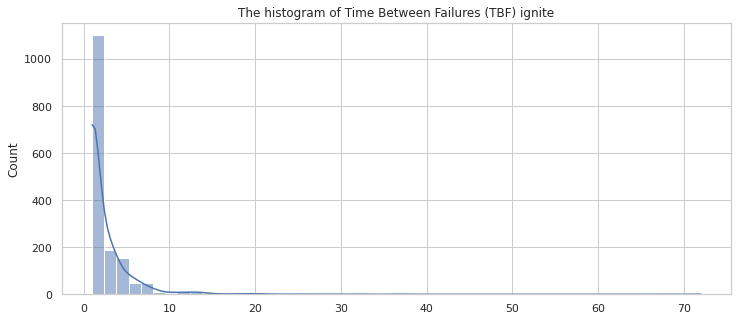

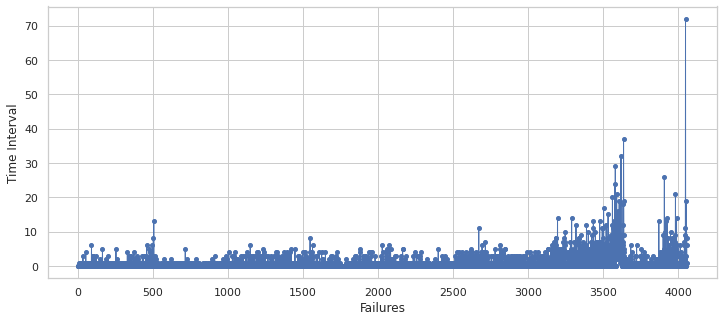

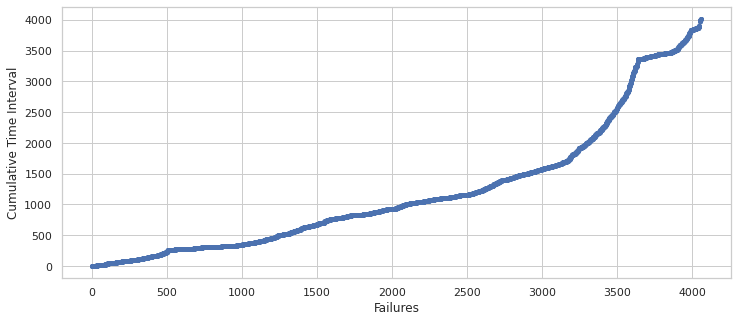

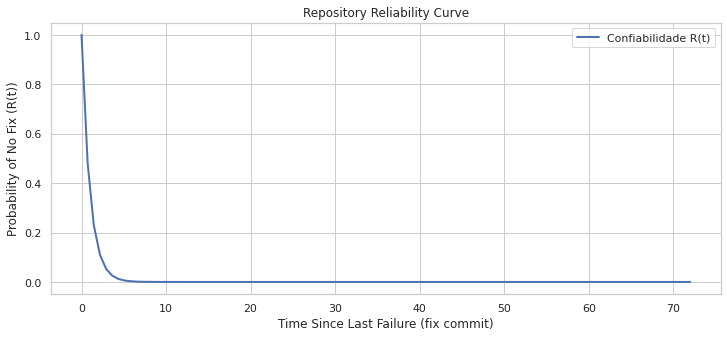

Confiabilidade R(1) = 0.3640
Confiabilidade R(5) = 0.0064
Confiabilidade R(10) = 0.0000
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'ignite', 'R1': '0.3640', 'R5': '0.0064', 'R10': '0.0000', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,modules/core/src/main/java/org/gridgain/grid/kernal/visor/cmd/tasks/VisorCollectLicenseTask.java,8,0.142857,7.000000,0.000912
1,modules/core/src/main/java/org/gridgain/grid/kernal/visor/cmd/tasks/VisorAckTask.java,7,0.166667,6.000000,0.002479
2,modules/core/src/main/java/org/apache/ignite/internal/processors/dataload/GridDataLoadResponse.java,6,0.200000,5.000000,0.006738
3,modules/core/src/main/java/org/gridgain/grid/kernal/visor/cmd/tasks/VisorCollectEventsTask.java,6,0.200000,5.000000,0.006738
4,modules/core/src/main/java/org/apache/ignite/internal/processors/cache/GridCacheValueBytes.java,6,0.200000,5.000000,0.006738
...,...,...,...,...,...
3151,modules/core/src/test/java/org/apache/ignite/internal/GridTaskFutureImplStopGridSelfTest.java,2,2655.000000,0.000377,0.999623
3152,modules/core/src/test/java/org/apache/ignite/internal/GridCancelledJobsMetricsSelfTest.java,2,2655.000000,0.000377,0.999623
3153,modules/core/src/test/java/org/apache/ignite/session/GridSessionCancelSiblingsFromFutureSelfTest.java,2,2655.000000,0.000377,0.999623
3154,modules/core/src/main/java/org/apache/ignite/internal/GridDiagnostic.java,2,2866.000000,0.000349,0.999651


== quartz ==


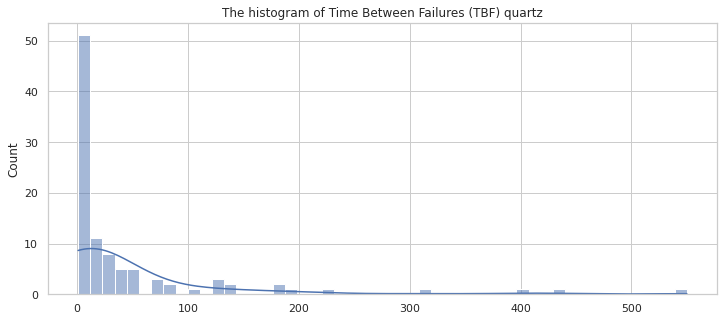

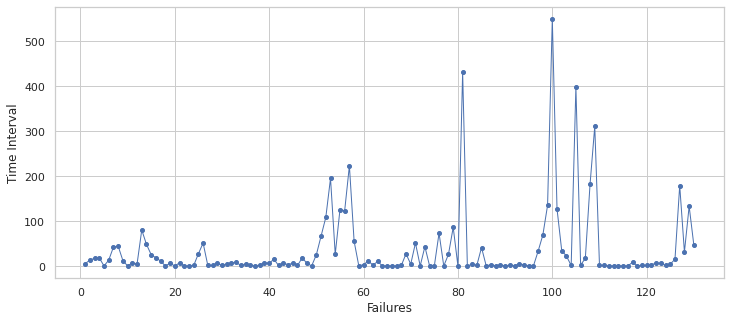

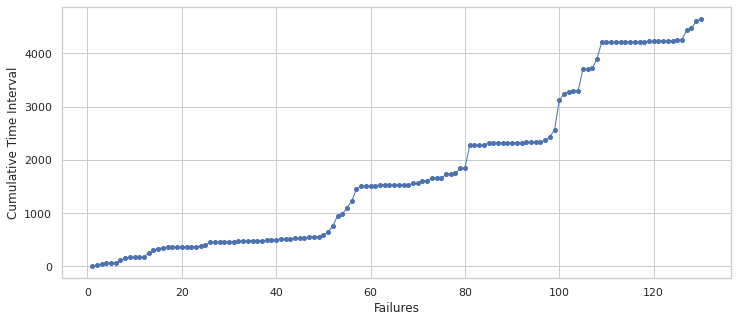

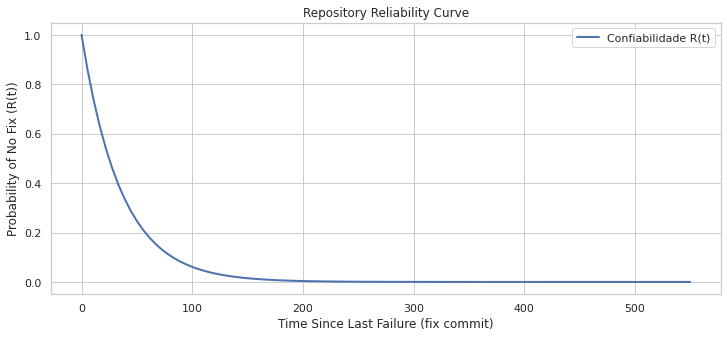

Confiabilidade R(1) = 0.9724
Confiabilidade R(5) = 0.8695
Confiabilidade R(10) = 0.7560
Confiabilidade R(50) = 0.2469
Confiabilidade R(100) = 0.0610
{'project': 'quartz', 'R1': '0.9724', 'R5': '0.8695', 'R10': '0.7560', 'R50': '0.2469', 'R100': '0.0610'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,quartz/src/main/java/org/quartz/core/JobRunShell.java,3,1.000000,1.000000,0.367879
1,quartz/src/main/java/org/quartz/CronExpression.java,2,2.000000,0.500000,0.606531
2,quartz/src/main/java/org/quartz/SchedulerException.java,3,2.500000,0.400000,0.670320
3,quartz/src/main/java/org/quartz/core/QuartzScheduler.java,4,3.333333,0.300000,0.740818
4,system-tests/src/test/java/org/terracotta/quartz/tests/ClientBase.java,3,17.500000,0.057143,0.944459
...,...,...,...,...,...
63,quartz-plugins/src/main/java/org/quartz/plugins/history/LoggingJobHistoryPlugin.java,2,4064.000000,0.000246,0.999754
64,quartz-plugins/src/main/java/org/quartz/plugins/management/ShutdownHookPlugin.java,2,4064.000000,0.000246,0.999754
65,quartz-jboss/src/main/java/org/quartz/ee/jmx/jboss/QuartzServiceMBean.java,2,4064.000000,0.000246,0.999754
66,quartz-jboss/src/main/java/org/quartz/ee/jmx/jboss/QuartzService.java,2,4064.000000,0.000246,0.999754


== okhttp ==


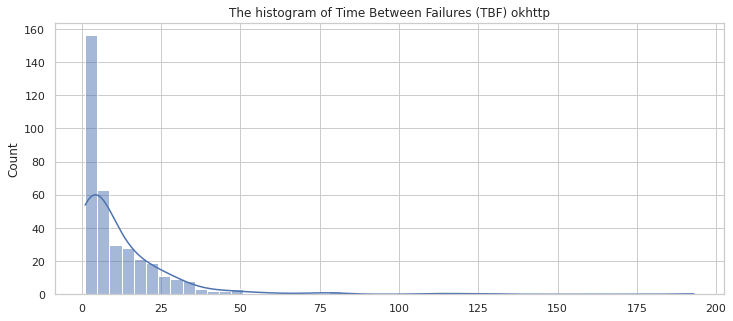

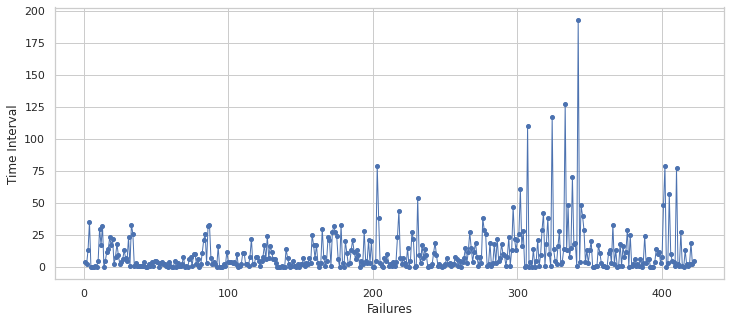

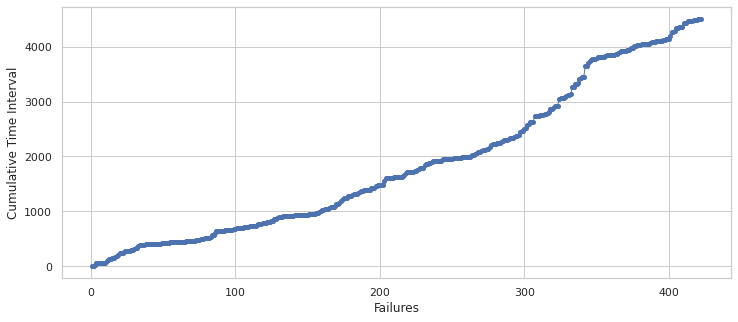

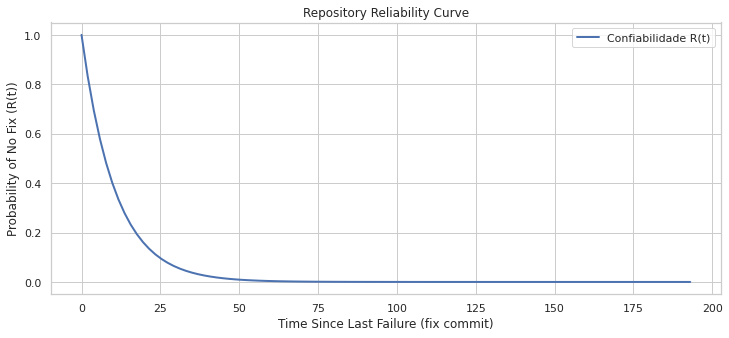

Confiabilidade R(1) = 0.9106
Confiabilidade R(5) = 0.6261
Confiabilidade R(10) = 0.3920
Confiabilidade R(50) = 0.0093
Confiabilidade R(100) = 0.0001
{'project': 'okhttp', 'R1': '0.9106', 'R5': '0.6261', 'R10': '0.3920', 'R50': '0.0093', 'R100': '0.0001'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/main/java/libcore/net/http/HttpEngine.java,3,0.5,2.000000,0.135335
1,okhttp-tests/src/test/java/com/squareup/okhttp/AsyncApiTest.java,2,1.0,1.000000,0.367879
2,src/main/java/libcore/net/http/HttpConnection.java,2,1.0,1.000000,0.367879
3,okhttp/src/main/java/okhttp3/internal/http/Http1xStream.java,2,2.0,0.500000,0.606531
4,okhttp/src/main/java/com/squareup/okhttp/Callback.java,2,2.0,0.500000,0.606531
...,...,...,...,...,...
204,okhttp-tls/src/test/java/okhttp3/tls/HeldCertificateTest.java,2,688.0,0.001453,0.998548
205,okhttp/src/main/java/okhttp3/Request.java,2,855.0,0.001170,0.998831
206,okhttp/src/main/java/okhttp3/internal/http2/Hpack.java,2,905.0,0.001105,0.998896
207,okhttp/src/main/java/okhttp3/ConnectionSpec.java,2,959.0,0.001043,0.998958


== cassandra ==


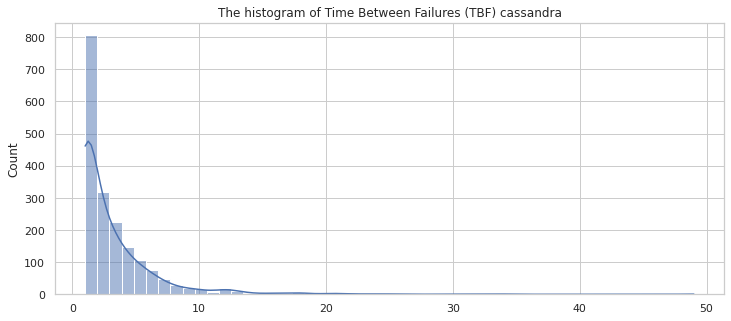

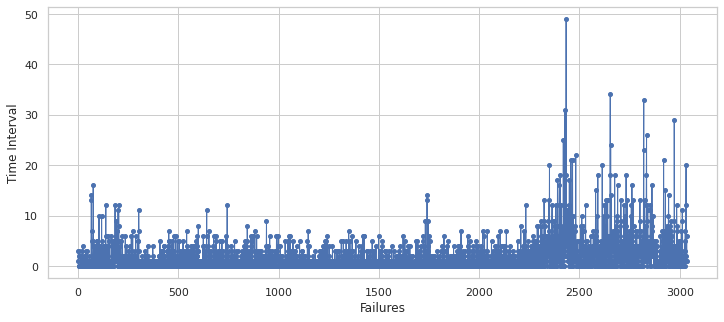

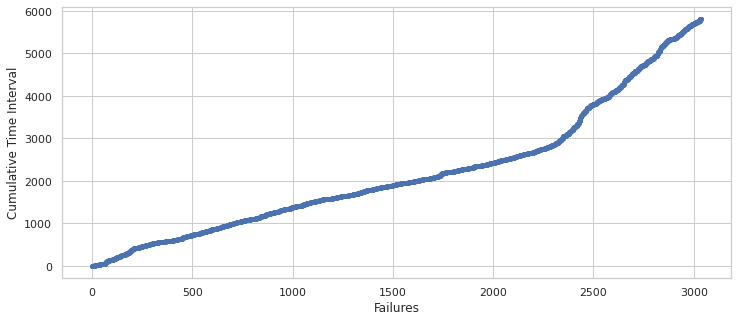

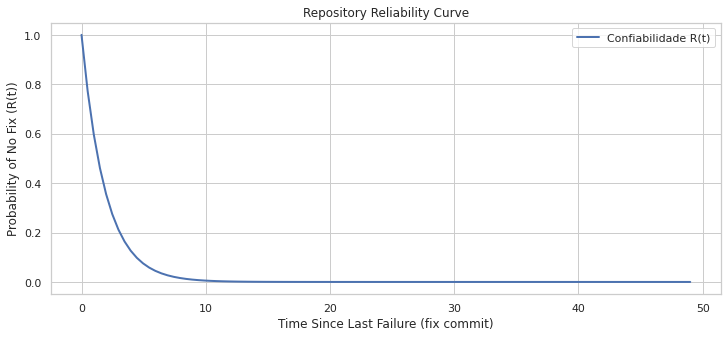

Confiabilidade R(1) = 0.5931
Confiabilidade R(5) = 0.0734
Confiabilidade R(10) = 0.0054
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'cassandra', 'R1': '0.5931', 'R5': '0.0734', 'R10': '0.0054', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/java/org/apache/cassandra/service/reads/AbstractReadExecutor.java,3,0.5,2.000000,0.135335
1,src/java/org/apache/cassandra/service/reads/DigestResolver.java,3,0.5,2.000000,0.135335
2,test/distributed/org/apache/cassandra/distributed/test/ReadFailureTest.java,3,0.5,2.000000,0.135335
3,test/unit/org/apache/cassandra/cql3/validation/entities/UFScriptTest.java,2,1.0,1.000000,0.367879
4,src/java/org/apache/cassandra/locator/DatacenterShardStrategy.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
1173,src/java/org/apache/cassandra/metrics/CassandraMetricsRegistry.java,2,3298.0,0.000303,0.999697
1174,src/java/org/apache/cassandra/cache/InstrumentingCache.java,2,3421.0,0.000292,0.999708
1175,src/java/org/apache/cassandra/cache/SerializingCache.java,2,3761.0,0.000266,0.999734
1176,src/java/org/apache/cassandra/utils/concurrent/WaitQueue.java,2,3953.0,0.000253,0.999747


== pmd ==


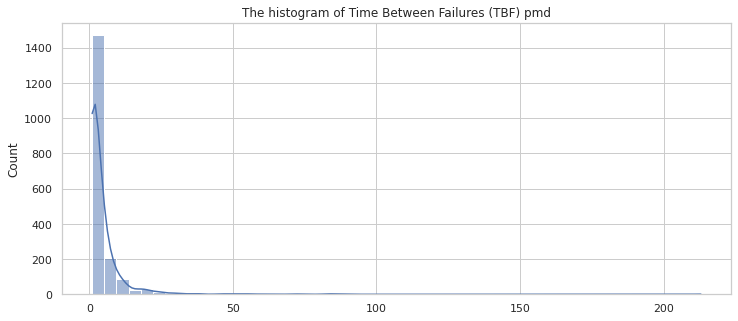

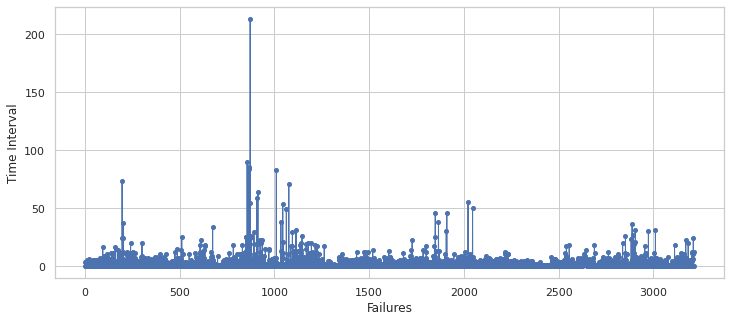

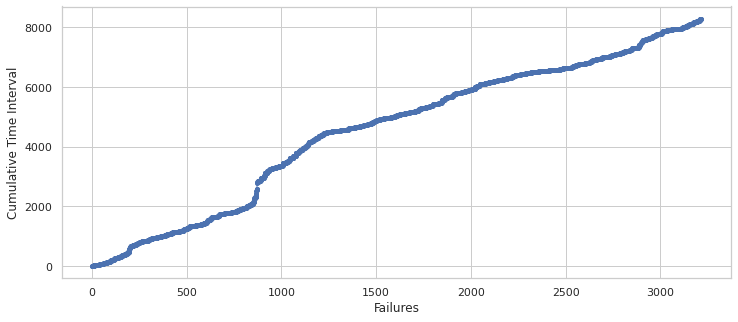

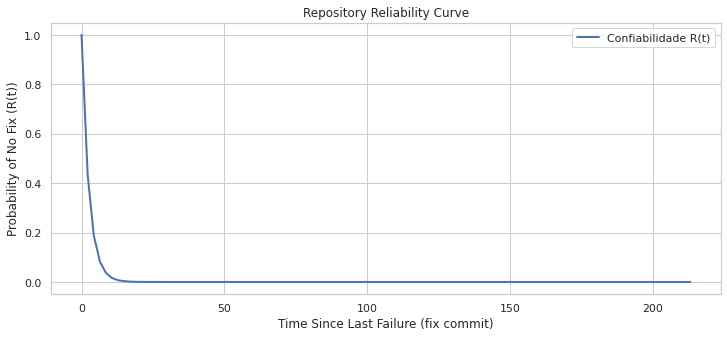

Confiabilidade R(1) = 0.6782
Confiabilidade R(5) = 0.1435
Confiabilidade R(10) = 0.0206
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'pmd', 'R1': '0.6782', 'R5': '0.1435', 'R10': '0.0206', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,pmd-visualforce/src/main/java/net/sourceforge/pmd/lang/vf/TokenMgrError.java,4,0.333333,3.000000,0.049787
1,pmd-java/src/test/java/net/sourceforge/pmd/lang/java/ast/ASTThrowStatementTest.java,3,0.500000,2.000000,0.135335
2,pmd-java/src/test/java/net/sourceforge/pmd/lang/java/ast/ASTFormalParameterTest.java,3,0.500000,2.000000,0.135335
3,pmd-java/src/test/java/net/sourceforge/pmd/lang/java/ast/ASTInitializerTest.java,3,0.500000,2.000000,0.135335
4,pmd-java/src/test/java/net/sourceforge/pmd/lang/java/ast/ASTAnnotationTest.java,3,0.500000,2.000000,0.135335
...,...,...,...,...,...
1957,pmd-apex/src/main/java/net/sourceforge/pmd/lang/apex/rule/codestyle/ClassNamingConventionsRule.java,2,2205.000000,0.000454,0.999547
1958,pmd-apex/src/main/java/net/sourceforge/pmd/lang/apex/ast/ApexQualifiedName.java,2,2275.000000,0.000440,0.999561
1959,pmd-core/src/main/java/net/sourceforge/pmd/lang/rule/RuleReference.java,2,2478.000000,0.000404,0.999597
1960,pmd-core/src/test/java/net/sourceforge/pmd/cpd/CSVRendererTest.java,2,2746.000000,0.000364,0.999636


== dubbo ==


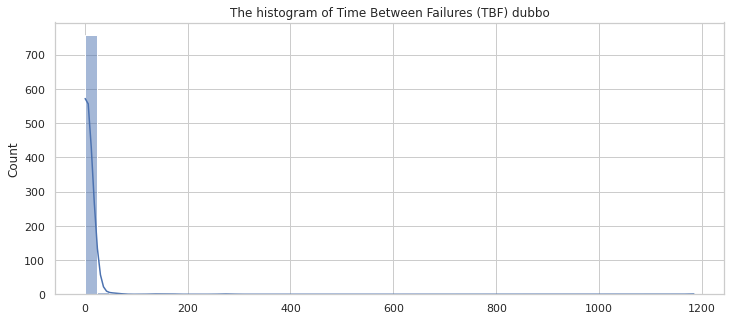

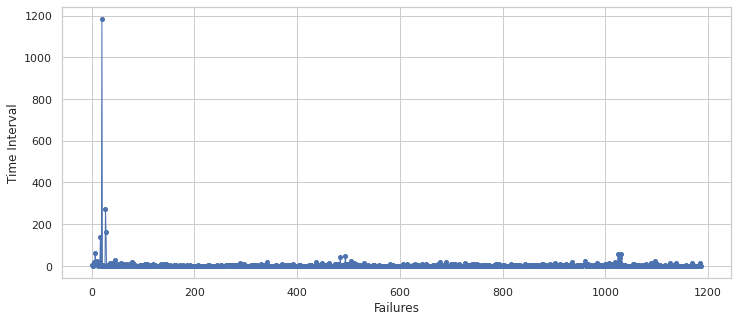

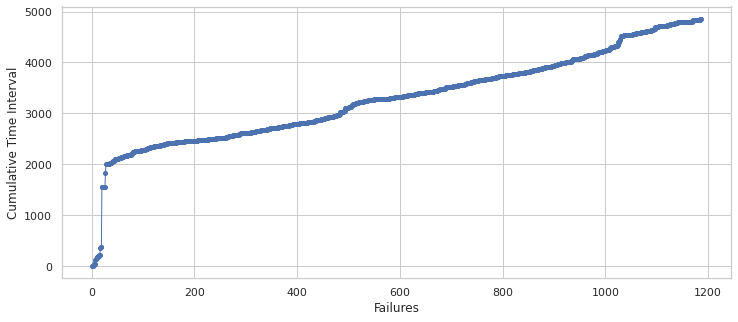

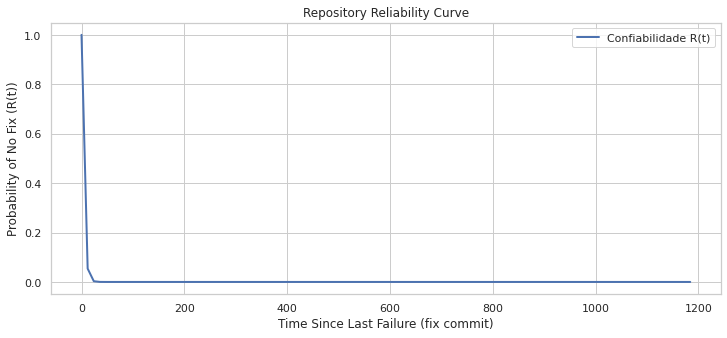

Confiabilidade R(1) = 0.7833
Confiabilidade R(5) = 0.2950
Confiabilidade R(10) = 0.0870
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'dubbo', 'R1': '0.7833', 'R5': '0.2950', 'R10': '0.0870', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,dubbo-config/dubbo-config-spring/src/main/java/org/apache/dubbo/config/spring/ReferenceBeanManager.java,3,0.5,2.000000,0.135335
1,dubbo-plugin/dubbo-triple-servlet/src/main/java/org/apache/dubbo/rpc/protocol/tri/servlet/ServletStreamChannel.java,2,1.0,1.000000,0.367879
2,dubbo-config/dubbo-config-spring/src/main/java/org/apache/dubbo/config/spring/DubboConfigInitializationPostProcessor.java,2,1.0,1.000000,0.367879
3,dubbo-demo/dubbo-demo-spring-boot/dubbo-demo-spring-boot-servlet/src/main/java/org/apache/dubbo/springboot/demo/servlet/GreeterServiceImpl.java,2,1.0,1.000000,0.367879
4,dubbo-cluster/src/main/java/com/alibaba/dubbo/rpc/cluster/directory/AbstractDirectory.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
714,dubbo-filter/dubbo-filter-cache/src/main/java/org/apache/dubbo/cache/support/expiring/ExpiringMap.java,2,1813.0,0.000552,0.999449
715,dubbo-monitor/dubbo-monitor-api/src/main/java/org/apache/dubbo/monitor/support/AbstractMonitorFactory.java,2,1837.0,0.000544,0.999456
716,dubbo-config/dubbo-config-spring/src/main/java/org/apache/dubbo/config/spring/util/PropertySourcesUtils.java,2,1933.0,0.000517,0.999483
717,dubbo-rpc/dubbo-rpc-api/src/main/java/com/alibaba/dubbo/rpc/protocol/AbstractInvoker.java,2,2234.0,0.000448,0.999552


== org.aspectj ==


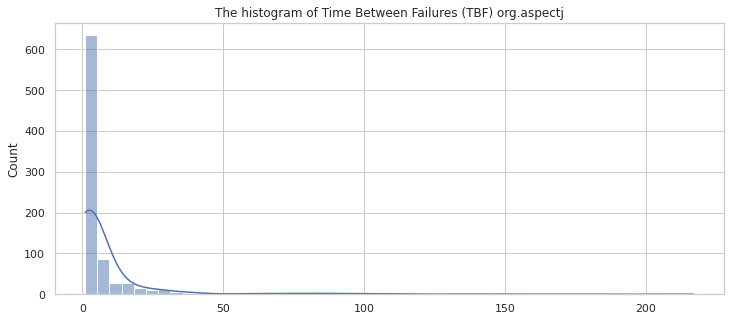

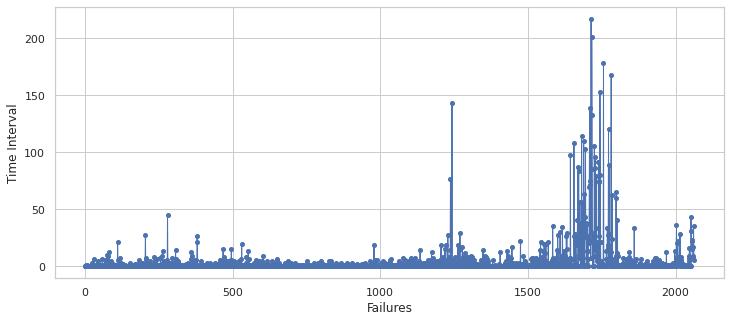

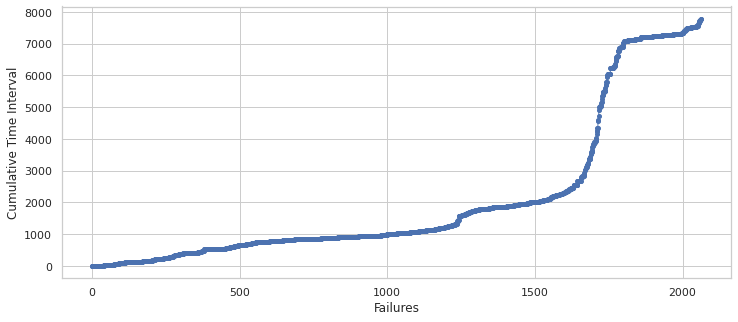

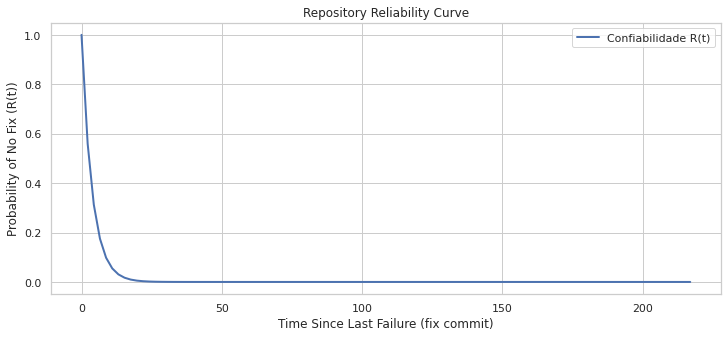

Confiabilidade R(1) = 0.7672
Confiabilidade R(5) = 0.2657
Confiabilidade R(10) = 0.0706
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'org.aspectj', 'R1': '0.7672', 'R5': '0.2657', 'R10': '0.0706', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,weaver/testsrc/org/aspectj/weaver/tools/TypePatternMatcherTest.java,2,1.0,1.000000,0.367879
1,tests/src/org/aspectj/systemtest/ajc150/CovarianceTests.java,2,1.0,1.000000,0.367879
2,ajde/testsrc/org/aspectj/ajde/ExtensionTests.java,2,1.0,1.000000,0.367879
3,build/testsrc/org/aspectj/internal/build/BuildModuleTest.java,2,1.0,1.000000,0.367879
4,util/testsrc/org/aspectj/util/LangUtilTest.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
810,tests/java5/ataspectj/ataspectj/AroundInlineMungerTestAspects.java,3,3327.0,0.000301,0.999699
811,org.aspectj.ajdt.core/src/org/aspectj/ajdt/internal/compiler/ast/AstUtil.java,2,3536.0,0.000283,0.999717
812,bcel-builder/src/org/aspectj/apache/bcel/classfile/StackMapEntry.java,2,3837.0,0.000261,0.999739
813,bcel-builder/src/org/aspectj/apache/bcel/generic/Type.java,2,4846.0,0.000206,0.999794


== spark ==


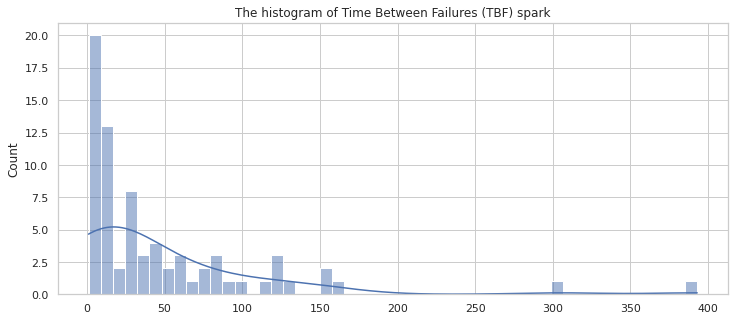

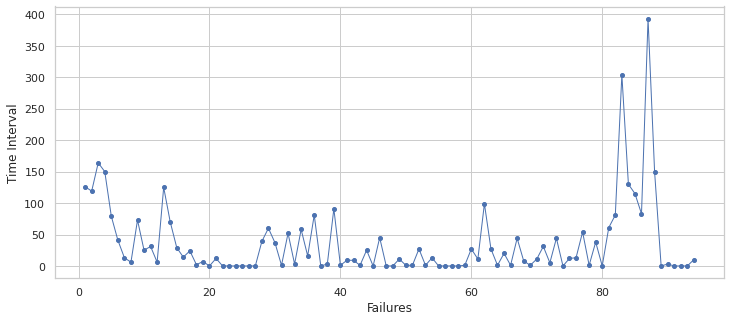

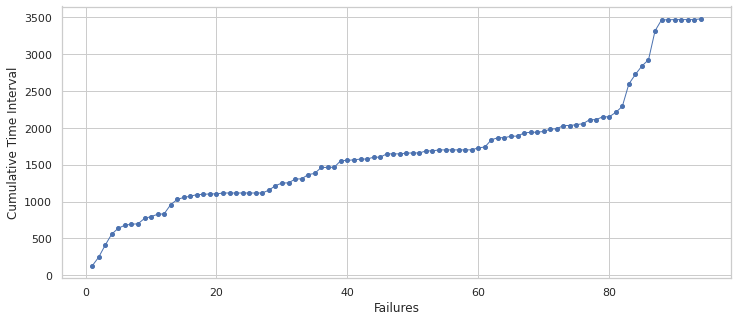

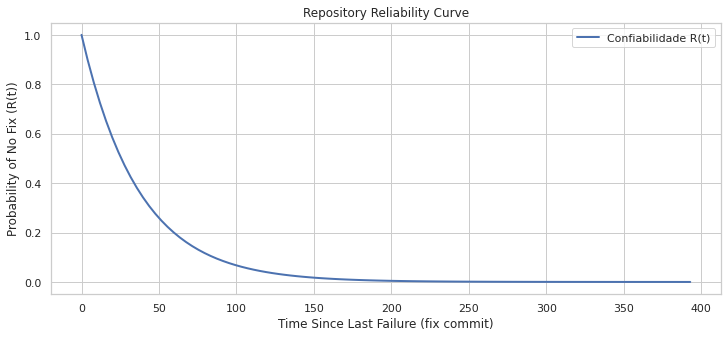

Confiabilidade R(1) = 0.9734
Confiabilidade R(5) = 0.8737
Confiabilidade R(10) = 0.7633
Confiabilidade R(50) = 0.2591
Confiabilidade R(100) = 0.0671
{'project': 'spark', 'R1': '0.9734', 'R5': '0.8737', 'R10': '0.7633', 'R50': '0.2591', 'R100': '0.0671'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/main/java/spark/CustomErrorPages.java,3,6.0,0.166667,0.846482
1,src/main/java/spark/staticfiles/StaticFiles.java,3,13.0,0.076923,0.925961
2,src/main/java/spark/utils/IOUtils.java,2,19.0,0.052632,0.948729
3,src/main/java/spark/route/SimpleRouteMatcher.java,2,19.0,0.052632,0.948729
4,src/main/java/spark/webserver/SparkServerImpl.java,2,19.0,0.052632,0.948729
...,...,...,...,...,...
27,src/test/java/spark/embeddedserver/jetty/websocket/WebSocketServletContextHandlerFactoryTest.java,2,1426.0,0.000701,0.999299
28,src/main/java/spark/embeddedserver/jetty/websocket/WebSocketServletContextHandlerFactory.java,2,1426.0,0.000701,0.999299
29,src/test/java/spark/RequestTest.java,3,1459.0,0.000685,0.999315
30,src/main/java/spark/embeddedserver/jetty/EmbeddedJettyServer.java,2,1641.0,0.000609,0.999391


== beam ==


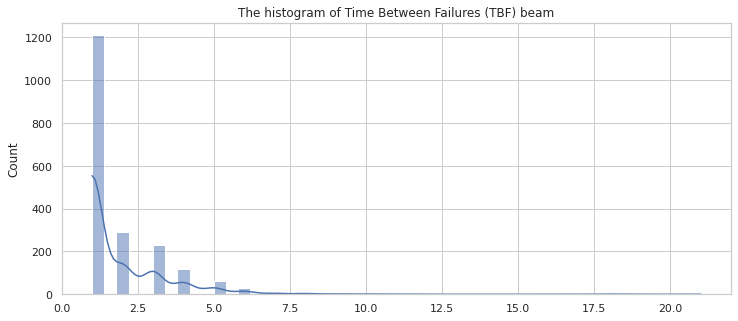

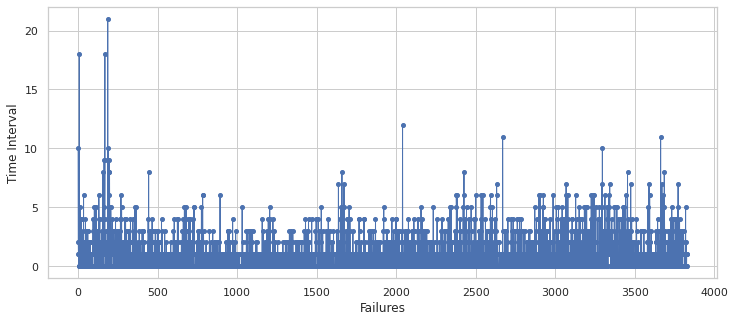

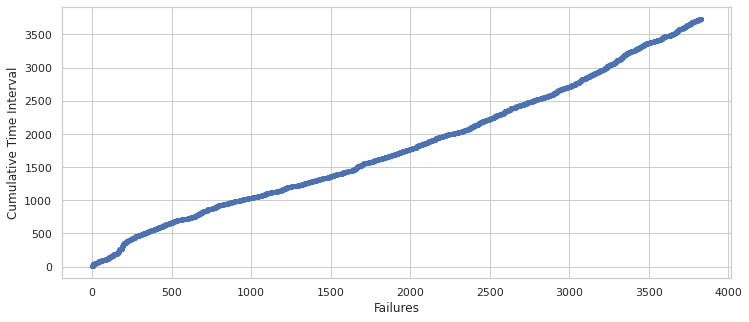

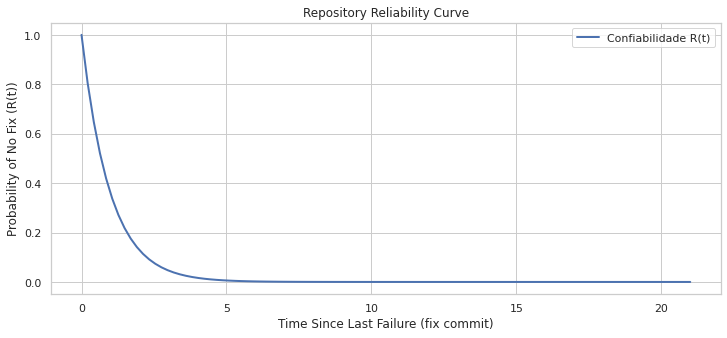

Confiabilidade R(1) = 0.3587
Confiabilidade R(5) = 0.0059
Confiabilidade R(10) = 0.0000
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'beam', 'R1': '0.3587', 'R5': '0.0059', 'R10': '0.0000', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,runners/direct-java/src/test/java/org/apache/beam/runners/direct/ExecutorServiceParallelExecutorTest.java,3,0.5,2.000000,0.135335
1,examples/src/main/java/com/google/cloud/dataflow/examples/TrafficRoutes.java,2,1.0,1.000000,0.367879
2,runners/java-fn-execution/src/main/java/org/apache/beam/runners/fnexecution/artifact/BeamFileSystemArtifactRetrievalService.java,2,1.0,1.000000,0.367879
3,examples/src/main/java/com/google/cloud/dataflow/examples/TrafficMaxLaneFlow.java,2,1.0,1.000000,0.367879
4,sdks/java/extensions/euphoria/euphoria-inmem/src/test/java/cz/seznam/euphoria/inmem/BasicOperatorTest.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
1816,sdks/java/core/src/main/java/org/apache/beam/sdk/transforms/Max.java,2,1642.0,0.000609,0.999391
1817,runners/core-construction-java/src/main/java/org/apache/beam/runners/core/construction/graph/PipelineValidator.java,2,1786.0,0.000560,0.999440
1818,runners/google-cloud-dataflow-java/src/main/java/org/apache/beam/runners/dataflow/options/DataflowPipelineDebugOptions.java,2,1995.0,0.000501,0.999499
1819,runners/spark/src/test/java/org/apache/beam/runners/spark/SparkRunnerDebuggerTest.java,2,2105.0,0.000475,0.999525


== struts ==


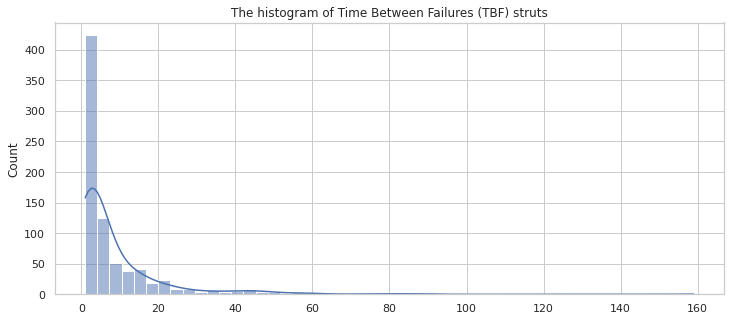

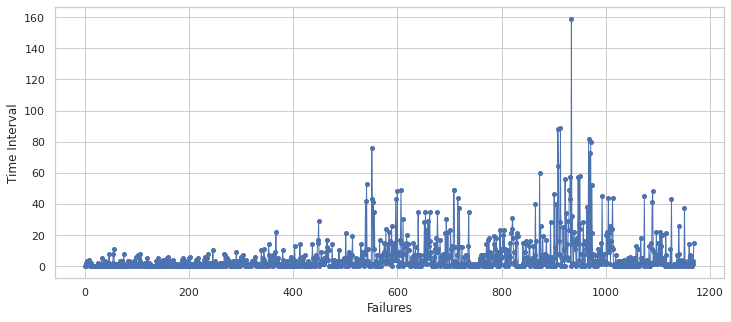

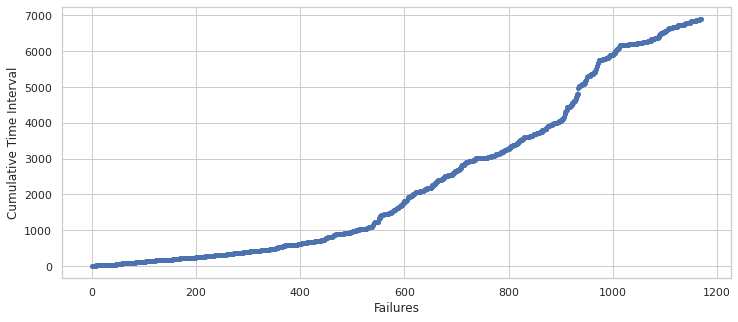

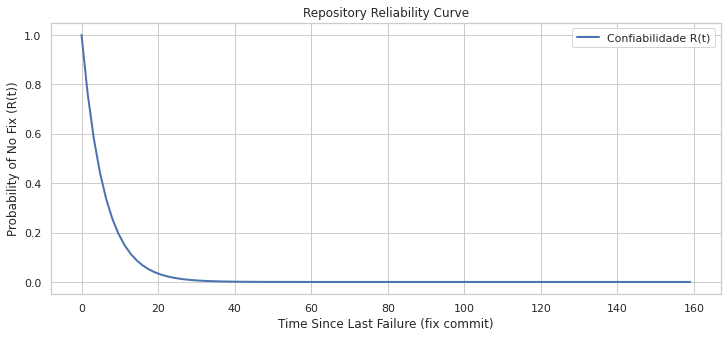

Confiabilidade R(1) = 0.8442
Confiabilidade R(5) = 0.4289
Confiabilidade R(10) = 0.1839
Confiabilidade R(50) = 0.0002
Confiabilidade R(100) = 0.0000
{'project': 'struts', 'R1': '0.8442', 'R5': '0.4289', 'R10': '0.1839', 'R50': '0.0002', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,xwork-core/src/test/java/com/opensymphony/xwork2/util/fs/DefaultFileManagerFactoryTest.java,2,1.0,1.000000,0.367879
1,src/test/org/apache/struts/action2/config/ConfigurationTest.java,2,1.0,1.000000,0.367879
2,xwork-core/src/main/java/com/opensymphony/xwork2/util/fs/DefaultFileManagerFactory.java,2,1.0,1.000000,0.367879
3,src/test/org/apache/struts/action2/views/jsp/ui/TooltipTest.java,2,1.0,1.000000,0.367879
4,src/test/org/apache/struts/action2/components/ComponentTest.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
1046,core/src/test/java/org/apache/struts2/SomeEnum.java,2,3464.0,0.000289,0.999711
1047,core/src/test/java/org/apache/struts2/views/jsp/ui/TestAction1.java,2,3464.0,0.000289,0.999711
1048,core/src/main/java/org/apache/struts2/views/annotations/StrutsTag.java,2,3928.0,0.000255,0.999745
1049,core/src/main/java/org/apache/struts2/views/annotations/StrutsTagAttribute.java,2,3928.0,0.000255,0.999745


== airflow ==


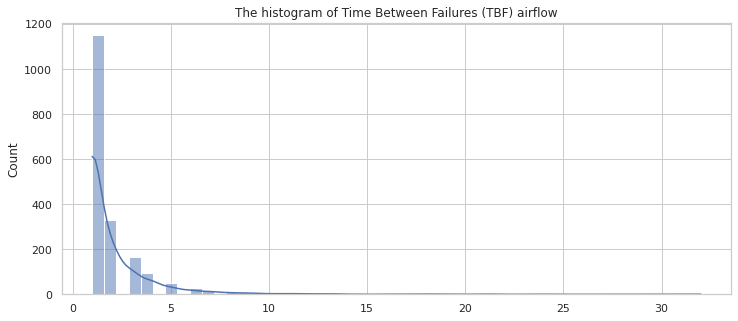

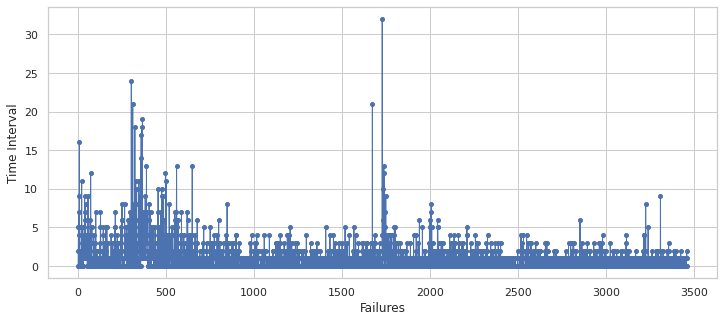

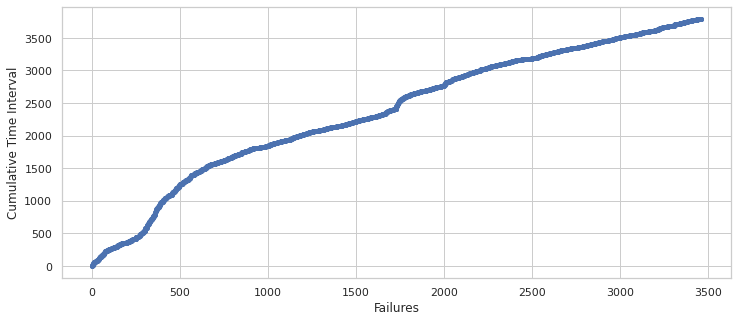

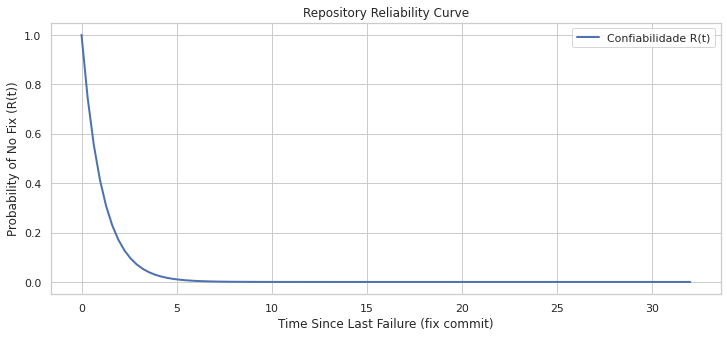

Confiabilidade R(1) = 0.4017
Confiabilidade R(5) = 0.0105
Confiabilidade R(10) = 0.0001
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'airflow', 'R1': '0.4017', 'R5': '0.0105', 'R10': '0.0001', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t


== netbeans ==


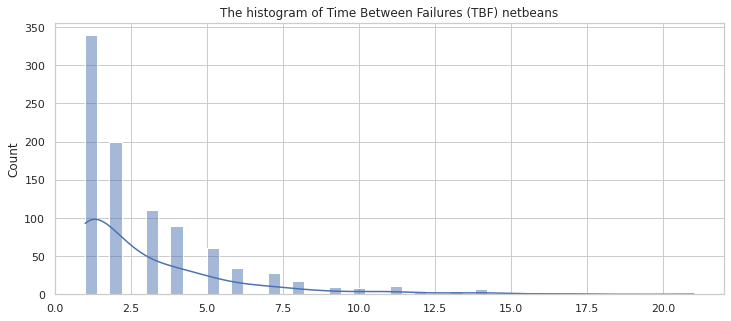

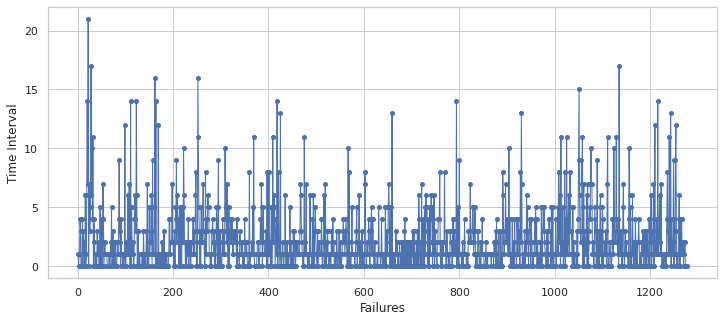

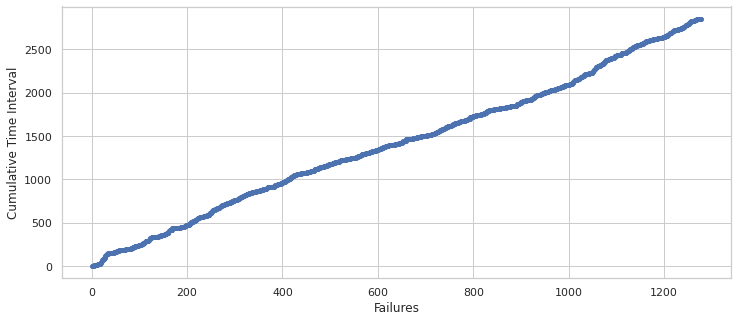

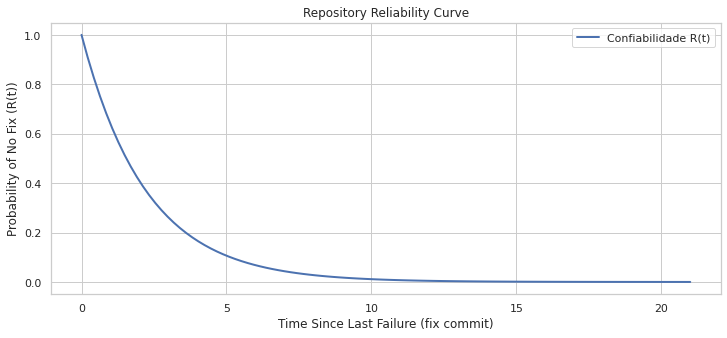

Confiabilidade R(1) = 0.6389
Confiabilidade R(5) = 0.1064
Confiabilidade R(10) = 0.0113
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'netbeans', 'R1': '0.6389', 'R5': '0.1064', 'R10': '0.0113', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,php.editor/src/org/netbeans/modules/php/editor/csl/SemanticAnalysis.java,2,1.0,1.000000,0.367879
1,php.editor/test/unit/src/org/netbeans/modules/php/editor/completion/PHP70CodeCompletionTest.java,2,1.0,1.000000,0.367879
2,php.editor/test/unit/src/org/netbeans/modules/php/editor/completion/PHPCodeCompletion262141ContextSensitiveLexerTest.java,2,1.0,1.000000,0.367879
3,php.editor/test/unit/src/org/netbeans/modules/php/editor/indent/PHPFormatterTest.java,2,1.0,1.000000,0.367879
4,php.code.analysis/src/org/netbeans/modules/php/analysis/CodeSnifferAnalyzerImpl.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
587,ide/editor.lib/src/org/netbeans/editor/ext/ToolTipSupport.java,2,1621.0,0.000617,0.999383
588,platform/netbinox/src/org/netbeans/modules/netbinox/NetbinoxFactory.java,2,1806.0,0.000554,0.999446
589,java/java.source.base/src/org/netbeans/modules/java/source/usages/BinaryAnalyser.java,2,1876.0,0.000533,0.999467
590,php/php.editor/src/org/netbeans/modules/php/editor/verification/PHP73UnhandledError.java,2,1907.0,0.000524,0.999476


== commons-lang ==


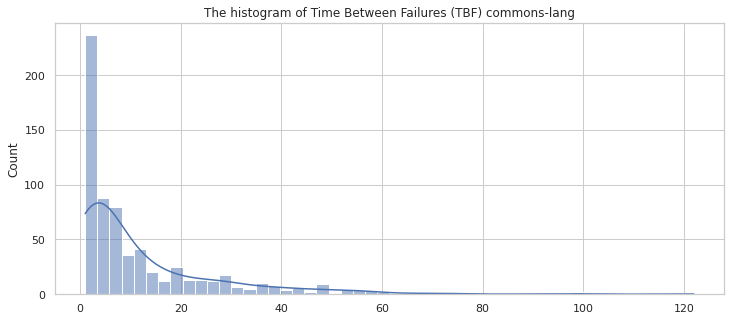

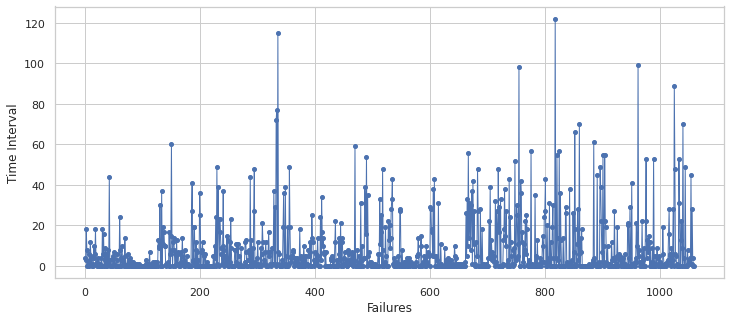

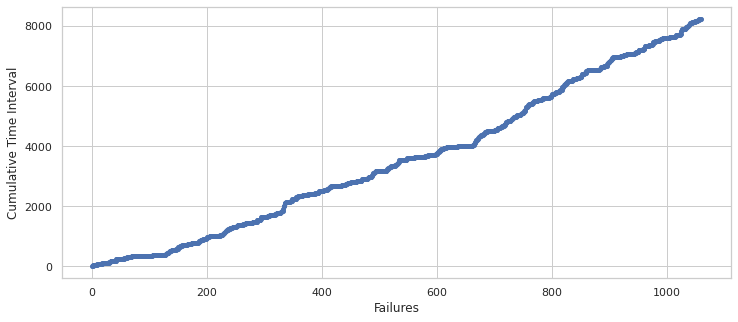

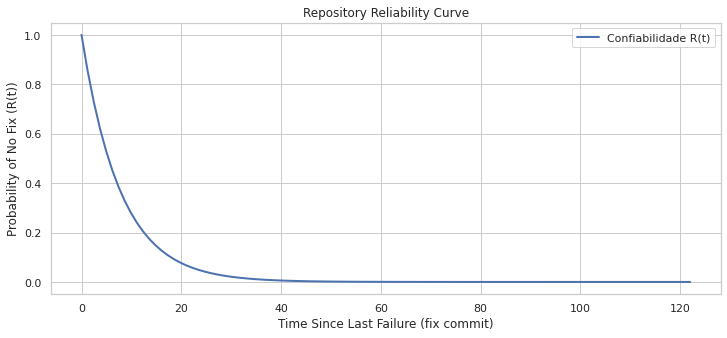

Confiabilidade R(1) = 0.8793
Confiabilidade R(5) = 0.5256
Confiabilidade R(10) = 0.2762
Confiabilidade R(50) = 0.0016
Confiabilidade R(100) = 0.0000
{'project': 'commons-lang', 'R1': '0.8793', 'R5': '0.5256', 'R10': '0.2762', 'R50': '0.0016', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/java/org/apache/commons/lang3/time/FastDateFormat.java,2,1.0,1.000000,0.367879
1,src/java/org/apache/commons/lang3/Range.java,2,1.0,1.000000,0.367879
2,src/test/org/apache/commons/lang/builder/DefaultToStringStyleTest.java,2,2.0,0.500000,0.606531
3,src/test/org/apache/commons/lang/builder/NoFieldNamesToStringStyleTest.java,2,2.0,0.500000,0.606531
4,src/java/org/apache/commons/lang/text/translate/UnicodeUnescaper.java,2,2.0,0.500000,0.606531
...,...,...,...,...,...
350,src/test/java/org/apache/commons/lang3/StringUtilsIsTest.java,2,4144.0,0.000241,0.999759
351,src/test/java/org/apache/commons/lang3/event/EventUtilsTest.java,2,4171.0,0.000240,0.999760
352,src/test/java/org/apache/commons/lang3/JavaVersionTest.java,2,4174.0,0.000240,0.999760
353,src/main/java/org/apache/commons/lang3/concurrent/ConcurrentInitializer.java,2,4523.0,0.000221,0.999779


== nifi ==


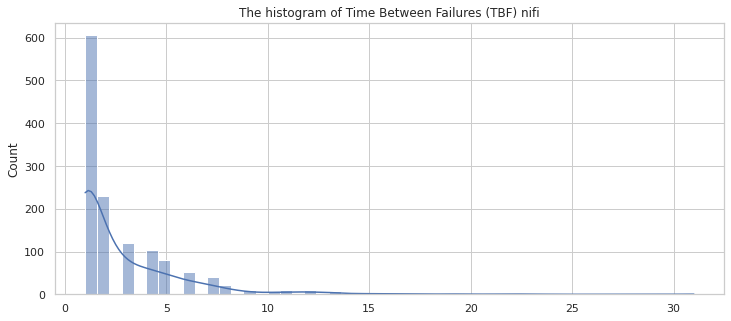

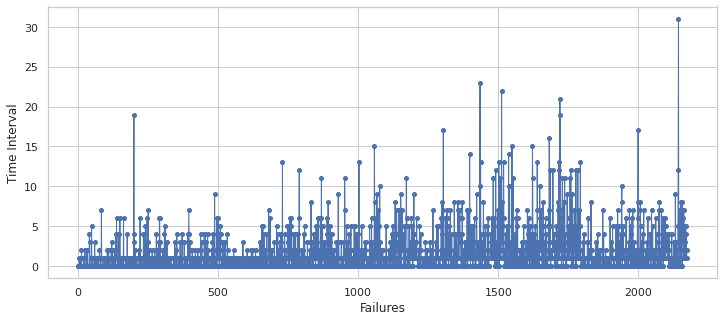

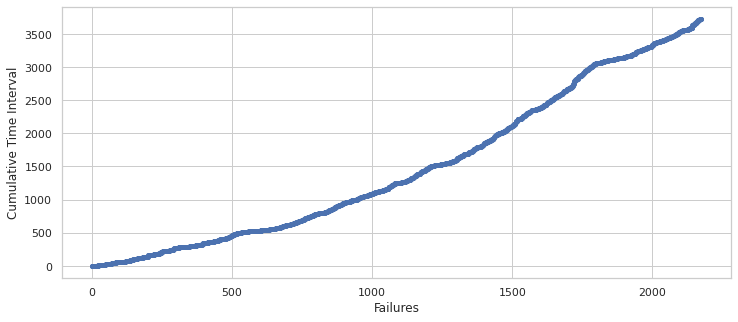

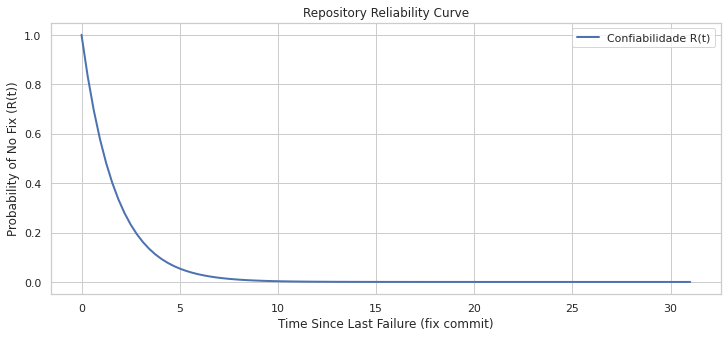

Confiabilidade R(1) = 0.5581
Confiabilidade R(5) = 0.0542
Confiabilidade R(10) = 0.0029
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'nifi', 'R1': '0.5581', 'R5': '0.0542', 'R10': '0.0029', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,nifi/nifi-nar-bundles/nifi-standard-bundle/nifi-standard-processors/src/test/java/org/apache/nifi/processors/standard/TestExecuteStreamCommand.java,3,0.5,2.000000,0.135335
1,nifi-commons/nifi-schema-utils/src/test/java/org/apache/nifi/repository/schema/TestSchemaRecordReaderWriter.java,2,1.0,1.000000,0.367879
2,nifi-nar-bundles/nifi-framework-bundle/nifi-framework/nifi-web/nifi-web-security/src/main/java/org/apache/nifi/web/security/x509/X509IdentityProvider.java,2,1.0,1.000000,0.367879
3,nifi-nar-bundles/nifi-standard-bundle/nifi-standard-processors/src/test/java/org/apache/nifi/processors/standard/TestDebugFlow.java,2,1.0,1.000000,0.367879
4,nar-bundles/framework-bundle/framework/core/src/test/java/org/apache/nifi/controller/repository/TestStandardProcessSession.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
1386,nifi-commons/nifi-utils/src/test/java/org/apache/nifi/stream/io/util/TextLineDemarcatorTest.java,2,2166.0,0.000462,0.999538
1387,nifi-toolkit/nifi-toolkit-cli/src/main/java/org/apache/nifi/toolkit/cli/impl/command/nifi/pg/cs/ControllerServiceUtil.java,2,2417.0,0.000414,0.999586
1388,nifi-nar-bundles/nifi-framework-bundle/nifi-framework/nifi-web/nifi-web-api/src/main/java/org/apache/nifi/audit/ReportingTaskAuditor.java,2,2456.0,0.000407,0.999593
1389,nifi-nar-bundles/nifi-provenance-repository-bundle/nifi-persistent-provenance-repository/src/main/java/org/apache/nifi/provenance/EncryptedWriteAheadProvenanceRepository.java,2,2491.0,0.000401,0.999599


== glide ==


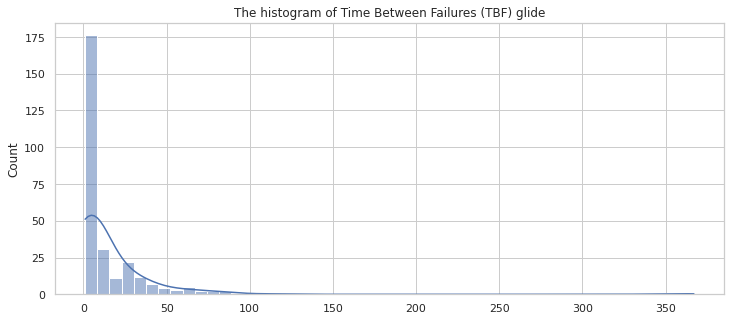

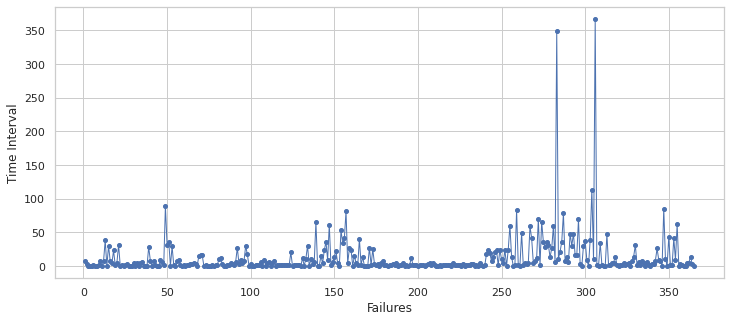

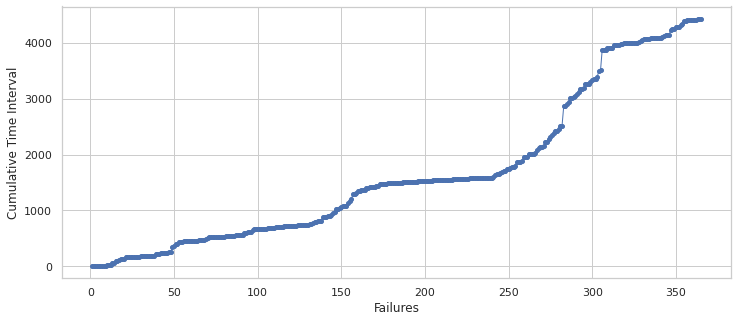

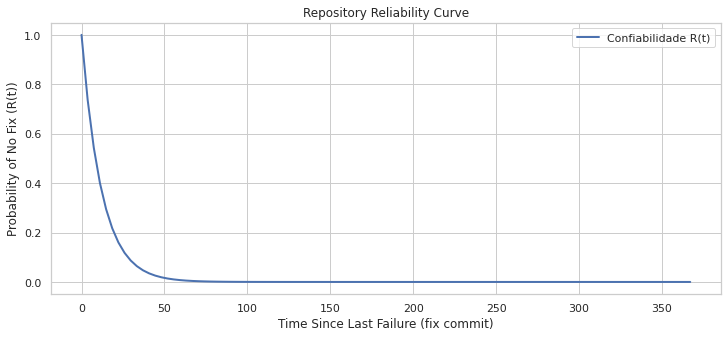

Confiabilidade R(1) = 0.9209
Confiabilidade R(5) = 0.6622
Confiabilidade R(10) = 0.4385
Confiabilidade R(50) = 0.0162
Confiabilidade R(100) = 0.0003
{'project': 'glide', 'R1': '0.9209', 'R5': '0.6622', 'R10': '0.4385', 'R50': '0.0162', 'R100': '0.0003'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,library/src/main/java/com/bumptech/glide/load/resource/bitmap/DownsampleStrategy.java,2,1.0,1.000000,0.367879
1,library/src/com/bumptech/glide/resize/request/BitmapRequest.java,2,1.0,1.000000,0.367879
2,library/tests/src/com/bumptech/glide/LruCacheTest.java,2,1.0,1.000000,0.367879
3,library/test/src/test/java/com/bumptech/glide/load/engine/cache/LruCacheTest.java,2,1.0,1.000000,0.367879
4,library/src/main/java/com/bumptech/glide/load/engine/ResourceRunner.java,3,1.5,0.666667,0.513417
...,...,...,...,...,...
221,library/src/main/java/com/bumptech/glide/load/data/mediastore/MediaStoreUtil.java,2,2076.0,0.000482,0.999518
222,library/src/main/java/com/bumptech/glide/util/LruCache.java,2,2102.0,0.000476,0.999524
223,library/src/main/java/com/bumptech/glide/load/resource/bitmap/StreamBitmapDecoder.java,2,2152.0,0.000465,0.999535
224,library/src/main/java/com/bumptech/glide/util/ExceptionCatchingInputStream.java,2,2255.0,0.000443,0.999557


== jetty.project ==


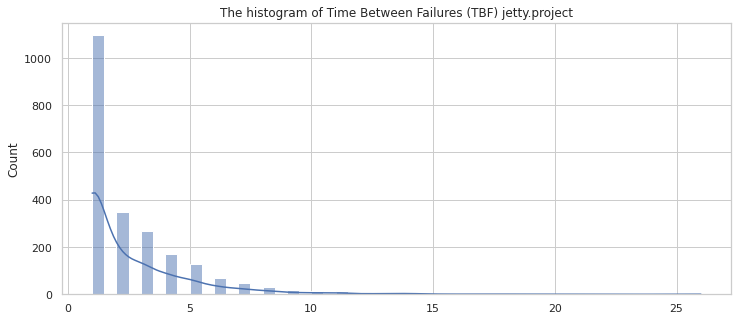

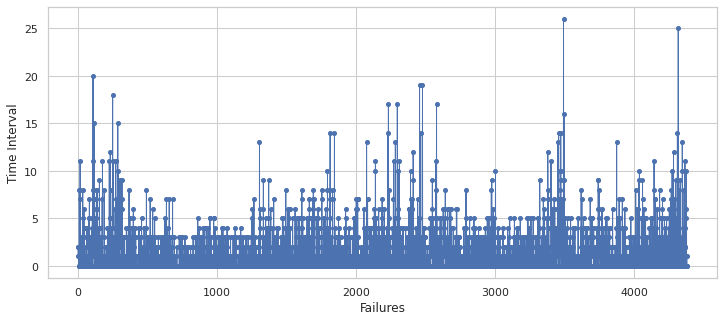

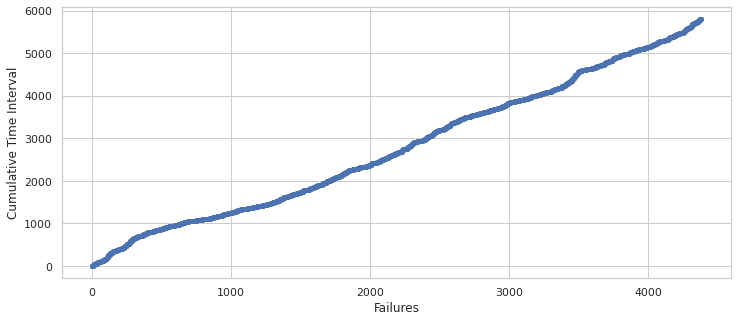

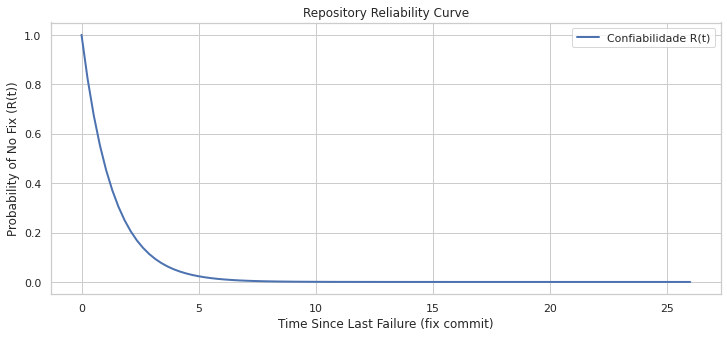

Confiabilidade R(1) = 0.4705
Confiabilidade R(5) = 0.0231
Confiabilidade R(10) = 0.0005
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'jetty.project', 'R1': '0.4705', 'R5': '0.0231', 'R10': '0.0005', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,tests/test-integration/src/test/java/org/eclipse/jetty/test/AbstractJettyTestCase.java,4,0.333333,3.000000,0.049787
1,jetty-spdy/spdy-http-server/src/test/java/org/eclipse/jetty/spdy/server/http/WriteThroughAggregateBufferTest.java,4,0.333333,3.000000,0.049787
2,jetty-hazelcast/src/main/java/org/eclipse/jetty/hazelcast/session/HazelcastSessionDataStore.java,4,0.333333,3.000000,0.049787
3,jetty-websocket/websocket-common/src/main/java/org/eclipse/jetty/websocket/common/function/EndpointFunctions.java,4,0.333333,3.000000,0.049787
4,jetty-websocket/websocket-tests/src/test/java/org/eclipse/jetty/websocket/tests/server/jsr356/AnnotatedServerEndpointTest.java,4,0.333333,3.000000,0.049787
...,...,...,...,...,...
2025,jetty-util/src/test/java/org/eclipse/jetty/util/IteratingCallbackTest.java,2,3427.000000,0.000292,0.999708
2026,jetty-util/src/test/java/org/eclipse/jetty/util/BlockingArrayQueueTest.java,2,3577.000000,0.000280,0.999720
2027,jetty-jndi/src/main/java/org/eclipse/jetty/jndi/local/localContextRoot.java,2,3598.000000,0.000278,0.999722
2028,jetty-util/src/main/java/org/eclipse/jetty/util/MultiException.java,2,3739.000000,0.000267,0.999733


== mockito ==


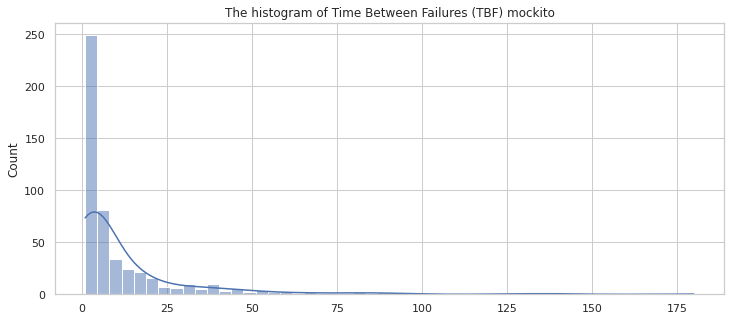

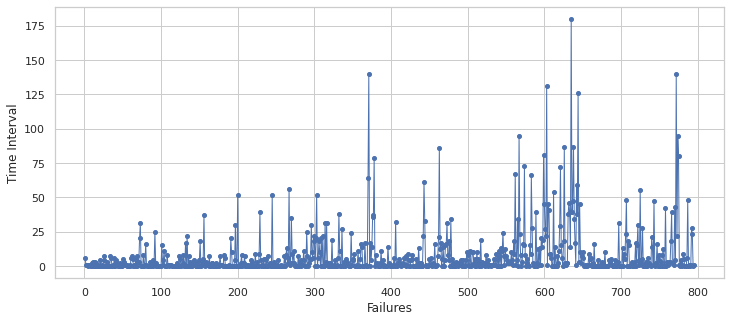

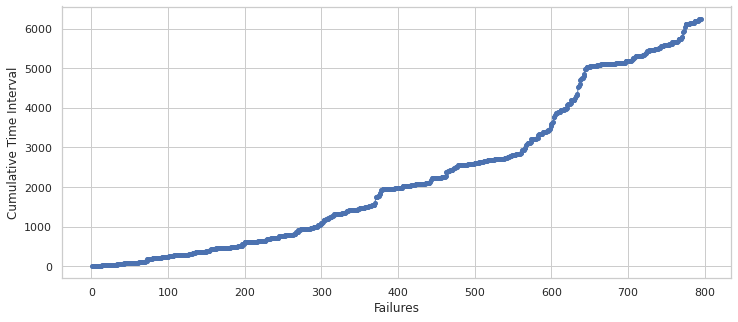

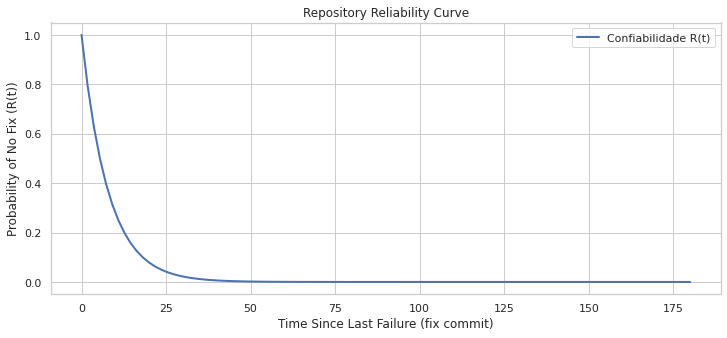

Confiabilidade R(1) = 0.8804
Confiabilidade R(5) = 0.5291
Confiabilidade R(10) = 0.2799
Confiabilidade R(50) = 0.0017
Confiabilidade R(100) = 0.0000
{'project': 'mockito', 'R1': '0.8804', 'R5': '0.5291', 'R10': '0.2799', 'R50': '0.0017', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/org/mockito/internal/RegisteredInvocations.java,4,0.333333,3.000000,0.049787
1,src/org/mockito/internal/verification/NoMoreInteractionsMode.java,4,0.666667,1.500000,0.223130
2,test/org/mockito/usage/verification/NiceMessagesWhenVerificationFailsTest.java,2,1.000000,1.000000,0.367879
3,test/org/mockito/usage/verification/NoMoreInteractionsVerificationTest.java,2,1.000000,1.000000,0.367879
4,test/org/mockito/junit/MockitoJUnitRuleTest.java,2,1.000000,1.000000,0.367879
...,...,...,...,...,...
680,src/main/java/org/mockito/internal/invocation/UnusedStubsFinder.java,2,1757.000000,0.000569,0.999431
681,src/main/java/org/mockito/internal/debugging/LoggingListener.java,2,1757.000000,0.000569,0.999431
682,src/main/java/org/mockito/internal/progress/ArgumentMatcherStorageImpl.java,2,1772.000000,0.000564,0.999436
683,src/main/java/org/mockito/internal/verification/AtMost.java,2,1912.000000,0.000523,0.999477


== freecol ==


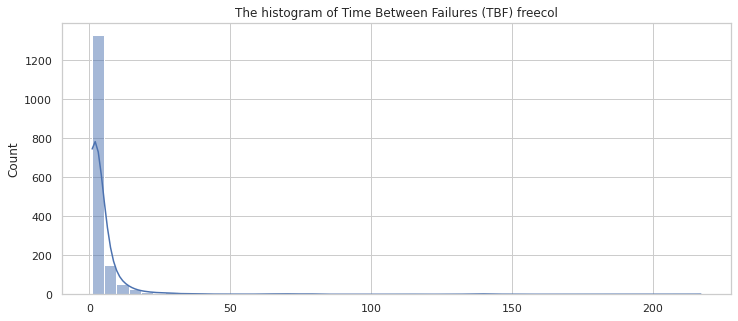

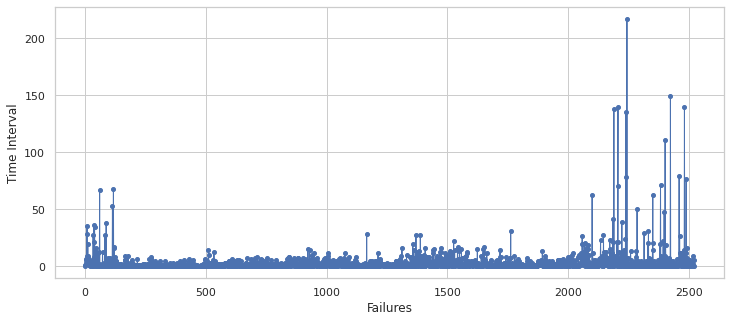

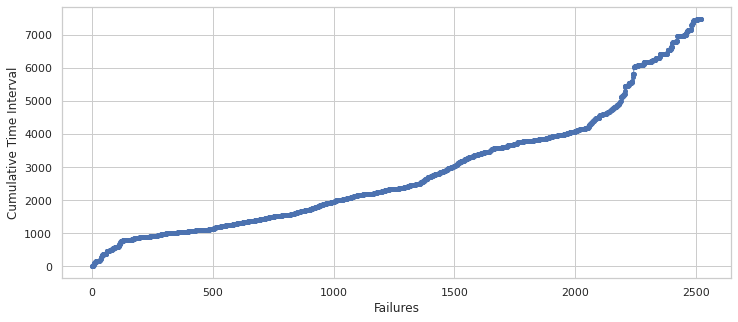

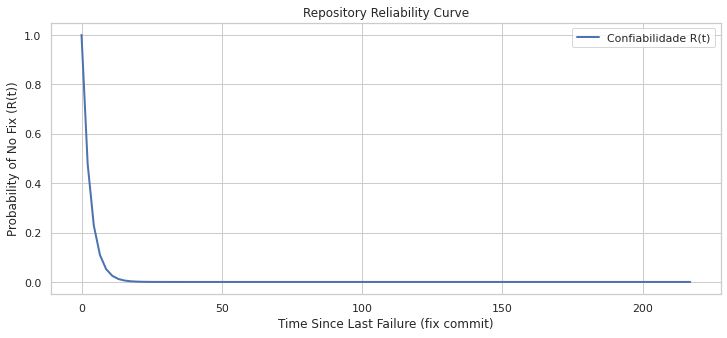

Confiabilidade R(1) = 0.7139
Confiabilidade R(5) = 0.1855
Confiabilidade R(10) = 0.0344
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'freecol', 'R1': '0.7139', 'R5': '0.1855', 'R10': '0.0344', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/net/sf/freecol/common/model/Limit.java,2,1.0,1.000000,0.367879
1,src/net/sf/freecol/server/ai/military/DefensiveMap.java,2,1.0,1.000000,0.367879
2,src/net/sf/freecol/common/model/Resource.java,5,1.0,1.000000,0.367879
3,src/net/sf/freecol/common/util/Xml.java,2,3.0,0.333333,0.716531
4,src/net/sf/freecol/client/gui/panel/ReportCompactColonyPanel.java,2,4.0,0.250000,0.778801
...,...,...,...,...,...
543,src/net/sf/freecol/common/model/NationType.java,2,4741.0,0.000211,0.999789
544,src/net/sf/freecol/common/resources/VideoResource.java,2,4917.0,0.000203,0.999797
545,src/net/sf/freecol/common/util/Introspector.java,2,4988.0,0.000200,0.999800
546,src/net/sf/freecol/common/io/FreeColModFile.java,2,5025.0,0.000199,0.999801


== jmeter ==


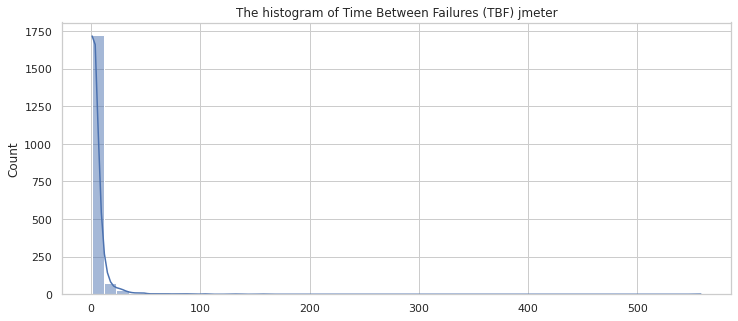

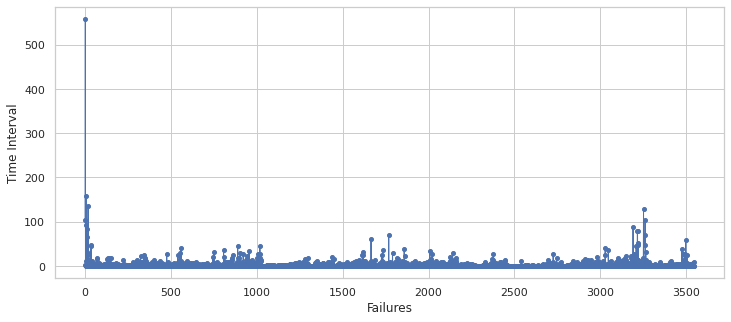

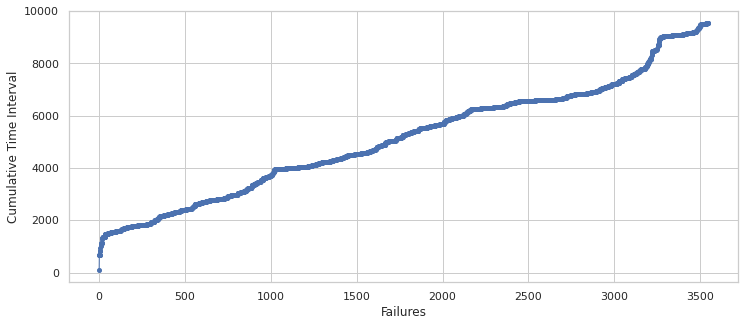

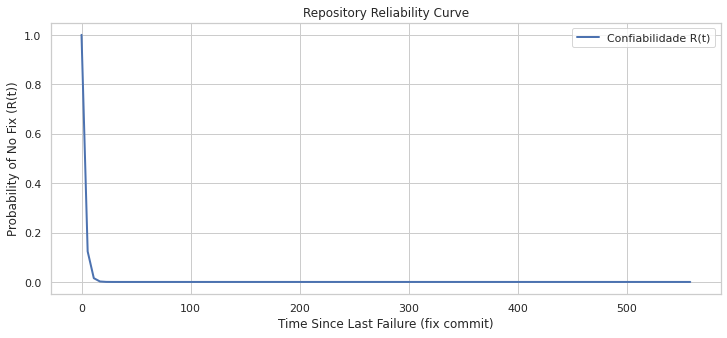

Confiabilidade R(1) = 0.6900
Confiabilidade R(5) = 0.1564
Confiabilidade R(10) = 0.0245
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'jmeter', 'R1': '0.6900', 'R5': '0.1564', 'R10': '0.0245', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/core/src/main/java/org/apache/jmeter/gui/util/VerticalPanel.java,3,0.5,2.000000,0.135335
1,src/protocol/jms/org/apache/jmeter/protocol/jms/sampler/TimeoutEnabledQueueRequestor.java,2,1.0,1.000000,0.367879
2,src/components/org/apache/jmeter/config/Argument.java,2,1.0,1.000000,0.367879
3,src/components/org/apache/jmeter/timers/ConstantThroughputTimerBeanInfo.java,2,1.0,1.000000,0.367879
4,src/components/org/apache/jmeter/assertions/CompareAssertion.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
766,src/core/org/apache/jmeter/util/ColorHelper.java,2,4968.0,0.000201,0.999799
767,src/protocol/java/org/apache/jmeter/protocol/java/config/JavaConfig.java,2,5022.0,0.000199,0.999801
768,src/core/org/apache/jmeter/timers/gui/AbstractTimerGui.java,2,5068.0,0.000197,0.999803
769,src/protocol/java/org/apache/jmeter/protocol/java/sampler/JavaSamplerClient.java,2,5070.0,0.000197,0.999803


== heritrix3 ==


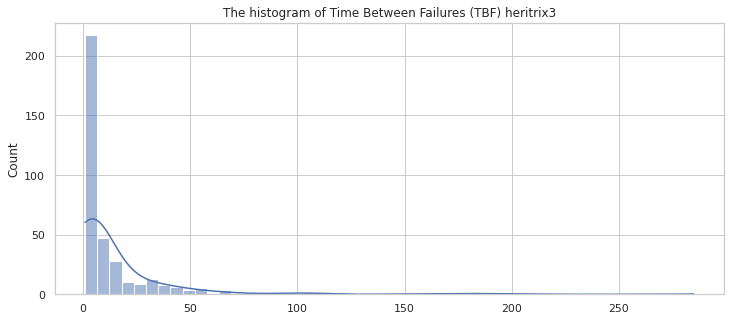

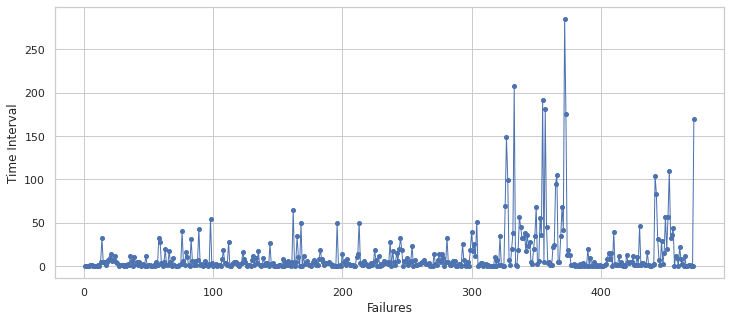

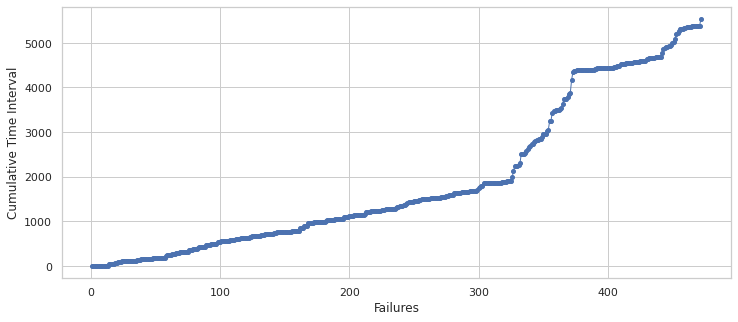

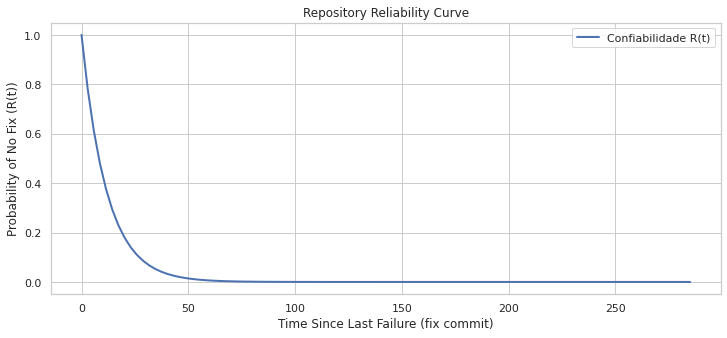

Confiabilidade R(1) = 0.9183
Confiabilidade R(5) = 0.6530
Confiabilidade R(10) = 0.4264
Confiabilidade R(50) = 0.0141
Confiabilidade R(100) = 0.0002
{'project': 'heritrix3', 'R1': '0.9183', 'R5': '0.6530', 'R10': '0.4264', 'R50': '0.0141', 'R100': '0.0002'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,modules/src/test/java/org/archive/modules/extractor/ExtractorMultipleRegexTest.java,3,0.5,2.000000,0.135335
1,contrib/src/main/java/org/archive/crawler/prefetch/HostQuotaEnforcer.java,3,0.5,2.000000,0.135335
2,engine/src/main/java/org/archive/crawler/postprocessor/LowDiskPauseProcessor.java,2,1.0,1.000000,0.367879
3,modules/src/main/java/org/archive/modules/fetcher/RecordingSessionInputBuffer.java,2,1.0,1.000000,0.367879
4,contrib/src/main/java/org/archive/modules/recrawl/hbase/SingleHBaseTable.java,2,2.0,0.500000,0.606531
...,...,...,...,...,...
161,modules/src/main/java/org/archive/modules/extractor/ExtractorMultipleRegex.java,2,2687.0,0.000372,0.999628
162,modules/src/test/java/org/archive/modules/extractor/ExtractorHTMLTest.java,2,3340.0,0.000299,0.999701
163,engine/src/main/java/org/archive/crawler/frontier/URIAuthorityBasedQueueAssignmentPolicy.java,2,3720.0,0.000269,0.999731
164,engine/src/main/java/org/archive/crawler/restlet/PagedRepresentation.java,2,3808.0,0.000263,0.999737


== javaparser ==


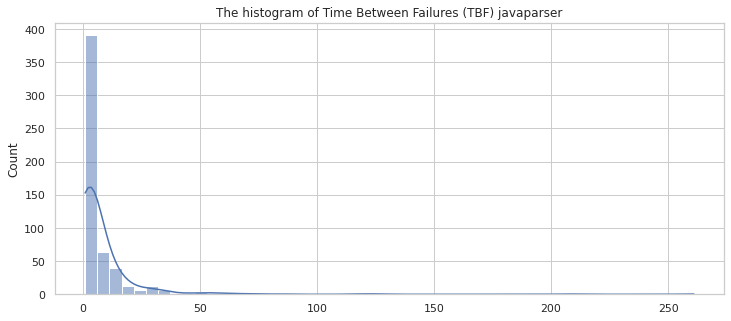

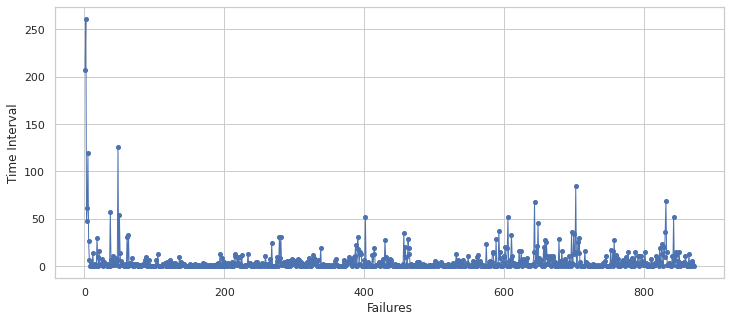

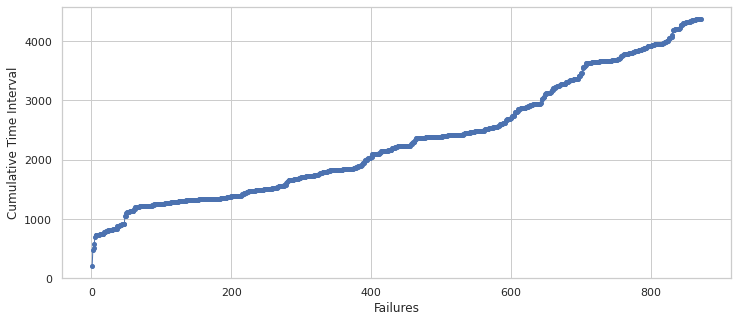

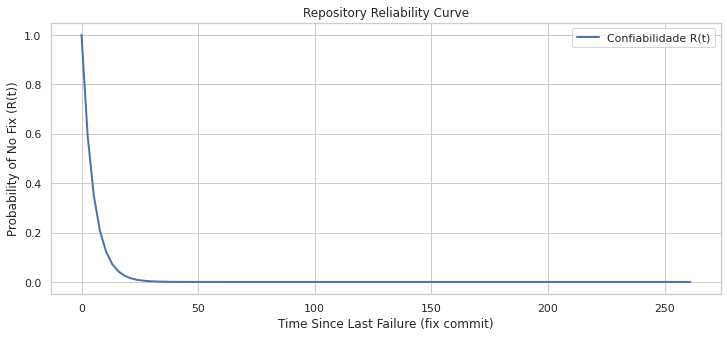

Confiabilidade R(1) = 0.8193
Confiabilidade R(5) = 0.3691
Confiabilidade R(10) = 0.1362
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'javaparser', 'R1': '0.8193', 'R5': '0.3691', 'R10': '0.1362', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,java-symbol-solver-core/src/main/java/me/tomassetti/symbolsolver/javaparsermodel/contexts/CompilationUnitContext.java,3,0.500000,2.000000,0.135335
1,javaparser-core/src/main/java/com/github/javaparser/utils/LineEnding.java,3,0.500000,2.000000,0.135335
2,javaparser-symbol-solver-core/src/main/java/com/github/javaparser/symbolsolver/javaparsermodel/declarations/JavaParserTypeVariableDeclaration.java,4,0.666667,1.500000,0.223130
3,javaparser-core-testing/src/test/java/com/github/javaparser/printer/YamlPrinterTest.java,4,0.666667,1.500000,0.223130
4,java-symbol-solver-core/src/main/java/me/tomassetti/symbolsolver/logic/GenericTypeInferenceLogic.java,2,1.000000,1.000000,0.367879
...,...,...,...,...,...
468,javaparser-core-generators/src/main/java/com/github/javaparser/generator/core/other/TokenKindGenerator.java,2,2085.000000,0.000480,0.999520
469,javaparser-core/src/main/java/com/github/javaparser/ast/stmt/SwitchEntry.java,2,2112.000000,0.000473,0.999527
470,javaparser-symbol-solver-core/src/main/java/com/github/javaparser/symbolsolver/javaparsermodel/contexts/SwitchEntryContext.java,2,2114.000000,0.000473,0.999527
471,javaparser-core-testing/src/test/java/com/github/javaparser/ast/stmt/SwitchStmtTest.java,2,2121.000000,0.000471,0.999529


== itextpdf ==


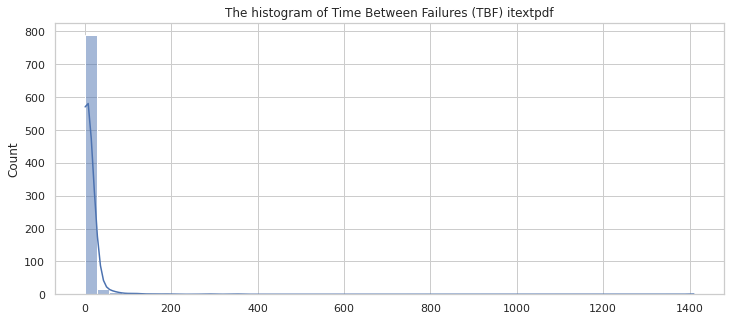

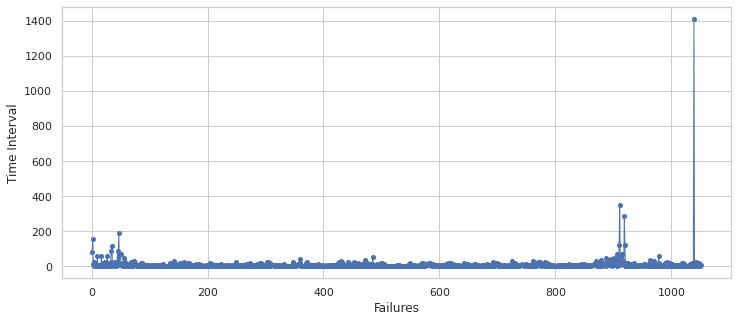

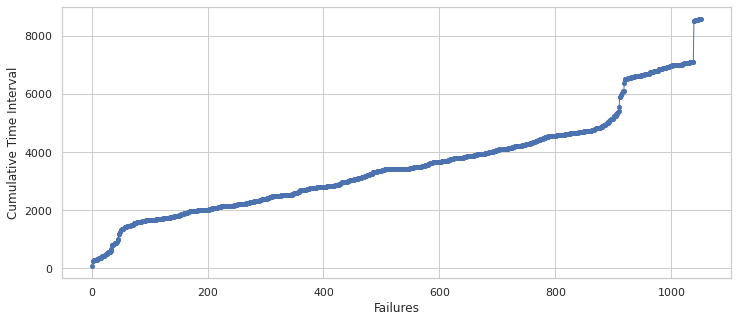

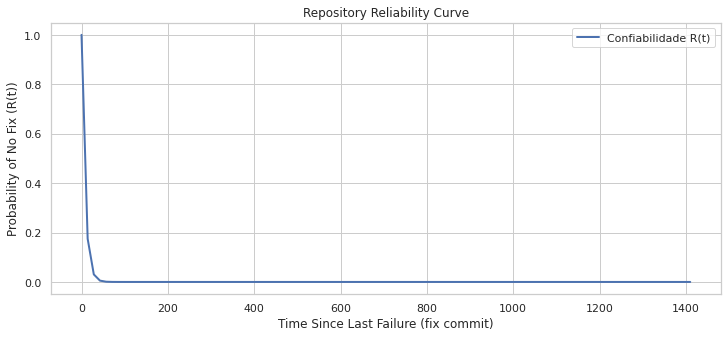

Confiabilidade R(1) = 0.8847
Confiabilidade R(5) = 0.5419
Confiabilidade R(10) = 0.2937
Confiabilidade R(50) = 0.0022
Confiabilidade R(100) = 0.0000
{'project': 'itextpdf', 'R1': '0.8847', 'R5': '0.5419', 'R10': '0.2937', 'R50': '0.0022', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,xtra/src/main/java/com/itextpdf/text/pdf/mc/MCFieldFlattener.java,3,0.5,2.000000,0.135335
1,xtra/src/main/java/com/itextpdf/text/pdf/mc/StructureItems.java,3,0.5,2.000000,0.135335
2,xtra/src/main/java/com/itextpdf/text/pdf/mc/MCParser.java,3,0.5,2.000000,0.135335
3,xmlworker/src/main/java/com/itextpdf/tool/xml/html/table/CellSpacingEvent.java,2,1.0,1.000000,0.367879
4,itext/src/main/java/com/itextpdf/text/pdf/security/LtvValidation.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
459,itext/src/com/lowagie/text/Element.java,2,1617.0,0.000618,0.999382
460,itext/src/com/lowagie/text/html/SAXmyHtmlHandler.java,2,1622.0,0.000617,0.999384
461,itext/src/main/java/com/itextpdf/text/pdf/CFFFontSubset.java,2,1684.0,0.000594,0.999406
462,itext/src/main/java/com/itextpdf/text/pdf/BarcodeDatamatrix.java,2,1751.0,0.000571,0.999429


== ant ==


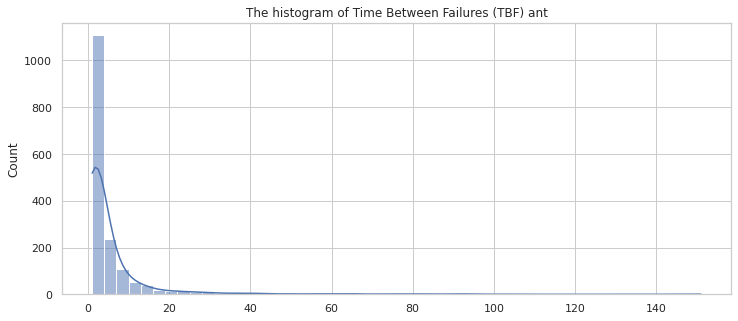

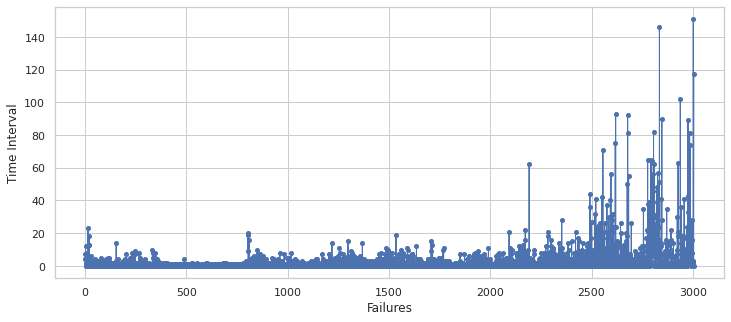

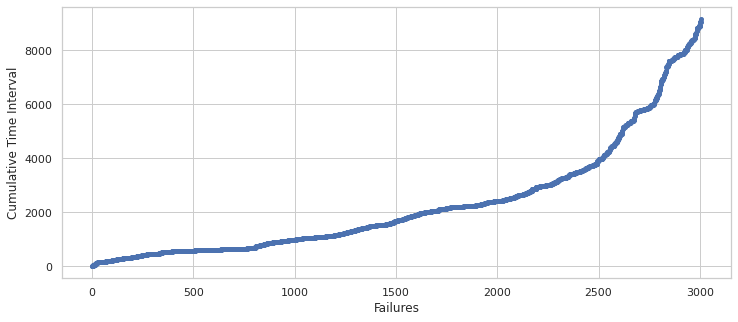

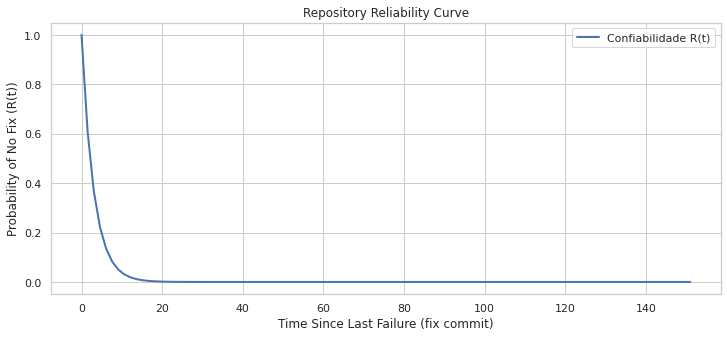

Confiabilidade R(1) = 0.7202
Confiabilidade R(5) = 0.1937
Confiabilidade R(10) = 0.0375
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'ant', 'R1': '0.7202', 'R5': '0.1937', 'R10': '0.0375', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,proposal/myrmidon/src/todo/org/apache/tools/ant/taskdefs/Get.java,4,0.333333,3.000000,0.049787
1,proposal/myrmidon/src/main/org/apache/tools/ant/UnknownElement.java,4,0.333333,3.000000,0.049787
2,proposal/myrmidon/src/main/org/apache/tools/ant/taskdefs/Get.java,4,0.333333,3.000000,0.049787
3,proposal/myrmidon/src/todo/org/apache/tools/ant/ProjectHelper.java,4,0.333333,3.000000,0.049787
4,proposal/myrmidon/src/todo/org/apache/tools/ant/UnknownElement.java,4,0.333333,3.000000,0.049787
...,...,...,...,...,...
1044,src/tests/junit/org/apache/tools/ant/taskdefs/JarTest.java,2,5868.000000,0.000170,0.999830
1045,src/main/org/apache/tools/ant/filters/BaseParamFilterReader.java,2,5870.000000,0.000170,0.999830
1046,src/main/org/apache/tools/ant/taskdefs/Deltree.java,2,6584.000000,0.000152,0.999848
1047,src/main/org/apache/tools/ant/types/Permissions.java,2,7289.000000,0.000137,0.999863


== druid ==


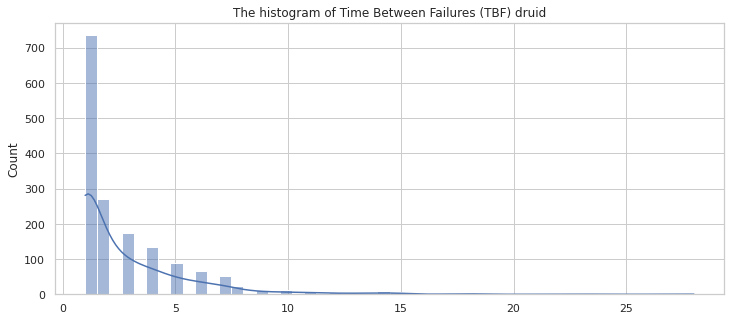

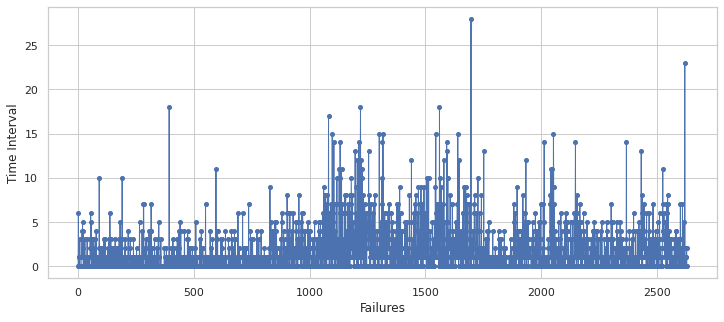

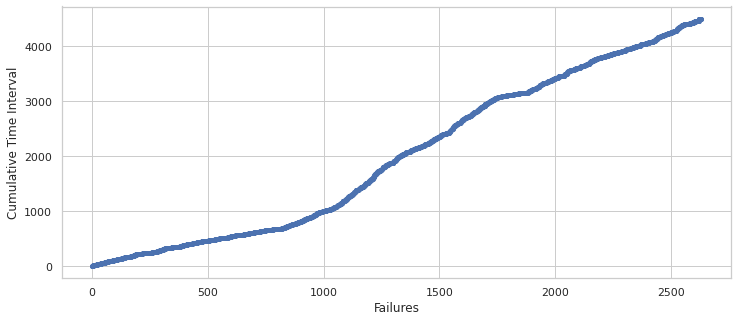

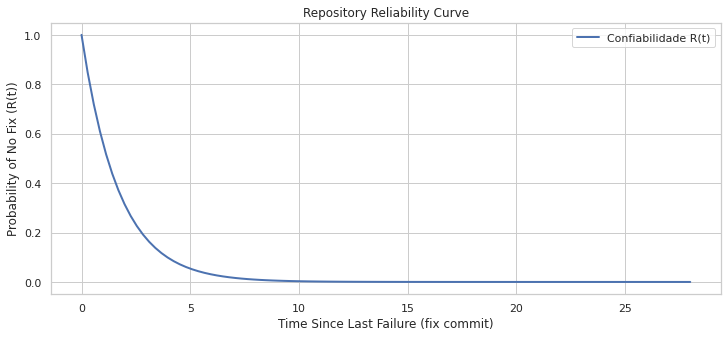

Confiabilidade R(1) = 0.5578
Confiabilidade R(5) = 0.0540
Confiabilidade R(10) = 0.0029
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'druid', 'R1': '0.5578', 'R5': '0.0540', 'R10': '0.0029', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,services/src/main/java/io/druid/cli/Initialization.java,3,0.5,2.000000,0.135335
1,examples/src/main/java/druid/examples/webStream/InputSupplierUpdateStream.java,3,0.5,2.000000,0.135335
2,processing/src/main/java/io/druid/query/aggregation/post/ConstantPostAggregator.java,5,0.5,2.000000,0.135335
3,indexing-common/src/main/java/com/metamx/druid/indexer/data/InputRowParser.java,2,1.0,1.000000,0.367879
4,extensions-core/lookups-cached-global/src/main/java/io/druid/server/lookup/namespace/URIExtractionNamespaceCacheFactory.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
2051,server/src/test/java/org/apache/druid/server/coordination/ZkCoordinatorTest.java,2,2114.0,0.000473,0.999527
2052,processing/src/main/java/org/apache/druid/query/topn/PooledTopNAlgorithm.java,2,2247.0,0.000445,0.999555
2053,processing/src/main/java/org/apache/druid/query/search/UseIndexesStrategy.java,2,2288.0,0.000437,0.999563
2054,processing/src/test/java/org/apache/druid/segment/serde/HyperUniquesSerdeForTest.java,2,2295.0,0.000436,0.999564


== spring-boot ==


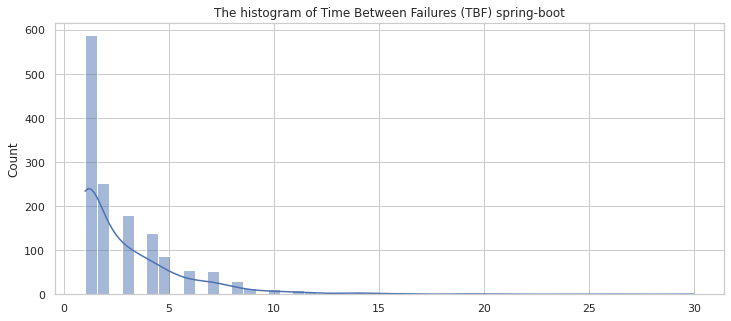

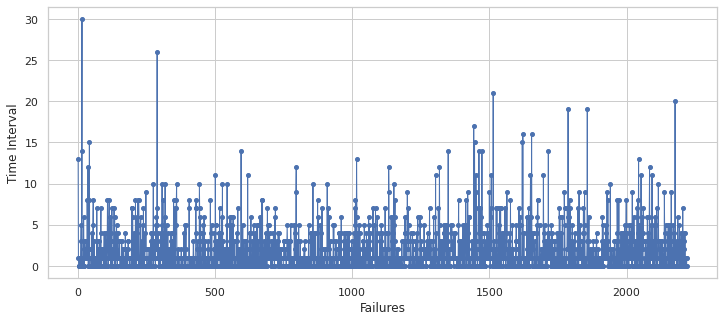

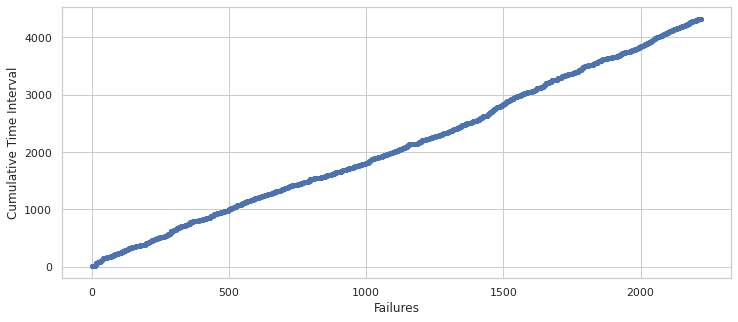

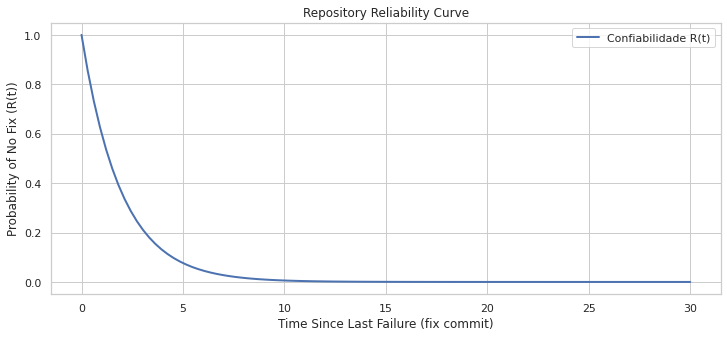

Confiabilidade R(1) = 0.5980
Confiabilidade R(5) = 0.0765
Confiabilidade R(10) = 0.0059
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'spring-boot', 'R1': '0.5980', 'R5': '0.0765', 'R10': '0.0059', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,spring-boot-project/spring-boot-tools/spring-boot-maven-plugin/src/intTest/projects/build-image-final-name/src/main/java/org/test/SampleApplication.java,3,0.5,2.000000,0.135335
1,spring-boot-project/spring-boot-tools/spring-boot-loader-tools/src/main/java/org/springframework/boot/loader/tools/ImagePackager.java,3,0.5,2.000000,0.135335
2,spring-boot-project/spring-boot/src/test/java/org/springframework/boot/diagnostics/analyzer/InvalidConfigurationPropertiesFailureAnalyzerTests.java,2,1.0,1.000000,0.367879
3,spring-boot-actuator/src/test/java/org/springframework/boot/actuate/web/BasicErrorControllerSpecialIntegrationTests.java,2,1.0,1.000000,0.367879
4,spring-boot-project/spring-boot/src/main/java/org/springframework/boot/diagnostics/analyzer/InvalidConfigurationPropertiesFailureAnalyzer.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
1037,spring-boot-project/spring-boot-actuator/src/main/java/org/springframework/boot/actuate/audit/AuditEventsEndpoint.java,2,2548.0,0.000392,0.999608
1038,spring-boot-project/spring-boot-test/src/test/java/org/springframework/boot/test/context/assertj/ApplicationContextAssertProviderTests.java,2,2591.0,0.000386,0.999614
1039,spring-boot-project/spring-boot/src/test/java/org/springframework/boot/context/properties/source/SpringConfigurationPropertySourcesTests.java,2,2621.0,0.000382,0.999619
1040,spring-boot-project/spring-boot-test/src/main/java/org/springframework/boot/test/util/TestPropertyValues.java,2,2621.0,0.000382,0.999619


== jfreechart ==


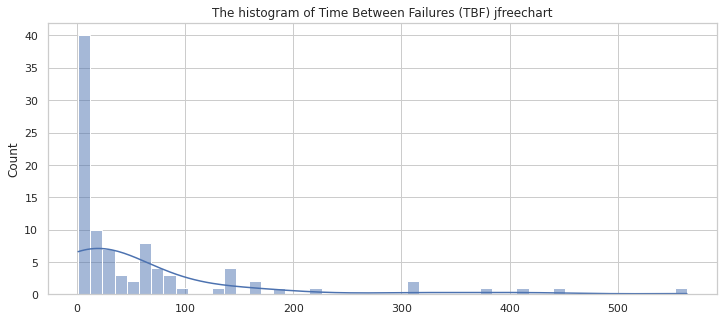

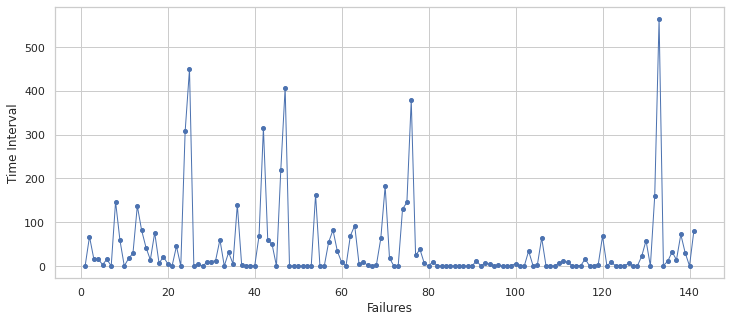

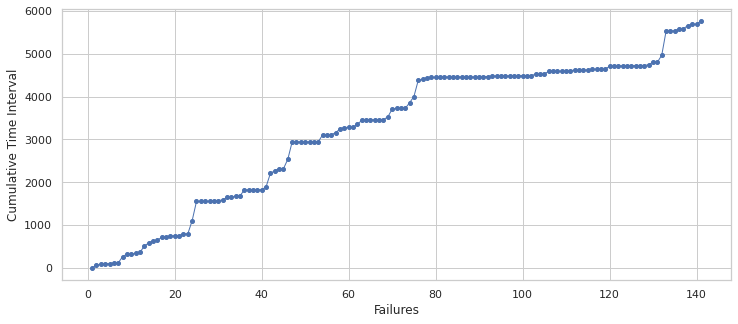

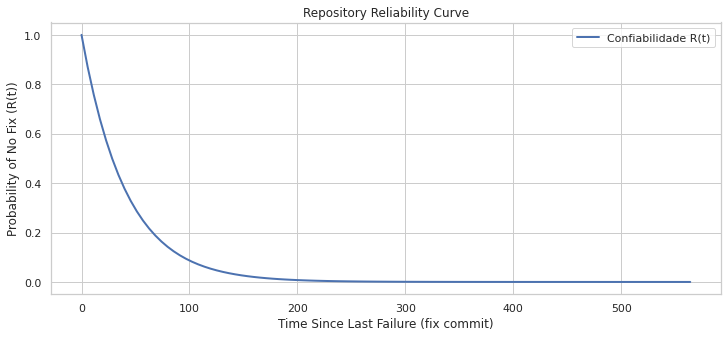

Confiabilidade R(1) = 0.9759
Confiabilidade R(5) = 0.8849
Confiabilidade R(10) = 0.7831
Confiabilidade R(50) = 0.2946
Confiabilidade R(100) = 0.0868
{'project': 'jfreechart', 'R1': '0.9759', 'R5': '0.8849', 'R10': '0.7831', 'R50': '0.2946', 'R100': '0.0868'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,src/test/java/org/jfree/data/xy/XYSeriesTest.java,2,1.0,1.000000,0.367879
1,src/test/java/org/jfree/data/statistics/RegressionTest.java,2,1.0,1.000000,0.367879
2,src/test/java/org/jfree/chart/plot/PolarPlotTest.java,2,2.0,0.500000,0.606531
3,src/test/java/org/jfree/data/gantt/TaskSeriesCollectionTest.java,2,2.0,0.500000,0.606531
4,src/main/java/org/jfree/data/xy/XYSeriesCollection.java,2,2.0,0.500000,0.606531
...,...,...,...,...,...
54,src/main/java/org/jfree/chart/text/TextBlock.java,2,1257.0,0.000796,0.999205
55,src/test/java/org/jfree/chart/axis/DateAxisTest.java,2,1298.0,0.000770,0.999230
56,src/main/java/org/jfree/chart/axis/ValueAxis.java,2,1685.0,0.000593,0.999407
57,src/main/java/org/jfree/chart/renderer/xy/XYLineAndShapeRenderer.java,2,1689.0,0.000592,0.999408


== groovy ==


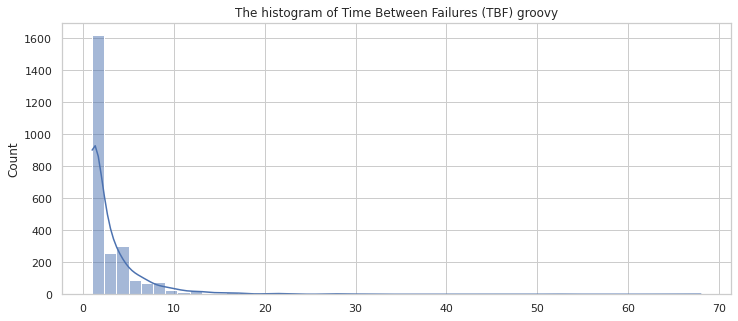

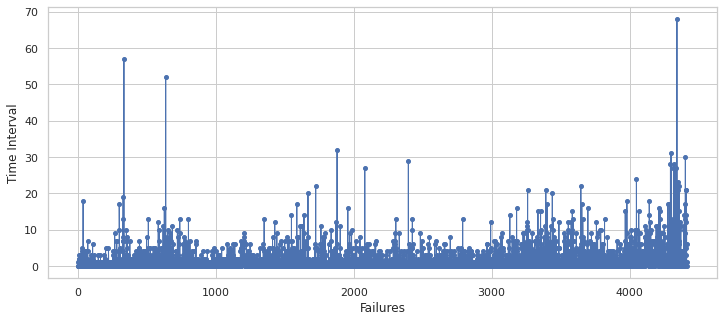

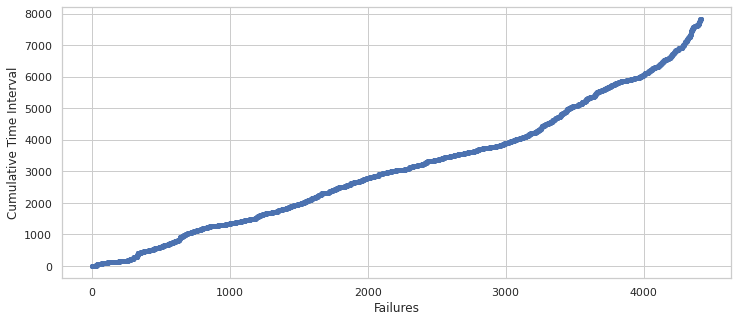

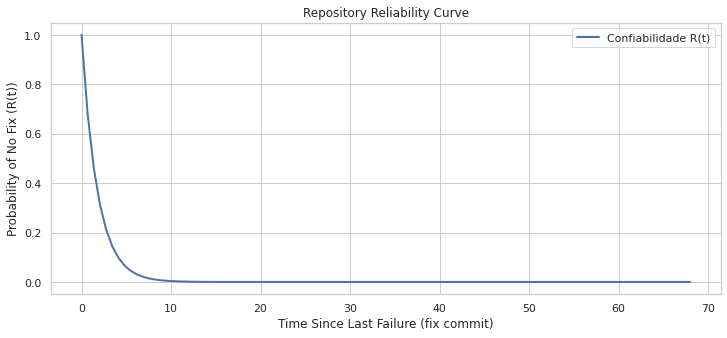

Confiabilidade R(1) = 0.5691
Confiabilidade R(5) = 0.0597
Confiabilidade R(10) = 0.0036
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'groovy', 'R1': '0.5691', 'R5': '0.0597', 'R10': '0.0036', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,subprojects/groovy-ant/src/main/java/groovy/util/AntBuilder.java,2,1.0,1.000000,0.367879
1,src/main/org/codehaus/groovy/sandbox/util/slurpersupport/NodeChildren.java,2,1.0,1.000000,0.367879
2,src/main/org/codehaus/groovy/transform/sc/transformers/ClosureExpressionTransformer.java,2,1.0,1.000000,0.367879
3,src/test/groovy/SomeClass.java,2,1.0,1.000000,0.367879
4,subprojects/groovy-templates/src/main/groovy/groovy/text/GStringTemplateEngine.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
742,subprojects/groovy-xml/src/main/java/groovy/xml/XmlUtil.java,2,3941.0,0.000254,0.999746
743,src/test/groovy/lang/TupleTest.java,2,4101.0,0.000244,0.999756
744,src/main/groovy/lang/Tuple.java,2,4101.0,0.000244,0.999756
745,src/main/org/codehaus/groovy/antlr/LexerFrame.java,2,4168.0,0.000240,0.999760


== Firestorm ==


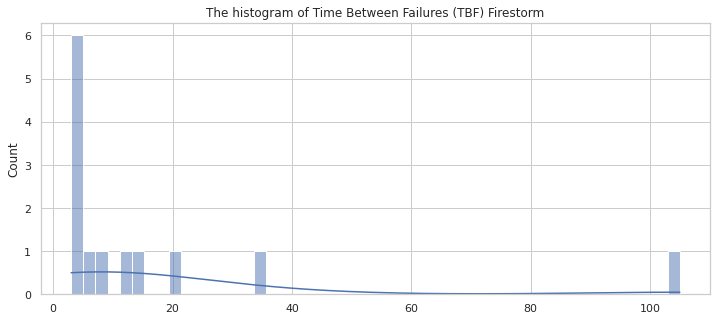

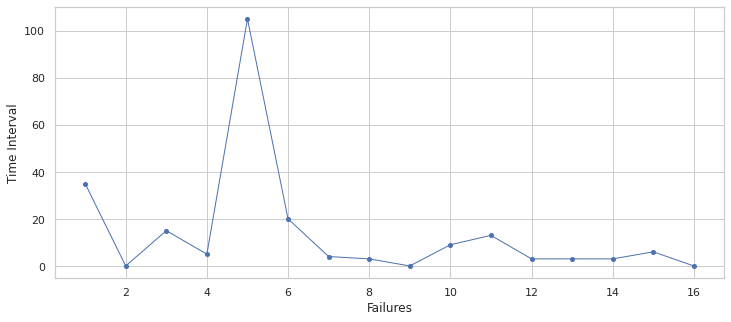

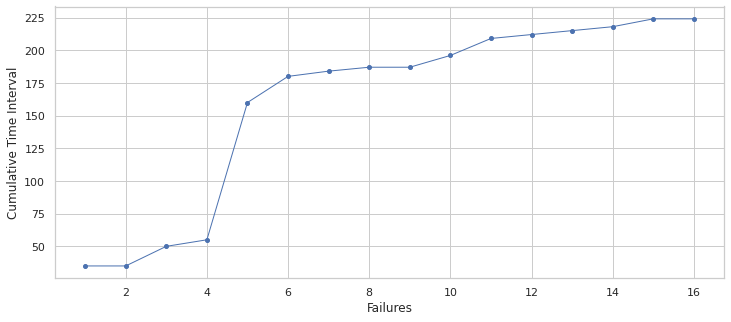

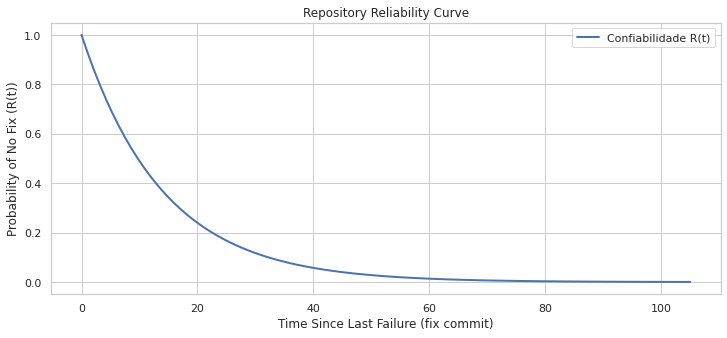

Confiabilidade R(1) = 0.9311
Confiabilidade R(5) = 0.6997
Confiabilidade R(10) = 0.4895
Confiabilidade R(50) = 0.0281
Confiabilidade R(100) = 0.0008
{'project': 'Firestorm', 'R1': '0.9311', 'R5': '0.6997', 'R10': '0.4895', 'R50': '0.0281', 'R100': '0.0008'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,client-mr/src/main/java/org/apache/hadoop/mapred/SortWriteBufferManager.java,2,3.0,0.333333,0.716531
1,client-mr/src/main/java/org/apache/hadoop/mapred/RssMapOutputCollector.java,2,3.0,0.333333,0.716531
2,client-mr/src/main/java/org/apache/hadoop/mapreduce/RssMRUtils.java,2,13.0,0.076923,0.925961
3,client-spark/spark2/src/main/java/org/apache/spark/shuffle/RssShuffleManager.java,3,22.0,0.045455,0.955563
4,client-spark/spark3/src/main/java/org/apache/spark/shuffle/RssShuffleManager.java,2,38.0,0.026316,0.974027
5,client-spark/spark3/src/main/java/org/apache/spark/shuffle/writer/RssShuffleWriter.java,2,55.0,0.018182,0.981982
6,client-spark/common/src/main/java/org/apache/spark/shuffle/writer/WriteBufferManager.java,2,55.0,0.018182,0.981982
7,client-spark/spark2/src/main/java/org/apache/spark/shuffle/writer/RssShuffleWriter.java,2,55.0,0.018182,0.981982
8,client/src/main/java/com/tencent/rss/client/impl/ShuffleWriteClientImpl.java,2,160.0,0.006250,0.993769


== cobertura ==


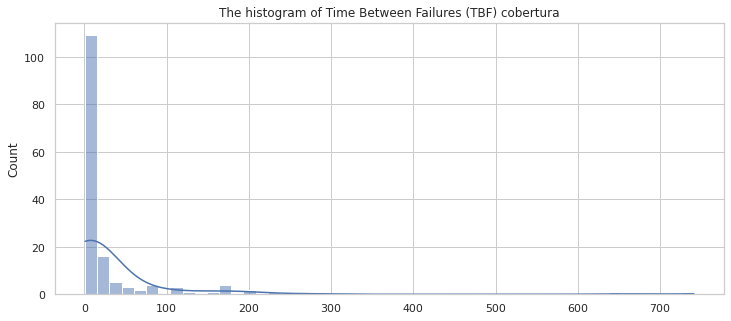

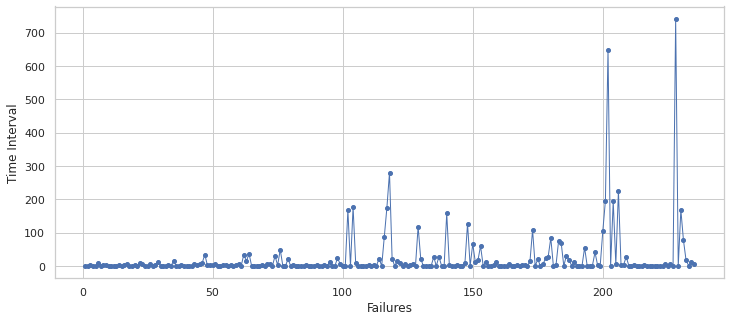

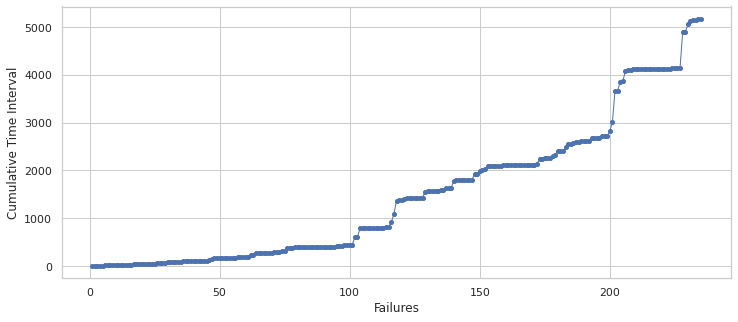

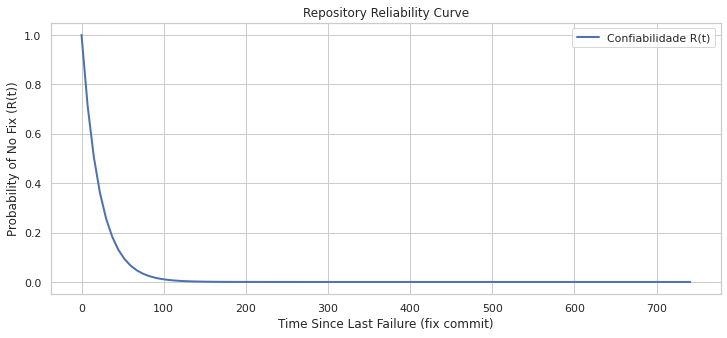

Confiabilidade R(1) = 0.9556
Confiabilidade R(5) = 0.7967
Confiabilidade R(10) = 0.6347
Confiabilidade R(50) = 0.1030
Confiabilidade R(100) = 0.0106
{'project': 'cobertura', 'R1': '0.9556', 'R5': '0.7967', 'R10': '0.6347', 'R50': '0.1030', 'R100': '0.0106'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,cobertura/javancss/src/main/java/javancss/PackageMetric.java,2,1.0,1.000000,0.367879
1,cobertura/javancss/test/Test116.java,2,1.0,1.000000,0.367879
2,cobertura/javancss/test/Test128.java,2,1.0,1.000000,0.367879
3,cobertura/javancss/test/Test2.java,2,1.0,1.000000,0.367879
4,cobertura/javancss/test/Test24.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
204,cobertura/src/net/sourceforge/cobertura/util/FileFinder.java,2,1254.0,0.000797,0.999203
205,cobertura/src/test/java/net/sourceforge/cobertura/jdk/JDK7Test.java,2,1351.0,0.000740,0.999260
206,cobertura/src/net/sourceforge/cobertura/check/Main.java,2,1374.0,0.000728,0.999272
207,cobertura/src/main/java/net/sourceforge/cobertura/javancss/Javancss.java,2,1445.0,0.000692,0.999308


== xmlgraphics-batik ==


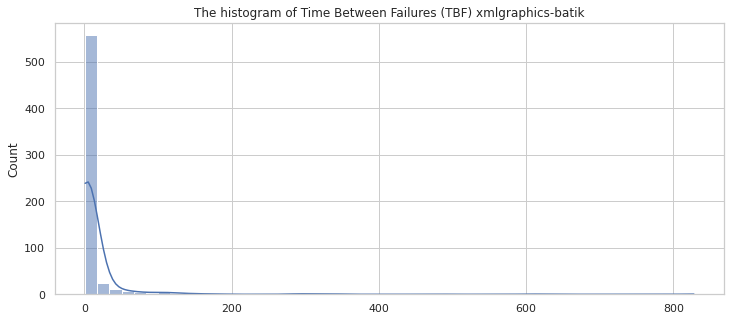

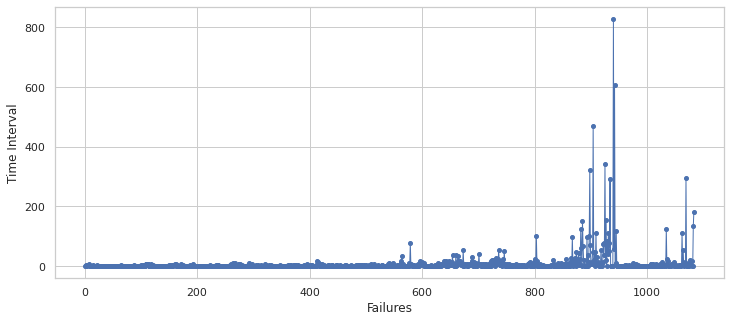

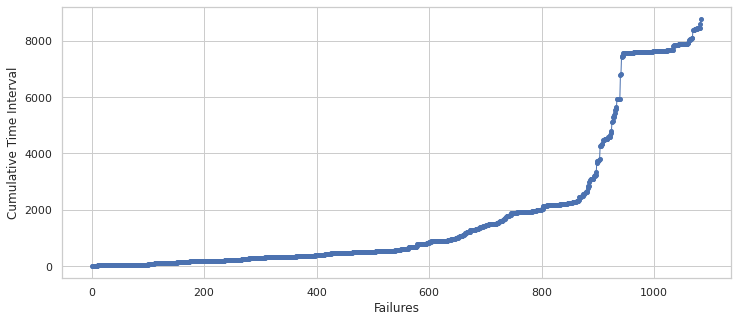

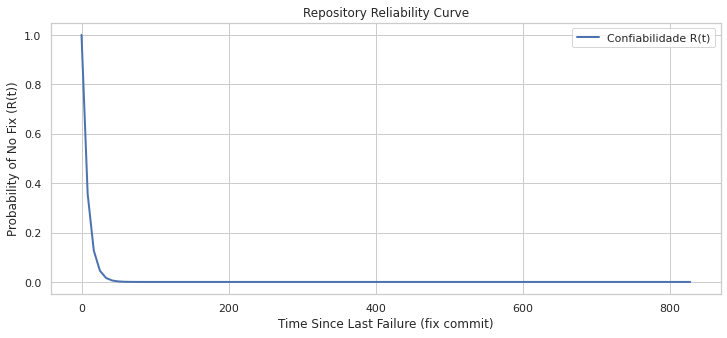

Confiabilidade R(1) = 0.8838
Confiabilidade R(5) = 0.5393
Confiabilidade R(10) = 0.2908
Confiabilidade R(50) = 0.0021
Confiabilidade R(100) = 0.0000
{'project': 'xmlgraphics-batik', 'R1': '0.8838', 'R5': '0.5393', 'R10': '0.2908', 'R50': '0.0021', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,sources/org/apache/batik/refimpl/bridge/DefaultBridgeContext.java,2,1.00,1.000000,0.367879
1,sources/org/apache/batik/parser/LengthParser.java,2,1.00,1.000000,0.367879
2,sources/org/apache/batik/refimpl/bridge/SVGFeColorMatrixElementBridge.java,4,1.00,1.000000,0.367879
3,sources/org/apache/batik/refimpl/bridge/SVGUtilities.java,6,1.00,1.000000,0.367879
4,sources/org/apache/batik/gvt/DecoratedShapeNode.java,5,1.25,0.800000,0.449329
...,...,...,...,...,...
862,sources/org/apache/batik/bridge/SVGFeFloodElementBridge.java,2,4205.00,0.000238,0.999762
863,sources/org/apache/batik/bridge/SVGFeTurbulenceElementBridge.java,2,4205.00,0.000238,0.999762
864,sources/org/apache/batik/bridge/MarkerBridge.java,2,4210.00,0.000238,0.999762
865,sources/org/apache/batik/bridge/ClipBridge.java,2,4307.00,0.000232,0.999768


== drjava ==


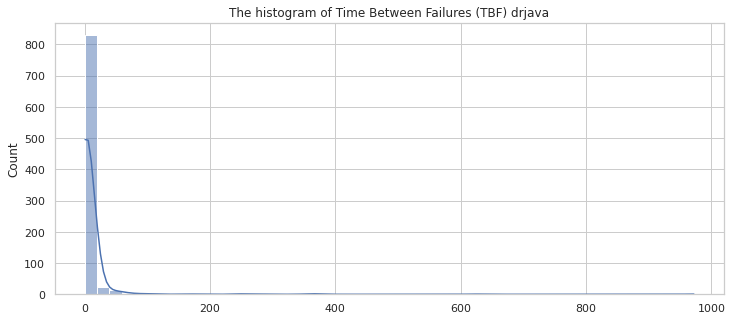

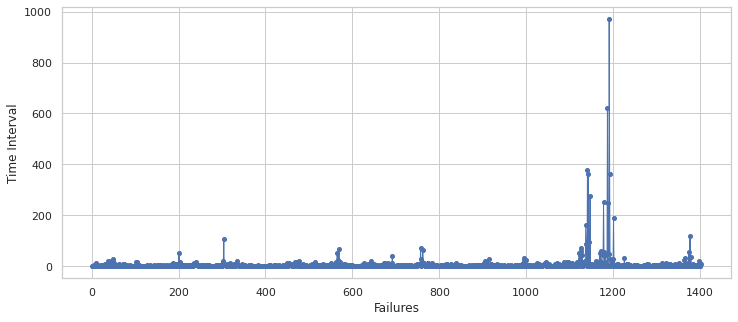

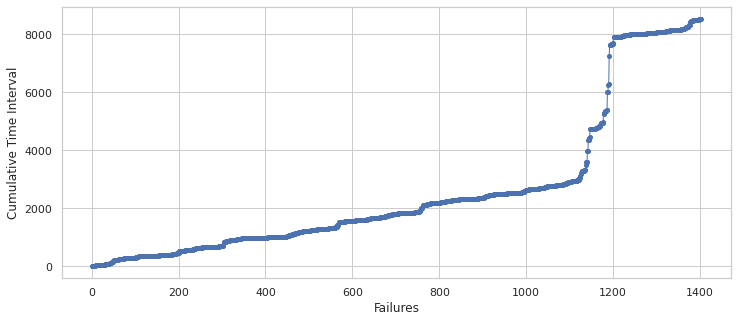

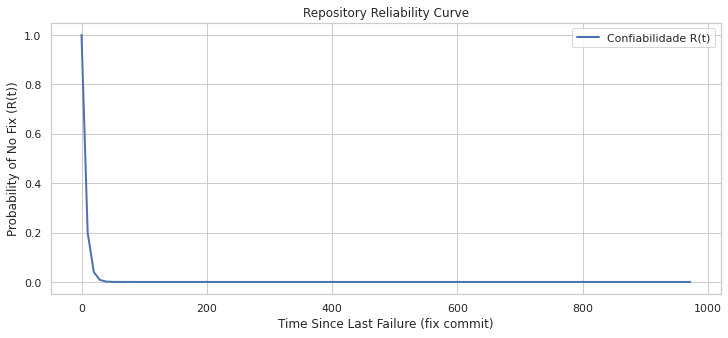

Confiabilidade R(1) = 0.8485
Confiabilidade R(5) = 0.4399
Confiabilidade R(10) = 0.1935
Confiabilidade R(50) = 0.0003
Confiabilidade R(100) = 0.0000
{'project': 'drjava', 'R1': '0.8485', 'R5': '0.4399', 'R10': '0.1935', 'R50': '0.0003', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,drjava/src/edu/rice/cs/drjava/Brace.java,2,1.0,1.000000,0.367879
1,dynamicjava/src/koala/dynamicjava/interpreter/Distinction1415Test.java,2,1.0,1.000000,0.367879
2,drjava/src/edu/rice/cs/drjava/ModelList.java,2,1.0,1.000000,0.367879
3,dynamicjava/src/koala/dynamicjava/interpreter/TypeChecker.java,2,1.0,1.000000,0.367879
4,drjava/src/edu/rice/cs/drjava/Gap.java,2,1.0,1.000000,0.367879
...,...,...,...,...,...
982,drjava/src/edu/rice/cs/util/swing/CheckBoxJList.java,2,2694.0,0.000371,0.999629
983,plt/src/edu/rice/cs/plt/debug/VoidLog.java,2,3073.0,0.000325,0.999675
984,plt/src/edu/rice/cs/plt/reflect/AbstractClassLoader.java,2,3427.0,0.000292,0.999708
985,platform/src-windows/edu/rice/cs/drjava/platform/WindowsPlatform.java,2,3663.0,0.000273,0.999727


== auto ==


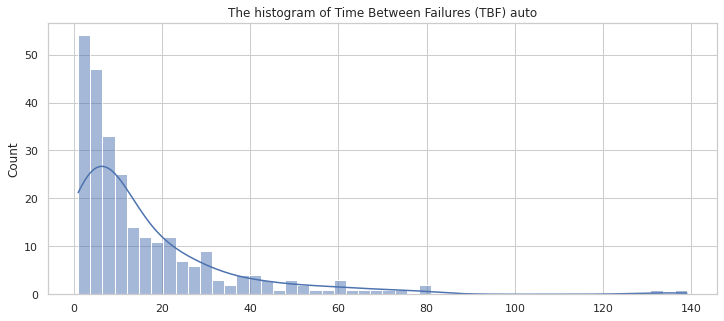

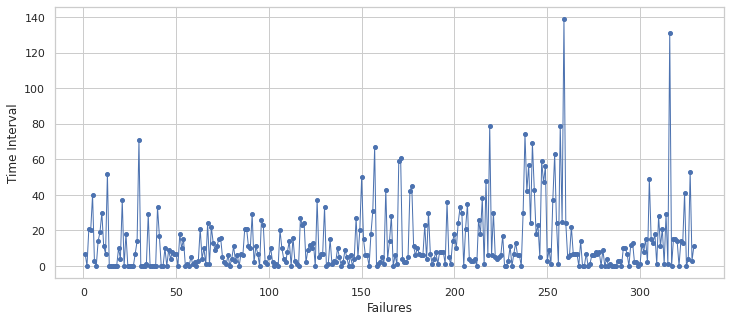

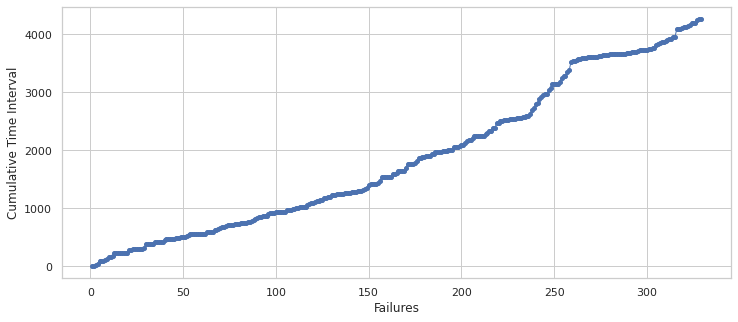

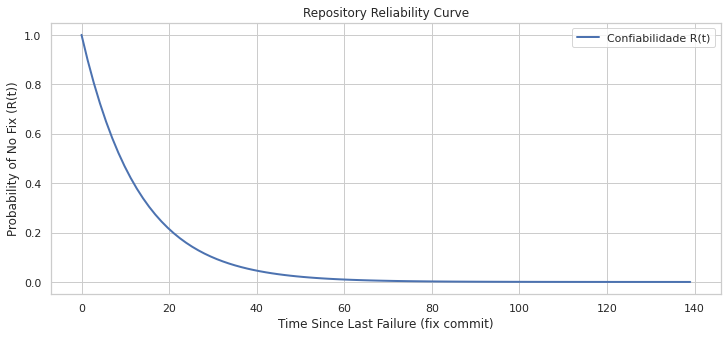

Confiabilidade R(1) = 0.9258
Confiabilidade R(5) = 0.6802
Confiabilidade R(10) = 0.4626
Confiabilidade R(50) = 0.0212
Confiabilidade R(100) = 0.0004
{'project': 'auto', 'R1': '0.9258', 'R5': '0.6802', 'R10': '0.4626', 'R50': '0.0212', 'R100': '0.0004'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,compile-testing/src/main/java/com/google/testing/compile/JavaSourcesSubject.java,2,3.0,0.333333,0.716531
1,factory/src/test/resources/expected/FactoryImplementingGenericInterfaceExtensionFactory.java,2,3.0,0.333333,0.716531
2,factory/src/test/resources/expected/ClassUsingQualifierWithArgsFactory.java,2,3.0,0.333333,0.716531
3,factory/src/test/resources/expected/SimpleClassPassedDepsFactory.java,2,3.0,0.333333,0.716531
4,factory/src/test/resources/expected/SimpleClassNullableParametersFactory.java,2,3.0,0.333333,0.716531
...,...,...,...,...,...
107,value/src/main/java/com/google/auto/value/processor/ErrorReporter.java,2,1519.0,0.000658,0.999342
108,value/src/main/java/com/google/auto/value/processor/AnnotationOutput.java,2,1626.0,0.000615,0.999385
109,common/src/main/java/com/google/auto/common/Overrides.java,2,1696.0,0.000590,0.999411
110,value/src/it/functional/src/main/java/PackagelessValueType.java,2,3304.0,0.000303,0.999697


== visualvm ==


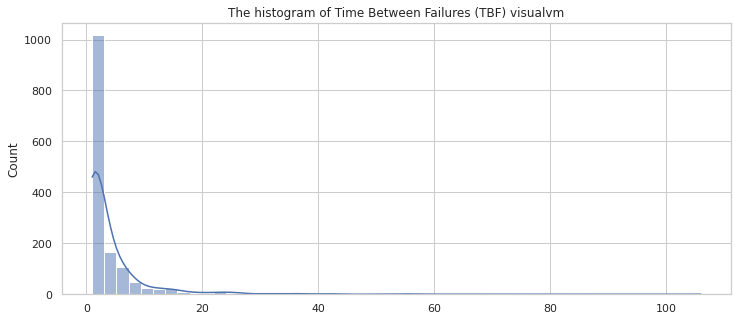

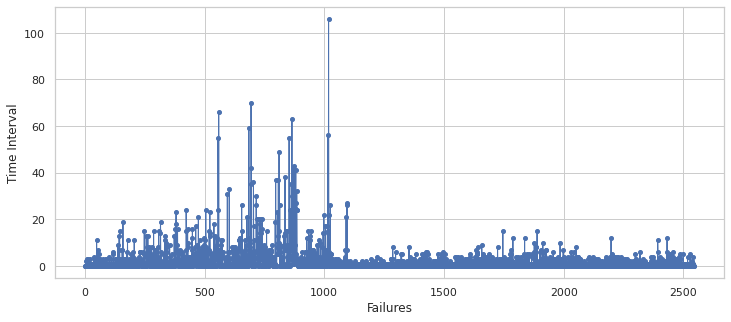

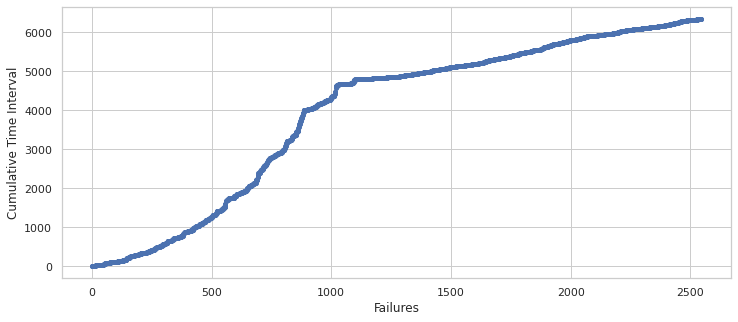

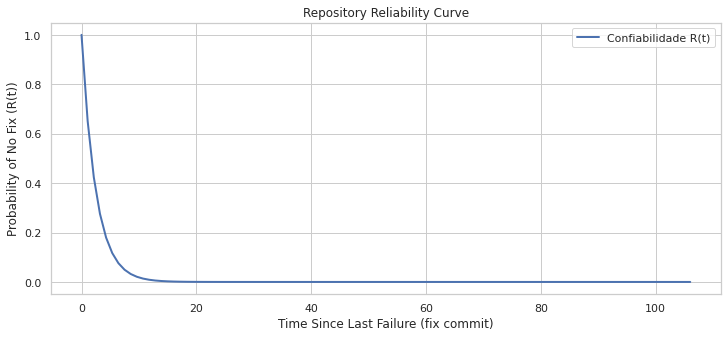

Confiabilidade R(1) = 0.6696
Confiabilidade R(5) = 0.1346
Confiabilidade R(10) = 0.0181
Confiabilidade R(50) = 0.0000
Confiabilidade R(100) = 0.0000
{'project': 'visualvm', 'R1': '0.6696', 'R5': '0.1346', 'R10': '0.0181', 'R50': '0.0000', 'R100': '0.0000'}


,filepath,n_commits,MTBF,lambda_failure,R_t
0,lib.profiler/src/org/netbeans/lib/profiler/results/locks/LockCCTNode.java,2,1.0,1.00000,0.367879
1,plugins/tracer/src/com/sun/tools/visualvm/modules/tracer/impl/PackagesView.java,2,1.0,1.00000,0.367879
2,visualvm/heapviewer.truffle/src/com/sun/tools/visualvm/heapviewer/truffle/TruffleSummaryView.java,2,1.0,1.00000,0.367879
3,visualvm/core/src/com/sun/tools/visualvm/core/host/HostsSupport.java,2,1.0,1.00000,0.367879
4,lib.profiler.ui/src/org/netbeans/lib/profiler/ui/memory/AllocTableView.java,2,1.0,1.00000,0.367879
...,...,...,...,...,...
668,samples/sampleBundle/src/org/nb/samplebundle/pluggableViewDemoSuite/pluggableViewDemoSuiteWizardPanel.java,2,4766.0,0.00021,0.999790
669,samples/sampleBundle/src/org/nb/samplebundle/datasource/datasourceWizardIterator.java,2,4766.0,0.00021,0.999790
670,samples/sampleBundle/src/org/nb/samplebundle/hostview/hostviewPanelVisual.java,2,4766.0,0.00021,0.999790
671,samples/pluggableViewDemoSuite/helloWorldViewPlugin/src/org/netbeans/helloworldplugin/HelloWorldViewPlugin.java,2,4767.0,0.00021,0.999790


In [13]:
import os
log_dir = "logs/"
for filename in os.listdir(log_dir):
    if filename.endswith("_all_files.csv"):
        task_id = filename.replace("_all_files.csv", "")
        process(task_id)

df_projects.to_csv(f"reliability_projects.csv")